In [1]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from keras.models import Sequential
from keras.layers.core import Dense, Activation
from keras.layers import Dropout
from keras.regularizers import l1, l2
from keras.optimizers import SGD, Adam, RMSprop, Adagrad, Adadelta
import matplotlib.pyplot as plt
import numpy as np
import pickle

Using TensorFlow backend.


a) Construya un dataframe con los datos a analizar y descríbalo brevemete. Además, realice la división de éste en los conjuntos de entrenamiento, validación y testeo correspondientes. Comente por qué se deben eliminar ciertas columnas.

In [2]:
datos = pd.read_csv("EnergyMolecule/roboBohr.csv")
datos.shape
datos.info()
datos.describe()

datos.drop(columns=['Unnamed: 0','pubchem_id'],axis=1,inplace=True)
total=len(datos)
df_train=datos[:int(0.6*total)]                       #60% de los datos
df_val=datos[int(0.6*total):int(0.85*total)]          #25% de los datos
df_test=datos[int(0.85*total)::]                      #15% restante

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16242 entries, 0 to 16241
Columns: 1278 entries, Unnamed: 0 to Eat
dtypes: float64(1276), int64(2)
memory usage: 158.4 MB


Los datos corresponden a simulaciones que permiten deducir la variación de entalpía en moléculas.

Las columnas Unnamed y pubchem_id se eliminan porque representan un identificador de cada muestra, por lo tanto, no son valores originales de los datos y no tienen relación explícita con ellos.

a.1) Una buena práctica es la de normalizar los datos antes de trabajar con el modelo. Explique por qué se aconseja dicho preprocesamiento

In [3]:
scaler = StandardScaler().fit(df_train)
X_train_scaled = pd.DataFrame(scaler.transform(df_train),columns=df_train.columns)
X_val_scaled =  pd.DataFrame(scaler.transform(df_val),columns=df_val.columns)
X_test_scaled =  pd.DataFrame(scaler.transform(df_test),columns=df_test.columns)

y_train = df_train.pop('Eat').values.reshape(-1,1)
y_val   = df_val.pop('Eat').values.reshape(-1,1)
y_test  = df_test.pop('Eat').values.reshape(-1,1)

X_train_scaled.drop(columns=['Eat'],axis=1,inplace=True)
X_val_scaled.drop(columns=['Eat'],axis=1,inplace=True)
X_test_scaled.drop(columns=['Eat'],axis=1,inplace=True)

Es aconsejable normalizar los datos debido a la diferencia de escala entre los atributos de una misma muestra, ya que el error generado por atributos con alta dimensionalidad opaca aquellos de menor escala.

b) Muestre en un gráfico el error cuadrático (MSE) para el conjunto de entrenamiento y de pruebas vs número de epochs de entrenamiento, para una red feedforward de 3 capas, con 256 unidades ocultas y función de activación sigmoidal. Entrene la red usando gradiente descendente estocástico con tasa de aprendizaje (learning rate) 0.01 y 250 epochs de entrenamiento, en el conjunto de entrenamiento y de validación. Comente. Si observara divergencia durante el entrenamiento, determine si esto ocurre para cada repetición del experimento.

In [4]:
modelB = Sequential()
modelB.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation="sigmoid"))
modelB.add(Dense(1, kernel_initializer='uniform',activation="linear")) 
modelB.compile(optimizer=SGD(lr=0.01),loss='mean_squared_error')
history = modelB.fit(X_train_scaled, y_train, epochs=250, verbose=0, validation_data=(X_val_scaled, y_val))

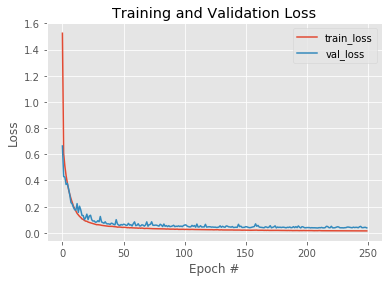

In [6]:
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, 250), history.history["loss"], label="train_loss")
plt.plot(np.arange(0, 250), history.history["val_loss"], label="val_loss")
plt.title("Training and Validation Loss")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend()
plt.show()

Dentro de las primeras 25 epochs se produce la mayor reducción del error de entrenamiento y validación. Mientras que el de entrenamiento es bastante plano, el de validación tiene unos cuantos altos cada ciertas epochs, pero sigue manteniéndose dentro de un rango acotado.

c) Repita el paso anterior, utilizado ’ReLU’ como función de activación y compare con lo obtenido en b).

In [7]:
modelC = Sequential()
modelC.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation="relu"))
modelC.add(Dense(1, kernel_initializer='uniform',activation="linear")) 
modelC.compile(optimizer=SGD(lr=0.01),loss='mean_squared_error')
historyC = modelC.fit(X_train_scaled, y_train, epochs=250, verbose=1, validation_data=(X_val_scaled, y_val))

Train on 9745 samples, validate on 4060 samples
Epoch 1/250
9745/9745 [==============================] - 1s 149us/step - loss: nan - val_loss: nan
Epoch 2/250
9745/9745 [==============================] - 1s 131us/step - loss: nan - val_loss: nan
Epoch 3/250
9745/9745 [==============================] - 1s 129us/step - loss: nan - val_loss: nan
Epoch 4/250
9745/9745 [==============================] - 1s 131us/step - loss: nan - val_loss: nan
Epoch 5/250
9745/9745 [==============================] - 1s 129us/step - loss: nan - val_loss: nan
Epoch 6/250
9745/9745 [==============================] - 1s 137us/step - loss: nan - val_loss: nan
Epoch 7/250
9745/9745 [==============================] - 1s 136us/step - loss: nan - val_loss: nan
Epoch 8/250
9745/9745 [==============================] - 1s 136us/step - loss: nan - val_loss: nan
Epoch 9/250
9745/9745 [==============================] - 1s 131us/step - loss: nan - val_loss: nan
Epoch 10/250
9745/9745 [==============================] - 1s 

9745/9745 [==============================] - 1s 124us/step - loss: nan - val_loss: nan
Epoch 164/250
9745/9745 [==============================] - 1s 139us/step - loss: nan - val_loss: nan
Epoch 165/250
9745/9745 [==============================] - 1s 122us/step - loss: nan - val_loss: nan
Epoch 166/250
9745/9745 [==============================] - 1s 120us/step - loss: nan - val_loss: nan
Epoch 167/250
9745/9745 [==============================] - 1s 109us/step - loss: nan - val_loss: nan
Epoch 168/250
9745/9745 [==============================] - 1s 113us/step - loss: nan - val_loss: nan
Epoch 169/250
9745/9745 [==============================] - 1s 127us/step - loss: nan - val_loss: nan
Epoch 170/250
9745/9745 [==============================] - 1s 123us/step - loss: nan - val_loss: nan
Epoch 171/250
9745/9745 [==============================] - 1s 120us/step - loss: nan - val_loss: nan
Epoch 172/250
9745/9745 [==============================] - 1s 117us/step - loss: nan - val_loss: nan
Epoc

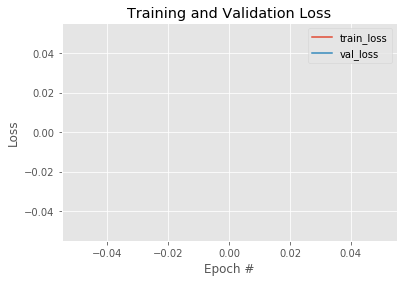

In [9]:
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, 250), historyC.history["loss"], label="train_loss")
plt.plot(np.arange(0, 250), historyC.history["val_loss"], label="val_loss")
plt.title("Training and Validation Loss")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend()
plt.show()

El modelo, utilizando la función de activación ReLU, diverge totalmente en todas las repeticiones del experimento.
Sin embargo, si se utilizan menos datos, es posible obtener un valor distinto a nan en la primera epoch.

d) Repita b) y c) variando la tasa de aprendizaje (learning rate) en un rango sensible. Comente. Si observara divergencia durante el entrenamiento, determine si esto ocurre para cada repetición del experimento.

In [15]:
n_lr = 20
learn_rate = np.linspace(0,1,n_lr)

In [17]:
historiesD1 = []

for lrate in learn_rate:
    modelD1 = Sequential()
    modelD1.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation="sigmoid"))
    modelD1.add(Dense(1, kernel_initializer='uniform',activation="linear")) 
    modelD1.compile(optimizer=SGD(lr=lrate),loss='mean_squared_error')
    historiesD1.append(modelD1.fit(X_train_scaled, y_train, epochs=250, verbose=0, validation_data=(X_val_scaled, y_val)))

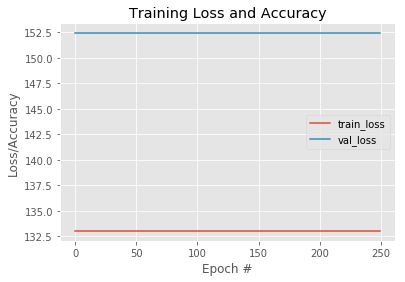

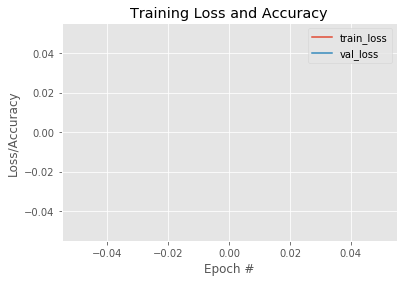

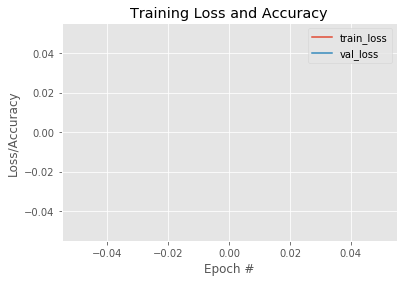

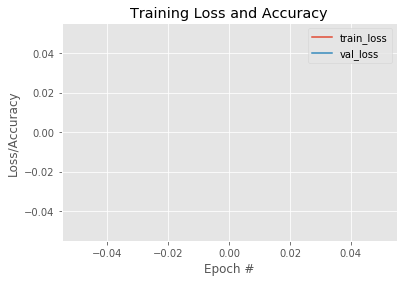

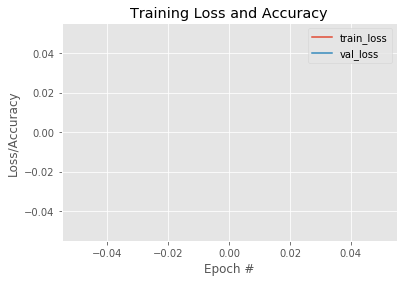

...

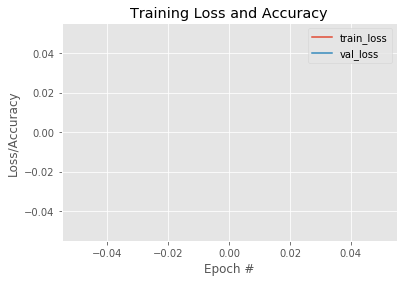

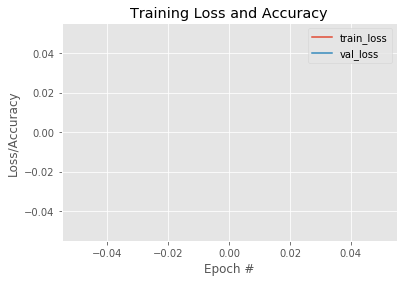

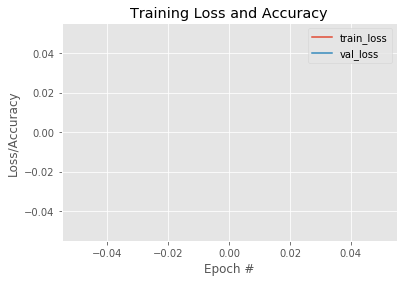

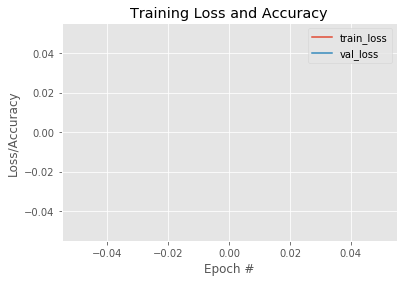

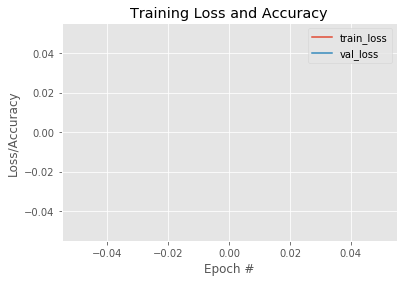

In [18]:
for i in range(n_lr):
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, 250), historiesD1[i].history["loss"], label="train_loss")
    plt.plot(np.arange(0, 250), historiesD1[i].history["val_loss"], label="val_loss")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    #plt.text(0,0,'Using lr=' + str(round(learn_rate[i],4)))
    plt.legend()
    plt.show()

Hay divergencia en todos los experimentos. A excepción del primero, en el que el learning rate es de 0, por lo tanto, no aprende y los errores se mantienen constantes.

In [19]:
historiesD2 = []

for lrate in learn_rate:
    modelD2 = Sequential()
    modelD2.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation="relu"))
    modelD2.add(Dense(1, kernel_initializer='uniform',activation="linear")) 
    modelD2.compile(optimizer=SGD(lr=lrate),loss='mean_squared_error')
    historiesD2.append(modelD2.fit(X_train_scaled, y_train, epochs=250, verbose=0, validation_data=(X_val_scaled, y_val)))

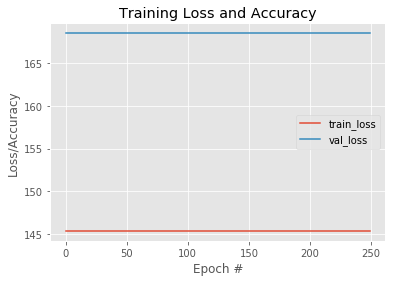

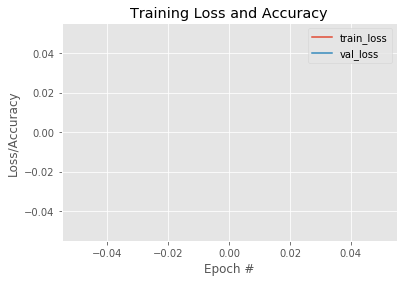

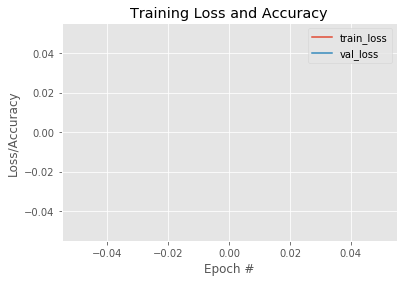

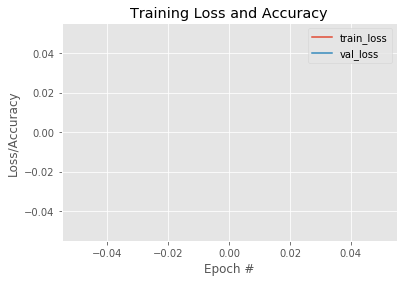

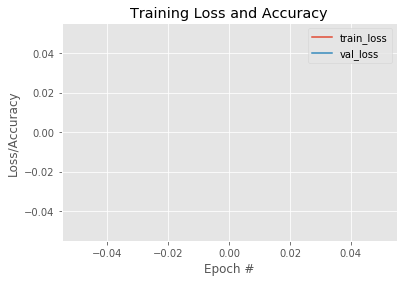

...

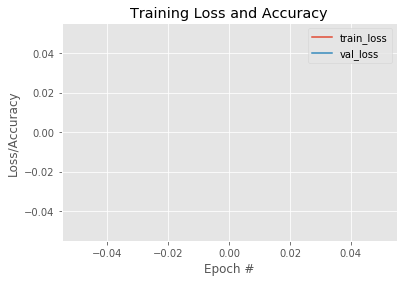

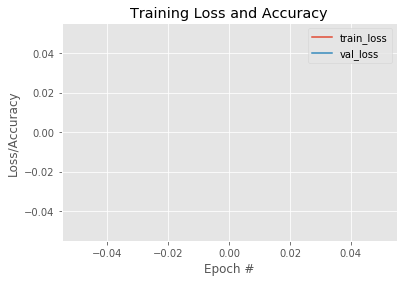

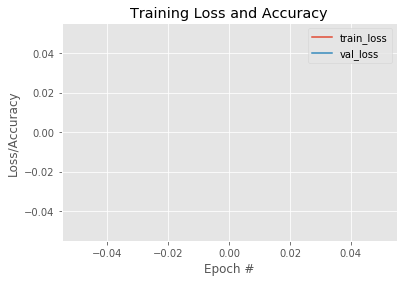

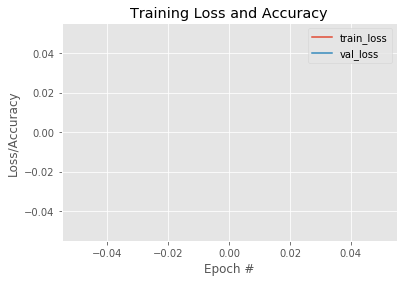

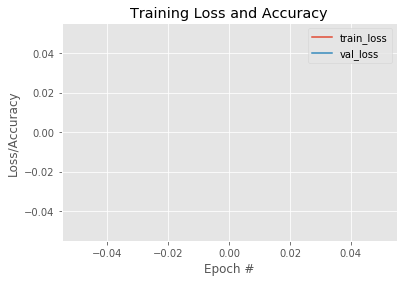

In [20]:
for i in range(n_lr):
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, 250), historiesD2[i].history["loss"], label="train_loss")
    plt.plot(np.arange(0, 250), historiesD2[i].history["val_loss"], label="val_loss")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    #plt.text(0,0,'Using lr=' + str(round(lrate,4)), horizontalalignment="left", verticalalignment="center")
    plt.legend()
    plt.show()

Hay divergencia en todos los experimentos. A excepción del primero, en el que el learning rate es de 0, por lo tanto, no aprende y los errores se mantienen constantes.

e) Entrene los modelos considerados en b) y c) usando progressive decay. Compare y comente.

In [112]:
n_decay = 10
lear_decay = np.logspace(-6,0,n_decay)

In [113]:
historiesE1 = []

for ld in lear_decay:
    modelE1 = Sequential()
    modelE1.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation="sigmoid"))
    modelE1.add(Dense(1, kernel_initializer='uniform',activation="linear")) 
    modelE1.compile(optimizer=SGD(lr=0.1, decay=10**ld),loss='mean_squared_error')
    historiesE1.append(modelE1.fit(X_train_scaled, y_train, epochs=250, verbose=1, validation_data=(X_val_scaled, y_val)))

Train on 9745 samples, validate on 4060 samples
Epoch 1/250
9745/9745 [==============================] - 12s 1ms/step - loss: 496992.4007 - val_loss: 4549.0059
Epoch 2/250
9745/9745 [==============================] - 4s 456us/step - loss: 3921.3376 - val_loss: 3902.7258
Epoch 3/250
9745/9745 [==============================] - 4s 436us/step - loss: 3442.1850 - val_loss: 3503.6142
Epoch 4/250
9745/9745 [==============================] - 4s 399us/step - loss: 3191.9304 - val_loss: 3365.1519
Epoch 5/250
9745/9745 [==============================] - 4s 413us/step - loss: 3024.5155 - val_loss: 3256.5704
Epoch 6/250
9745/9745 [==============================] - 4s 407us/step - loss: 2907.8307 - val_loss: 3170.4144
Epoch 7/250
9745/9745 [==============================] - 4s 408us/step - loss: 2827.1275 - val_loss: 3106.3537
Epoch 8/250
9745/9745 [==============================] - 4s 395us/step - loss: 2771.6482 - val_loss: 3061.3712
Epoch 9/250
9745/9745 [==============================] - 4s 405

Epoch 74/250
9745/9745 [==============================] - 4s 384us/step - loss: 2073.1581 - val_loss: 2357.4861
Epoch 75/250
9745/9745 [==============================] - 4s 385us/step - loss: 2070.2590 - val_loss: 2354.0497
Epoch 76/250
9745/9745 [==============================] - 4s 387us/step - loss: 2067.2626 - val_loss: 2351.1406
Epoch 77/250
9745/9745 [==============================] - 4s 390us/step - loss: 2064.2565 - val_loss: 2348.4329
Epoch 78/250
9745/9745 [==============================] - 4s 390us/step - loss: 2061.5625 - val_loss: 2345.7008
Epoch 79/250
9745/9745 [==============================] - 4s 386us/step - loss: 2058.8291 - val_loss: 2342.8985
Epoch 80/250
9745/9745 [==============================] - 4s 386us/step - loss: 2056.2142 - val_loss: 2340.1964
Epoch 81/250
9745/9745 [==============================] - 4s 386us/step - loss: 2053.6369 - val_loss: 2337.4500
Epoch 82/250
9745/9745 [==============================] - 4s 386us/step - loss: 2051.0800 - val_loss: 23

9745/9745 [==============================] - 4s 386us/step - loss: 1861.9111 - val_loss: 2150.0578
Epoch 219/250
9745/9745 [==============================] - 4s 386us/step - loss: 1861.1433 - val_loss: 2149.2136
Epoch 220/250
9745/9745 [==============================] - 4s 386us/step - loss: 1860.3813 - val_loss: 2148.3767
Epoch 221/250
9745/9745 [==============================] - 4s 387us/step - loss: 1859.6212 - val_loss: 2147.5370
Epoch 222/250
9745/9745 [==============================] - 4s 385us/step - loss: 1858.8696 - val_loss: 2146.7058
Epoch 223/250
9745/9745 [==============================] - 4s 387us/step - loss: 1858.1157 - val_loss: 2145.8851
Epoch 224/250
9745/9745 [==============================] - 4s 386us/step - loss: 1857.3690 - val_loss: 2145.0699
Epoch 225/250
9745/9745 [==============================] - 4s 385us/step - loss: 1856.6262 - val_loss: 2144.2542
Epoch 226/250
9745/9745 [==============================] - 4s 385us/step - loss: 1855.8858 - val_loss: 2143.43

Epoch 114/250
9745/9745 [==============================] - 4s 391us/step - loss: 833.7866 - val_loss: 1006.8738
Epoch 115/250
9745/9745 [==============================] - 4s 387us/step - loss: 832.9321 - val_loss: 1005.9024
Epoch 116/250
9745/9745 [==============================] - 4s 386us/step - loss: 831.7988 - val_loss: 1004.8894
Epoch 117/250
9745/9745 [==============================] - 4s 386us/step - loss: 830.5155 - val_loss: 1003.9747
Epoch 118/250
9745/9745 [==============================] - 4s 386us/step - loss: 829.7048 - val_loss: 1003.0743
Epoch 119/250
9745/9745 [==============================] - 4s 386us/step - loss: 828.9055 - val_loss: 1002.1820
Epoch 120/250
9745/9745 [==============================] - 4s 386us/step - loss: 828.1117 - val_loss: 1001.3043
Epoch 121/250
9745/9745 [==============================] - 4s 385us/step - loss: 827.3288 - val_loss: 1000.4351
Epoch 122/250
9745/9745 [==============================] - 4s 385us/step - loss: 826.5534 - val_loss: 99

Epoch 11/250
9745/9745 [==============================] - 4s 387us/step - loss: 61.0979 - val_loss: 66.5112
Epoch 12/250
9745/9745 [==============================] - 4s 387us/step - loss: 60.4065 - val_loss: 65.8512
Epoch 13/250
9745/9745 [==============================] - 4s 388us/step - loss: 59.7815 - val_loss: 65.2544
Epoch 14/250
9745/9745 [==============================] - 4s 386us/step - loss: 59.2176 - val_loss: 64.7117
Epoch 15/250
9745/9745 [==============================] - 4s 387us/step - loss: 58.7038 - val_loss: 64.2134
Epoch 16/250
9745/9745 [==============================] - 4s 386us/step - loss: 58.2293 - val_loss: 63.7528
Epoch 17/250
9745/9745 [==============================] - 4s 388us/step - loss: 57.7888 - val_loss: 63.3244
Epoch 18/250
9745/9745 [==============================] - 4s 392us/step - loss: 57.3784 - val_loss: 62.9242
Epoch 19/250
9745/9745 [==============================] - 4s 387us/step - loss: 56.9933 - val_loss: 62.5516
Epoch 20/250
9745/9745 [====

Epoch 87/250
9745/9745 [==============================] - 4s 390us/step - loss: 48.0134 - val_loss: 53.6002
Epoch 88/250
9745/9745 [==============================] - 4s 389us/step - loss: 47.9564 - val_loss: 53.5418
Epoch 89/250
9745/9745 [==============================] - 4s 388us/step - loss: 47.9003 - val_loss: 53.4841
Epoch 90/250
9745/9745 [==============================] - 4s 389us/step - loss: 47.8447 - val_loss: 53.4273
Epoch 91/250
9745/9745 [==============================] - 4s 389us/step - loss: 47.7901 - val_loss: 53.3712
Epoch 92/250
9745/9745 [==============================] - 4s 387us/step - loss: 47.7362 - val_loss: 53.3157
Epoch 93/250
9745/9745 [==============================] - 4s 387us/step - loss: 47.6829 - val_loss: 53.2611
Epoch 94/250
9745/9745 [==============================] - 4s 388us/step - loss: 47.6304 - val_loss: 53.2069
Epoch 95/250
9745/9745 [==============================] - 4s 389us/step - loss: 47.5784 - val_loss: 53.1533
Epoch 96/250
9745/9745 [====

9745/9745 [==============================] - 4s 387us/step - loss: 43.4570 - val_loss: 48.8824
Epoch 238/250
9745/9745 [==============================] - 4s 387us/step - loss: 43.4396 - val_loss: 48.8644
Epoch 239/250
9745/9745 [==============================] - 4s 386us/step - loss: 43.4222 - val_loss: 48.8464
Epoch 240/250
9745/9745 [==============================] - 4s 388us/step - loss: 43.4049 - val_loss: 48.8286
Epoch 241/250
9745/9745 [==============================] - 4s 386us/step - loss: 43.3878 - val_loss: 48.8109
Epoch 242/250
9745/9745 [==============================] - 4s 387us/step - loss: 43.3707 - val_loss: 48.7933
Epoch 243/250
9745/9745 [==============================] - 4s 387us/step - loss: 43.3536 - val_loss: 48.7757
Epoch 244/250
9745/9745 [==============================] - 4s 385us/step - loss: 43.3367 - val_loss: 48.7583
Epoch 245/250
9745/9745 [==============================] - 4s 396us/step - loss: 43.3199 - val_loss: 48.7409
Epoch 246/250
9745/9745 [========

9745/9745 [==============================] - 4s 460us/step - loss: 263.0427 - val_loss: 290.4362
Epoch 136/250
9745/9745 [==============================] - 4s 419us/step - loss: 262.8217 - val_loss: 290.2034
Epoch 137/250
9745/9745 [==============================] - 4s 391us/step - loss: 262.5996 - val_loss: 289.9715
Epoch 138/250
9745/9745 [==============================] - 4s 389us/step - loss: 262.3768 - val_loss: 289.7426
Epoch 139/250
9745/9745 [==============================] - 4s 388us/step - loss: 262.1548 - val_loss: 289.5158
Epoch 140/250
9745/9745 [==============================] - 4s 391us/step - loss: 261.9337 - val_loss: 289.2977
Epoch 141/250
9745/9745 [==============================] - 4s 391us/step - loss: 261.7192 - val_loss: 289.0839
Epoch 142/250
9745/9745 [==============================] - 4s 388us/step - loss: 261.5082 - val_loss: 288.8747
Epoch 143/250
9745/9745 [==============================] - 4s 388us/step - loss: 261.2998 - val_loss: 288.6667
Epoch 144/250
9

Epoch 209/250
9745/9745 [==============================] - 4s 388us/step - loss: 251.0819 - val_loss: 277.5431
Epoch 210/250
9745/9745 [==============================] - 4s 389us/step - loss: 250.9770 - val_loss: 277.4127
Epoch 211/250
9745/9745 [==============================] - 4s 388us/step - loss: 250.8729 - val_loss: 277.2842
Epoch 212/250
9745/9745 [==============================] - 4s 388us/step - loss: 250.7703 - val_loss: 277.1556
Epoch 213/250
9745/9745 [==============================] - 4s 389us/step - loss: 250.6678 - val_loss: 277.0297
Epoch 214/250
9745/9745 [==============================] - 4s 388us/step - loss: 250.5665 - val_loss: 276.9049
Epoch 215/250
9745/9745 [==============================] - 4s 390us/step - loss: 250.4663 - val_loss: 276.7813
Epoch 216/250
9745/9745 [==============================] - 4s 392us/step - loss: 250.3668 - val_loss: 276.6589
Epoch 217/250
9745/9745 [==============================] - 4s 391us/step - loss: 250.2677 - val_loss: 276.5376
E

9745/9745 [==============================] - 4s 390us/step - loss: 278.8328 - val_loss: 335.6094
Epoch 107/250
9745/9745 [==============================] - 4s 389us/step - loss: 278.6371 - val_loss: 335.4333
Epoch 108/250
9745/9745 [==============================] - 4s 388us/step - loss: 278.4447 - val_loss: 335.2588
Epoch 109/250
9745/9745 [==============================] - 4s 390us/step - loss: 278.2551 - val_loss: 335.0873
Epoch 110/250
9745/9745 [==============================] - 4s 390us/step - loss: 278.0670 - val_loss: 334.9184
Epoch 111/250
9745/9745 [==============================] - 4s 390us/step - loss: 277.8829 - val_loss: 334.7520
Epoch 112/250
9745/9745 [==============================] - 4s 390us/step - loss: 277.7004 - val_loss: 334.5872
Epoch 113/250
9745/9745 [==============================] - 4s 391us/step - loss: 277.5203 - val_loss: 334.4248
Epoch 114/250
9745/9745 [==============================] - 4s 391us/step - loss: 277.3419 - val_loss: 334.2635
Epoch 115/250
9

Epoch 180/250
9745/9745 [==============================] - 4s 389us/step - loss: 268.7164 - val_loss: 326.2473
Epoch 181/250
9745/9745 [==============================] - 4s 390us/step - loss: 268.6228 - val_loss: 326.1493
Epoch 182/250
9745/9745 [==============================] - 4s 390us/step - loss: 268.5290 - val_loss: 326.0513
Epoch 183/250
9745/9745 [==============================] - 4s 389us/step - loss: 268.4368 - val_loss: 325.9548
Epoch 184/250
9745/9745 [==============================] - 4s 389us/step - loss: 268.3450 - val_loss: 325.8576
Epoch 185/250
9745/9745 [==============================] - 4s 385us/step - loss: 268.2534 - val_loss: 325.7612
Epoch 186/250
9745/9745 [==============================] - 4s 398us/step - loss: 268.1631 - val_loss: 325.6659
Epoch 187/250
9745/9745 [==============================] - 4s 394us/step - loss: 268.0730 - val_loss: 325.5705
Epoch 188/250
9745/9745 [==============================] - 4s 391us/step - loss: 267.9838 - val_loss: 325.4761
E

9745/9745 [==============================] - 4s 388us/step - loss: 388.2363 - val_loss: 511.4637
Epoch 78/250
9745/9745 [==============================] - 4s 392us/step - loss: 387.8902 - val_loss: 511.0757
Epoch 79/250
9745/9745 [==============================] - 4s 390us/step - loss: 387.5520 - val_loss: 510.6929
Epoch 80/250
9745/9745 [==============================] - 4s 390us/step - loss: 387.2246 - val_loss: 510.3153
Epoch 81/250
9745/9745 [==============================] - 4s 392us/step - loss: 386.9063 - val_loss: 509.9487
Epoch 82/250
9745/9745 [==============================] - 4s 390us/step - loss: 386.5934 - val_loss: 509.5787
Epoch 83/250
9745/9745 [==============================] - 4s 390us/step - loss: 386.2873 - val_loss: 509.2271
Epoch 84/250
9745/9745 [==============================] - 4s 391us/step - loss: 385.9908 - val_loss: 508.8819
Epoch 85/250
9745/9745 [==============================] - 4s 391us/step - loss: 385.6999 - val_loss: 508.5430
Epoch 86/250
9745/9745 

Epoch 225/250
9745/9745 [==============================] - 4s 391us/step - loss: 364.4552 - val_loss: 483.2022
Epoch 226/250
9745/9745 [==============================] - 4s 391us/step - loss: 364.3677 - val_loss: 483.0959
Epoch 227/250
9745/9745 [==============================] - 4s 391us/step - loss: 364.2797 - val_loss: 482.9903
Epoch 228/250
9745/9745 [==============================] - 4s 391us/step - loss: 364.1920 - val_loss: 482.8840
Epoch 229/250
9745/9745 [==============================] - 4s 390us/step - loss: 364.1057 - val_loss: 482.7784
Epoch 230/250
9745/9745 [==============================] - 4s 391us/step - loss: 364.0200 - val_loss: 482.6735
Epoch 231/250
9745/9745 [==============================] - 4s 391us/step - loss: 363.9338 - val_loss: 482.5671
Epoch 232/250
9745/9745 [==============================] - 4s 391us/step - loss: 363.8486 - val_loss: 482.4636
Epoch 233/250
9745/9745 [==============================] - 4s 391us/step - loss: 363.7627 - val_loss: 482.3600
E

9745/9745 [==============================] - 4s 394us/step - loss: 6350.5687 - val_loss: 7390.3090
Epoch 49/250
9745/9745 [==============================] - 4s 396us/step - loss: 6342.4733 - val_loss: 7383.3226
Epoch 50/250
9745/9745 [==============================] - 4s 394us/step - loss: 6334.5429 - val_loss: 7374.2247
Epoch 51/250
9745/9745 [==============================] - 4s 394us/step - loss: 6326.6879 - val_loss: 7366.4224
Epoch 52/250
9745/9745 [==============================] - 4s 392us/step - loss: 6318.9293 - val_loss: 7358.3283
Epoch 53/250
9745/9745 [==============================] - 4s 394us/step - loss: 6311.0494 - val_loss: 7350.7464
Epoch 54/250
9745/9745 [==============================] - 4s 395us/step - loss: 6303.4392 - val_loss: 7343.7555
Epoch 55/250
9745/9745 [==============================] - 4s 394us/step - loss: 6296.2924 - val_loss: 7336.6724
Epoch 56/250
9745/9745 [==============================] - 4s 394us/step - loss: 6288.8796 - val_loss: 7329.4523
Epoch

9745/9745 [==============================] - 4s 395us/step - loss: 5994.7058 - val_loss: 7055.5119
Epoch 122/250
9745/9745 [==============================] - 4s 394us/step - loss: 5991.7817 - val_loss: 7052.5267
Epoch 123/250
9745/9745 [==============================] - 4s 389us/step - loss: 5989.0067 - val_loss: 7049.4354
Epoch 124/250
9745/9745 [==============================] - 4s 401us/step - loss: 5986.1450 - val_loss: 7046.3798
Epoch 125/250
9745/9745 [==============================] - 4s 398us/step - loss: 5983.3188 - val_loss: 7043.3249
Epoch 126/250
9745/9745 [==============================] - 4s 396us/step - loss: 5980.5271 - val_loss: 7040.4379
Epoch 127/250
9745/9745 [==============================] - 4s 394us/step - loss: 5977.8223 - val_loss: 7037.5292
Epoch 128/250
9745/9745 [==============================] - 4s 395us/step - loss: 5975.2048 - val_loss: 7034.6983
Epoch 129/250
9745/9745 [==============================] - 4s 394us/step - loss: 5972.5545 - val_loss: 7031.92

Epoch 16/250
9745/9745 [==============================] - 4s 395us/step - loss: 38.3971 - val_loss: 45.8304
Epoch 17/250
9745/9745 [==============================] - 4s 394us/step - loss: 38.2237 - val_loss: 45.6594
Epoch 18/250
9745/9745 [==============================] - 4s 394us/step - loss: 38.0627 - val_loss: 45.5025
Epoch 19/250
9745/9745 [==============================] - 4s 393us/step - loss: 37.9123 - val_loss: 45.3562
Epoch 20/250
9745/9745 [==============================] - 4s 393us/step - loss: 37.7701 - val_loss: 45.2197
Epoch 21/250
9745/9745 [==============================] - 4s 393us/step - loss: 37.6353 - val_loss: 45.0903
Epoch 22/250
9745/9745 [==============================] - 4s 387us/step - loss: 37.5074 - val_loss: 44.9705
Epoch 23/250
9745/9745 [==============================] - 4s 398us/step - loss: 37.3850 - val_loss: 44.8545
Epoch 24/250
9745/9745 [==============================] - 4s 394us/step - loss: 37.2675 - val_loss: 44.7439
Epoch 25/250
9745/9745 [====

Epoch 92/250
9745/9745 [==============================] - 4s 402us/step - loss: 33.8808 - val_loss: 41.6368
Epoch 93/250
9745/9745 [==============================] - 4s 396us/step - loss: 33.8575 - val_loss: 41.6143
Epoch 94/250
9745/9745 [==============================] - 4s 395us/step - loss: 33.8344 - val_loss: 41.5920
Epoch 95/250
9745/9745 [==============================] - 4s 394us/step - loss: 33.8116 - val_loss: 41.5699
Epoch 96/250
9745/9745 [==============================] - 4s 394us/step - loss: 33.7891 - val_loss: 41.5479
Epoch 97/250
9745/9745 [==============================] - 4s 393us/step - loss: 33.7669 - val_loss: 41.5264
Epoch 98/250
9745/9745 [==============================] - 4s 393us/step - loss: 33.7450 - val_loss: 41.5053
Epoch 99/250
9745/9745 [==============================] - 4s 393us/step - loss: 33.7233 - val_loss: 41.4839
Epoch 100/250
9745/9745 [==============================] - 4s 394us/step - loss: 33.7018 - val_loss: 41.4630
Epoch 101/250
9745/9745 [==

9745/9745 [==============================] - 4s 394us/step - loss: 32.0100 - val_loss: 39.7265
Epoch 243/250
9745/9745 [==============================] - 4s 393us/step - loss: 32.0029 - val_loss: 39.7189
Epoch 244/250
9745/9745 [==============================] - 4s 392us/step - loss: 31.9959 - val_loss: 39.7113
Epoch 245/250
9745/9745 [==============================] - 4s 394us/step - loss: 31.9889 - val_loss: 39.7037
Epoch 246/250
9745/9745 [==============================] - 4s 393us/step - loss: 31.9819 - val_loss: 39.6960
Epoch 247/250
9745/9745 [==============================] - 4s 394us/step - loss: 31.9750 - val_loss: 39.6885
Epoch 248/250
9745/9745 [==============================] - 4s 392us/step - loss: 31.9681 - val_loss: 39.6810
Epoch 249/250
9745/9745 [==============================] - 4s 395us/step - loss: 31.9613 - val_loss: 39.6736
Epoch 250/250
9745/9745 [==============================] - 4s 398us/step - loss: 31.9545 - val_loss: 39.6662
Train on 9745 samples, validate o

9745/9745 [==============================] - 4s 394us/step - loss: 50.9267 - val_loss: 61.4076
Epoch 143/250
9745/9745 [==============================] - 4s 394us/step - loss: 50.8935 - val_loss: 61.3696
Epoch 144/250
9745/9745 [==============================] - 4s 393us/step - loss: 50.8604 - val_loss: 61.3320
Epoch 145/250
9745/9745 [==============================] - 4s 393us/step - loss: 50.8277 - val_loss: 61.2946
Epoch 146/250
9745/9745 [==============================] - 4s 392us/step - loss: 50.7953 - val_loss: 61.2575
Epoch 147/250
9745/9745 [==============================] - 4s 391us/step - loss: 50.7630 - val_loss: 61.2208
Epoch 148/250
9745/9745 [==============================] - 4s 392us/step - loss: 50.7311 - val_loss: 61.1842
Epoch 149/250
9745/9745 [==============================] - 4s 392us/step - loss: 50.6993 - val_loss: 61.1481
Epoch 150/250
9745/9745 [==============================] - 4s 392us/step - loss: 50.6679 - val_loss: 61.1123
Epoch 151/250
9745/9745 [========

9745/9745 [==============================] - 4s 393us/step - loss: 57.5604 - val_loss: 58.2711
Epoch 43/250
9745/9745 [==============================] - 4s 394us/step - loss: 57.5160 - val_loss: 58.2284
Epoch 44/250
9745/9745 [==============================] - 4s 392us/step - loss: 57.4727 - val_loss: 58.1867
Epoch 45/250
9745/9745 [==============================] - 4s 393us/step - loss: 57.4304 - val_loss: 58.1460
Epoch 46/250
9745/9745 [==============================] - 4s 393us/step - loss: 57.3890 - val_loss: 58.1062
Epoch 47/250
9745/9745 [==============================] - 4s 393us/step - loss: 57.3487 - val_loss: 58.0674
Epoch 48/250
9745/9745 [==============================] - 4s 398us/step - loss: 57.3092 - val_loss: 58.0294
Epoch 49/250
9745/9745 [==============================] - 4s 392us/step - loss: 57.2707 - val_loss: 57.9922
Epoch 50/250
9745/9745 [==============================] - 4s 393us/step - loss: 57.2329 - val_loss: 57.9559
Epoch 51/250
9745/9745 [=================

Epoch 118/250
9745/9745 [==============================] - 4s 394us/step - loss: 55.6749 - val_loss: 56.4467
Epoch 119/250
9745/9745 [==============================] - 4s 393us/step - loss: 55.6600 - val_loss: 56.4322
Epoch 120/250
9745/9745 [==============================] - 4s 394us/step - loss: 55.6453 - val_loss: 56.4178
Epoch 121/250
9745/9745 [==============================] - 4s 392us/step - loss: 55.6307 - val_loss: 56.4036
Epoch 122/250
9745/9745 [==============================] - 4s 393us/step - loss: 55.6162 - val_loss: 56.3895
Epoch 123/250
9745/9745 [==============================] - 4s 396us/step - loss: 55.6018 - val_loss: 56.3755
Epoch 124/250
9745/9745 [==============================] - 4s 398us/step - loss: 55.5876 - val_loss: 56.3617
Epoch 125/250
9745/9745 [==============================] - 4s 399us/step - loss: 55.5734 - val_loss: 56.3479
Epoch 126/250
9745/9745 [==============================] - 4s 395us/step - loss: 55.5594 - val_loss: 56.3343
Epoch 127/250
9745/

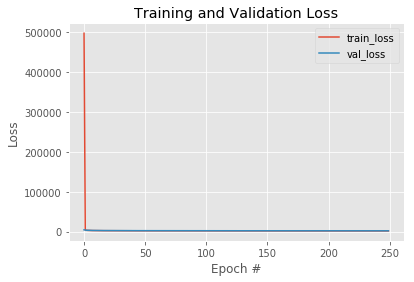

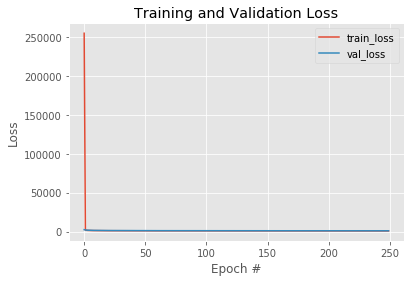

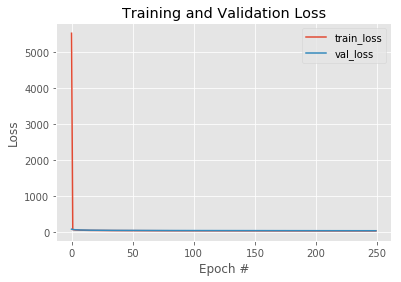

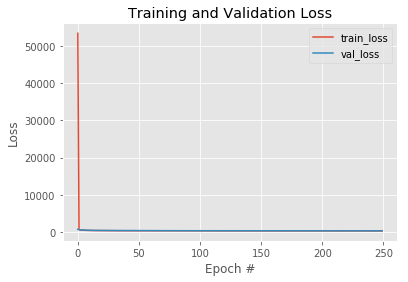

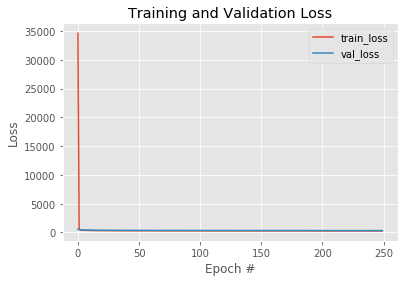

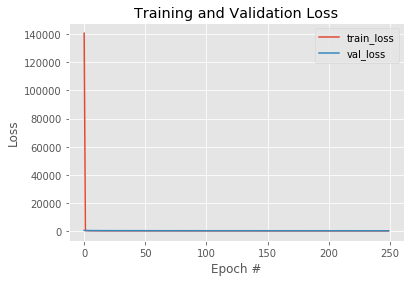

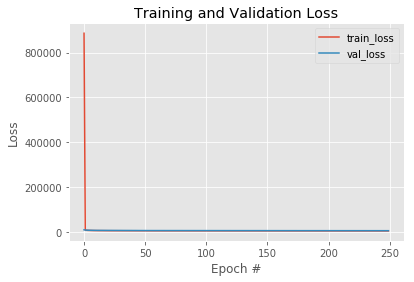

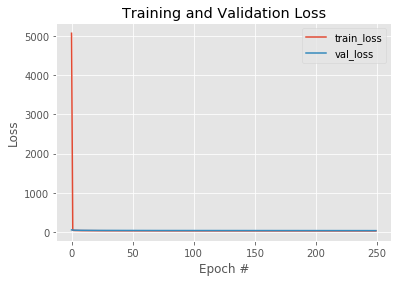

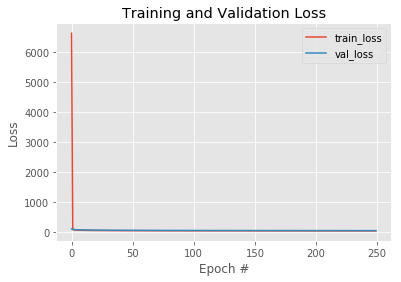

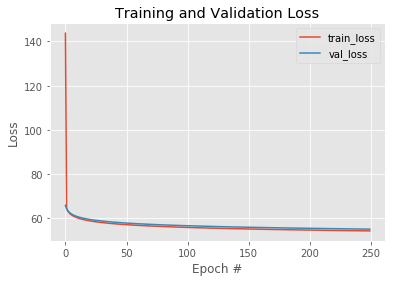

In [114]:
for i in range(n_decay):
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, 250), historiesE1[i].history["loss"], label="train_loss")
    plt.plot(np.arange(0, 250), historiesE1[i].history["val_loss"], label="val_loss")
    plt.title("Training and Validation Loss")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

Se probó con un _learning rate_ de $0.1$ y de $0.2$, en el primer caso, el error de entrenamiento va oscilando, pero con una tendencia a disminuir para finalmente partir con un error aproximado de $140$. En cambio, con $0.2$, los errores iniciales son considerablemente más grandes, pero siguen la tendencia a disminuir a medida que aumenta el _decay_ del _learning rate_. El resultado de estas pruebas es peor que el del modelo presentado en b).

In [115]:
historiesE2 = []

for ld in lear_decay:
    modelE2 = Sequential()
    modelE2.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation="relu"))
    modelE2.add(Dense(1, kernel_initializer='uniform',activation="linear")) 
    modelE2.compile(optimizer=SGD(lr=0.1, decay=10**ld),loss='mean_squared_error')
    historiesE2.append(modelE2.fit(X_train_scaled, y_train, epochs=250, verbose=1, validation_data=(X_val_scaled, y_val)))

Train on 9745 samples, validate on 4060 samples
Epoch 1/250
9745/9745 [==============================] - 11s 1ms/step - loss: nan - val_loss: nan
Epoch 2/250
9745/9745 [==============================] - 4s 394us/step - loss: nan - val_loss: nan
Epoch 3/250
9745/9745 [==============================] - 4s 394us/step - loss: nan - val_loss: nan
Epoch 4/250
9745/9745 [==============================] - 4s 395us/step - loss: nan - val_loss: nan
Epoch 5/250
9745/9745 [==============================] - 4s 393us/step - loss: nan - val_loss: nan
Epoch 6/250
9745/9745 [==============================] - 4s 394us/step - loss: nan - val_loss: nan
Epoch 7/250
9745/9745 [==============================] - 4s 394us/step - loss: nan - val_loss: nan
Epoch 8/250
9745/9745 [==============================] - 4s 398us/step - loss: nan - val_loss: nan
Epoch 9/250
9745/9745 [==============================] - 4s 394us/step - loss: nan - val_loss: nan
Epoch 10/250
9745/9745 [==============================] - 4s 3

9745/9745 [==============================] - 4s 392us/step - loss: nan - val_loss: nan
Epoch 164/250
9745/9745 [==============================] - 4s 393us/step - loss: nan - val_loss: nan
Epoch 165/250
9745/9745 [==============================] - 4s 392us/step - loss: nan - val_loss: nan
Epoch 166/250
9745/9745 [==============================] - 4s 392us/step - loss: nan - val_loss: nan
Epoch 167/250
9745/9745 [==============================] - 4s 392us/step - loss: nan - val_loss: nan
Epoch 168/250
9745/9745 [==============================] - 4s 392us/step - loss: nan - val_loss: nan
Epoch 169/250
9745/9745 [==============================] - 4s 392us/step - loss: nan - val_loss: nan
Epoch 170/250
9745/9745 [==============================] - 4s 393us/step - loss: nan - val_loss: nan
Epoch 171/250
9745/9745 [==============================] - 4s 393us/step - loss: nan - val_loss: nan
Epoch 172/250
9745/9745 [==============================] - 4s 393us/step - loss: nan - val_loss: nan
Epoc

9745/9745 [==============================] - 4s 394us/step - loss: nan - val_loss: nan
Epoch 76/250
9745/9745 [==============================] - 4s 394us/step - loss: nan - val_loss: nan
Epoch 77/250
9745/9745 [==============================] - 4s 396us/step - loss: nan - val_loss: nan
Epoch 78/250
9745/9745 [==============================] - 4s 394us/step - loss: nan - val_loss: nan
Epoch 79/250
9745/9745 [==============================] - 4s 393us/step - loss: nan - val_loss: nan
Epoch 80/250
9745/9745 [==============================] - 4s 398us/step - loss: nan - val_loss: nan
Epoch 81/250
9745/9745 [==============================] - 4s 393us/step - loss: nan - val_loss: nan
Epoch 82/250
9745/9745 [==============================] - 4s 394us/step - loss: nan - val_loss: nan
Epoch 83/250
9745/9745 [==============================] - 4s 393us/step - loss: nan - val_loss: nan
Epoch 84/250
9745/9745 [==============================] - 4s 392us/step - loss: nan - val_loss: nan
Epoch 85/250


9745/9745 [==============================] - 4s 393us/step - loss: nan - val_loss: nan
Epoch 238/250
9745/9745 [==============================] - 4s 395us/step - loss: nan - val_loss: nan
Epoch 239/250
9745/9745 [==============================] - 4s 394us/step - loss: nan - val_loss: nan
Epoch 240/250
9745/9745 [==============================] - 4s 394us/step - loss: nan - val_loss: nan
Epoch 241/250
9745/9745 [==============================] - 4s 395us/step - loss: nan - val_loss: nan
Epoch 242/250
9745/9745 [==============================] - 4s 395us/step - loss: nan - val_loss: nan
Epoch 243/250
9745/9745 [==============================] - 4s 394us/step - loss: nan - val_loss: nan
Epoch 244/250
9745/9745 [==============================] - 4s 394us/step - loss: nan - val_loss: nan
Epoch 245/250
9745/9745 [==============================] - 4s 393us/step - loss: nan - val_loss: nan
Epoch 246/250
9745/9745 [==============================] - 4s 394us/step - loss: nan - val_loss: nan
Epoc

9745/9745 [==============================] - 4s 393us/step - loss: nan - val_loss: nan
Epoch 150/250
9745/9745 [==============================] - 4s 395us/step - loss: nan - val_loss: nan
Epoch 151/250
9745/9745 [==============================] - 4s 393us/step - loss: nan - val_loss: nan
Epoch 152/250
9745/9745 [==============================] - 4s 390us/step - loss: nan - val_loss: nan
Epoch 153/250
9745/9745 [==============================] - 4s 405us/step - loss: nan - val_loss: nan
Epoch 154/250
9745/9745 [==============================] - 4s 400us/step - loss: nan - val_loss: nan
Epoch 155/250
9745/9745 [==============================] - 4s 394us/step - loss: nan - val_loss: nan
Epoch 156/250
9745/9745 [==============================] - 4s 395us/step - loss: nan - val_loss: nan
Epoch 157/250
9745/9745 [==============================] - 4s 395us/step - loss: nan - val_loss: nan
Epoch 158/250
9745/9745 [==============================] - 4s 393us/step - loss: nan - val_loss: nan
Epoc

9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 62/250
9745/9745 [==============================] - 4s 398us/step - loss: nan - val_loss: nan
Epoch 63/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 64/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 65/250
9745/9745 [==============================] - 4s 396us/step - loss: nan - val_loss: nan
Epoch 66/250
9745/9745 [==============================] - 4s 396us/step - loss: nan - val_loss: nan
Epoch 67/250
9745/9745 [==============================] - 4s 398us/step - loss: nan - val_loss: nan
Epoch 68/250
9745/9745 [==============================] - 4s 396us/step - loss: nan - val_loss: nan
Epoch 69/250
9745/9745 [==============================] - 4s 402us/step - loss: nan - val_loss: nan
Epoch 70/250
9745/9745 [==============================] - 4s 395us/step - loss: nan - val_loss: nan
Epoch 71/250


9745/9745 [==============================] - 4s 396us/step - loss: nan - val_loss: nan
Epoch 224/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 225/250
9745/9745 [==============================] - 4s 398us/step - loss: nan - val_loss: nan
Epoch 226/250
9745/9745 [==============================] - 4s 396us/step - loss: nan - val_loss: nan
Epoch 227/250
9745/9745 [==============================] - 4s 396us/step - loss: nan - val_loss: nan
Epoch 228/250
9745/9745 [==============================] - 4s 396us/step - loss: nan - val_loss: nan
Epoch 229/250
9745/9745 [==============================] - 4s 400us/step - loss: nan - val_loss: nan
Epoch 230/250
9745/9745 [==============================] - 4s 396us/step - loss: nan - val_loss: nan
Epoch 231/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 232/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoc

9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 136/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 137/250
9745/9745 [==============================] - 4s 401us/step - loss: nan - val_loss: nan
Epoch 138/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 139/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 140/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 141/250
9745/9745 [==============================] - 4s 398us/step - loss: nan - val_loss: nan
Epoch 142/250
9745/9745 [==============================] - 4s 396us/step - loss: nan - val_loss: nan
Epoch 143/250
9745/9745 [==============================] - 4s 402us/step - loss: nan - val_loss: nan
Epoch 144/250
9745/9745 [==============================] - 4s 394us/step - loss: nan - val_loss: nan
Epoc

9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 48/250
9745/9745 [==============================] - 4s 398us/step - loss: nan - val_loss: nan
Epoch 49/250
9745/9745 [==============================] - 4s 401us/step - loss: nan - val_loss: nan
Epoch 50/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 51/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 52/250
9745/9745 [==============================] - 4s 399us/step - loss: nan - val_loss: nan
Epoch 53/250
9745/9745 [==============================] - 4s 401us/step - loss: nan - val_loss: nan
Epoch 54/250
9745/9745 [==============================] - 4s 402us/step - loss: nan - val_loss: nan
Epoch 55/250
9745/9745 [==============================] - 4s 398us/step - loss: nan - val_loss: nan
Epoch 56/250
9745/9745 [==============================] - 4s 396us/step - loss: nan - val_loss: nan
Epoch 57/250


9745/9745 [==============================] - 4s 407us/step - loss: nan - val_loss: nan
Epoch 210/250
9745/9745 [==============================] - 4s 401us/step - loss: nan - val_loss: nan
Epoch 211/250
9745/9745 [==============================] - 4s 398us/step - loss: nan - val_loss: nan
Epoch 212/250
9745/9745 [==============================] - 4s 396us/step - loss: nan - val_loss: nan
Epoch 213/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 214/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 215/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 216/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 217/250
9745/9745 [==============================] - 4s 395us/step - loss: nan - val_loss: nan
Epoch 218/250
9745/9745 [==============================] - 4s 396us/step - loss: nan - val_loss: nan
Epoc

Epoch 122/250
9745/9745 [==============================] - 4s 396us/step - loss: nan - val_loss: nan
Epoch 123/250
9745/9745 [==============================] - 4s 400us/step - loss: nan - val_loss: nan
Epoch 124/250
9745/9745 [==============================] - 4s 398us/step - loss: nan - val_loss: nan
Epoch 125/250
9745/9745 [==============================] - 4s 398us/step - loss: nan - val_loss: nan
Epoch 126/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 127/250
9745/9745 [==============================] - 4s 396us/step - loss: nan - val_loss: nan
Epoch 128/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 129/250
9745/9745 [==============================] - 4s 396us/step - loss: nan - val_loss: nan
Epoch 130/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 131/250
9745/9745 [==============================] - 4s 399us/step - loss: nan - val_

9745/9745 [==============================] - 4s 396us/step - loss: nan - val_loss: nan
Epoch 204/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 205/250
9745/9745 [==============================] - 4s 392us/step - loss: nan - val_loss: nan
Epoch 206/250
9745/9745 [==============================] - 4s 409us/step - loss: nan - val_loss: nan
Epoch 207/250
9745/9745 [==============================] - 4s 400us/step - loss: nan - val_loss: nan
Epoch 208/250
9745/9745 [==============================] - 4s 398us/step - loss: nan - val_loss: nan
Epoch 209/250
9745/9745 [==============================] - 4s 399us/step - loss: nan - val_loss: nan
Epoch 210/250
9745/9745 [==============================] - 4s 396us/step - loss: nan - val_loss: nan
Epoch 211/250
9745/9745 [==============================] - 4s 396us/step - loss: nan - val_loss: nan
Epoch 212/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoc

Epoch 116/250
9745/9745 [==============================] - 4s 399us/step - loss: nan - val_loss: nan
Epoch 117/250
9745/9745 [==============================] - 4s 399us/step - loss: nan - val_loss: nan
Epoch 118/250
9745/9745 [==============================] - 4s 399us/step - loss: nan - val_loss: nan
Epoch 119/250
9745/9745 [==============================] - 4s 399us/step - loss: nan - val_loss: nan
Epoch 120/250
9745/9745 [==============================] - 4s 399us/step - loss: nan - val_loss: nan
Epoch 121/250
9745/9745 [==============================] - 4s 399us/step - loss: nan - val_loss: nan
Epoch 122/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 123/250
9745/9745 [==============================] - 4s 398us/step - loss: nan - val_loss: nan
Epoch 124/250
9745/9745 [==============================] - 4s 398us/step - loss: nan - val_loss: nan
Epoch 125/250
9745/9745 [==============================] - 4s 399us/step - loss: nan - val_

9745/9745 [==============================] - 4s 400us/step - loss: nan - val_loss: nan
Epoch 198/250
9745/9745 [==============================] - 4s 401us/step - loss: nan - val_loss: nan
Epoch 199/250
9745/9745 [==============================] - 4s 400us/step - loss: nan - val_loss: nan
Epoch 200/250
9745/9745 [==============================] - 4s 398us/step - loss: nan - val_loss: nan
Epoch 201/250
9745/9745 [==============================] - 4s 399us/step - loss: nan - val_loss: nan
Epoch 202/250
9745/9745 [==============================] - 4s 398us/step - loss: nan - val_loss: nan
Epoch 203/250
9745/9745 [==============================] - 4s 408us/step - loss: nan - val_loss: nan
Epoch 204/250
9745/9745 [==============================] - 4s 406us/step - loss: nan - val_loss: nan
Epoch 205/250
9745/9745 [==============================] - 4s 399us/step - loss: nan - val_loss: nan
Epoch 206/250
9745/9745 [==============================] - 4s 399us/step - loss: nan - val_loss: nan
Epoc

Epoch 110/250
9745/9745 [==============================] - 4s 404us/step - loss: nan - val_loss: nan
Epoch 111/250
9745/9745 [==============================] - 4s 403us/step - loss: nan - val_loss: nan
Epoch 112/250
9745/9745 [==============================] - 4s 404us/step - loss: nan - val_loss: nan
Epoch 113/250
9745/9745 [==============================] - 4s 401us/step - loss: nan - val_loss: nan
Epoch 114/250
9745/9745 [==============================] - 4s 402us/step - loss: nan - val_loss: nan
Epoch 115/250
9745/9745 [==============================] - 4s 401us/step - loss: nan - val_loss: nan
Epoch 116/250
9745/9745 [==============================] - 4s 401us/step - loss: nan - val_loss: nan
Epoch 117/250
9745/9745 [==============================] - 4s 403us/step - loss: nan - val_loss: nan
Epoch 118/250
9745/9745 [==============================] - 4s 401us/step - loss: nan - val_loss: nan
Epoch 119/250
9745/9745 [==============================] - 4s 407us/step - loss: nan - val_

9745/9745 [==============================] - 4s 402us/step - loss: nan - val_loss: nan
Epoch 192/250
9745/9745 [==============================] - 4s 404us/step - loss: nan - val_loss: nan
Epoch 193/250
9745/9745 [==============================] - 4s 403us/step - loss: nan - val_loss: nan
Epoch 194/250
9745/9745 [==============================] - 4s 402us/step - loss: nan - val_loss: nan
Epoch 195/250
9745/9745 [==============================] - 4s 403us/step - loss: nan - val_loss: nan
Epoch 196/250
9745/9745 [==============================] - 4s 397us/step - loss: nan - val_loss: nan
Epoch 197/250
9745/9745 [==============================] - 4s 410us/step - loss: nan - val_loss: nan
Epoch 198/250
9745/9745 [==============================] - 4s 406us/step - loss: nan - val_loss: nan
Epoch 199/250
9745/9745 [==============================] - 4s 402us/step - loss: nan - val_loss: nan
Epoch 200/250
9745/9745 [==============================] - 4s 401us/step - loss: nan - val_loss: nan
Epoc

9745/9745 [==============================] - 4s 393us/step - loss: nan - val_loss: nan
Epoch 23/250
9745/9745 [==============================] - 4s 398us/step - loss: nan - val_loss: nan
Epoch 24/250
9745/9745 [==============================] - 4s 404us/step - loss: nan - val_loss: nan
Epoch 25/250
9745/9745 [==============================] - 4s 400us/step - loss: nan - val_loss: nan
Epoch 26/250
9745/9745 [==============================] - 4s 401us/step - loss: nan - val_loss: nan
Epoch 27/250
9745/9745 [==============================] - 4s 401us/step - loss: nan - val_loss: nan
Epoch 28/250
9745/9745 [==============================] - 4s 400us/step - loss: nan - val_loss: nan
Epoch 29/250
9745/9745 [==============================] - 4s 400us/step - loss: nan - val_loss: nan
Epoch 30/250
9745/9745 [==============================] - 4s 399us/step - loss: nan - val_loss: nan
Epoch 31/250
9745/9745 [==============================] - 4s 404us/step - loss: nan - val_loss: nan
Epoch 32/250


9745/9745 [==============================] - 4s 400us/step - loss: nan - val_loss: nan
Epoch 105/250
9745/9745 [==============================] - 4s 400us/step - loss: nan - val_loss: nan
Epoch 106/250
9745/9745 [==============================] - 4s 399us/step - loss: nan - val_loss: nan
Epoch 107/250
9745/9745 [==============================] - 4s 400us/step - loss: nan - val_loss: nan
Epoch 108/250
9745/9745 [==============================] - 4s 401us/step - loss: nan - val_loss: nan
Epoch 109/250
9745/9745 [==============================] - 4s 401us/step - loss: nan - val_loss: nan
Epoch 110/250
9745/9745 [==============================] - 4s 400us/step - loss: nan - val_loss: nan
Epoch 111/250
9745/9745 [==============================] - 4s 399us/step - loss: nan - val_loss: nan
Epoch 112/250
9745/9745 [==============================] - 4s 402us/step - loss: nan - val_loss: nan
Epoch 113/250
9745/9745 [==============================] - 4s 400us/step - loss: nan - val_loss: nan
Epoc

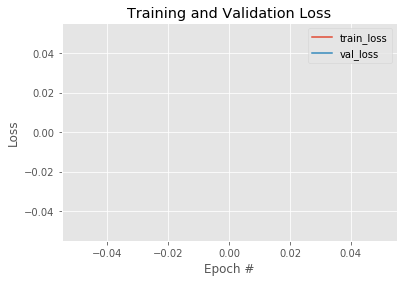

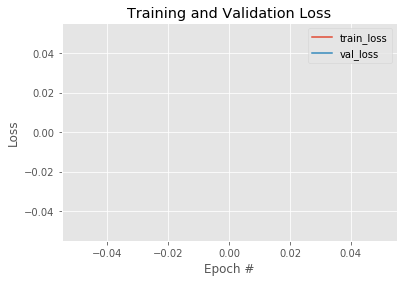

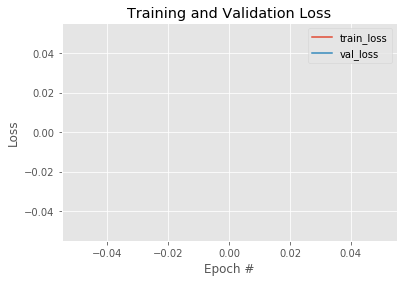

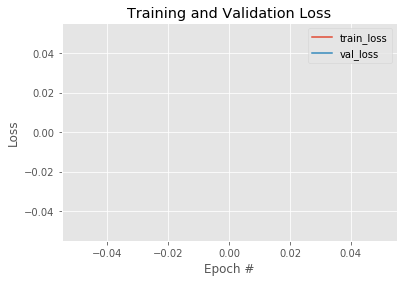

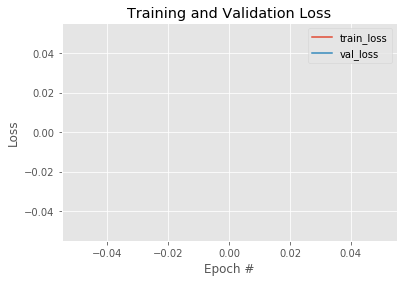

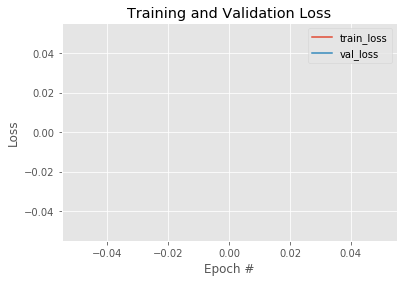

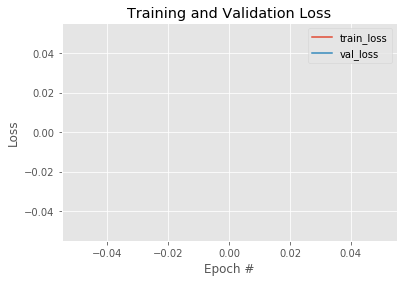

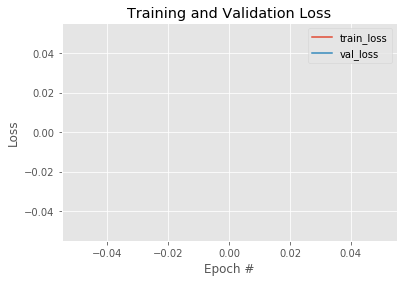

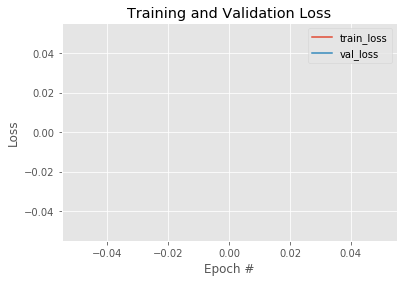

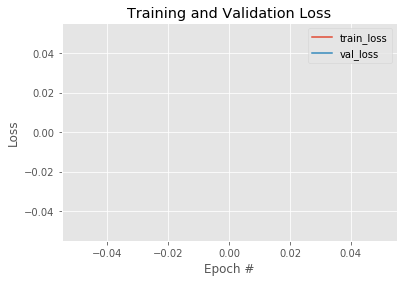

In [116]:
for i in range(n_decay):
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, 250), historiesE2[i].history["loss"], label="train_loss")
    plt.plot(np.arange(0, 250), historiesE2[i].history["val_loss"], label="val_loss")
    plt.title("Training and Validation Loss")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

Hay divergencia en todos los experimentos utilizando la función de activación ReLU.

f) Entrene los modelos considerados en b) y c) utilizando SGD en mini-batches. Experimente con diferentes tamaños del batch. Comente.

In [4]:
n_batches = 21
batch_sizes = np.round(np.linspace(1,X_train_scaled.shape[0],n_batches))

In [5]:
batch_sizes

array([1.000e+00, 4.880e+02, 9.750e+02, 1.463e+03, 1.950e+03, 2.437e+03,
       2.924e+03, 3.411e+03, 3.899e+03, 4.386e+03, 4.873e+03, 5.360e+03,
       5.847e+03, 6.335e+03, 6.822e+03, 7.309e+03, 7.796e+03, 8.283e+03,
       8.771e+03, 9.258e+03, 9.745e+03])

In [6]:
historiesF1 = []

for batch_size in batch_sizes:
    modelF1 = Sequential()
    modelF1.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation="sigmoid"))
    modelF1.add(Dense(1, kernel_initializer='uniform',activation="linear")) 
    modelF1.compile(optimizer=SGD(lr=0.01),loss='mean_squared_error')
    historiesF1.append(modelF1.fit(X_train_scaled,y_train,batch_size=int(batch_size),epochs=250,validation_data=(X_val_scaled, y_val)))

Train on 9745 samples, validate on 4060 samples
Epoch 1/250
9745/9745 [==============================] - 21s 2ms/step - loss: nan - val_loss: nan
Epoch 2/250
9745/9745 [==============================] - 20s 2ms/step - loss: nan - val_loss: nan
Epoch 3/250
9745/9745 [==============================] - 20s 2ms/step - loss: nan - val_loss: nan
Epoch 4/250
9745/9745 [==============================] - 20s 2ms/step - loss: nan - val_loss: nan
Epoch 5/250
9745/9745 [==============================] - 19s 2ms/step - loss: nan - val_loss: nan
Epoch 6/250
9745/9745 [==============================] - 19s 2ms/step - loss: nan - val_loss: nan
Epoch 7/250
9745/9745 [==============================] - 20s 2ms/step - loss: nan - val_loss: nan
Epoch 8/250
9745/9745 [==============================] - 19s 2ms/step - loss: nan - val_loss: nan
Epoch 9/250
9745/9745 [==============================] - 19s 2ms/step - loss: nan - val_loss: nan
Epoch 10/250
9745/9745 [==============================] - 19s 2ms/step

9745/9745 [==============================] - 19s 2ms/step - loss: nan - val_loss: nan
Epoch 166/250
9745/9745 [==============================] - 20s 2ms/step - loss: nan - val_loss: nan
Epoch 167/250
9745/9745 [==============================] - 19s 2ms/step - loss: nan - val_loss: nan
Epoch 168/250
9745/9745 [==============================] - 19s 2ms/step - loss: nan - val_loss: nan
Epoch 169/250
9745/9745 [==============================] - 20s 2ms/step - loss: nan - val_loss: nan
Epoch 170/250
9745/9745 [==============================] - 19s 2ms/step - loss: nan - val_loss: nan
Epoch 171/250
9745/9745 [==============================] - 19s 2ms/step - loss: nan - val_loss: nan
Epoch 172/250
9745/9745 [==============================] - 19s 2ms/step - loss: nan - val_loss: nan
Epoch 173/250
9745/9745 [==============================] - 19s 2ms/step - loss: nan - val_loss: nan
Epoch 174/250
9745/9745 [==============================] - 19s 2ms/step - loss: nan - val_loss: nan
Epoch 175/250


9745/9745 [==============================] - 19s 2ms/step - loss: nan - val_loss: nan
Epoch 248/250
9745/9745 [==============================] - 20s 2ms/step - loss: nan - val_loss: nan
Epoch 249/250
9745/9745 [==============================] - 19s 2ms/step - loss: nan - val_loss: nan
Epoch 250/250
9745/9745 [==============================] - 19s 2ms/step - loss: nan - val_loss: nan
Train on 9745 samples, validate on 4060 samples
Epoch 1/250
9745/9745 [==============================] - 1s 67us/step - loss: 9.0674 - val_loss: 1.2563
Epoch 2/250
9745/9745 [==============================] - 1s 57us/step - loss: 1.3110 - val_loss: 1.0336
Epoch 3/250
9745/9745 [==============================] - 1s 55us/step - loss: 1.1081 - val_loss: 0.8838
Epoch 4/250
9745/9745 [==============================] - 1s 56us/step - loss: 0.9883 - val_loss: 0.7880
Epoch 5/250
9745/9745 [==============================] - 1s 55us/step - loss: 0.9012 - val_loss: 0.7136
Epoch 6/250
9745/9745 [=======================

Epoch 75/250
9745/9745 [==============================] - 1s 57us/step - loss: 0.3168 - val_loss: 0.2821
Epoch 76/250
9745/9745 [==============================] - 1s 58us/step - loss: 0.3115 - val_loss: 0.2807
Epoch 77/250
9745/9745 [==============================] - 1s 58us/step - loss: 0.3089 - val_loss: 0.2763
Epoch 78/250
9745/9745 [==============================] - 1s 57us/step - loss: 0.3053 - val_loss: 0.2736
Epoch 79/250
9745/9745 [==============================] - 1s 56us/step - loss: 0.3019 - val_loss: 0.2723
Epoch 80/250
9745/9745 [==============================] - 1s 55us/step - loss: 0.3005 - val_loss: 0.2715
Epoch 81/250
9745/9745 [==============================] - 1s 56us/step - loss: 0.2963 - val_loss: 0.2672
Epoch 82/250
9745/9745 [==============================] - 1s 56us/step - loss: 0.2926 - val_loss: 0.2688
Epoch 83/250
9745/9745 [==============================] - 1s 57us/step - loss: 0.2911 - val_loss: 0.2621
Epoch 84/250
9745/9745 [==============================]

9745/9745 [==============================] - 1s 58us/step - loss: 0.0923 - val_loss: 0.1085
Epoch 230/250
9745/9745 [==============================] - 1s 58us/step - loss: 0.0921 - val_loss: 0.1090
Epoch 231/250
9745/9745 [==============================] - 1s 59us/step - loss: 0.0917 - val_loss: 0.1082
Epoch 232/250
9745/9745 [==============================] - 1s 59us/step - loss: 0.0909 - val_loss: 0.1083
Epoch 233/250
9745/9745 [==============================] - 1s 56us/step - loss: 0.0909 - val_loss: 0.1074
Epoch 234/250
9745/9745 [==============================] - 1s 57us/step - loss: 0.0899 - val_loss: 0.1093
Epoch 235/250
9745/9745 [==============================] - 1s 58us/step - loss: 0.0896 - val_loss: 0.1070
Epoch 236/250
9745/9745 [==============================] - 1s 61us/step - loss: 0.0893 - val_loss: 0.1054
Epoch 237/250
9745/9745 [==============================] - 1s 56us/step - loss: 0.0888 - val_loss: 0.1059
Epoch 238/250
9745/9745 [==============================] - 1

Epoch 134/250
9745/9745 [==============================] - 1s 53us/step - loss: 0.3762 - val_loss: 0.3324
Epoch 135/250
9745/9745 [==============================] - 1s 54us/step - loss: 0.3747 - val_loss: 0.3337
Epoch 136/250
9745/9745 [==============================] - 1s 53us/step - loss: 0.3729 - val_loss: 0.3287
Epoch 137/250
9745/9745 [==============================] - 1s 53us/step - loss: 0.3704 - val_loss: 0.3274
Epoch 138/250
9745/9745 [==============================] - 1s 55us/step - loss: 0.3690 - val_loss: 0.3254
Epoch 139/250
9745/9745 [==============================] - 1s 53us/step - loss: 0.3673 - val_loss: 0.3239
Epoch 140/250
9745/9745 [==============================] - 1s 54us/step - loss: 0.3659 - val_loss: 0.3229
Epoch 141/250
9745/9745 [==============================] - 1s 54us/step - loss: 0.3644 - val_loss: 0.3220
Epoch 142/250
9745/9745 [==============================] - 1s 52us/step - loss: 0.3618 - val_loss: 0.3244
Epoch 143/250
9745/9745 [=====================

9745/9745 [==============================] - 0s 45us/step - loss: 0.6525 - val_loss: 0.5398
Epoch 39/250
9745/9745 [==============================] - 0s 48us/step - loss: 0.6477 - val_loss: 0.5438
Epoch 40/250
9745/9745 [==============================] - 0s 47us/step - loss: 0.6436 - val_loss: 0.5308
Epoch 41/250
9745/9745 [==============================] - 0s 47us/step - loss: 0.6384 - val_loss: 0.5243
Epoch 42/250
9745/9745 [==============================] - 0s 48us/step - loss: 0.6345 - val_loss: 0.5183
Epoch 43/250
9745/9745 [==============================] - 0s 48us/step - loss: 0.6305 - val_loss: 0.5243
Epoch 44/250
9745/9745 [==============================] - 0s 48us/step - loss: 0.6257 - val_loss: 0.5226
Epoch 45/250
9745/9745 [==============================] - 0s 47us/step - loss: 0.6218 - val_loss: 0.5150
Epoch 46/250
9745/9745 [==============================] - 0s 48us/step - loss: 0.6186 - val_loss: 0.5145
Epoch 47/250
9745/9745 [==============================] - 0s 48us/st

Epoch 116/250
9745/9745 [==============================] - 0s 48us/step - loss: 0.4592 - val_loss: 0.3895
Epoch 117/250
9745/9745 [==============================] - 0s 48us/step - loss: 0.4586 - val_loss: 0.3881
Epoch 118/250
9745/9745 [==============================] - 0s 50us/step - loss: 0.4568 - val_loss: 0.3883
Epoch 119/250
9745/9745 [==============================] - 0s 48us/step - loss: 0.4549 - val_loss: 0.3876
Epoch 120/250
9745/9745 [==============================] - 0s 46us/step - loss: 0.4530 - val_loss: 0.3880
Epoch 121/250
9745/9745 [==============================] - 0s 47us/step - loss: 0.4523 - val_loss: 0.3833
Epoch 122/250
9745/9745 [==============================] - 0s 48us/step - loss: 0.4512 - val_loss: 0.3843
Epoch 123/250
9745/9745 [==============================] - 0s 48us/step - loss: 0.4487 - val_loss: 0.3847
Epoch 124/250
9745/9745 [==============================] - 0s 48us/step - loss: 0.4481 - val_loss: 0.3839
Epoch 125/250
9745/9745 [=====================

9745/9745 [==============================] - 0s 45us/step - loss: 0.8810 - val_loss: 0.7175
Epoch 21/250
9745/9745 [==============================] - 0s 49us/step - loss: 0.8655 - val_loss: 0.7105
Epoch 22/250
9745/9745 [==============================] - 0s 47us/step - loss: 0.8514 - val_loss: 0.6987
Epoch 23/250
9745/9745 [==============================] - 0s 48us/step - loss: 0.8385 - val_loss: 0.6863
Epoch 24/250
9745/9745 [==============================] - 0s 47us/step - loss: 0.8253 - val_loss: 0.6796
Epoch 25/250
9745/9745 [==============================] - 0s 48us/step - loss: 0.8137 - val_loss: 0.6740
Epoch 26/250
9745/9745 [==============================] - 0s 48us/step - loss: 0.8030 - val_loss: 0.6557
Epoch 27/250
9745/9745 [==============================] - 0s 49us/step - loss: 0.7934 - val_loss: 0.6544
Epoch 28/250
9745/9745 [==============================] - 0s 49us/step - loss: 0.7834 - val_loss: 0.6412
Epoch 29/250
9745/9745 [==============================] - 0s 49us/st

9745/9745 [==============================] - 0s 47us/step - loss: 0.4461 - val_loss: 0.3837
Epoch 176/250
9745/9745 [==============================] - 0s 47us/step - loss: 0.4448 - val_loss: 0.3815
Epoch 177/250
9745/9745 [==============================] - 0s 48us/step - loss: 0.4438 - val_loss: 0.3800
Epoch 178/250
9745/9745 [==============================] - 0s 47us/step - loss: 0.4426 - val_loss: 0.3802
Epoch 179/250
9745/9745 [==============================] - 0s 49us/step - loss: 0.4417 - val_loss: 0.3792
Epoch 180/250
9745/9745 [==============================] - 0s 46us/step - loss: 0.4406 - val_loss: 0.3779
Epoch 181/250
9745/9745 [==============================] - 0s 48us/step - loss: 0.4397 - val_loss: 0.3778
Epoch 182/250
9745/9745 [==============================] - 0s 49us/step - loss: 0.4383 - val_loss: 0.3769
Epoch 183/250
9745/9745 [==============================] - 0s 47us/step - loss: 0.4377 - val_loss: 0.3764
Epoch 184/250
9745/9745 [==============================] - 0

Epoch 2/250
9745/9745 [==============================] - 0s 49us/step - loss: 1.7496 - val_loss: 1.5017
Epoch 3/250
9745/9745 [==============================] - 0s 48us/step - loss: 1.6237 - val_loss: 1.4021
Epoch 4/250
9745/9745 [==============================] - 0s 50us/step - loss: 1.5369 - val_loss: 1.3183
Epoch 5/250
9745/9745 [==============================] - 0s 48us/step - loss: 1.4659 - val_loss: 1.2521
Epoch 6/250
9745/9745 [==============================] - 0s 49us/step - loss: 1.4054 - val_loss: 1.2008
Epoch 7/250
9745/9745 [==============================] - 0s 51us/step - loss: 1.3529 - val_loss: 1.1575
Epoch 8/250
9745/9745 [==============================] - 0s 48us/step - loss: 1.3075 - val_loss: 1.1088
Epoch 9/250
9745/9745 [==============================] - 0s 51us/step - loss: 1.2646 - val_loss: 1.0682
Epoch 10/250
9745/9745 [==============================] - 0s 50us/step - loss: 1.2263 - val_loss: 1.0292
Epoch 11/250
9745/9745 [==============================] - 0s 50

9745/9745 [==============================] - 0s 49us/step - loss: 0.6193 - val_loss: 0.5054
Epoch 81/250
9745/9745 [==============================] - 0s 49us/step - loss: 0.6171 - val_loss: 0.5094
Epoch 82/250
9745/9745 [==============================] - 0s 48us/step - loss: 0.6148 - val_loss: 0.5059
Epoch 83/250
9745/9745 [==============================] - 0s 50us/step - loss: 0.6127 - val_loss: 0.5027
Epoch 84/250
9745/9745 [==============================] - 0s 50us/step - loss: 0.6104 - val_loss: 0.5053
Epoch 85/250
9745/9745 [==============================] - 0s 49us/step - loss: 0.6089 - val_loss: 0.4995
Epoch 86/250
9745/9745 [==============================] - 0s 50us/step - loss: 0.6077 - val_loss: 0.5027
Epoch 87/250
9745/9745 [==============================] - 0s 50us/step - loss: 0.6046 - val_loss: 0.4988
Epoch 88/250
9745/9745 [==============================] - 0s 48us/step - loss: 0.6027 - val_loss: 0.4982
Epoch 89/250
9745/9745 [==============================] - 0s 50us/st

9745/9745 [==============================] - 0s 45us/step - loss: 0.4312 - val_loss: 0.3653
Epoch 235/250
9745/9745 [==============================] - 0s 48us/step - loss: 0.4295 - val_loss: 0.3649
Epoch 236/250
9745/9745 [==============================] - 0s 49us/step - loss: 0.4293 - val_loss: 0.3644
Epoch 237/250
9745/9745 [==============================] - 0s 47us/step - loss: 0.4282 - val_loss: 0.3632
Epoch 238/250
9745/9745 [==============================] - 0s 50us/step - loss: 0.4273 - val_loss: 0.3628
Epoch 239/250
9745/9745 [==============================] - 0s 50us/step - loss: 0.4265 - val_loss: 0.3629
Epoch 240/250
9745/9745 [==============================] - 0s 50us/step - loss: 0.4255 - val_loss: 0.3625
Epoch 241/250
9745/9745 [==============================] - 0s 50us/step - loss: 0.4248 - val_loss: 0.3633
Epoch 242/250
9745/9745 [==============================] - 0s 49us/step - loss: 0.4235 - val_loss: 0.3598
Epoch 243/250
9745/9745 [==============================] - 0

Epoch 139/250
9745/9745 [==============================] - 0s 48us/step - loss: 0.5334 - val_loss: 0.4522
Epoch 140/250
9745/9745 [==============================] - 1s 55us/step - loss: 0.5328 - val_loss: 0.4567
Epoch 141/250
9745/9745 [==============================] - 0s 46us/step - loss: 0.5319 - val_loss: 0.4554
Epoch 142/250
9745/9745 [==============================] - 0s 49us/step - loss: 0.5301 - val_loss: 0.4482
Epoch 143/250
9745/9745 [==============================] - 0s 49us/step - loss: 0.5285 - val_loss: 0.4496
Epoch 144/250
9745/9745 [==============================] - 1s 54us/step - loss: 0.5276 - val_loss: 0.4460
Epoch 145/250
9745/9745 [==============================] - 0s 51us/step - loss: 0.5263 - val_loss: 0.4423
Epoch 146/250
9745/9745 [==============================] - 0s 50us/step - loss: 0.5253 - val_loss: 0.4451
Epoch 147/250
9745/9745 [==============================] - 0s 50us/step - loss: 0.5239 - val_loss: 0.4460
Epoch 148/250
9745/9745 [=====================

9745/9745 [==============================] - 0s 50us/step - loss: 0.8153 - val_loss: 0.6789
Epoch 44/250
9745/9745 [==============================] - 1s 53us/step - loss: 0.8104 - val_loss: 0.6625
Epoch 45/250
9745/9745 [==============================] - 1s 52us/step - loss: 0.8030 - val_loss: 0.6541
Epoch 46/250
9745/9745 [==============================] - 1s 53us/step - loss: 0.7976 - val_loss: 0.6530
Epoch 47/250
9745/9745 [==============================] - 1s 54us/step - loss: 0.7915 - val_loss: 0.6481
Epoch 48/250
9745/9745 [==============================] - 1s 54us/step - loss: 0.7860 - val_loss: 0.6463
Epoch 49/250
9745/9745 [==============================] - 1s 54us/step - loss: 0.7814 - val_loss: 0.6492
Epoch 50/250
9745/9745 [==============================] - 0s 51us/step - loss: 0.7769 - val_loss: 0.6353
Epoch 51/250
9745/9745 [==============================] - 1s 52us/step - loss: 0.7716 - val_loss: 0.6332
Epoch 52/250
9745/9745 [==============================] - 1s 53us/st

Epoch 121/250
9745/9745 [==============================] - 1s 51us/step - loss: 0.6024 - val_loss: 0.4988
Epoch 122/250
9745/9745 [==============================] - 0s 49us/step - loss: 0.6010 - val_loss: 0.4978
Epoch 123/250
9745/9745 [==============================] - 1s 54us/step - loss: 0.5996 - val_loss: 0.4980
Epoch 124/250
9745/9745 [==============================] - 0s 51us/step - loss: 0.5983 - val_loss: 0.4968
Epoch 125/250
9745/9745 [==============================] - 0s 49us/step - loss: 0.5972 - val_loss: 0.4943
Epoch 126/250
9745/9745 [==============================] - 1s 53us/step - loss: 0.5960 - val_loss: 0.4923
Epoch 127/250
9745/9745 [==============================] - 1s 52us/step - loss: 0.5943 - val_loss: 0.4932
Epoch 128/250
9745/9745 [==============================] - 1s 52us/step - loss: 0.5941 - val_loss: 0.4943
Epoch 129/250
9745/9745 [==============================] - 1s 54us/step - loss: 0.5922 - val_loss: 0.4895
Epoch 130/250
9745/9745 [=====================

9745/9745 [==============================] - 1s 52us/step - loss: 1.0008 - val_loss: 0.8205
Epoch 26/250
9745/9745 [==============================] - 1s 54us/step - loss: 0.9871 - val_loss: 0.8098
Epoch 27/250
9745/9745 [==============================] - 1s 55us/step - loss: 0.9731 - val_loss: 0.8062
Epoch 28/250
9745/9745 [==============================] - 1s 56us/step - loss: 0.9611 - val_loss: 0.7845
Epoch 29/250
9745/9745 [==============================] - 1s 56us/step - loss: 0.9483 - val_loss: 0.7776
Epoch 30/250
9745/9745 [==============================] - 1s 56us/step - loss: 0.9369 - val_loss: 0.7701
Epoch 31/250
9745/9745 [==============================] - 1s 56us/step - loss: 0.9271 - val_loss: 0.7689
Epoch 32/250
9745/9745 [==============================] - 1s 55us/step - loss: 0.9168 - val_loss: 0.7498
Epoch 33/250
9745/9745 [==============================] - 1s 54us/step - loss: 0.9049 - val_loss: 0.7345
Epoch 34/250
9745/9745 [==============================] - 1s 56us/st

9745/9745 [==============================] - 1s 56us/step - loss: 0.6303 - val_loss: 0.5138
Epoch 104/250
9745/9745 [==============================] - 1s 56us/step - loss: 0.6291 - val_loss: 0.5161
Epoch 105/250
9745/9745 [==============================] - 1s 55us/step - loss: 0.6268 - val_loss: 0.5202
Epoch 106/250
9745/9745 [==============================] - 1s 57us/step - loss: 0.6261 - val_loss: 0.5133
Epoch 107/250
9745/9745 [==============================] - 1s 56us/step - loss: 0.6238 - val_loss: 0.5201
Epoch 108/250
9745/9745 [==============================] - 1s 56us/step - loss: 0.6236 - val_loss: 0.5237
Epoch 109/250
9745/9745 [==============================] - 1s 56us/step - loss: 0.6212 - val_loss: 0.5100
Epoch 110/250
9745/9745 [==============================] - 1s 56us/step - loss: 0.6189 - val_loss: 0.5112
Epoch 111/250
9745/9745 [==============================] - 1s 56us/step - loss: 0.6169 - val_loss: 0.5056
Epoch 112/250
9745/9745 [==============================] - 1

9745/9745 [==============================] - 1s 55us/step - loss: 1.4832 - val_loss: 1.2966
Epoch 8/250
9745/9745 [==============================] - 1s 56us/step - loss: 1.4356 - val_loss: 1.2419
Epoch 9/250
9745/9745 [==============================] - 1s 56us/step - loss: 1.3957 - val_loss: 1.2189
Epoch 10/250
9745/9745 [==============================] - 1s 55us/step - loss: 1.3567 - val_loss: 1.1644
Epoch 11/250
9745/9745 [==============================] - 1s 56us/step - loss: 1.3235 - val_loss: 1.1259
Epoch 12/250
9745/9745 [==============================] - 1s 53us/step - loss: 1.2877 - val_loss: 1.1080
Epoch 13/250
9745/9745 [==============================] - 1s 55us/step - loss: 1.2574 - val_loss: 1.0744
Epoch 14/250
9745/9745 [==============================] - 1s 56us/step - loss: 1.2291 - val_loss: 1.0386
Epoch 15/250
9745/9745 [==============================] - 1s 56us/step - loss: 1.2047 - val_loss: 1.0149
Epoch 16/250
9745/9745 [==============================] - 1s 57us/step

9745/9745 [==============================] - 1s 54us/step - loss: 0.5566 - val_loss: 0.4678
Epoch 163/250
9745/9745 [==============================] - 1s 55us/step - loss: 0.5550 - val_loss: 0.4703
Epoch 164/250
9745/9745 [==============================] - 1s 56us/step - loss: 0.5544 - val_loss: 0.4689
Epoch 165/250
9745/9745 [==============================] - 1s 57us/step - loss: 0.5531 - val_loss: 0.4640
Epoch 166/250
9745/9745 [==============================] - 1s 56us/step - loss: 0.5523 - val_loss: 0.4651
Epoch 167/250
9745/9745 [==============================] - 1s 56us/step - loss: 0.5529 - val_loss: 0.4655
Epoch 168/250
9745/9745 [==============================] - 1s 55us/step - loss: 0.5501 - val_loss: 0.4622
Epoch 169/250
9745/9745 [==============================] - 1s 58us/step - loss: 0.5499 - val_loss: 0.4636
Epoch 170/250
9745/9745 [==============================] - 0s 51us/step - loss: 0.5482 - val_loss: 0.4645
Epoch 171/250
9745/9745 [==============================] - 1

9745/9745 [==============================] - 1s 57us/step - loss: 0.8167 - val_loss: 0.6741
Epoch 67/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.8130 - val_loss: 0.6691
Epoch 68/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.8088 - val_loss: 0.6630
Epoch 69/250
9745/9745 [==============================] - 1s 60us/step - loss: 0.8044 - val_loss: 0.6606
Epoch 70/250
9745/9745 [==============================] - 1s 61us/step - loss: 0.8015 - val_loss: 0.6623
Epoch 71/250
9745/9745 [==============================] - 1s 61us/step - loss: 0.7978 - val_loss: 0.6539
Epoch 72/250
9745/9745 [==============================] - 1s 60us/step - loss: 0.7940 - val_loss: 0.6551
Epoch 73/250
9745/9745 [==============================] - 1s 61us/step - loss: 0.7897 - val_loss: 0.6462
Epoch 74/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.7861 - val_loss: 0.6466
Epoch 75/250
9745/9745 [==============================] - 1s 58us/st

9745/9745 [==============================] - 1s 58us/step - loss: 0.5714 - val_loss: 0.4771
Epoch 221/250
9745/9745 [==============================] - 1s 59us/step - loss: 0.5707 - val_loss: 0.4760
Epoch 222/250
9745/9745 [==============================] - 1s 60us/step - loss: 0.5707 - val_loss: 0.4764
Epoch 223/250
9745/9745 [==============================] - 1s 58us/step - loss: 0.5692 - val_loss: 0.4739
Epoch 224/250
9745/9745 [==============================] - 1s 60us/step - loss: 0.5683 - val_loss: 0.4745
Epoch 225/250
9745/9745 [==============================] - 1s 60us/step - loss: 0.5676 - val_loss: 0.4737
Epoch 226/250
9745/9745 [==============================] - 1s 59us/step - loss: 0.5670 - val_loss: 0.4715
Epoch 227/250
9745/9745 [==============================] - 1s 59us/step - loss: 0.5663 - val_loss: 0.4719
Epoch 228/250
9745/9745 [==============================] - 1s 59us/step - loss: 0.5654 - val_loss: 0.4724
Epoch 229/250
9745/9745 [==============================] - 1

Epoch 125/250
9745/9745 [==============================] - 1s 57us/step - loss: 0.6642 - val_loss: 0.5523
Epoch 126/250
9745/9745 [==============================] - 1s 60us/step - loss: 0.6627 - val_loss: 0.5500
Epoch 127/250
9745/9745 [==============================] - 1s 59us/step - loss: 0.6613 - val_loss: 0.5487
Epoch 128/250
9745/9745 [==============================] - 1s 58us/step - loss: 0.6598 - val_loss: 0.5465
Epoch 129/250
9745/9745 [==============================] - 1s 59us/step - loss: 0.6585 - val_loss: 0.5471
Epoch 130/250
9745/9745 [==============================] - 1s 59us/step - loss: 0.6570 - val_loss: 0.5456
Epoch 131/250
9745/9745 [==============================] - 1s 60us/step - loss: 0.6556 - val_loss: 0.5448
Epoch 132/250
9745/9745 [==============================] - 1s 59us/step - loss: 0.6542 - val_loss: 0.5436
Epoch 133/250
9745/9745 [==============================] - 1s 59us/step - loss: 0.6529 - val_loss: 0.5435
Epoch 134/250
9745/9745 [=====================

9745/9745 [==============================] - 1s 56us/step - loss: 1.0652 - val_loss: 0.8858
Epoch 30/250
9745/9745 [==============================] - 1s 60us/step - loss: 1.0514 - val_loss: 0.8837
Epoch 31/250
9745/9745 [==============================] - 1s 61us/step - loss: 1.0401 - val_loss: 0.8718
Epoch 32/250
9745/9745 [==============================] - 1s 61us/step - loss: 1.0294 - val_loss: 0.8644
Epoch 33/250
9745/9745 [==============================] - 1s 60us/step - loss: 1.0191 - val_loss: 0.8468
Epoch 34/250
9745/9745 [==============================] - 1s 59us/step - loss: 1.0100 - val_loss: 0.8408
Epoch 35/250
9745/9745 [==============================] - 1s 61us/step - loss: 0.9992 - val_loss: 0.8306
Epoch 36/250
9745/9745 [==============================] - 1s 61us/step - loss: 0.9900 - val_loss: 0.8231
Epoch 37/250
9745/9745 [==============================] - 1s 61us/step - loss: 0.9805 - val_loss: 0.8205
Epoch 38/250
9745/9745 [==============================] - 1s 61us/st

9745/9745 [==============================] - 1s 61us/step - loss: 0.6998 - val_loss: 0.5735
Epoch 108/250
9745/9745 [==============================] - 1s 61us/step - loss: 0.6980 - val_loss: 0.5744
Epoch 109/250
9745/9745 [==============================] - 1s 61us/step - loss: 0.6961 - val_loss: 0.5699
Epoch 110/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.6941 - val_loss: 0.5708
Epoch 111/250
9745/9745 [==============================] - 1s 61us/step - loss: 0.6922 - val_loss: 0.5664
Epoch 112/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.6907 - val_loss: 0.5644
Epoch 113/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.6888 - val_loss: 0.5651
Epoch 114/250
9745/9745 [==============================] - 1s 60us/step - loss: 0.6870 - val_loss: 0.5634
Epoch 115/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.6857 - val_loss: 0.5664
Epoch 116/250
9745/9745 [==============================] - 1

9745/9745 [==============================] - 1s 58us/step - loss: 1.4192 - val_loss: 1.2273
Epoch 12/250
9745/9745 [==============================] - 1s 61us/step - loss: 1.3890 - val_loss: 1.2081
Epoch 13/250
9745/9745 [==============================] - 1s 62us/step - loss: 1.3614 - val_loss: 1.1760
Epoch 14/250
9745/9745 [==============================] - 1s 61us/step - loss: 1.3356 - val_loss: 1.1535
Epoch 15/250
9745/9745 [==============================] - 1s 62us/step - loss: 1.3112 - val_loss: 1.1279
Epoch 16/250
9745/9745 [==============================] - 1s 61us/step - loss: 1.2881 - val_loss: 1.1083
Epoch 17/250
9745/9745 [==============================] - 1s 61us/step - loss: 1.2660 - val_loss: 1.0839
Epoch 18/250
9745/9745 [==============================] - 1s 62us/step - loss: 1.2470 - val_loss: 1.0581
Epoch 19/250
9745/9745 [==============================] - 1s 62us/step - loss: 1.2276 - val_loss: 1.0462
Epoch 20/250
9745/9745 [==============================] - 1s 61us/st

9745/9745 [==============================] - 1s 60us/step - loss: 0.6135 - val_loss: 0.5090
Epoch 167/250
9745/9745 [==============================] - 1s 59us/step - loss: 0.6126 - val_loss: 0.5058
Epoch 168/250
9745/9745 [==============================] - 1s 63us/step - loss: 0.6123 - val_loss: 0.5044
Epoch 169/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.6107 - val_loss: 0.5059
Epoch 170/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.6093 - val_loss: 0.5049
Epoch 171/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.6083 - val_loss: 0.5035
Epoch 172/250
9745/9745 [==============================] - 1s 61us/step - loss: 0.6073 - val_loss: 0.5020
Epoch 173/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.6063 - val_loss: 0.5021
Epoch 174/250
9745/9745 [==============================] - 1s 61us/step - loss: 0.6053 - val_loss: 0.5015
Epoch 175/250
9745/9745 [==============================] - 1

9745/9745 [==============================] - 1s 60us/step - loss: 0.7994 - val_loss: 0.6581
Epoch 71/250
9745/9745 [==============================] - 1s 59us/step - loss: 0.7957 - val_loss: 0.6554
Epoch 72/250
9745/9745 [==============================] - 1s 61us/step - loss: 0.7924 - val_loss: 0.6572
Epoch 73/250
9745/9745 [==============================] - 1s 63us/step - loss: 0.7889 - val_loss: 0.6481
Epoch 74/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.7850 - val_loss: 0.6405
Epoch 75/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.7819 - val_loss: 0.6405
Epoch 76/250
9745/9745 [==============================] - 1s 63us/step - loss: 0.7783 - val_loss: 0.6433
Epoch 77/250
9745/9745 [==============================] - 1s 61us/step - loss: 0.7753 - val_loss: 0.6339
Epoch 78/250
9745/9745 [==============================] - 1s 63us/step - loss: 0.7724 - val_loss: 0.6337
Epoch 79/250
9745/9745 [==============================] - 1s 61us/st

9745/9745 [==============================] - 1s 61us/step - loss: 0.5687 - val_loss: 0.4731
Epoch 225/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.5675 - val_loss: 0.4738
Epoch 226/250
9745/9745 [==============================] - 1s 63us/step - loss: 0.5666 - val_loss: 0.4722
Epoch 227/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.5662 - val_loss: 0.4728
Epoch 228/250
9745/9745 [==============================] - 1s 63us/step - loss: 0.5654 - val_loss: 0.4732
Epoch 229/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.5648 - val_loss: 0.4738
Epoch 230/250
9745/9745 [==============================] - 1s 63us/step - loss: 0.5639 - val_loss: 0.4688
Epoch 231/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.5635 - val_loss: 0.4687
Epoch 232/250
9745/9745 [==============================] - 1s 63us/step - loss: 0.5624 - val_loss: 0.4723
Epoch 233/250
9745/9745 [==============================] - 1

Epoch 129/250
9745/9745 [==============================] - 1s 60us/step - loss: 0.6514 - val_loss: 0.5370
Epoch 130/250
9745/9745 [==============================] - 1s 63us/step - loss: 0.6496 - val_loss: 0.5385
Epoch 131/250
9745/9745 [==============================] - 1s 64us/step - loss: 0.6483 - val_loss: 0.5359
Epoch 132/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.6472 - val_loss: 0.5310
Epoch 133/250
9745/9745 [==============================] - 1s 64us/step - loss: 0.6463 - val_loss: 0.5340
Epoch 134/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.6447 - val_loss: 0.5325
Epoch 135/250
9745/9745 [==============================] - 1s 64us/step - loss: 0.6431 - val_loss: 0.5293
Epoch 136/250
9745/9745 [==============================] - 1s 64us/step - loss: 0.6421 - val_loss: 0.5313
Epoch 137/250
9745/9745 [==============================] - 1s 60us/step - loss: 0.6411 - val_loss: 0.5283
Epoch 138/250
9745/9745 [=====================

9745/9745 [==============================] - 1s 58us/step - loss: 1.0356 - val_loss: 0.8729
Epoch 34/250
9745/9745 [==============================] - 1s 62us/step - loss: 1.0248 - val_loss: 0.8749
Epoch 35/250
9745/9745 [==============================] - 1s 63us/step - loss: 1.0174 - val_loss: 0.8641
Epoch 36/250
9745/9745 [==============================] - 1s 61us/step - loss: 1.0046 - val_loss: 0.8418
Epoch 37/250
9745/9745 [==============================] - 1s 61us/step - loss: 0.9927 - val_loss: 0.8342
Epoch 38/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.9829 - val_loss: 0.8256
Epoch 39/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.9735 - val_loss: 0.8156
Epoch 40/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.9644 - val_loss: 0.8063
Epoch 41/250
9745/9745 [==============================] - 1s 60us/step - loss: 0.9555 - val_loss: 0.7979
Epoch 42/250
9745/9745 [==============================] - 1s 63us/st

9745/9745 [==============================] - 1s 60us/step - loss: 0.6845 - val_loss: 0.5629
Epoch 112/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.6830 - val_loss: 0.5634
Epoch 113/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.6810 - val_loss: 0.5623
Epoch 114/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.6795 - val_loss: 0.5637
Epoch 115/250
9745/9745 [==============================] - 1s 63us/step - loss: 0.6776 - val_loss: 0.5622
Epoch 116/250
9745/9745 [==============================] - 1s 63us/step - loss: 0.6758 - val_loss: 0.5584
Epoch 117/250
9745/9745 [==============================] - 1s 60us/step - loss: 0.6749 - val_loss: 0.5589
Epoch 118/250
9745/9745 [==============================] - 1s 63us/step - loss: 0.6728 - val_loss: 0.5618
Epoch 119/250
9745/9745 [==============================] - 1s 63us/step - loss: 0.6718 - val_loss: 0.5607
Epoch 120/250
9745/9745 [==============================] - 1

9745/9745 [==============================] - 1s 61us/step - loss: 1.3218 - val_loss: 1.1318
Epoch 16/250
9745/9745 [==============================] - 1s 62us/step - loss: 1.2993 - val_loss: 1.1175
Epoch 17/250
9745/9745 [==============================] - 1s 64us/step - loss: 1.2775 - val_loss: 1.0936
Epoch 18/250
9745/9745 [==============================] - 1s 64us/step - loss: 1.2567 - val_loss: 1.0876
Epoch 19/250
9745/9745 [==============================] - 1s 64us/step - loss: 1.2399 - val_loss: 1.0634
Epoch 20/250
9745/9745 [==============================] - 1s 62us/step - loss: 1.2183 - val_loss: 1.0322
Epoch 21/250
9745/9745 [==============================] - 1s 61us/step - loss: 1.1993 - val_loss: 1.0258
Epoch 22/250
9745/9745 [==============================] - 1s 63us/step - loss: 1.1833 - val_loss: 1.0037
Epoch 23/250
9745/9745 [==============================] - 1s 63us/step - loss: 1.1660 - val_loss: 0.9917
Epoch 24/250
9745/9745 [==============================] - 1s 64us/st

9745/9745 [==============================] - 1s 61us/step - loss: 0.6159 - val_loss: 0.5126
Epoch 171/250
9745/9745 [==============================] - 1s 60us/step - loss: 0.6151 - val_loss: 0.5095
Epoch 172/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.6145 - val_loss: 0.5110
Epoch 173/250
9745/9745 [==============================] - 1s 63us/step - loss: 0.6132 - val_loss: 0.5104
Epoch 174/250
9745/9745 [==============================] - 1s 64us/step - loss: 0.6122 - val_loss: 0.5083
Epoch 175/250
9745/9745 [==============================] - 1s 67us/step - loss: 0.6112 - val_loss: 0.5058
Epoch 176/250
9745/9745 [==============================] - 1s 67us/step - loss: 0.6102 - val_loss: 0.5046
Epoch 177/250
9745/9745 [==============================] - 1s 65us/step - loss: 0.6108 - val_loss: 0.5054
Epoch 178/250
9745/9745 [==============================] - 1s 61us/step - loss: 0.6084 - val_loss: 0.5051
Epoch 179/250
9745/9745 [==============================] - 1

9745/9745 [==============================] - 1s 60us/step - loss: 0.7794 - val_loss: 0.6360
Epoch 75/250
9745/9745 [==============================] - 1s 65us/step - loss: 0.7761 - val_loss: 0.6409
Epoch 76/250
9745/9745 [==============================] - 1s 65us/step - loss: 0.7737 - val_loss: 0.6478
Epoch 77/250
9745/9745 [==============================] - 1s 65us/step - loss: 0.7726 - val_loss: 0.6302
Epoch 78/250
9745/9745 [==============================] - 1s 61us/step - loss: 0.7676 - val_loss: 0.6208
Epoch 79/250
9745/9745 [==============================] - 1s 65us/step - loss: 0.7688 - val_loss: 0.6299
Epoch 80/250
9745/9745 [==============================] - 1s 62us/step - loss: 0.7606 - val_loss: 0.6235
Epoch 81/250
9745/9745 [==============================] - 1s 64us/step - loss: 0.7582 - val_loss: 0.6191
Epoch 82/250
9745/9745 [==============================] - 1s 61us/step - loss: 0.7549 - val_loss: 0.6211
Epoch 83/250
9745/9745 [==============================] - 1s 65us/st

9745/9745 [==============================] - 1s 61us/step - loss: 0.5640 - val_loss: 0.4700
Epoch 229/250
9745/9745 [==============================] - 1s 63us/step - loss: 0.5624 - val_loss: 0.4689
Epoch 230/250
9745/9745 [==============================] - 1s 64us/step - loss: 0.5618 - val_loss: 0.4670
Epoch 231/250
9745/9745 [==============================] - 1s 65us/step - loss: 0.5610 - val_loss: 0.4651
Epoch 232/250
9745/9745 [==============================] - 1s 65us/step - loss: 0.5614 - val_loss: 0.4668
Epoch 233/250
9745/9745 [==============================] - 1s 64us/step - loss: 0.5601 - val_loss: 0.4661
Epoch 234/250
9745/9745 [==============================] - 1s 64us/step - loss: 0.5596 - val_loss: 0.4667
Epoch 235/250
9745/9745 [==============================] - 1s 64us/step - loss: 0.5596 - val_loss: 0.4657
Epoch 236/250
9745/9745 [==============================] - 1s 65us/step - loss: 0.5581 - val_loss: 0.4634
Epoch 237/250
9745/9745 [==============================] - 1

Epoch 133/250
9745/9745 [==============================] - 1s 65us/step - loss: 0.6486 - val_loss: 0.5334
Epoch 134/250
9745/9745 [==============================] - 1s 64us/step - loss: 0.6474 - val_loss: 0.5454
Epoch 135/250
9745/9745 [==============================] - 1s 67us/step - loss: 0.6483 - val_loss: 0.5303
Epoch 136/250
9745/9745 [==============================] - 1s 68us/step - loss: 0.6430 - val_loss: 0.5354
Epoch 137/250
9745/9745 [==============================] - 1s 65us/step - loss: 0.6417 - val_loss: 0.5388
Epoch 138/250
9745/9745 [==============================] - 1s 68us/step - loss: 0.6405 - val_loss: 0.5334
Epoch 139/250
9745/9745 [==============================] - 1s 67us/step - loss: 0.6384 - val_loss: 0.5406
Epoch 140/250
9745/9745 [==============================] - 1s 68us/step - loss: 0.6389 - val_loss: 0.5316
Epoch 141/250
9745/9745 [==============================] - 1s 67us/step - loss: 0.6362 - val_loss: 0.5366
Epoch 142/250
9745/9745 [=====================

Epoch 38/250
9745/9745 [==============================] - 1s 65us/step - loss: 1.2375 - val_loss: 1.0599
Epoch 39/250
9745/9745 [==============================] - 1s 67us/step - loss: 1.2276 - val_loss: 1.0505
Epoch 40/250
9745/9745 [==============================] - 1s 67us/step - loss: 1.2180 - val_loss: 1.0414
Epoch 41/250
9745/9745 [==============================] - 1s 67us/step - loss: 1.2086 - val_loss: 1.0324
Epoch 42/250
9745/9745 [==============================] - 1s 68us/step - loss: 1.1995 - val_loss: 1.0237
Epoch 43/250
9745/9745 [==============================] - 1s 66us/step - loss: 1.1905 - val_loss: 1.0151
Epoch 44/250
9745/9745 [==============================] - 1s 68us/step - loss: 1.1817 - val_loss: 1.0068
Epoch 45/250
9745/9745 [==============================] - 1s 67us/step - loss: 1.1731 - val_loss: 0.9986
Epoch 46/250
9745/9745 [==============================] - 1s 68us/step - loss: 1.1647 - val_loss: 0.9906
Epoch 47/250
9745/9745 [==============================]

Epoch 116/250
9745/9745 [==============================] - 1s 66us/step - loss: 0.8375 - val_loss: 0.6897
Epoch 117/250
9745/9745 [==============================] - 1s 69us/step - loss: 0.8350 - val_loss: 0.6875
Epoch 118/250
9745/9745 [==============================] - 1s 66us/step - loss: 0.8325 - val_loss: 0.6853
Epoch 119/250
9745/9745 [==============================] - 1s 68us/step - loss: 0.8300 - val_loss: 0.6832
Epoch 120/250
9745/9745 [==============================] - 1s 69us/step - loss: 0.8276 - val_loss: 0.6811
Epoch 121/250
9745/9745 [==============================] - 1s 66us/step - loss: 0.8252 - val_loss: 0.6790
Epoch 122/250
9745/9745 [==============================] - 1s 69us/step - loss: 0.8229 - val_loss: 0.6770
Epoch 123/250
9745/9745 [==============================] - 1s 67us/step - loss: 0.8206 - val_loss: 0.6750
Epoch 124/250
9745/9745 [==============================] - 1s 66us/step - loss: 0.8183 - val_loss: 0.6730
Epoch 125/250
9745/9745 [=====================

Epoch 194/250
9745/9745 [==============================] - 1s 64us/step - loss: 0.7092 - val_loss: 0.5822
Epoch 195/250
9745/9745 [==============================] - 1s 67us/step - loss: 0.7081 - val_loss: 0.5813
Epoch 196/250
9745/9745 [==============================] - 1s 66us/step - loss: 0.7070 - val_loss: 0.5805
Epoch 197/250
9745/9745 [==============================] - 1s 66us/step - loss: 0.7060 - val_loss: 0.5797
Epoch 198/250
9745/9745 [==============================] - 1s 66us/step - loss: 0.7049 - val_loss: 0.5788
Epoch 199/250
9745/9745 [==============================] - 1s 67us/step - loss: 0.7039 - val_loss: 0.5780
Epoch 200/250
9745/9745 [==============================] - 1s 71us/step - loss: 0.7029 - val_loss: 0.5772
Epoch 201/250
9745/9745 [==============================] - 1s 69us/step - loss: 0.7018 - val_loss: 0.5764
Epoch 202/250
9745/9745 [==============================] - 1s 67us/step - loss: 0.7008 - val_loss: 0.5756
Epoch 203/250
9745/9745 [=====================

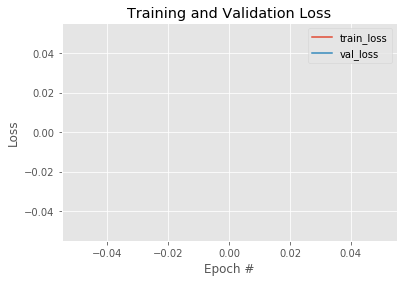

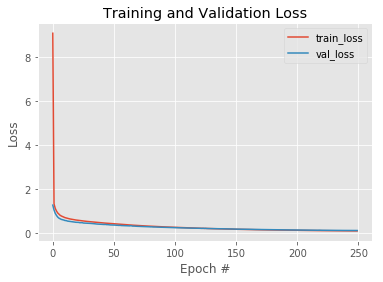

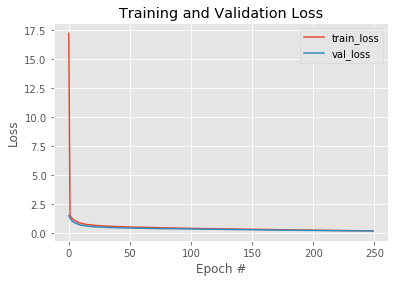

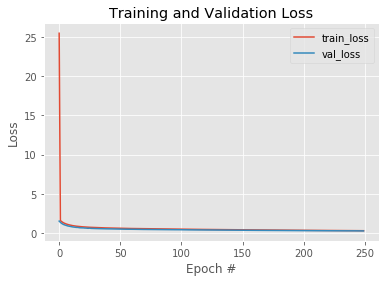

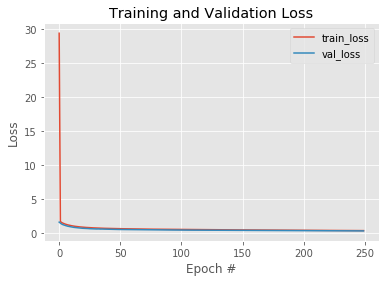

...

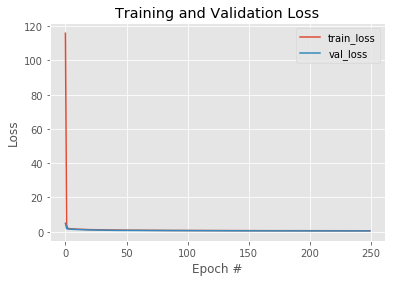

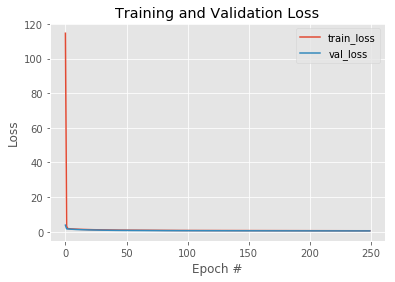

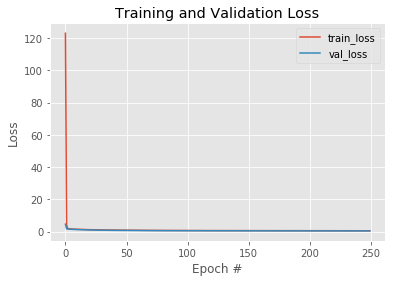

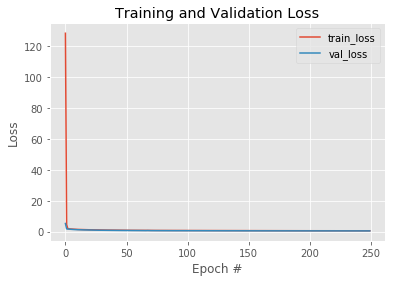

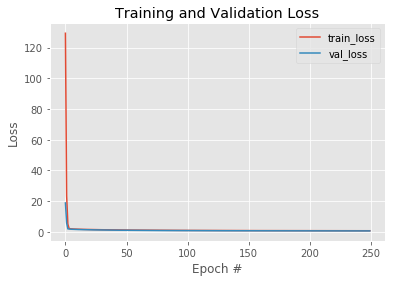

In [7]:
for i in range(n_batches):
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, 250), historiesF1[i].history["loss"], label="train_loss")
    plt.plot(np.arange(0, 250), historiesF1[i].history["val_loss"], label="val_loss")
    plt.title("Training and Validation Loss")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

A medida que los batches van aumentando, la disminución del error ocurre de forma drástica mas tempranamente y se va acercando al eje y.
En el caso particular de _batch size_ igual a $1$, el entrenamiento demora bastante y los resultados no son buenos. Esto puede deberse a que al obtener el error de solo 1 dato a la vez, las actualizaciones de los pesos son menos representativas del conjunto completo de los datos, no logrando llegar a una generalización de los datos.

In [8]:
historiesF2 = []

for batch_size in batch_sizes:
    modelF2 = Sequential()
    modelF2.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation="relu"))
    modelF2.add(Dense(1, kernel_initializer='uniform',activation="linear")) 
    modelF2.compile(optimizer=SGD(lr=0.01),loss='mean_squared_error')
    historiesF2.append(modelF2.fit(X_train_scaled,y_train,batch_size=int(batch_size),epochs=250,validation_data=(X_val_scaled, y_val)))

Train on 9745 samples, validate on 4060 samples
Epoch 1/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 2/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 3/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 4/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 5/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 6/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 7/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 8/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 9/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 10/250
9745/9745 [==============================] - 22s 2ms/step

9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 166/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 167/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 168/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 169/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 170/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 171/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 172/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 173/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 174/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 175/250


9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 248/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 249/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Epoch 250/250
9745/9745 [==============================] - 22s 2ms/step - loss: nan - val_loss: nan
Train on 9745 samples, validate on 4060 samples
Epoch 1/250
9745/9745 [==============================] - 1s 89us/step - loss: nan - val_loss: nan
Epoch 2/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 3/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 4/250
9745/9745 [==============================] - 1s 55us/step - loss: nan - val_loss: nan
Epoch 5/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 6/250
9745/9745 [==============================] - 1s 54us/step - loss

9745/9745 [==============================] - 1s 57us/step - loss: nan - val_loss: nan
Epoch 162/250
9745/9745 [==============================] - 1s 54us/step - loss: nan - val_loss: nan
Epoch 163/250
9745/9745 [==============================] - 1s 55us/step - loss: nan - val_loss: nan
Epoch 164/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 165/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 166/250
9745/9745 [==============================] - 1s 54us/step - loss: nan - val_loss: nan
Epoch 167/250
9745/9745 [==============================] - 1s 54us/step - loss: nan - val_loss: nan
Epoch 168/250
9745/9745 [==============================] - 1s 55us/step - loss: nan - val_loss: nan
Epoch 169/250
9745/9745 [==============================] - 1s 54us/step - loss: nan - val_loss: nan
Epoch 170/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 171/250


9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 244/250
9745/9745 [==============================] - 1s 54us/step - loss: nan - val_loss: nan
Epoch 245/250
9745/9745 [==============================] - 1s 54us/step - loss: nan - val_loss: nan
Epoch 246/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 247/250
9745/9745 [==============================] - 1s 54us/step - loss: nan - val_loss: nan
Epoch 248/250
9745/9745 [==============================] - 1s 55us/step - loss: nan - val_loss: nan
Epoch 249/250
9745/9745 [==============================] - 1s 52us/step - loss: nan - val_loss: nan
Epoch 250/250
9745/9745 [==============================] - 1s 54us/step - loss: nan - val_loss: nan
Train on 9745 samples, validate on 4060 samples
Epoch 1/250
9745/9745 [==============================] - 1s 86us/step - loss: nan - val_loss: nan
Epoch 2/250
9745/9745 [==============================] - 0s 50us/ste

9745/9745 [==============================] - 0s 49us/step - loss: nan - val_loss: nan
Epoch 158/250
9745/9745 [==============================] - 0s 51us/step - loss: nan - val_loss: nan
Epoch 159/250
9745/9745 [==============================] - 0s 50us/step - loss: nan - val_loss: nan
Epoch 160/250
9745/9745 [==============================] - 0s 50us/step - loss: nan - val_loss: nan
Epoch 161/250
9745/9745 [==============================] - 0s 50us/step - loss: nan - val_loss: nan
Epoch 162/250
9745/9745 [==============================] - 0s 50us/step - loss: nan - val_loss: nan
Epoch 163/250
9745/9745 [==============================] - 0s 50us/step - loss: nan - val_loss: nan
Epoch 164/250
9745/9745 [==============================] - 0s 49us/step - loss: nan - val_loss: nan
Epoch 165/250
9745/9745 [==============================] - 0s 49us/step - loss: nan - val_loss: nan
Epoch 166/250
9745/9745 [==============================] - 0s 50us/step - loss: nan - val_loss: nan
Epoch 167/250


9745/9745 [==============================] - 0s 49us/step - loss: nan - val_loss: nan
Epoch 240/250
9745/9745 [==============================] - 0s 50us/step - loss: nan - val_loss: nan
Epoch 241/250
9745/9745 [==============================] - 0s 49us/step - loss: nan - val_loss: nan
Epoch 242/250
9745/9745 [==============================] - 0s 47us/step - loss: nan - val_loss: nan
Epoch 243/250
9745/9745 [==============================] - 0s 51us/step - loss: nan - val_loss: nan
Epoch 244/250
9745/9745 [==============================] - 0s 49us/step - loss: nan - val_loss: nan
Epoch 245/250
9745/9745 [==============================] - 0s 50us/step - loss: nan - val_loss: nan
Epoch 246/250
9745/9745 [==============================] - 0s 50us/step - loss: nan - val_loss: nan
Epoch 247/250
9745/9745 [==============================] - 0s 48us/step - loss: nan - val_loss: nan
Epoch 248/250
9745/9745 [==============================] - 0s 49us/step - loss: nan - val_loss: nan
Epoch 249/250


9745/9745 [==============================] - 0s 47us/step - loss: nan - val_loss: nan
Epoch 154/250
9745/9745 [==============================] - 0s 50us/step - loss: nan - val_loss: nan
Epoch 155/250
9745/9745 [==============================] - 0s 49us/step - loss: nan - val_loss: nan
Epoch 156/250
9745/9745 [==============================] - 0s 51us/step - loss: nan - val_loss: nan
Epoch 157/250
9745/9745 [==============================] - 0s 49us/step - loss: nan - val_loss: nan
Epoch 158/250
9745/9745 [==============================] - 0s 50us/step - loss: nan - val_loss: nan
Epoch 159/250
9745/9745 [==============================] - 0s 51us/step - loss: nan - val_loss: nan
Epoch 160/250
9745/9745 [==============================] - 0s 51us/step - loss: nan - val_loss: nan
Epoch 161/250
9745/9745 [==============================] - 0s 51us/step - loss: nan - val_loss: nan
Epoch 162/250
9745/9745 [==============================] - 0s 50us/step - loss: nan - val_loss: nan
Epoch 163/250


9745/9745 [==============================] - 0s 51us/step - loss: nan - val_loss: nan
Epoch 236/250
9745/9745 [==============================] - 0s 50us/step - loss: nan - val_loss: nan
Epoch 237/250
9745/9745 [==============================] - 0s 50us/step - loss: nan - val_loss: nan
Epoch 238/250
9745/9745 [==============================] - 0s 50us/step - loss: nan - val_loss: nan
Epoch 239/250
9745/9745 [==============================] - 0s 49us/step - loss: nan - val_loss: nan
Epoch 240/250
9745/9745 [==============================] - 0s 48us/step - loss: nan - val_loss: nan
Epoch 241/250
9745/9745 [==============================] - 1s 51us/step - loss: nan - val_loss: nan
Epoch 242/250
9745/9745 [==============================] - 0s 49us/step - loss: nan - val_loss: nan
Epoch 243/250
9745/9745 [==============================] - 0s 51us/step - loss: nan - val_loss: nan
Epoch 244/250
9745/9745 [==============================] - 0s 50us/step - loss: nan - val_loss: nan
Epoch 245/250


9745/9745 [==============================] - 0s 48us/step - loss: nan - val_loss: nan
Epoch 150/250
9745/9745 [==============================] - 0s 50us/step - loss: nan - val_loss: nan
Epoch 151/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 152/250
9745/9745 [==============================] - 0s 50us/step - loss: nan - val_loss: nan
Epoch 153/250
9745/9745 [==============================] - 0s 51us/step - loss: nan - val_loss: nan
Epoch 154/250
9745/9745 [==============================] - 0s 50us/step - loss: nan - val_loss: nan
Epoch 155/250
9745/9745 [==============================] - 0s 48us/step - loss: nan - val_loss: nan
Epoch 156/250
9745/9745 [==============================] - 1s 52us/step - loss: nan - val_loss: nan
Epoch 157/250
9745/9745 [==============================] - 0s 49us/step - loss: nan - val_loss: nan
Epoch 158/250
9745/9745 [==============================] - 1s 52us/step - loss: nan - val_loss: nan
Epoch 159/250


9745/9745 [==============================] - 1s 52us/step - loss: nan - val_loss: nan
Epoch 232/250
9745/9745 [==============================] - 1s 51us/step - loss: nan - val_loss: nan
Epoch 233/250
9745/9745 [==============================] - 0s 51us/step - loss: nan - val_loss: nan
Epoch 234/250
9745/9745 [==============================] - 0s 49us/step - loss: nan - val_loss: nan
Epoch 235/250
9745/9745 [==============================] - 0s 51us/step - loss: nan - val_loss: nan
Epoch 236/250
9745/9745 [==============================] - 1s 52us/step - loss: nan - val_loss: nan
Epoch 237/250
9745/9745 [==============================] - 1s 52us/step - loss: nan - val_loss: nan
Epoch 238/250
9745/9745 [==============================] - 1s 52us/step - loss: nan - val_loss: nan
Epoch 239/250
9745/9745 [==============================] - 0s 51us/step - loss: nan - val_loss: nan
Epoch 240/250
9745/9745 [==============================] - 0s 48us/step - loss: nan - val_loss: nan
Epoch 241/250


9745/9745 [==============================] - 0s 50us/step - loss: nan - val_loss: nan
Epoch 64/250
9745/9745 [==============================] - 0s 51us/step - loss: nan - val_loss: nan
Epoch 65/250
9745/9745 [==============================] - 1s 52us/step - loss: nan - val_loss: nan
Epoch 66/250
9745/9745 [==============================] - 0s 51us/step - loss: nan - val_loss: nan
Epoch 67/250
9745/9745 [==============================] - 0s 51us/step - loss: nan - val_loss: nan
Epoch 68/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 69/250
9745/9745 [==============================] - 1s 52us/step - loss: nan - val_loss: nan
Epoch 70/250
9745/9745 [==============================] - 0s 51us/step - loss: nan - val_loss: nan
Epoch 71/250
9745/9745 [==============================] - 1s 51us/step - loss: nan - val_loss: nan
Epoch 72/250
9745/9745 [==============================] - 1s 54us/step - loss: nan - val_loss: nan
Epoch 73/250
9745/9745 

9745/9745 [==============================] - 1s 52us/step - loss: nan - val_loss: nan
Epoch 228/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 229/250
9745/9745 [==============================] - 1s 52us/step - loss: nan - val_loss: nan
Epoch 230/250
9745/9745 [==============================] - 0s 51us/step - loss: nan - val_loss: nan
Epoch 231/250
9745/9745 [==============================] - 1s 54us/step - loss: nan - val_loss: nan
Epoch 232/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 233/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 234/250
9745/9745 [==============================] - 1s 54us/step - loss: nan - val_loss: nan
Epoch 235/250
9745/9745 [==============================] - 1s 52us/step - loss: nan - val_loss: nan
Epoch 236/250
9745/9745 [==============================] - 1s 52us/step - loss: nan - val_loss: nan
Epoch 237/250


Epoch 59/250
9745/9745 [==============================] - 1s 54us/step - loss: nan - val_loss: nan
Epoch 60/250
9745/9745 [==============================] - 1s 55us/step - loss: nan - val_loss: nan
Epoch 61/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 62/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 63/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 64/250
9745/9745 [==============================] - 1s 54us/step - loss: nan - val_loss: nan
Epoch 65/250
9745/9745 [==============================] - 1s 55us/step - loss: nan - val_loss: nan
Epoch 66/250
9745/9745 [==============================] - 1s 55us/step - loss: nan - val_loss: nan
Epoch 67/250
9745/9745 [==============================] - 0s 51us/step - loss: nan - val_loss: nan
Epoch 68/250
9745/9745 [==============================] - 0s 51us/step - loss: nan - val_loss: nan
Epoch 69/2

9745/9745 [==============================] - 1s 54us/step - loss: nan - val_loss: nan
Epoch 224/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 225/250
9745/9745 [==============================] - 1s 54us/step - loss: nan - val_loss: nan
Epoch 226/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 227/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 228/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 229/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 230/250
9745/9745 [==============================] - 1s 54us/step - loss: nan - val_loss: nan
Epoch 231/250
9745/9745 [==============================] - 1s 52us/step - loss: nan - val_loss: nan
Epoch 232/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 233/250


Epoch 55/250
9745/9745 [==============================] - 1s 57us/step - loss: nan - val_loss: nan
Epoch 56/250
9745/9745 [==============================] - 1s 57us/step - loss: nan - val_loss: nan
Epoch 57/250
9745/9745 [==============================] - 1s 58us/step - loss: nan - val_loss: nan
Epoch 58/250
9745/9745 [==============================] - 1s 59us/step - loss: nan - val_loss: nan
Epoch 59/250
9745/9745 [==============================] - 1s 58us/step - loss: nan - val_loss: nan
Epoch 60/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 61/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 62/250
9745/9745 [==============================] - 1s 57us/step - loss: nan - val_loss: nan
Epoch 63/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 64/250
9745/9745 [==============================] - 1s 58us/step - loss: nan - val_loss: nan
Epoch 65/2

9745/9745 [==============================] - 1s 55us/step - loss: nan - val_loss: nan
Epoch 220/250
9745/9745 [==============================] - 1s 59us/step - loss: nan - val_loss: nan
Epoch 221/250
9745/9745 [==============================] - 1s 58us/step - loss: nan - val_loss: nan
Epoch 222/250
9745/9745 [==============================] - 1s 58us/step - loss: nan - val_loss: nan
Epoch 223/250
9745/9745 [==============================] - 1s 59us/step - loss: nan - val_loss: nan
Epoch 224/250
9745/9745 [==============================] - 1s 59us/step - loss: nan - val_loss: nan
Epoch 225/250
9745/9745 [==============================] - 1s 58us/step - loss: nan - val_loss: nan
Epoch 226/250
9745/9745 [==============================] - 1s 58us/step - loss: nan - val_loss: nan
Epoch 227/250
9745/9745 [==============================] - 1s 58us/step - loss: nan - val_loss: nan
Epoch 228/250
9745/9745 [==============================] - 1s 57us/step - loss: nan - val_loss: nan
Epoch 229/250


Epoch 51/250
9745/9745 [==============================] - 1s 55us/step - loss: nan - val_loss: nan
Epoch 52/250
9745/9745 [==============================] - 1s 57us/step - loss: nan - val_loss: nan
Epoch 53/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 54/250
9745/9745 [==============================] - 1s 55us/step - loss: nan - val_loss: nan
Epoch 55/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 56/250
9745/9745 [==============================] - 1s 57us/step - loss: nan - val_loss: nan
Epoch 57/250
9745/9745 [==============================] - 1s 53us/step - loss: nan - val_loss: nan
Epoch 58/250
9745/9745 [==============================] - 1s 54us/step - loss: nan - val_loss: nan
Epoch 59/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 60/250
9745/9745 [==============================] - 1s 55us/step - loss: nan - val_loss: nan
Epoch 61/2

9745/9745 [==============================] - 1s 57us/step - loss: nan - val_loss: nan
Epoch 216/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 217/250
9745/9745 [==============================] - 1s 57us/step - loss: nan - val_loss: nan
Epoch 218/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 219/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 220/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 221/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 222/250
9745/9745 [==============================] - 1s 58us/step - loss: nan - val_loss: nan
Epoch 223/250
9745/9745 [==============================] - 1s 58us/step - loss: nan - val_loss: nan
Epoch 224/250
9745/9745 [==============================] - 1s 55us/step - loss: nan - val_loss: nan
Epoch 225/250


Epoch 47/250
9745/9745 [==============================] - 1s 54us/step - loss: nan - val_loss: nan
Epoch 48/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 49/250
9745/9745 [==============================] - 1s 55us/step - loss: nan - val_loss: nan
Epoch 50/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 51/250
9745/9745 [==============================] - 1s 55us/step - loss: nan - val_loss: nan
Epoch 52/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 53/250
9745/9745 [==============================] - 1s 55us/step - loss: nan - val_loss: nan
Epoch 54/250
9745/9745 [==============================] - 1s 55us/step - loss: nan - val_loss: nan
Epoch 55/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 56/250
9745/9745 [==============================] - 1s 57us/step - loss: nan - val_loss: nan
Epoch 57/2

9745/9745 [==============================] - 1s 57us/step - loss: nan - val_loss: nan
Epoch 212/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 213/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 214/250
9745/9745 [==============================] - 1s 57us/step - loss: nan - val_loss: nan
Epoch 215/250
9745/9745 [==============================] - 1s 54us/step - loss: nan - val_loss: nan
Epoch 216/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 217/250
9745/9745 [==============================] - 1s 55us/step - loss: nan - val_loss: nan
Epoch 218/250
9745/9745 [==============================] - 1s 55us/step - loss: nan - val_loss: nan
Epoch 219/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 220/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 221/250


Epoch 43/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 44/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 45/250
9745/9745 [==============================] - 1s 60us/step - loss: nan - val_loss: nan
Epoch 46/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 47/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 48/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 49/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 50/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 51/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 52/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 53/2

9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 208/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 209/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 210/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 211/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 212/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 213/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 214/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 215/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 216/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 217/250


9745/9745 [==============================] - 1s 59us/step - loss: nan - val_loss: nan
Epoch 121/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 122/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 123/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 124/250
9745/9745 [==============================] - 1s 60us/step - loss: nan - val_loss: nan
Epoch 125/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 126/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 127/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 128/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 129/250
9745/9745 [==============================] - 1s 60us/step - loss: nan - val_loss: nan
Epoch 130/250


9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 203/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 204/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 205/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 206/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 207/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 208/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 209/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 210/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 211/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 212/250


9745/9745 [==============================] - 1s 58us/step - loss: nan - val_loss: nan
Epoch 116/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 117/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 118/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 119/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 120/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 121/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 122/250
9745/9745 [==============================] - 1s 60us/step - loss: nan - val_loss: nan
Epoch 123/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 124/250
9745/9745 [==============================] - 1s 59us/step - loss: nan - val_loss: nan
Epoch 125/250


9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 198/250
9745/9745 [==============================] - 1s 60us/step - loss: nan - val_loss: nan
Epoch 199/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 200/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 201/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 202/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 203/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 204/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 205/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 206/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 207/250


9745/9745 [==============================] - 1s 58us/step - loss: nan - val_loss: nan
Epoch 111/250
9745/9745 [==============================] - 1s 67us/step - loss: nan - val_loss: nan
Epoch 112/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 113/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 114/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 115/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 116/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 117/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 118/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 119/250
9745/9745 [==============================] - 1s 65us/step - loss: nan - val_loss: nan
Epoch 120/250


9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 193/250
9745/9745 [==============================] - 0s 51us/step - loss: nan - val_loss: nan
Epoch 194/250
9745/9745 [==============================] - 1s 56us/step - loss: nan - val_loss: nan
Epoch 195/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 196/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 197/250
9745/9745 [==============================] - 1s 65us/step - loss: nan - val_loss: nan
Epoch 198/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 199/250
9745/9745 [==============================] - 1s 65us/step - loss: nan - val_loss: nan
Epoch 200/250
9745/9745 [==============================] - 1s 64us/step - loss: nan - val_loss: nan
Epoch 201/250
9745/9745 [==============================] - 1s 64us/step - loss: nan - val_loss: nan
Epoch 202/250


Epoch 106/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 107/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 108/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 109/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 110/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 111/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 112/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 113/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 114/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 115/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan


Epoch 188/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 189/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 190/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 191/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 192/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 193/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 194/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 195/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 196/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 197/250
9745/9745 [==============================] - 1s 59us/step - loss: nan - val_loss: nan


Epoch 102/250
9745/9745 [==============================] - 1s 64us/step - loss: nan - val_loss: nan
Epoch 103/250
9745/9745 [==============================] - 1s 65us/step - loss: nan - val_loss: nan
Epoch 104/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 105/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 106/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 107/250
9745/9745 [==============================] - 1s 60us/step - loss: nan - val_loss: nan
Epoch 108/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 109/250
9745/9745 [==============================] - 1s 64us/step - loss: nan - val_loss: nan
Epoch 110/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 111/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan


Epoch 184/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 185/250
9745/9745 [==============================] - 1s 60us/step - loss: nan - val_loss: nan
Epoch 186/250
9745/9745 [==============================] - 1s 60us/step - loss: nan - val_loss: nan
Epoch 187/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 188/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 189/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 190/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 191/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 192/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 193/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan


Epoch 15/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 16/250
9745/9745 [==============================] - 1s 65us/step - loss: nan - val_loss: nan
Epoch 17/250
9745/9745 [==============================] - 1s 65us/step - loss: nan - val_loss: nan
Epoch 18/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 19/250
9745/9745 [==============================] - 1s 64us/step - loss: nan - val_loss: nan
Epoch 20/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 21/250
9745/9745 [==============================] - 1s 64us/step - loss: nan - val_loss: nan
Epoch 22/250
9745/9745 [==============================] - 1s 64us/step - loss: nan - val_loss: nan
Epoch 23/250
9745/9745 [==============================] - 1s 64us/step - loss: nan - val_loss: nan
Epoch 24/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 25/2

9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 180/250
9745/9745 [==============================] - 1s 64us/step - loss: nan - val_loss: nan
Epoch 181/250
9745/9745 [==============================] - 1s 65us/step - loss: nan - val_loss: nan
Epoch 182/250
9745/9745 [==============================] - 1s 55us/step - loss: nan - val_loss: nan
Epoch 183/250
9745/9745 [==============================] - 1s 65us/step - loss: nan - val_loss: nan
Epoch 184/250
9745/9745 [==============================] - 1s 66us/step - loss: nan - val_loss: nan
Epoch 185/250
9745/9745 [==============================] - 1s 64us/step - loss: nan - val_loss: nan
Epoch 186/250
9745/9745 [==============================] - 1s 65us/step - loss: nan - val_loss: nan
Epoch 187/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 188/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 189/250


Epoch 93/250
9745/9745 [==============================] - 1s 60us/step - loss: nan - val_loss: nan
Epoch 94/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 95/250
9745/9745 [==============================] - 1s 64us/step - loss: nan - val_loss: nan
Epoch 96/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 97/250
9745/9745 [==============================] - 1s 64us/step - loss: nan - val_loss: nan
Epoch 98/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 99/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 100/250
9745/9745 [==============================] - 1s 64us/step - loss: nan - val_loss: nan
Epoch 101/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 102/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 1

Epoch 175/250
9745/9745 [==============================] - 1s 60us/step - loss: nan - val_loss: nan
Epoch 176/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 177/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 178/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 179/250
9745/9745 [==============================] - 1s 64us/step - loss: nan - val_loss: nan
Epoch 180/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 181/250
9745/9745 [==============================] - 1s 64us/step - loss: nan - val_loss: nan
Epoch 182/250
9745/9745 [==============================] - 1s 64us/step - loss: nan - val_loss: nan
Epoch 183/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 184/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan


Epoch 89/250
9745/9745 [==============================] - 1s 65us/step - loss: nan - val_loss: nan
Epoch 90/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 91/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 92/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 93/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 94/250
9745/9745 [==============================] - 1s 65us/step - loss: nan - val_loss: nan
Epoch 95/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 96/250
9745/9745 [==============================] - 1s 65us/step - loss: nan - val_loss: nan
Epoch 97/250
9745/9745 [==============================] - 1s 64us/step - loss: nan - val_loss: nan
Epoch 98/250
9745/9745 [==============================] - 1s 61us/step - loss: nan - val_loss: nan
Epoch 99/2

9745/9745 [==============================] - 1s 59us/step - loss: nan - val_loss: nan
Epoch 172/250
9745/9745 [==============================] - 1s 65us/step - loss: nan - val_loss: nan
Epoch 173/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 174/250
9745/9745 [==============================] - 1s 66us/step - loss: nan - val_loss: nan
Epoch 175/250
9745/9745 [==============================] - 1s 65us/step - loss: nan - val_loss: nan
Epoch 176/250
9745/9745 [==============================] - 1s 65us/step - loss: nan - val_loss: nan
Epoch 177/250
9745/9745 [==============================] - 1s 65us/step - loss: nan - val_loss: nan
Epoch 178/250
9745/9745 [==============================] - 1s 62us/step - loss: nan - val_loss: nan
Epoch 179/250
9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 180/250
9745/9745 [==============================] - 1s 65us/step - loss: nan - val_loss: nan
Epoch 181/250


9745/9745 [==============================] - 1s 67us/step - loss: nan - val_loss: nan
Epoch 85/250
9745/9745 [==============================] - 1s 67us/step - loss: nan - val_loss: nan
Epoch 86/250
9745/9745 [==============================] - 1s 72us/step - loss: nan - val_loss: nan
Epoch 87/250
9745/9745 [==============================] - 1s 69us/step - loss: nan - val_loss: nan
Epoch 88/250
9745/9745 [==============================] - 1s 71us/step - loss: nan - val_loss: nan
Epoch 89/250
9745/9745 [==============================] - 1s 70us/step - loss: nan - val_loss: nan
Epoch 90/250
9745/9745 [==============================] - 1s 68us/step - loss: nan - val_loss: nan
Epoch 91/250
9745/9745 [==============================] - 1s 68us/step - loss: nan - val_loss: nan
Epoch 92/250
9745/9745 [==============================] - 1s 66us/step - loss: nan - val_loss: nan
Epoch 93/250
9745/9745 [==============================] - 1s 68us/step - loss: nan - val_loss: nan
Epoch 94/250
9745/9745 

9745/9745 [==============================] - 1s 64us/step - loss: nan - val_loss: nan
Epoch 249/250
9745/9745 [==============================] - 1s 66us/step - loss: nan - val_loss: nan
Epoch 250/250
9745/9745 [==============================] - 1s 66us/step - loss: nan - val_loss: nan
Train on 9745 samples, validate on 4060 samples
Epoch 1/250
9745/9745 [==============================] - 1s 127us/step - loss: 136.5664 - val_loss: 4585.4155
Epoch 2/250
9745/9745 [==============================] - 1s 67us/step - loss: 3149.2493 - val_loss: 208312096.0000
Epoch 3/250
9745/9745 [==============================] - 1s 67us/step - loss: 258980064.0000 - val_loss: 241303948898421744599040.0000
Epoch 4/250
9745/9745 [==============================] - 1s 66us/step - loss: 168171237543049414311936.0000 - val_loss: inf
Epoch 5/250
9745/9745 [==============================] - 1s 68us/step - loss: inf - val_loss: nan
Epoch 6/250
9745/9745 [==============================] - 1s 67us/step - loss: nan - 

Epoch 80/250
9745/9745 [==============================] - 1s 66us/step - loss: nan - val_loss: nan
Epoch 81/250
9745/9745 [==============================] - 1s 66us/step - loss: nan - val_loss: nan
Epoch 82/250
9745/9745 [==============================] - 1s 69us/step - loss: nan - val_loss: nan
Epoch 83/250
9745/9745 [==============================] - 1s 68us/step - loss: nan - val_loss: nan
Epoch 84/250
9745/9745 [==============================] - 1s 69us/step - loss: nan - val_loss: nan
Epoch 85/250
9745/9745 [==============================] - 1s 66us/step - loss: nan - val_loss: nan
Epoch 86/250
9745/9745 [==============================] - 1s 68us/step - loss: nan - val_loss: nan
Epoch 87/250
9745/9745 [==============================] - 1s 66us/step - loss: nan - val_loss: nan
Epoch 88/250
9745/9745 [==============================] - 1s 68us/step - loss: nan - val_loss: nan
Epoch 89/250
9745/9745 [==============================] - 1s 68us/step - loss: nan - val_loss: nan
Epoch 90/2

9745/9745 [==============================] - 1s 63us/step - loss: nan - val_loss: nan
Epoch 163/250
9745/9745 [==============================] - 1s 68us/step - loss: nan - val_loss: nan
Epoch 164/250
9745/9745 [==============================] - 1s 65us/step - loss: nan - val_loss: nan
Epoch 165/250
9745/9745 [==============================] - 1s 66us/step - loss: nan - val_loss: nan
Epoch 166/250
9745/9745 [==============================] - 1s 66us/step - loss: nan - val_loss: nan
Epoch 167/250
9745/9745 [==============================] - 1s 68us/step - loss: nan - val_loss: nan
Epoch 168/250
9745/9745 [==============================] - 1s 66us/step - loss: nan - val_loss: nan
Epoch 169/250
9745/9745 [==============================] - 1s 67us/step - loss: nan - val_loss: nan
Epoch 170/250
9745/9745 [==============================] - 1s 66us/step - loss: nan - val_loss: nan
Epoch 171/250
9745/9745 [==============================] - 1s 74us/step - loss: nan - val_loss: nan
Epoch 172/250


9745/9745 [==============================] - 1s 66us/step - loss: nan - val_loss: nan
Epoch 245/250
9745/9745 [==============================] - 1s 68us/step - loss: nan - val_loss: nan
Epoch 246/250
9745/9745 [==============================] - 1s 64us/step - loss: nan - val_loss: nan
Epoch 247/250
9745/9745 [==============================] - 1s 67us/step - loss: nan - val_loss: nan
Epoch 248/250
9745/9745 [==============================] - 1s 68us/step - loss: nan - val_loss: nan
Epoch 249/250
9745/9745 [==============================] - 1s 68us/step - loss: nan - val_loss: nan
Epoch 250/250
9745/9745 [==============================] - 1s 66us/step - loss: nan - val_loss: nan


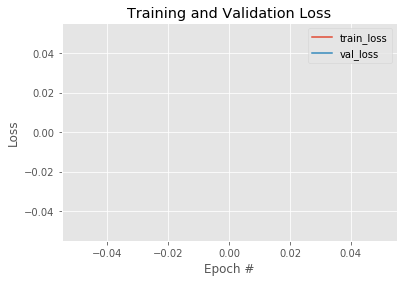

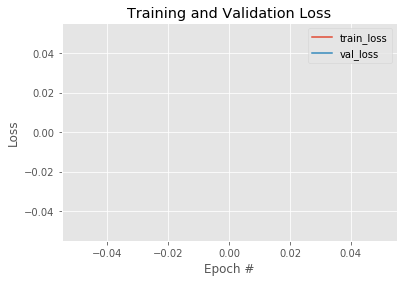

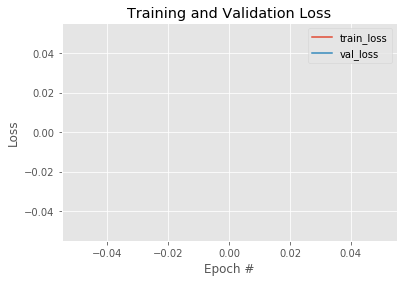

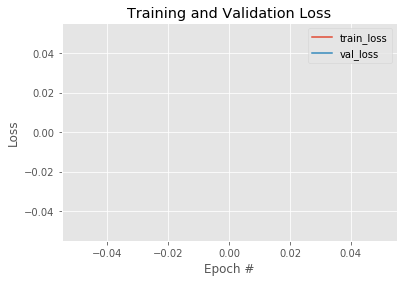

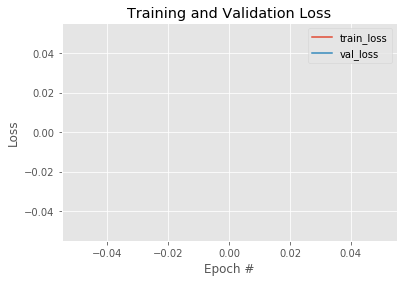

...

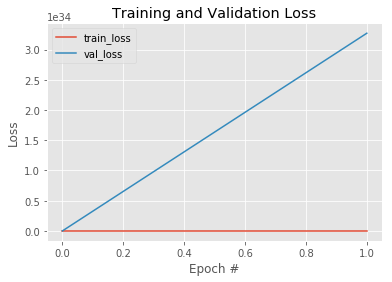

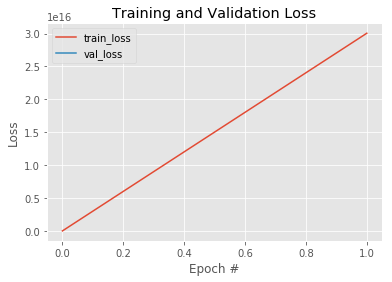

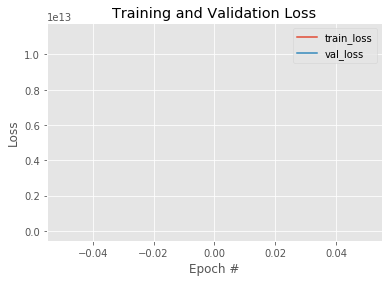

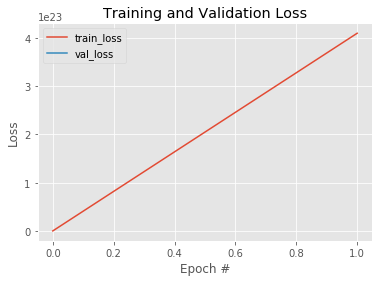

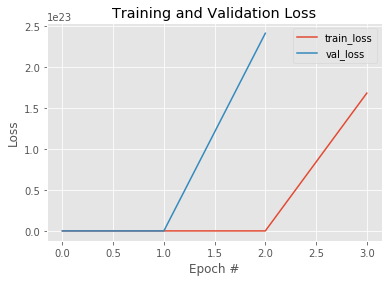

In [9]:
for i in range(n_batches):
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, 250), historiesF2[i].history["loss"], label="train_loss")
    plt.plot(np.arange(0, 250), historiesF2[i].history["val_loss"], label="val_loss")
    plt.title("Training and Validation Loss")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

Los primeros experimentos divergen, luego, al aumentar los batches, se alcanzan a visualizar algunos errores, los que luego también diverguen. Es importante notar que en la mayoría de los gráficos, el _eje x_, donde se encuentran las _epochs_, el rango es de $0$ a $1$, y en algunos casos de $0$ a $4$. Por lo que la divergencia ocurre al comienzo del entrenamiento.

g) Entrene los modelos obtenidos en b) y c) utilizando estrategias modernas para adaptar la tasa de aprendizaje. Compare los desempeños de adagrad, adadelta, RMSprop y adam. ¿Se observa en algún caso un mejor resultado final? ¿Se observa en algún caso una mayor velocidad de convergencia sobre el dataset de entrenamiento? ¿Sobre el dataset de validación?

In [10]:
modelB = Sequential()
modelB.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation="sigmoid"))
modelB.add(Dense(1, kernel_initializer='uniform',activation="linear")) 
moptimizer = Adagrad(lr=0.01)
modelB.compile(optimizer=moptimizer, loss='mean_squared_error')
historyG1 = modelB.fit(X_train_scaled,y_train, epochs=250,validation_data=(X_val_scaled, y_val))

modelB = Sequential()
modelB.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation="sigmoid"))
modelB.add(Dense(1, kernel_initializer='uniform',activation="linear")) 
moptimizer = Adadelta(lr=0.01)
modelB.compile(optimizer=moptimizer, loss='mean_squared_error')
historyG2 = modelB.fit(X_train_scaled,y_train,epochs=250,validation_data=(X_val_scaled, y_val))

modelB = Sequential()
modelB.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation="sigmoid"))
modelB.add(Dense(1, kernel_initializer='uniform',activation="linear")) 
moptimizer = RMSprop(lr=0.01)
modelB.compile(optimizer=moptimizer, loss='mean_squared_error')
historyG3 = modelB.fit(X_train_scaled,y_train,epochs=250,validation_data=(X_val_scaled, y_val))

modelB = Sequential()
modelB.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation="sigmoid"))
modelB.add(Dense(1, kernel_initializer='uniform',activation="linear")) 
moptimizer = Adam(lr=0.01)
modelB.compile(optimizer=moptimizer, loss='mean_squared_error')
historyG4 = modelB.fit(X_train_scaled,y_train,epochs=250,validation_data=(X_val_scaled, y_val))

Train on 9745 samples, validate on 4060 samples
Epoch 1/250
9745/9745 [==============================] - 2s 169us/step - loss: 6.7372 - val_loss: 2.1596
Epoch 2/250
9745/9745 [==============================] - 1s 151us/step - loss: 1.0312 - val_loss: 0.8026
Epoch 3/250
9745/9745 [==============================] - 1s 150us/step - loss: 0.4724 - val_loss: 0.4419
Epoch 4/250
9745/9745 [==============================] - 2s 169us/step - loss: 0.3066 - val_loss: 0.3186
Epoch 5/250
9745/9745 [==============================] - 2s 156us/step - loss: 0.2360 - val_loss: 0.2497
Epoch 6/250
9745/9745 [==============================] - 1s 153us/step - loss: 0.1963 - val_loss: 0.2211
Epoch 7/250
9745/9745 [==============================] - 2s 155us/step - loss: 0.1689 - val_loss: 0.1854
Epoch 8/250
9745/9745 [==============================] - 2s 155us/step - loss: 0.1507 - val_loss: 0.1677
Epoch 9/250
9745/9745 [==============================] - 1s 154us/step - loss: 0.1375 - val_loss: 0.1608
Epoch 1

Epoch 78/250
9745/9745 [==============================] - 1s 137us/step - loss: 0.0380 - val_loss: 0.0698
Epoch 79/250
9745/9745 [==============================] - 1s 137us/step - loss: 0.0377 - val_loss: 0.0692
Epoch 80/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.0375 - val_loss: 0.0681
Epoch 81/250
9745/9745 [==============================] - 1s 132us/step - loss: 0.0372 - val_loss: 0.0685
Epoch 82/250
9745/9745 [==============================] - 1s 137us/step - loss: 0.0369 - val_loss: 0.0687
Epoch 83/250
9745/9745 [==============================] - 1s 131us/step - loss: 0.0367 - val_loss: 0.0684
Epoch 84/250
9745/9745 [==============================] - 1s 132us/step - loss: 0.0365 - val_loss: 0.0686
Epoch 85/250
9745/9745 [==============================] - 1s 138us/step - loss: 0.0364 - val_loss: 0.0681
Epoch 86/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.0360 - val_loss: 0.0678
Epoch 87/250
9745/9745 [======================

Epoch 155/250
9745/9745 [==============================] - 2s 158us/step - loss: 0.0258 - val_loss: 0.0590
Epoch 156/250
9745/9745 [==============================] - 1s 140us/step - loss: 0.0257 - val_loss: 0.0583
Epoch 157/250
9745/9745 [==============================] - 1s 130us/step - loss: 0.0256 - val_loss: 0.0584
Epoch 158/250
9745/9745 [==============================] - 1s 138us/step - loss: 0.0254 - val_loss: 0.0580
Epoch 159/250
9745/9745 [==============================] - 1s 141us/step - loss: 0.0254 - val_loss: 0.0586
Epoch 160/250
9745/9745 [==============================] - 1s 134us/step - loss: 0.0253 - val_loss: 0.0579
Epoch 161/250
9745/9745 [==============================] - 1s 142us/step - loss: 0.0251 - val_loss: 0.0586
Epoch 162/250
9745/9745 [==============================] - 1s 139us/step - loss: 0.0250 - val_loss: 0.0581
Epoch 163/250
9745/9745 [==============================] - 1s 130us/step - loss: 0.0249 - val_loss: 0.0579
Epoch 164/250
9745/9745 [============

9745/9745 [==============================] - 2s 206us/step - loss: 0.2557 - val_loss: 0.2434
Epoch 58/250
9745/9745 [==============================] - 2s 210us/step - loss: 0.2518 - val_loss: 0.2368
Epoch 59/250
9745/9745 [==============================] - 2s 221us/step - loss: 0.2476 - val_loss: 0.2322
Epoch 60/250
9745/9745 [==============================] - 2s 219us/step - loss: 0.2437 - val_loss: 0.2286
Epoch 61/250
9745/9745 [==============================] - 2s 233us/step - loss: 0.2398 - val_loss: 0.2266
Epoch 62/250
9745/9745 [==============================] - 2s 209us/step - loss: 0.2363 - val_loss: 0.2238
Epoch 63/250
9745/9745 [==============================] - 2s 219us/step - loss: 0.2329 - val_loss: 0.2211
Epoch 64/250
9745/9745 [==============================] - 2s 218us/step - loss: 0.2296 - val_loss: 0.2181
Epoch 65/250
9745/9745 [==============================] - 2s 211us/step - loss: 0.2265 - val_loss: 0.2155
Epoch 66/250
9745/9745 [==============================] - 2

9745/9745 [==============================] - 2s 208us/step - loss: 0.1219 - val_loss: 0.1261
Epoch 135/250
9745/9745 [==============================] - 2s 203us/step - loss: 0.1212 - val_loss: 0.1262
Epoch 136/250
9745/9745 [==============================] - 2s 201us/step - loss: 0.1206 - val_loss: 0.1253
Epoch 137/250
9745/9745 [==============================] - 2s 200us/step - loss: 0.1199 - val_loss: 0.1245
Epoch 138/250
9745/9745 [==============================] - 2s 217us/step - loss: 0.1191 - val_loss: 0.1236
Epoch 139/250
9745/9745 [==============================] - 2s 200us/step - loss: 0.1185 - val_loss: 0.1229
Epoch 140/250
9745/9745 [==============================] - 2s 199us/step - loss: 0.1178 - val_loss: 0.1228
Epoch 141/250
9745/9745 [==============================] - 2s 194us/step - loss: 0.1171 - val_loss: 0.1224
Epoch 142/250
9745/9745 [==============================] - 2s 211us/step - loss: 0.1165 - val_loss: 0.1209
Epoch 143/250
9745/9745 [==========================

9745/9745 [==============================] - 1s 148us/step - loss: 0.3473 - val_loss: 0.4707
Epoch 37/250
9745/9745 [==============================] - 1s 153us/step - loss: 0.3514 - val_loss: 1.1769
Epoch 38/250
9745/9745 [==============================] - 1s 137us/step - loss: 0.3263 - val_loss: 0.2136
Epoch 39/250
9745/9745 [==============================] - 1s 149us/step - loss: 0.3430 - val_loss: 1.0976
Epoch 40/250
9745/9745 [==============================] - 1s 148us/step - loss: 0.3379 - val_loss: 0.4754
Epoch 41/250
9745/9745 [==============================] - 1s 148us/step - loss: 0.3265 - val_loss: 0.2746
Epoch 42/250
9745/9745 [==============================] - 2s 166us/step - loss: 0.3279 - val_loss: 0.3759
Epoch 43/250
9745/9745 [==============================] - 2s 162us/step - loss: 0.3373 - val_loss: 1.2762
Epoch 44/250
9745/9745 [==============================] - 1s 154us/step - loss: 0.3218 - val_loss: 0.3443
Epoch 45/250
9745/9745 [==============================] - 1

9745/9745 [==============================] - 1s 143us/step - loss: 0.2536 - val_loss: 0.2134
Epoch 190/250
9745/9745 [==============================] - 1s 150us/step - loss: 0.2522 - val_loss: 0.1341
Epoch 191/250
9745/9745 [==============================] - 1s 148us/step - loss: 0.2618 - val_loss: 0.3191
Epoch 192/250
9745/9745 [==============================] - 1s 146us/step - loss: 0.2580 - val_loss: 0.1748
Epoch 193/250
9745/9745 [==============================] - 1s 151us/step - loss: 0.2443 - val_loss: 0.2492
Epoch 194/250
9745/9745 [==============================] - 1s 145us/step - loss: 0.2476 - val_loss: 0.2202
Epoch 195/250
9745/9745 [==============================] - 2s 161us/step - loss: 0.2585 - val_loss: 0.1741
Epoch 196/250
9745/9745 [==============================] - 1s 143us/step - loss: 0.2499 - val_loss: 0.3646
Epoch 197/250
9745/9745 [==============================] - 1s 149us/step - loss: 0.2415 - val_loss: 0.1476
Epoch 198/250
9745/9745 [==========================

9745/9745 [==============================] - 2s 171us/step - loss: 0.1866 - val_loss: 0.2743
Epoch 93/250
9745/9745 [==============================] - 2s 175us/step - loss: 0.2240 - val_loss: 0.2024
Epoch 94/250
9745/9745 [==============================] - 2s 172us/step - loss: 0.1872 - val_loss: 0.1747
Epoch 95/250
9745/9745 [==============================] - 2s 171us/step - loss: 0.1839 - val_loss: 0.2229
Epoch 96/250
9745/9745 [==============================] - 2s 174us/step - loss: 0.1729 - val_loss: 0.1875
Epoch 97/250
9745/9745 [==============================] - 2s 184us/step - loss: 0.1795 - val_loss: 0.2557
Epoch 98/250
9745/9745 [==============================] - 2s 185us/step - loss: 0.1759 - val_loss: 0.2739
Epoch 99/250
9745/9745 [==============================] - 2s 200us/step - loss: 0.1798 - val_loss: 0.1886
Epoch 100/250
9745/9745 [==============================] - 2s 202us/step - loss: 0.2075 - val_loss: 0.2019
Epoch 101/250
9745/9745 [==============================] -

Epoch 169/250
9745/9745 [==============================] - 2s 222us/step - loss: 0.1500 - val_loss: 0.1388
Epoch 170/250
9745/9745 [==============================] - 2s 212us/step - loss: 0.1375 - val_loss: 0.1785
Epoch 171/250
9745/9745 [==============================] - 2s 210us/step - loss: 0.1578 - val_loss: 0.1582
Epoch 172/250
9745/9745 [==============================] - 2s 206us/step - loss: 0.1542 - val_loss: 0.2865
Epoch 173/250
9745/9745 [==============================] - 2s 207us/step - loss: 0.1542 - val_loss: 0.2171
Epoch 174/250
9745/9745 [==============================] - 2s 200us/step - loss: 0.1552 - val_loss: 0.1694
Epoch 175/250
9745/9745 [==============================] - 2s 213us/step - loss: 0.1755 - val_loss: 0.1603
Epoch 176/250
9745/9745 [==============================] - 2s 214us/step - loss: 0.1806 - val_loss: 0.1569
Epoch 177/250
9745/9745 [==============================] - 2s 216us/step - loss: 0.1621 - val_loss: 0.1545
Epoch 178/250
9745/9745 [============

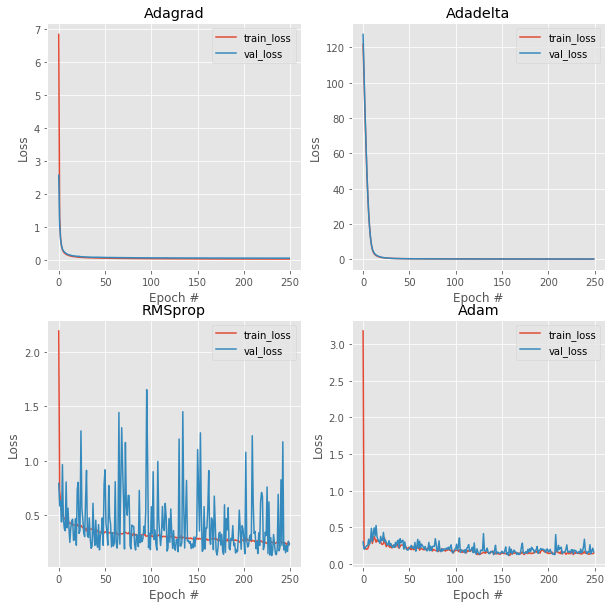

In [5]:
plt.style.use("ggplot")
plt.figure(figsize=(10,10))

plt.subplot(221)
plt.plot(np.arange(0, 250), historyG1["loss"], label="train_loss")
plt.plot(np.arange(0, 250), historyG1["val_loss"], label="val_loss")
plt.title("Adagrad")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend()

plt.subplot(222)
plt.plot(np.arange(0, 250), historyG2["loss"], label="train_loss")
plt.plot(np.arange(0, 250), historyG2["val_loss"], label="val_loss")
plt.title("Adadelta")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend()

plt.subplot(223)
plt.plot(np.arange(0, 250), historyG3["loss"], label="train_loss")
plt.plot(np.arange(0, 250), historyG3["val_loss"], label="val_loss")
plt.title("RMSprop")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend()

plt.subplot(224)
plt.plot(np.arange(0, 250), historyG4["loss"], label="train_loss")
plt.plot(np.arange(0, 250), historyG4["val_loss"], label="val_loss")
plt.title("Adam")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend()

plt.show()

* Adagrad: EL error es bastante pequeño y converge rápidamente desde el inicio.
* Adadelta: Parte con errores grandes, pero converge rápidamente, pero más lento que Adagrad.
* RMSprop: El error de entrenamiento converge rápidamente, pero el de validación varia entre 0 y 1.5, sin lograr estabilizarse al final de las 250 epochs. Pero se debe notar que el error se encuentra en un rango pequeño.
* Adam: El error de entrenamiento y validación disminuyen rápidamente dentro de las primeras epochs, luego se mantienen oscilando pero en un rango muy acotado entre 0 y 0.5

Considerando el error de entrenamiento y validación final de cada modelo con los distintos optimizadores, el que obtuvo el mejor resultado fue el de Adagrad con $0.015$ en entrenamiento y $0.043$ en validación.

La mayor convergencia en entrenamiento ocurre con el optimizador de Adam, sin embargo, el resto de optimizadores tambien converge dentro de las primeras epochs.

El optimizador de Adam parece diminuir el error de validación más rápido que los otros, pero, el optimizador de Adagrad logra una mejor estabilidad que Adam y con errores bajos.

In [52]:
modelC = Sequential()
modelC.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation="relu"))
modelC.add(Dense(1, kernel_initializer='uniform',activation="linear")) 
moptimizer = Adagrad(lr=0.01)
modelC.compile(optimizer=moptimizer, loss='mean_squared_error')
historyG5 = modelC.fit(X_train_scaled,y_train,epochs=250,validation_data=(X_val_scaled, y_val))

modelC = Sequential()
modelC.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation="relu"))
modelC.add(Dense(1, kernel_initializer='uniform',activation="linear")) 
moptimizer = Adadelta(lr=0.01)
modelC.compile(optimizer=moptimizer, loss='mean_squared_error')
historyG6 = modelC.fit(X_train_scaled,y_train,epochs=250,validation_data=(X_val_scaled, y_val))

modelC = Sequential()
modelC.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation="relu"))
modelC.add(Dense(1, kernel_initializer='uniform',activation="linear")) 
moptimizer = RMSprop(lr=0.01)
modelC.compile(optimizer=moptimizer, loss='mean_squared_error')
historyG7 = modelC.fit(X_train_scaled,y_train,epochs=250,validation_data=(X_val_scaled, y_val))

modelC = Sequential()
modelC.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation="relu"))
modelC.add(Dense(1, kernel_initializer='uniform',activation="linear")) 
moptimizer = Adam(lr=0.01)
modelC.compile(optimizer=moptimizer, loss='mean_squared_error')
historyG8 = modelC.fit(X_train_scaled,y_train,epochs=250,validation_data=(X_val_scaled, y_val))

Train on 9745 samples, validate on 4060 samples
Epoch 1/250
9745/9745 [==============================] - 3s 332us/step - loss: 14.0598 - val_loss: 4.1389
Epoch 2/250
9745/9745 [==============================] - 2s 203us/step - loss: 1.2742 - val_loss: 3.1045
Epoch 3/250
9745/9745 [==============================] - 2s 192us/step - loss: 0.9212 - val_loss: 2.0182
Epoch 4/250
9745/9745 [==============================] - 2s 195us/step - loss: 0.6545 - val_loss: 1.6932
Epoch 5/250
9745/9745 [==============================] - 2s 184us/step - loss: 0.5200 - val_loss: 1.4685
Epoch 6/250
9745/9745 [==============================] - 2s 189us/step - loss: 0.4414 - val_loss: 1.2553
Epoch 7/250
9745/9745 [==============================] - 2s 189us/step - loss: 0.3726 - val_loss: 1.2795
Epoch 8/250
9745/9745 [==============================] - 2s 186us/step - loss: 0.3360 - val_loss: 1.3529
Epoch 9/250
9745/9745 [==============================] - 2s 186us/step - loss: 0.3025 - val_loss: 0.9680
Epoch 

Epoch 78/250
9745/9745 [==============================] - 2s 178us/step - loss: 0.0570 - val_loss: 0.5769
Epoch 79/250
9745/9745 [==============================] - 2s 176us/step - loss: 0.0571 - val_loss: 0.5953
Epoch 80/250
9745/9745 [==============================] - 2s 175us/step - loss: 0.0582 - val_loss: 0.5821
Epoch 81/250
9745/9745 [==============================] - 2s 175us/step - loss: 0.0555 - val_loss: 0.5648
Epoch 82/250
9745/9745 [==============================] - 2s 173us/step - loss: 0.0570 - val_loss: 0.5796
Epoch 83/250
9745/9745 [==============================] - 2s 172us/step - loss: 0.0556 - val_loss: 0.5727
Epoch 84/250
9745/9745 [==============================] - 2s 173us/step - loss: 0.0557 - val_loss: 0.5660
Epoch 85/250
9745/9745 [==============================] - 2s 172us/step - loss: 0.0553 - val_loss: 0.5833
Epoch 86/250
9745/9745 [==============================] - 2s 173us/step - loss: 0.0545 - val_loss: 0.7053
Epoch 87/250
9745/9745 [======================

Epoch 155/250
9745/9745 [==============================] - 2s 174us/step - loss: 0.0393 - val_loss: 0.5685
Epoch 156/250
9745/9745 [==============================] - 2s 173us/step - loss: 0.0391 - val_loss: 0.5565
Epoch 157/250
9745/9745 [==============================] - 2s 173us/step - loss: 0.0386 - val_loss: 0.5845
Epoch 158/250
9745/9745 [==============================] - 2s 174us/step - loss: 0.0386 - val_loss: 0.5349
Epoch 159/250
9745/9745 [==============================] - 2s 173us/step - loss: 0.0385 - val_loss: 0.5704
Epoch 160/250
9745/9745 [==============================] - 2s 172us/step - loss: 0.0383 - val_loss: 0.5433
Epoch 161/250
9745/9745 [==============================] - 2s 173us/step - loss: 0.0378 - val_loss: 0.5297
Epoch 162/250
9745/9745 [==============================] - 2s 173us/step - loss: 0.0381 - val_loss: 0.5398
Epoch 163/250
9745/9745 [==============================] - 2s 173us/step - loss: 0.0385 - val_loss: 0.5413
Epoch 164/250
9745/9745 [============

Epoch 58/250
9745/9745 [==============================] - 2s 219us/step - loss: 0.6883 - val_loss: 1.9149
Epoch 59/250
9745/9745 [==============================] - 2s 220us/step - loss: 0.6607 - val_loss: 1.9679
Epoch 60/250
9745/9745 [==============================] - 2s 220us/step - loss: 0.6750 - val_loss: 1.8779
Epoch 61/250
9745/9745 [==============================] - 2s 226us/step - loss: 0.6560 - val_loss: 1.8377
Epoch 62/250
9745/9745 [==============================] - 2s 218us/step - loss: 0.6398 - val_loss: 1.8519
Epoch 63/250
9745/9745 [==============================] - 2s 218us/step - loss: 0.6323 - val_loss: 1.8118
Epoch 64/250
9745/9745 [==============================] - 2s 219us/step - loss: 0.6235 - val_loss: 1.7674
Epoch 65/250
9745/9745 [==============================] - 2s 219us/step - loss: 0.6135 - val_loss: 1.7753
Epoch 66/250
9745/9745 [==============================] - 2s 218us/step - loss: 0.5887 - val_loss: 1.7280
Epoch 67/250
9745/9745 [======================

Epoch 135/250
9745/9745 [==============================] - 2s 220us/step - loss: 0.1716 - val_loss: 0.8882
Epoch 136/250
9745/9745 [==============================] - 2s 222us/step - loss: 0.1690 - val_loss: 0.8862
Epoch 137/250
9745/9745 [==============================] - 2s 221us/step - loss: 0.1702 - val_loss: 0.9014
Epoch 138/250
9745/9745 [==============================] - 2s 219us/step - loss: 0.1658 - val_loss: 0.8840
Epoch 139/250
9745/9745 [==============================] - 2s 217us/step - loss: 0.1642 - val_loss: 0.8928
Epoch 140/250
9745/9745 [==============================] - 2s 216us/step - loss: 0.1633 - val_loss: 0.8772
Epoch 141/250
9745/9745 [==============================] - 2s 219us/step - loss: 0.1612 - val_loss: 0.8678
Epoch 142/250
9745/9745 [==============================] - 2s 218us/step - loss: 0.1559 - val_loss: 0.8512
Epoch 143/250
9745/9745 [==============================] - 2s 218us/step - loss: 0.1570 - val_loss: 0.8850
Epoch 144/250
9745/9745 [============

9745/9745 [==============================] - 2s 187us/step - loss: 85.3195 - val_loss: 10.4609
Epoch 37/250
9745/9745 [==============================] - 2s 185us/step - loss: 77.2105 - val_loss: 2456.1192
Epoch 38/250
9745/9745 [==============================] - 2s 186us/step - loss: 127.6720 - val_loss: 7.0051
Epoch 39/250
9745/9745 [==============================] - 2s 186us/step - loss: 268.1037 - val_loss: 110.5942
Epoch 40/250
9745/9745 [==============================] - 2s 185us/step - loss: 104.3090 - val_loss: 17.1305
Epoch 41/250
9745/9745 [==============================] - 2s 185us/step - loss: 252.8643 - val_loss: 21.9357
Epoch 42/250
9745/9745 [==============================] - 2s 186us/step - loss: 150.0100 - val_loss: 427.7272
Epoch 43/250
9745/9745 [==============================] - 2s 183us/step - loss: 242.3930 - val_loss: 74.9407
Epoch 44/250
9745/9745 [==============================] - 2s 183us/step - loss: 79.6038 - val_loss: 12.1690
Epoch 45/250
9745/9745 [========

9745/9745 [==============================] - 2s 185us/step - loss: 256.3599 - val_loss: 48.8479
Epoch 112/250
9745/9745 [==============================] - 2s 184us/step - loss: 78.3784 - val_loss: 82.4170
Epoch 113/250
9745/9745 [==============================] - 2s 184us/step - loss: 93.3649 - val_loss: 115.5214
Epoch 114/250
9745/9745 [==============================] - 2s 184us/step - loss: 102.5618 - val_loss: 2643.7237
Epoch 115/250
9745/9745 [==============================] - 2s 184us/step - loss: 135.9476 - val_loss: 120.0210
Epoch 116/250
9745/9745 [==============================] - 2s 184us/step - loss: 159.9577 - val_loss: 760.6461
Epoch 117/250
9745/9745 [==============================] - 2s 182us/step - loss: 114.4888 - val_loss: 227.1308
Epoch 118/250
9745/9745 [==============================] - 2s 188us/step - loss: 77.1827 - val_loss: 214.1788
Epoch 119/250
9745/9745 [==============================] - 2s 182us/step - loss: 170.2124 - val_loss: 89.1217
Epoch 120/250
9745/9

9745/9745 [==============================] - 2s 207us/step - loss: 95.6932 - val_loss: 780.2910
Epoch 10/250
9745/9745 [==============================] - 2s 207us/step - loss: 81.3686 - val_loss: 3.6613
Epoch 11/250
9745/9745 [==============================] - 2s 206us/step - loss: 7.3074 - val_loss: 1.9738
Epoch 12/250
9745/9745 [==============================] - 2s 207us/step - loss: 4.1781 - val_loss: 2.1639
Epoch 13/250
9745/9745 [==============================] - 2s 205us/step - loss: 65.4147 - val_loss: 6.0611
Epoch 14/250
9745/9745 [==============================] - 2s 207us/step - loss: 4.5999 - val_loss: 3.1121
Epoch 15/250
9745/9745 [==============================] - 2s 205us/step - loss: 5.7989 - val_loss: 1.7804
Epoch 16/250
9745/9745 [==============================] - 2s 206us/step - loss: 13.8253 - val_loss: 31.9339
Epoch 17/250
9745/9745 [==============================] - 2s 206us/step - loss: 35.9368 - val_loss: 11.7134
Epoch 18/250
9745/9745 [==========================

9745/9745 [==============================] - 2s 209us/step - loss: 3.5382 - val_loss: 2.4787
Epoch 162/250
9745/9745 [==============================] - 2s 210us/step - loss: 2.6251 - val_loss: 1.4165
Epoch 163/250
9745/9745 [==============================] - 2s 207us/step - loss: 4744.8900 - val_loss: 6846.7571
Epoch 164/250
9745/9745 [==============================] - 2s 205us/step - loss: 376.9775 - val_loss: 16.6655
Epoch 165/250
9745/9745 [==============================] - 2s 208us/step - loss: 7.4894 - val_loss: 4.4890
Epoch 166/250
9745/9745 [==============================] - 2s 206us/step - loss: 7.6909 - val_loss: 2.5448
Epoch 167/250
9745/9745 [==============================] - 2s 205us/step - loss: 36.2887 - val_loss: 46.2001
Epoch 168/250
9745/9745 [==============================] - 2s 207us/step - loss: 50.1925 - val_loss: 12.1622
Epoch 169/250
9745/9745 [==============================] - 2s 205us/step - loss: 135.5965 - val_loss: 303.7803
Epoch 170/250
9745/9745 [=========

Epoch 237/250
9745/9745 [==============================] - 2s 206us/step - loss: 33.4344 - val_loss: 5.6252
Epoch 238/250
9745/9745 [==============================] - 2s 207us/step - loss: 36.0039 - val_loss: 6.6212
Epoch 239/250
9745/9745 [==============================] - 2s 205us/step - loss: 28.0407 - val_loss: 3.6149
Epoch 240/250
9745/9745 [==============================] - 2s 206us/step - loss: 18.9811 - val_loss: 4.7037
Epoch 241/250
9745/9745 [==============================] - 2s 207us/step - loss: 16.0764 - val_loss: 9.7844
Epoch 242/250
9745/9745 [==============================] - 2s 206us/step - loss: 7.5851 - val_loss: 11.2209
Epoch 243/250
9745/9745 [==============================] - 2s 206us/step - loss: 13.3371 - val_loss: 2.5828
Epoch 244/250
9745/9745 [==============================] - 2s 208us/step - loss: 13.9870 - val_loss: 244.3746
Epoch 245/250
9745/9745 [==============================] - 2s 206us/step - loss: 57.9102 - val_loss: 3.2037
Epoch 246/250
9745/9745 [=

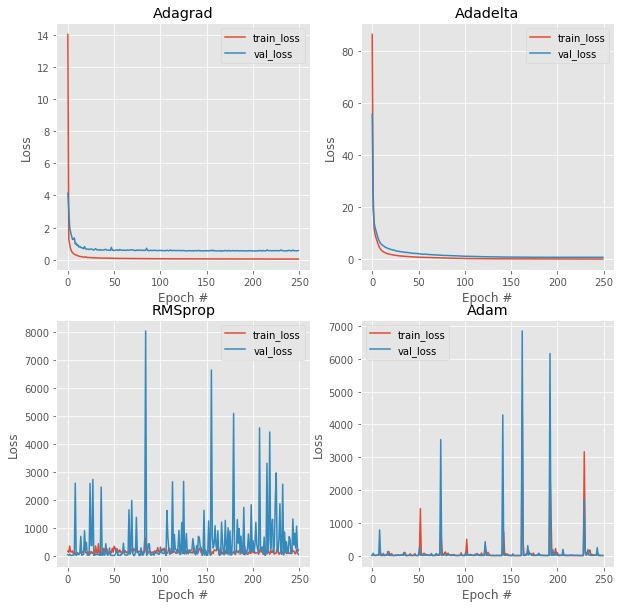

In [6]:
plt.style.use("ggplot")
plt.figure(figsize=(10,10))

plt.subplot(221)
plt.plot(np.arange(0, 250), historyG5["loss"], label="train_loss")
plt.plot(np.arange(0, 250), historyG5["val_loss"], label="val_loss")
plt.title("Adagrad")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend()

plt.subplot(222)
plt.plot(np.arange(0, 250), historyG6["loss"], label="train_loss")
plt.plot(np.arange(0, 250), historyG6["val_loss"], label="val_loss")
plt.title("Adadelta")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend()

plt.subplot(223)
plt.plot(np.arange(0, 250), historyG7["loss"], label="train_loss")
plt.plot(np.arange(0, 250), historyG7["val_loss"], label="val_loss")
plt.title("RMSprop")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend()

plt.subplot(224)
plt.plot(np.arange(0, 250), historyG8["loss"], label="train_loss")
plt.plot(np.arange(0, 250), historyG8["val_loss"], label="val_loss")
plt.title("Adam")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend()

plt.show()

* Adagrad: EL error es bastante pequeño y converge rápidamente desde el inicio.
* Adadelta: Parte con un mayor error que Adagrad, tanto en entrenamiento como en validación, pero, de igual forma converge rápidamente.
* RMSprop: No hay convergencia, los errores de validación son muy distantes entre ellos y hay muchos altos a medida que pasan las epochs. En cuanto al error de entrenamiento, parece ser constante entre 0 y 1000, pero debido a la escala no se puede afirmar.
* Adam: Tanto en entrenamiento como en validación no hay convergencia, pues hay valores altos en ambos errores.

Considerando el error de entrenamiento y validación final de cada modelo con los distintos optimizadores, el que obtuvo el mejor resultado fue el de Adagrad con $0.029$ en entrenamiento y $0.562$ en validación. El de RMSprop obtuvo errores finales de entrenamiento y validación bastante más altos que los demás optimizadores.

Dejando de lado RMSprop y Adam debido a la información que da el gráfico. El optimizador que mejor se desempeña en la convergencia en el entrenamiento es el de Adagrad.

En cuanto a la convergencia en validación, el optimizador de Adagrad se estabiliza más rápido. Seguido por el de Adadelta, cuyo gráfico es parecido a Adagrad, diferenciándose en la escala.

h) Entrene los modelos obtenidos en b) y c) utilizando regularizadores $l1$ y $l2$ (weight decay). Compare los desempeños de prueba obtenidos antes y después de regularizar. Experimente con distintos valores del parámetro de regularización y comente. Además evalúe el efecto de regularizar solo la primera capa vs la segunda, comente.

In [8]:
modelH1 = Sequential()
idim=X_train_scaled.shape[1]
modelH1.add(Dense(256,input_dim=idim,kernel_initializer='uniform',kernel_regularizer=l1(0.01)))
modelH1.add(Activation('sigmoid'))
modelH1.add(Dense(1, kernel_initializer='uniform'))
modelH1.add(Activation('linear'))
modelH1.compile(optimizer=SGD(lr=0.01),loss='mean_squared_error')
historyH1 = modelH1.fit(X_train_scaled, y_train, epochs=250, verbose=0, validation_data=(X_val_scaled, y_val))

modelH2 = Sequential()
idim=X_train_scaled.shape[1]
modelH2.add(Dense(256,input_dim=idim,kernel_initializer='uniform',kernel_regularizer=l1(0.1)))
modelH2.add(Activation('sigmoid'))
modelH2.add(Dense(1, kernel_initializer='uniform'))
modelH2.add(Activation('linear'))
modelH2.compile(optimizer=SGD(lr=0.01),loss='mean_squared_error')
historyH2 = modelH2.fit(X_train_scaled, y_train, epochs=250, verbose=0, validation_data=(X_val_scaled, y_val))

modelH3 = Sequential()
idim=X_train_scaled.shape[1]
modelH3.add(Dense(256,input_dim=idim,kernel_initializer='uniform'))
modelH3.add(Activation('sigmoid'))
modelH3.add(Dense(1, kernel_initializer='uniform',kernel_regularizer=l1(0.01)))
modelH3.add(Activation('linear'))
modelH3.compile(optimizer=SGD(lr=0.01),loss='mean_squared_error')
historyH3 = modelH3.fit(X_train_scaled, y_train, epochs=250, verbose=0, validation_data=(X_val_scaled, y_val))

modelH4 = Sequential()
idim=X_train_scaled.shape[1]
modelH4.add(Dense(256,input_dim=idim,kernel_initializer='uniform'))
modelH4.add(Activation('sigmoid'))
modelH4.add(Dense(1, kernel_initializer='uniform',kernel_regularizer=l1(0.1)))
modelH4.add(Activation('linear'))
modelH4.compile(optimizer=SGD(lr=0.01),loss='mean_squared_error')
historyH4 = modelH4.fit(X_train_scaled, y_train, epochs=250, verbose=0, validation_data=(X_val_scaled, y_val))

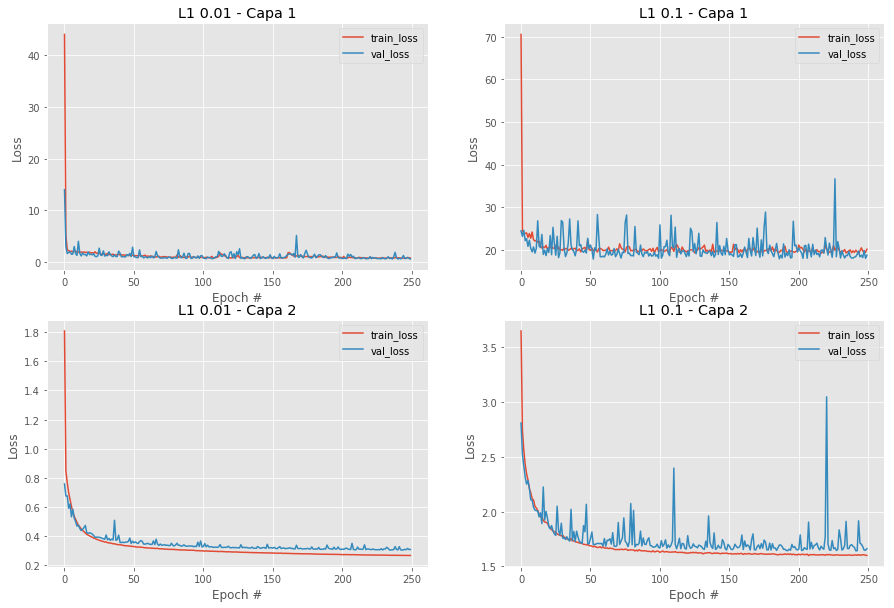

In [9]:
plt.style.use("ggplot")
plt.figure(figsize=(15,10))

plt.subplot(221)
plt.plot(np.arange(0, 250), historyH1.history["loss"], label="train_loss")
plt.plot(np.arange(0, 250), historyH1.history["val_loss"], label="val_loss")
plt.title("L1 0.01 - Capa 1")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend()

plt.subplot(222)
plt.plot(np.arange(0, 250), historyH2.history["loss"], label="train_loss")
plt.plot(np.arange(0, 250), historyH2.history["val_loss"], label="val_loss")
plt.title("L1 0.1 - Capa 1")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend()

plt.subplot(223)
plt.plot(np.arange(0, 250), historyH3.history["loss"], label="train_loss")
plt.plot(np.arange(0, 250), historyH3.history["val_loss"], label="val_loss")
plt.title("L1 0.01 - Capa 2")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend()

plt.subplot(224)
plt.plot(np.arange(0, 250), historyH4.history["loss"], label="train_loss")
plt.plot(np.arange(0, 250), historyH4.history["val_loss"], label="val_loss")
plt.title("L1 0.1 - Capa 2")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend()

plt.show()

Al aumentar el valor del parámetro del regularizador $l1$, el error de entrenamiento en la _epoch_ $1$ va aumentando, y se pueden observar _spikes_ cada vez más altos y con mayor frecuencia en el error de validación.

Al aumentar el valor del parámetro del regularizador $l2$, el error de entrenamiento inicial va aumentando, por ende, decae más rápido, ya que en la segunda _epoch_ los errores entre los experimentos son similares dentro de un rango acotado de $+- 3$.

In [68]:
modelH7 = Sequential()
idim=X_train_scaled.shape[1]
modelH7.add(Dense(256,input_dim=idim,kernel_initializer='uniform',W_regularizer=l1(0.01)))
modelH7.add(Activation('relu'))
modelH7.add(Dense(1, kernel_initializer='uniform',W_regularizer=l1(0.01)))
modelH7.add(Activation('linear'))
modelH7.compile(optimizer=SGD(lr=0.01),loss='mean_squared_error')
historyH7 = modelH7.fit(X_train_scaled, y_train, epochs=250, verbose=1, validation_data=(X_val_scaled, y_val))

modelH8 = Sequential()
idim=X_train_scaled.shape[1]
modelH8.add(Dense(256,input_dim=idim,kernel_initializer='uniform',W_regularizer=l1(0.1)))
modelH8.add(Activation('relu'))
modelH8.add(Dense(1, kernel_initializer='uniform',W_regularizer=l1(0.1)))
modelH8.add(Activation('linear'))
modelH8.compile(optimizer=SGD(lr=0.01),loss='mean_squared_error')
historyH8 = modelH8.fit(X_train_scaled, y_train, epochs=250, verbose=1, validation_data=(X_val_scaled, y_val))

modelH9 = Sequential()
idim=X_train_scaled.shape[1]
modelH9.add(Dense(256,input_dim=idim,kernel_initializer='uniform',W_regularizer=l1(0.2)))
modelH9.add(Activation('relu'))
modelH9.add(Dense(1, kernel_initializer='uniform',W_regularizer=l1(0.2)))
modelH9.add(Activation('relu'))
modelH9.compile(optimizer=SGD(lr=0.01),loss='mean_squared_error')
historyH9 = modelH9.fit(X_train_scaled, y_train, epochs=250, verbose=1, validation_data=(X_val_scaled, y_val))

modelH10 = Sequential()
idim=X_train_scaled.shape[1]
modelH10.add(Dense(256,input_dim=idim,kernel_initializer='uniform',W_regularizer=l2(0.01)))
modelH10.add(Activation('relu'))
modelH10.add(Dense(1, kernel_initializer='uniform',W_regularizer=l2(0.01)))
modelH10.add(Activation('linear'))
modelH10.compile(optimizer=SGD(lr=0.01),loss='mean_squared_error')
historyH10 = modelH10.fit(X_train_scaled, y_train, epochs=250, verbose=1, validation_data=(X_val_scaled, y_val))

modelH11 = Sequential()
idim=X_train_scaled.shape[1]
modelH11.add(Dense(256,input_dim=idim,kernel_initializer='uniform',W_regularizer=l2(0.1)))
modelH11.add(Activation('relu'))
modelH11.add(Dense(1, kernel_initializer='uniform',W_regularizer=l2(0.1)))
modelH11.add(Activation('linear'))
modelH11.compile(optimizer=SGD(lr=0.01),loss='mean_squared_error')
historyH11 = modelH11.fit(X_train_scaled, y_train, epochs=250, verbose=1, validation_data=(X_val_scaled, y_val))

modelH12 = Sequential()
idim=X_train_scaled.shape[1]
modelH12.add(Dense(256,input_dim=idim,kernel_initializer='uniform',W_regularizer=l2(0.2)))
modelH12.add(Activation('relu'))
modelH12.add(Dense(1, kernel_initializer='uniform',W_regularizer=l2(0.2)))
modelH12.add(Activation('linear'))
modelH12.compile(optimizer=SGD(lr=0.01),loss='mean_squared_error')
historyH12 = modelH12.fit(X_train_scaled, y_train, epochs=250, verbose=1, validation_data=(X_val_scaled, y_val))

/home/fchacon/ann/lib/python3.6/site-packages/ipykernel_launcher.py:3: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(256, input_dim=1275, kernel_initializer="uniform", kernel_regularizer=<keras.reg...)`
  This is separate from the ipykernel package so we can avoid doing imports until
/home/fchacon/ann/lib/python3.6/site-packages/ipykernel_launcher.py:5: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="uniform", kernel_regularizer=<keras.reg...)`
  """


Train on 9745 samples, validate on 4060 samples
Epoch 1/250
9745/9745 [==============================] - 4s 362us/step - loss: nan - val_loss: nan
Epoch 2/250
9745/9745 [==============================] - 2s 203us/step - loss: nan - val_loss: nan
Epoch 3/250
9745/9745 [==============================] - 2s 205us/step - loss: nan - val_loss: nan
Epoch 4/250
9745/9745 [==============================] - 2s 202us/step - loss: nan - val_loss: nan
Epoch 5/250
9745/9745 [==============================] - 2s 204us/step - loss: nan - val_loss: nan
Epoch 6/250
9745/9745 [==============================] - 2s 204us/step - loss: nan - val_loss: nan
Epoch 7/250
9745/9745 [==============================] - 2s 204us/step - loss: nan - val_loss: nan
Epoch 8/250
9745/9745 [==============================] - 2s 205us/step - loss: nan - val_loss: nan
Epoch 9/250
9745/9745 [==============================] - 2s 203us/step - loss: nan - val_loss: nan
Epoch 10/250
9745/9745 [==============================] - 2s 

9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoch 164/250
9745/9745 [==============================] - 2s 201us/step - loss: nan - val_loss: nan
Epoch 165/250
9745/9745 [==============================] - 2s 202us/step - loss: nan - val_loss: nan
Epoch 166/250
9745/9745 [==============================] - 2s 202us/step - loss: nan - val_loss: nan
Epoch 167/250
9745/9745 [==============================] - 2s 202us/step - loss: nan - val_loss: nan
Epoch 168/250
9745/9745 [==============================] - 2s 202us/step - loss: nan - val_loss: nan
Epoch 169/250
9745/9745 [==============================] - 2s 203us/step - loss: nan - val_loss: nan
Epoch 170/250
9745/9745 [==============================] - 2s 201us/step - loss: nan - val_loss: nan
Epoch 171/250
9745/9745 [==============================] - 2s 202us/step - loss: nan - val_loss: nan
Epoch 172/250
9745/9745 [==============================] - 2s 201us/step - loss: nan - val_loss: nan
Epoc

/home/fchacon/ann/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(256, input_dim=1275, kernel_initializer="uniform", kernel_regularizer=<keras.reg...)`
  if sys.path[0] == '':
/home/fchacon/ann/lib/python3.6/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="uniform", kernel_regularizer=<keras.reg...)`
  


9745/9745 [==============================] - 3s 357us/step - loss: nan - val_loss: nan
Epoch 2/250
9745/9745 [==============================] - 2s 201us/step - loss: nan - val_loss: nan
Epoch 3/250
9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoch 4/250
9745/9745 [==============================] - 2s 201us/step - loss: nan - val_loss: nan
Epoch 5/250
9745/9745 [==============================] - 2s 201us/step - loss: nan - val_loss: nan
Epoch 6/250
9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoch 7/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 8/250
9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoch 9/250
9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoch 10/250
9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoch 11/250
9745/974

9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoch 165/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 166/250
9745/9745 [==============================] - 2s 201us/step - loss: nan - val_loss: nan
Epoch 167/250
9745/9745 [==============================] - 2s 201us/step - loss: nan - val_loss: nan
Epoch 168/250
9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoch 169/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 170/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 171/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 172/250
9745/9745 [==============================] - 2s 201us/step - loss: nan - val_loss: nan
Epoch 173/250
9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoc

/home/fchacon/ann/lib/python3.6/site-packages/ipykernel_launcher.py:21: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(256, input_dim=1275, kernel_initializer="uniform", kernel_regularizer=<keras.reg...)`
/home/fchacon/ann/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="uniform", kernel_regularizer=<keras.reg...)`


9745/9745 [==============================] - 3s 358us/step - loss: 245.8562 - val_loss: 220.5469
Epoch 2/250
9745/9745 [==============================] - 2s 201us/step - loss: 201.0155 - val_loss: 220.5472
Epoch 3/250
9745/9745 [==============================] - 2s 200us/step - loss: 201.0155 - val_loss: 220.5469
Epoch 4/250
9745/9745 [==============================] - 2s 200us/step - loss: 201.0155 - val_loss: 220.5472
Epoch 5/250
9745/9745 [==============================] - 2s 201us/step - loss: 201.0155 - val_loss: 220.5469
Epoch 6/250
9745/9745 [==============================] - 2s 201us/step - loss: 201.0155 - val_loss: 220.5472
Epoch 7/250
9745/9745 [==============================] - 2s 202us/step - loss: 201.0155 - val_loss: 220.5469
Epoch 8/250
9745/9745 [==============================] - 2s 203us/step - loss: 201.0155 - val_loss: 220.5472
Epoch 9/250
9745/9745 [==============================] - 2s 201us/step - loss: 201.0155 - val_loss: 220.5469
Epoch 10/250
9745/9745 [=======

9745/9745 [==============================] - 2s 205us/step - loss: 201.0155 - val_loss: 220.5469
Epoch 150/250
9745/9745 [==============================] - 2s 201us/step - loss: 201.0155 - val_loss: 220.5472
Epoch 151/250
9745/9745 [==============================] - 2s 201us/step - loss: 201.0155 - val_loss: 220.5469
Epoch 152/250
9745/9745 [==============================] - 2s 202us/step - loss: 201.0156 - val_loss: 220.5472
Epoch 153/250
9745/9745 [==============================] - 2s 201us/step - loss: 201.0155 - val_loss: 220.5469
Epoch 154/250
9745/9745 [==============================] - 2s 201us/step - loss: 201.0155 - val_loss: 220.5472
Epoch 155/250
9745/9745 [==============================] - 2s 202us/step - loss: 201.0155 - val_loss: 220.5469
Epoch 156/250
9745/9745 [==============================] - 2s 202us/step - loss: 201.0155 - val_loss: 220.5472
Epoch 157/250
9745/9745 [==============================] - 2s 201us/step - loss: 201.0155 - val_loss: 220.5469
Epoch 158/250
9

Epoch 223/250
9745/9745 [==============================] - 2s 201us/step - loss: 201.0155 - val_loss: 220.5469
Epoch 224/250
9745/9745 [==============================] - 2s 201us/step - loss: 201.0155 - val_loss: 220.5472
Epoch 225/250
9745/9745 [==============================] - 2s 201us/step - loss: 201.0155 - val_loss: 220.5469
Epoch 226/250
9745/9745 [==============================] - 2s 202us/step - loss: 201.0155 - val_loss: 220.5472
Epoch 227/250
9745/9745 [==============================] - 2s 201us/step - loss: 201.0155 - val_loss: 220.5469
Epoch 228/250
9745/9745 [==============================] - 2s 201us/step - loss: 201.0155 - val_loss: 220.5472
Epoch 229/250
9745/9745 [==============================] - 2s 202us/step - loss: 201.0155 - val_loss: 220.5469
Epoch 230/250
9745/9745 [==============================] - 2s 200us/step - loss: 201.0155 - val_loss: 220.5472
Epoch 231/250
9745/9745 [==============================] - 2s 206us/step - loss: 201.0155 - val_loss: 220.5469
E

/home/fchacon/ann/lib/python3.6/site-packages/ipykernel_launcher.py:30: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(256, input_dim=1275, kernel_initializer="uniform", kernel_regularizer=<keras.reg...)`
/home/fchacon/ann/lib/python3.6/site-packages/ipykernel_launcher.py:32: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="uniform", kernel_regularizer=<keras.reg...)`


9745/9745 [==============================] - 4s 360us/step - loss: nan - val_loss: nan
Epoch 2/250
9745/9745 [==============================] - 2s 198us/step - loss: nan - val_loss: nan
Epoch 3/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 4/250
9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoch 5/250
9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoch 6/250
9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoch 7/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 8/250
9745/9745 [==============================] - 2s 198us/step - loss: nan - val_loss: nan
Epoch 9/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 10/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 11/250
9745/974

9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 165/250
9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoch 166/250
9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoch 167/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 168/250
9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoch 169/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 170/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 171/250
9745/9745 [==============================] - 2s 201us/step - loss: nan - val_loss: nan
Epoch 172/250
9745/9745 [==============================] - 2s 198us/step - loss: nan - val_loss: nan
Epoch 173/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoc

/home/fchacon/ann/lib/python3.6/site-packages/ipykernel_launcher.py:39: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(256, input_dim=1275, kernel_initializer="uniform", kernel_regularizer=<keras.reg...)`
/home/fchacon/ann/lib/python3.6/site-packages/ipykernel_launcher.py:41: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="uniform", kernel_regularizer=<keras.reg...)`


9745/9745 [==============================] - 4s 362us/step - loss: nan - val_loss: nan
Epoch 2/250
9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoch 3/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 4/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 5/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 6/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 7/250
9745/9745 [==============================] - 2s 201us/step - loss: nan - val_loss: nan
Epoch 8/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 9/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 10/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 11/250
9745/974

9745/9745 [==============================] - 2s 198us/step - loss: nan - val_loss: nan
Epoch 165/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 166/250
9745/9745 [==============================] - 2s 198us/step - loss: nan - val_loss: nan
Epoch 167/250
9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoch 168/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 169/250
9745/9745 [==============================] - 2s 201us/step - loss: nan - val_loss: nan
Epoch 170/250
9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoch 171/250
9745/9745 [==============================] - 2s 198us/step - loss: nan - val_loss: nan
Epoch 172/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 173/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoc

/home/fchacon/ann/lib/python3.6/site-packages/ipykernel_launcher.py:48: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(256, input_dim=1275, kernel_initializer="uniform", kernel_regularizer=<keras.reg...)`
/home/fchacon/ann/lib/python3.6/site-packages/ipykernel_launcher.py:50: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="uniform", kernel_regularizer=<keras.reg...)`


9745/9745 [==============================] - 4s 364us/step - loss: nan - val_loss: nan
Epoch 2/250
9745/9745 [==============================] - 2s 201us/step - loss: nan - val_loss: nan
Epoch 3/250
9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoch 4/250
9745/9745 [==============================] - 2s 201us/step - loss: nan - val_loss: nan
Epoch 5/250
9745/9745 [==============================] - 2s 202us/step - loss: nan - val_loss: nan
Epoch 6/250
9745/9745 [==============================] - 2s 202us/step - loss: nan - val_loss: nan
Epoch 7/250
9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoch 8/250
9745/9745 [==============================] - 2s 203us/step - loss: nan - val_loss: nan
Epoch 9/250
9745/9745 [==============================] - 2s 201us/step - loss: nan - val_loss: nan
Epoch 10/250
9745/9745 [==============================] - 2s 199us/step - loss: nan - val_loss: nan
Epoch 11/250
9745/974

9745/9745 [==============================] - 2s 201us/step - loss: nan - val_loss: nan
Epoch 165/250
9745/9745 [==============================] - 2s 202us/step - loss: nan - val_loss: nan
Epoch 166/250
9745/9745 [==============================] - 2s 201us/step - loss: nan - val_loss: nan
Epoch 167/250
9745/9745 [==============================] - 2s 200us/step - loss: nan - val_loss: nan
Epoch 168/250
9745/9745 [==============================] - 2s 201us/step - loss: nan - val_loss: nan
Epoch 169/250
9745/9745 [==============================] - 2s 202us/step - loss: nan - val_loss: nan
Epoch 170/250
9745/9745 [==============================] - 2s 202us/step - loss: nan - val_loss: nan
Epoch 171/250
9745/9745 [==============================] - 2s 202us/step - loss: nan - val_loss: nan
Epoch 172/250
9745/9745 [==============================] - 2s 201us/step - loss: nan - val_loss: nan
Epoch 173/250
9745/9745 [==============================] - 2s 201us/step - loss: nan - val_loss: nan
Epoc

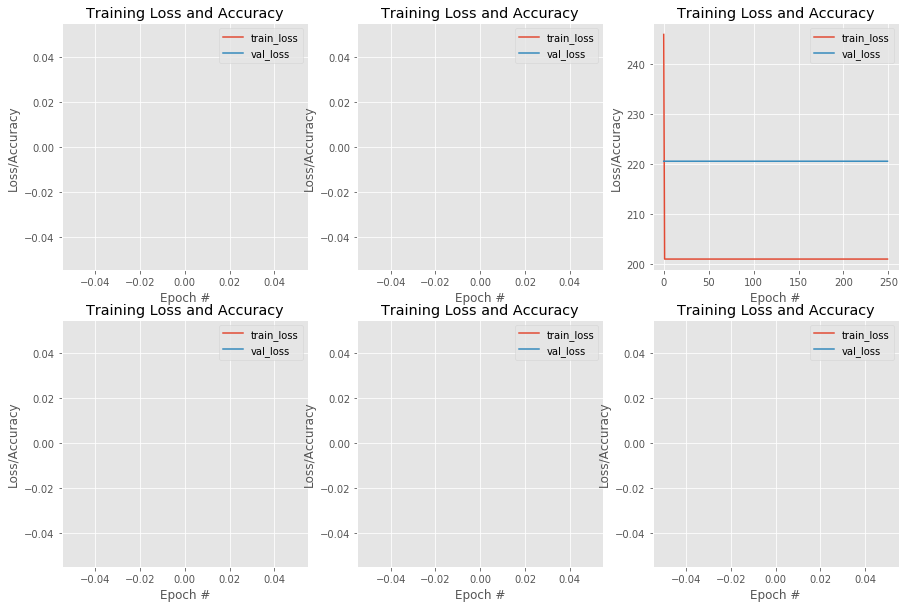

In [75]:
plt.style.use("ggplot")
plt.figure(figsize=(15,10))

plt.subplot(231)
plt.plot(np.arange(0, 250), historyH7.history["loss"], label="train_loss")
plt.plot(np.arange(0, 250), historyH7.history["val_loss"], label="val_loss")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

plt.subplot(232)
plt.plot(np.arange(0, 250), historyH8.history["loss"], label="train_loss")
plt.plot(np.arange(0, 250), historyH8.history["val_loss"], label="val_loss")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

plt.subplot(233)
plt.plot(np.arange(0, 250), historyH9.history["loss"], label="train_loss")
plt.plot(np.arange(0, 250), historyH9.history["val_loss"], label="val_loss")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

plt.subplot(234)
plt.plot(np.arange(0, 250), historyH10.history["loss"], label="train_loss")
plt.plot(np.arange(0, 250), historyH10.history["val_loss"], label="val_loss")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

plt.subplot(235)
plt.plot(np.arange(0, 250), historyH11.history["loss"], label="train_loss")
plt.plot(np.arange(0, 250), historyH11.history["val_loss"], label="val_loss")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

plt.subplot(236)
plt.plot(np.arange(0, 250), historyH12.history["loss"], label="train_loss")
plt.plot(np.arange(0, 250), historyH12.history["val_loss"], label="val_loss")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

plt.show()

Utilizando la función de activación ReLU, todos los modelos divergieron con excepción del que usa el regularizador $l1$ con su parámetro igual a $0.2$. Sin embargo, el modelo no es bueno porque finaliza con un alto error de validación.

i) Entrene los modelos obtenidos en b) y c) utilizando Dropout. Compare los desempeños de prueba obtenidos antes y después de regularizar. Experimente con distintos valores del parámetro de regularización y comente.

In [10]:
dropouts = [0, 0.1,0.2,0.3,0.4,0.5]

In [11]:
historiesI1 = []

for dropout in dropouts:
    modelI1 = Sequential()
    idim=X_train_scaled.shape[1]
    modelI1.add(Dense(256,input_dim=idim,kernel_initializer='uniform'))
    modelI1.add(Activation('sigmoid'))
    modelI1.add(Dropout(dropout))
    modelI1.add(Dense(1, kernel_initializer='uniform'))
    modelI1.add(Activation('linear'))
    modelI1.compile(optimizer=SGD(lr=0.01),loss='mean_squared_error')
    historiesI1.append(modelI1.fit(X_train_scaled, y_train, epochs=250, verbose=1, validation_data=(X_val_scaled, y_val)))

Train on 9745 samples, validate on 4060 samples
Epoch 1/250
9745/9745 [==============================] - 2s 195us/step - loss: 1.5572 - val_loss: 0.7431
Epoch 2/250
9745/9745 [==============================] - 1s 133us/step - loss: 0.6104 - val_loss: 0.4681
Epoch 3/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.5143 - val_loss: 0.3731
Epoch 4/250
9745/9745 [==============================] - 1s 133us/step - loss: 0.4376 - val_loss: 0.3535
Epoch 5/250
9745/9745 [==============================] - 1s 134us/step - loss: 0.3729 - val_loss: 0.3911
Epoch 6/250
9745/9745 [==============================] - 1s 132us/step - loss: 0.3320 - val_loss: 0.2825
Epoch 7/250
9745/9745 [==============================] - 1s 132us/step - loss: 0.2879 - val_loss: 0.2403
Epoch 8/250
9745/9745 [==============================] - 1s 132us/step - loss: 0.2527 - val_loss: 0.2639
Epoch 9/250
9745/9745 [==============================] - 1s 133us/step - loss: 0.2304 - val_loss: 0.1992
Epoch 1

Epoch 78/250
9745/9745 [==============================] - 1s 131us/step - loss: 0.0293 - val_loss: 0.0491
Epoch 79/250
9745/9745 [==============================] - 1s 134us/step - loss: 0.0303 - val_loss: 0.0493
Epoch 80/250
9745/9745 [==============================] - 1s 132us/step - loss: 0.0288 - val_loss: 0.0593
Epoch 81/250
9745/9745 [==============================] - 1s 140us/step - loss: 0.0300 - val_loss: 0.0581
Epoch 82/250
9745/9745 [==============================] - 1s 131us/step - loss: 0.0297 - val_loss: 0.0574
Epoch 83/250
9745/9745 [==============================] - 1s 133us/step - loss: 0.0282 - val_loss: 0.0510
Epoch 84/250
9745/9745 [==============================] - 1s 133us/step - loss: 0.0291 - val_loss: 0.0627
Epoch 85/250
9745/9745 [==============================] - 1s 131us/step - loss: 0.0280 - val_loss: 0.0502
Epoch 86/250
9745/9745 [==============================] - 1s 134us/step - loss: 0.0289 - val_loss: 0.0502
Epoch 87/250
9745/9745 [======================

Epoch 155/250
9745/9745 [==============================] - 1s 131us/step - loss: 0.0197 - val_loss: 0.0382
Epoch 156/250
9745/9745 [==============================] - 1s 131us/step - loss: 0.0202 - val_loss: 0.0405
Epoch 157/250
9745/9745 [==============================] - 1s 132us/step - loss: 0.0206 - val_loss: 0.0455
Epoch 158/250
9745/9745 [==============================] - 1s 132us/step - loss: 0.0201 - val_loss: 0.0367
Epoch 159/250
9745/9745 [==============================] - 1s 132us/step - loss: 0.0201 - val_loss: 0.0510
Epoch 160/250
9745/9745 [==============================] - 1s 130us/step - loss: 0.0193 - val_loss: 0.0436
Epoch 161/250
9745/9745 [==============================] - 1s 132us/step - loss: 0.0199 - val_loss: 0.0371
Epoch 162/250
9745/9745 [==============================] - 1s 137us/step - loss: 0.0197 - val_loss: 0.0441
Epoch 163/250
9745/9745 [==============================] - 1s 138us/step - loss: 0.0196 - val_loss: 0.0369
Epoch 164/250
9745/9745 [============

Epoch 58/250
9745/9745 [==============================] - 1s 136us/step - loss: 0.2503 - val_loss: 0.1684
Epoch 59/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.2403 - val_loss: 0.1709
Epoch 60/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.2398 - val_loss: 0.1603
Epoch 61/250
9745/9745 [==============================] - 1s 136us/step - loss: 0.2422 - val_loss: 0.4419
Epoch 62/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.2414 - val_loss: 0.1624
Epoch 63/250
9745/9745 [==============================] - 1s 134us/step - loss: 0.2397 - val_loss: 0.1411
Epoch 64/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.2392 - val_loss: 0.1647
Epoch 65/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.2341 - val_loss: 0.1441
Epoch 66/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.2397 - val_loss: 0.1446
Epoch 67/250
9745/9745 [======================

Epoch 135/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.1927 - val_loss: 0.1528
Epoch 136/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.1911 - val_loss: 0.1307
Epoch 137/250
9745/9745 [==============================] - 1s 137us/step - loss: 0.1979 - val_loss: 0.1356
Epoch 138/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.1977 - val_loss: 0.1523
Epoch 139/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.1958 - val_loss: 0.1396
Epoch 140/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.1986 - val_loss: 0.1234
Epoch 141/250
9745/9745 [==============================] - 1s 138us/step - loss: 0.1894 - val_loss: 0.1230
Epoch 142/250
9745/9745 [==============================] - 1s 136us/step - loss: 0.1969 - val_loss: 0.1290
Epoch 143/250
9745/9745 [==============================] - 1s 136us/step - loss: 0.1941 - val_loss: 0.1138
Epoch 144/250
9745/9745 [============

9745/9745 [==============================] - 1s 135us/step - loss: 0.3729 - val_loss: 0.2105
Epoch 38/250
9745/9745 [==============================] - 1s 143us/step - loss: 0.3705 - val_loss: 0.2225
Epoch 39/250
9745/9745 [==============================] - 1s 139us/step - loss: 0.3780 - val_loss: 0.3492
Epoch 40/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.3757 - val_loss: 0.2165
Epoch 41/250
9745/9745 [==============================] - 1s 136us/step - loss: 0.3688 - val_loss: 0.2664
Epoch 42/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.3556 - val_loss: 0.2273
Epoch 43/250
9745/9745 [==============================] - 1s 136us/step - loss: 0.3605 - val_loss: 0.1909
Epoch 44/250
9745/9745 [==============================] - 1s 136us/step - loss: 0.3572 - val_loss: 0.1871
Epoch 45/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.3610 - val_loss: 0.2762
Epoch 46/250
9745/9745 [==============================] - 1

9745/9745 [==============================] - 1s 137us/step - loss: 0.2619 - val_loss: 0.2440
Epoch 191/250
9745/9745 [==============================] - 1s 136us/step - loss: 0.2608 - val_loss: 0.1522
Epoch 192/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.2586 - val_loss: 0.1809
Epoch 193/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.2543 - val_loss: 0.1483
Epoch 194/250
9745/9745 [==============================] - 1s 138us/step - loss: 0.2587 - val_loss: 0.1430
Epoch 195/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.2509 - val_loss: 0.1506
Epoch 196/250
9745/9745 [==============================] - 1s 135us/step - loss: 0.2535 - val_loss: 0.1593
Epoch 197/250
9745/9745 [==============================] - 1s 138us/step - loss: 0.2549 - val_loss: 0.1422
Epoch 198/250
9745/9745 [==============================] - 1s 138us/step - loss: 0.2586 - val_loss: 0.1413
Epoch 199/250
9745/9745 [==========================

9745/9745 [==============================] - 1s 139us/step - loss: 0.3956 - val_loss: 0.1954
Epoch 94/250
9745/9745 [==============================] - 1s 140us/step - loss: 0.3833 - val_loss: 0.1978
Epoch 95/250
9745/9745 [==============================] - 1s 139us/step - loss: 0.3916 - val_loss: 0.2072
Epoch 96/250
9745/9745 [==============================] - 1s 138us/step - loss: 0.3846 - val_loss: 0.2532
Epoch 97/250
9745/9745 [==============================] - 1s 137us/step - loss: 0.3895 - val_loss: 0.2124
Epoch 98/250
9745/9745 [==============================] - 1s 140us/step - loss: 0.3824 - val_loss: 0.2467
Epoch 99/250
9745/9745 [==============================] - 1s 139us/step - loss: 0.3931 - val_loss: 0.2340
Epoch 100/250
9745/9745 [==============================] - 1s 139us/step - loss: 0.3855 - val_loss: 0.1966
Epoch 101/250
9745/9745 [==============================] - 1s 140us/step - loss: 0.3866 - val_loss: 0.2601
Epoch 102/250
9745/9745 [==============================] 

9745/9745 [==============================] - 1s 140us/step - loss: 0.3302 - val_loss: 0.4191
Epoch 246/250
9745/9745 [==============================] - 1s 140us/step - loss: 0.3274 - val_loss: 0.4571
Epoch 247/250
9745/9745 [==============================] - 1s 137us/step - loss: 0.3384 - val_loss: 0.1743
Epoch 248/250
9745/9745 [==============================] - 1s 138us/step - loss: 0.3268 - val_loss: 0.2451
Epoch 249/250
9745/9745 [==============================] - 1s 138us/step - loss: 0.3270 - val_loss: 0.1754
Epoch 250/250
9745/9745 [==============================] - 1s 138us/step - loss: 0.3339 - val_loss: 0.2020
Train on 9745 samples, validate on 4060 samples
Epoch 1/250
9745/9745 [==============================] - 2s 207us/step - loss: 1.9431 - val_loss: 0.7089
Epoch 2/250
9745/9745 [==============================] - 1s 138us/step - loss: 1.0993 - val_loss: 1.5194
Epoch 3/250
9745/9745 [==============================] - 1s 140us/step - loss: 1.0221 - val_loss: 0.5308
Epoch 4/2

Epoch 72/250
9745/9745 [==============================] - 1s 138us/step - loss: 0.5068 - val_loss: 0.2365
Epoch 73/250
9745/9745 [==============================] - 1s 138us/step - loss: 0.5084 - val_loss: 0.2314
Epoch 74/250
9745/9745 [==============================] - 1s 145us/step - loss: 0.4942 - val_loss: 0.4444
Epoch 75/250
9745/9745 [==============================] - 1s 139us/step - loss: 0.4912 - val_loss: 0.2304
Epoch 76/250
9745/9745 [==============================] - 1s 137us/step - loss: 0.4995 - val_loss: 0.3028
Epoch 77/250
9745/9745 [==============================] - 1s 137us/step - loss: 0.4984 - val_loss: 0.2314
Epoch 78/250
9745/9745 [==============================] - 1s 140us/step - loss: 0.4946 - val_loss: 0.2472
Epoch 79/250
9745/9745 [==============================] - 1s 139us/step - loss: 0.4986 - val_loss: 0.2414
Epoch 80/250
9745/9745 [==============================] - 1s 139us/step - loss: 0.4905 - val_loss: 0.2399
Epoch 81/250
9745/9745 [======================

Epoch 149/250
9745/9745 [==============================] - 1s 139us/step - loss: 0.4554 - val_loss: 0.2669
Epoch 150/250
9745/9745 [==============================] - 1s 139us/step - loss: 0.4463 - val_loss: 0.2175
Epoch 151/250
9745/9745 [==============================] - 1s 146us/step - loss: 0.4508 - val_loss: 0.2770
Epoch 152/250
9745/9745 [==============================] - 1s 146us/step - loss: 0.4534 - val_loss: 0.1998
Epoch 153/250
9745/9745 [==============================] - 1s 144us/step - loss: 0.4513 - val_loss: 0.2033
Epoch 154/250
9745/9745 [==============================] - 1s 142us/step - loss: 0.4455 - val_loss: 0.3458
Epoch 155/250
9745/9745 [==============================] - 2s 159us/step - loss: 0.4423 - val_loss: 0.2007
Epoch 156/250
9745/9745 [==============================] - 2s 176us/step - loss: 0.4405 - val_loss: 0.2057
Epoch 157/250
9745/9745 [==============================] - 2s 157us/step - loss: 0.4491 - val_loss: 0.2818
Epoch 158/250
9745/9745 [============

Epoch 52/250
9745/9745 [==============================] - 1s 139us/step - loss: 0.6475 - val_loss: 0.2824
Epoch 53/250
9745/9745 [==============================] - 1s 140us/step - loss: 0.6693 - val_loss: 0.3265
Epoch 54/250
9745/9745 [==============================] - 1s 139us/step - loss: 0.6727 - val_loss: 0.4305
Epoch 55/250
9745/9745 [==============================] - 1s 141us/step - loss: 0.6441 - val_loss: 0.4374
Epoch 56/250
9745/9745 [==============================] - 1s 140us/step - loss: 0.6603 - val_loss: 0.2882
Epoch 57/250
9745/9745 [==============================] - 1s 139us/step - loss: 0.6353 - val_loss: 0.2939
Epoch 58/250
9745/9745 [==============================] - 1s 139us/step - loss: 0.6570 - val_loss: 0.3266
Epoch 59/250
9745/9745 [==============================] - 1s 141us/step - loss: 0.6399 - val_loss: 0.3864
Epoch 60/250
9745/9745 [==============================] - 1s 141us/step - loss: 0.6343 - val_loss: 0.3578
Epoch 61/250
9745/9745 [======================

9745/9745 [==============================] - 1s 140us/step - loss: 0.5767 - val_loss: 0.3089
Epoch 130/250
9745/9745 [==============================] - 1s 140us/step - loss: 0.5812 - val_loss: 0.6066
Epoch 131/250
9745/9745 [==============================] - 1s 140us/step - loss: 0.5712 - val_loss: 0.2418
Epoch 132/250
9745/9745 [==============================] - 1s 147us/step - loss: 0.5869 - val_loss: 0.2731
Epoch 133/250
9745/9745 [==============================] - 1s 152us/step - loss: 0.5718 - val_loss: 0.3017
Epoch 134/250
9745/9745 [==============================] - 1s 143us/step - loss: 0.5589 - val_loss: 0.2580
Epoch 135/250
9745/9745 [==============================] - 1s 142us/step - loss: 0.5677 - val_loss: 0.2588
Epoch 136/250
9745/9745 [==============================] - 1s 139us/step - loss: 0.5779 - val_loss: 0.5503
Epoch 137/250
9745/9745 [==============================] - 1s 140us/step - loss: 0.5670 - val_loss: 0.2500
Epoch 138/250
9745/9745 [==========================

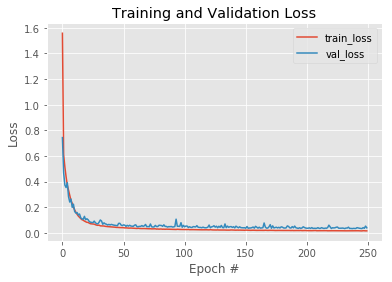

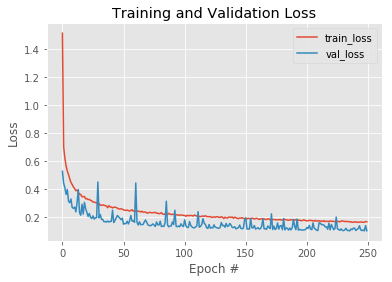

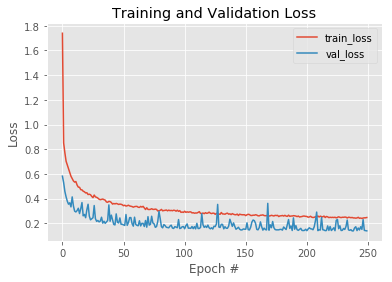

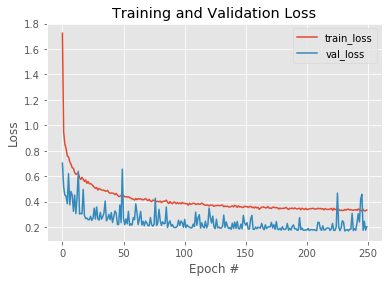

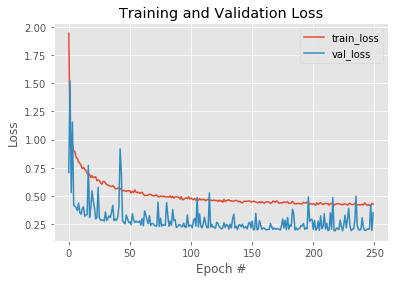

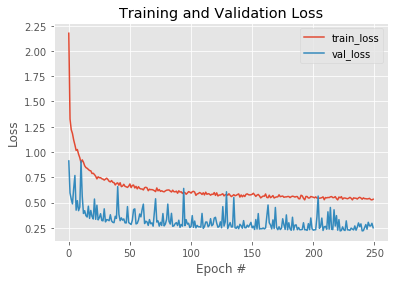

In [12]:
for i in range(len(dropouts)):
    plt.style.use("ggplot")
    plt.plot(np.arange(0, 250), historiesI1[i].history["loss"], label="train_loss")
    plt.plot(np.arange(0, 250), historiesI1[i].history["val_loss"], label="val_loss")
    plt.title("Training and Validation Loss")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

Al aumentar el porcentaje de _Dropout_, el error de validación comienza a tener _spikes_ más notorios y el error de entrenamiento al comienzo aumenta levemente con cada experimento. Además, ambos errores empiezan a converger en errores más altos, alejándose más entre si, ya que el de entrenamiento sube en mayor medida que el de validación.

In [13]:
historiesI2 = []

for dropout in dropouts:
    modelI2 = Sequential()
    idim=X_train_scaled.shape[1]
    modelI2.add(Dense(256,input_dim=idim,kernel_initializer='uniform'))
    modelI2.add(Activation('relu'))
    modelI2.add(Dropout(dropout))
    modelI2.add(Dense(1, kernel_initializer='uniform'))
    modelI2.add(Activation('linear'))
    modelI2.compile(optimizer=SGD(lr=0.01),loss='mean_squared_error')
    historiesI2.append(modelI2.fit(X_train_scaled, y_train, epochs=250, verbose=1, validation_data=(X_val_scaled, y_val)))

Train on 9745 samples, validate on 4060 samples
Epoch 1/250
9745/9745 [==============================] - 2s 216us/step - loss: nan - val_loss: nan
Epoch 2/250
9745/9745 [==============================] - 1s 147us/step - loss: nan - val_loss: nan
Epoch 3/250
9745/9745 [==============================] - 1s 149us/step - loss: nan - val_loss: nan
Epoch 4/250
9745/9745 [==============================] - 1s 149us/step - loss: nan - val_loss: nan
Epoch 5/250
9745/9745 [==============================] - 2s 155us/step - loss: nan - val_loss: nan
Epoch 6/250
9745/9745 [==============================] - 1s 151us/step - loss: nan - val_loss: nan
Epoch 7/250
9745/9745 [==============================] - 1s 151us/step - loss: nan - val_loss: nan
Epoch 8/250
9745/9745 [==============================] - 2s 157us/step - loss: nan - val_loss: nan
Epoch 9/250
9745/9745 [==============================] - 1s 149us/step - loss: nan - val_loss: nan
Epoch 10/250
9745/9745 [==============================] - 1s 

9745/9745 [==============================] - 1s 138us/step - loss: nan - val_loss: nan
Epoch 164/250
9745/9745 [==============================] - 1s 138us/step - loss: nan - val_loss: nan
Epoch 165/250
9745/9745 [==============================] - 1s 139us/step - loss: nan - val_loss: nan
Epoch 166/250
9745/9745 [==============================] - 1s 136us/step - loss: nan - val_loss: nan
Epoch 167/250
9745/9745 [==============================] - 1s 139us/step - loss: nan - val_loss: nan
Epoch 168/250
9745/9745 [==============================] - 1s 138us/step - loss: nan - val_loss: nan
Epoch 169/250
9745/9745 [==============================] - 1s 137us/step - loss: nan - val_loss: nan
Epoch 170/250
9745/9745 [==============================] - 1s 137us/step - loss: nan - val_loss: nan
Epoch 171/250
9745/9745 [==============================] - 1s 137us/step - loss: nan - val_loss: nan
Epoch 172/250
9745/9745 [==============================] - 1s 136us/step - loss: nan - val_loss: nan
Epoc

9745/9745 [==============================] - 1s 141us/step - loss: nan - val_loss: nan
Epoch 76/250
9745/9745 [==============================] - 1s 139us/step - loss: nan - val_loss: nan
Epoch 77/250
9745/9745 [==============================] - 1s 144us/step - loss: nan - val_loss: nan
Epoch 78/250
9745/9745 [==============================] - 1s 142us/step - loss: nan - val_loss: nan
Epoch 79/250
9745/9745 [==============================] - 1s 141us/step - loss: nan - val_loss: nan
Epoch 80/250
9745/9745 [==============================] - 1s 142us/step - loss: nan - val_loss: nan
Epoch 81/250
9745/9745 [==============================] - 1s 143us/step - loss: nan - val_loss: nan
Epoch 82/250
9745/9745 [==============================] - 1s 142us/step - loss: nan - val_loss: nan
Epoch 83/250
9745/9745 [==============================] - 1s 140us/step - loss: nan - val_loss: nan
Epoch 84/250
9745/9745 [==============================] - 1s 140us/step - loss: nan - val_loss: nan
Epoch 85/250


9745/9745 [==============================] - 1s 141us/step - loss: nan - val_loss: nan
Epoch 238/250
9745/9745 [==============================] - 1s 140us/step - loss: nan - val_loss: nan
Epoch 239/250
9745/9745 [==============================] - 1s 140us/step - loss: nan - val_loss: nan
Epoch 240/250
9745/9745 [==============================] - 1s 142us/step - loss: nan - val_loss: nan
Epoch 241/250
9745/9745 [==============================] - 1s 139us/step - loss: nan - val_loss: nan
Epoch 242/250
9745/9745 [==============================] - 1s 142us/step - loss: nan - val_loss: nan
Epoch 243/250
9745/9745 [==============================] - 1s 141us/step - loss: nan - val_loss: nan
Epoch 244/250
9745/9745 [==============================] - 1s 141us/step - loss: nan - val_loss: nan
Epoch 245/250
9745/9745 [==============================] - 1s 142us/step - loss: nan - val_loss: nan
Epoch 246/250
9745/9745 [==============================] - 1s 141us/step - loss: nan - val_loss: nan
Epoc

9745/9745 [==============================] - 1s 141us/step - loss: nan - val_loss: nan
Epoch 150/250
9745/9745 [==============================] - 1s 143us/step - loss: nan - val_loss: nan
Epoch 151/250
9745/9745 [==============================] - 1s 140us/step - loss: nan - val_loss: nan
Epoch 152/250
9745/9745 [==============================] - 1s 143us/step - loss: nan - val_loss: nan
Epoch 153/250
9745/9745 [==============================] - 1s 141us/step - loss: nan - val_loss: nan
Epoch 154/250
9745/9745 [==============================] - 1s 143us/step - loss: nan - val_loss: nan
Epoch 155/250
9745/9745 [==============================] - 1s 139us/step - loss: nan - val_loss: nan
Epoch 156/250
9745/9745 [==============================] - 1s 141us/step - loss: nan - val_loss: nan
Epoch 157/250
9745/9745 [==============================] - 1s 140us/step - loss: nan - val_loss: nan
Epoch 158/250
9745/9745 [==============================] - 1s 140us/step - loss: nan - val_loss: nan
Epoc

9745/9745 [==============================] - 1s 143us/step - loss: nan - val_loss: nan
Epoch 62/250
9745/9745 [==============================] - 1s 142us/step - loss: nan - val_loss: nan
Epoch 63/250
9745/9745 [==============================] - 1s 142us/step - loss: nan - val_loss: nan
Epoch 64/250
9745/9745 [==============================] - 1s 143us/step - loss: nan - val_loss: nan
Epoch 65/250
9745/9745 [==============================] - 1s 143us/step - loss: nan - val_loss: nan
Epoch 66/250
9745/9745 [==============================] - 1s 143us/step - loss: nan - val_loss: nan
Epoch 67/250
9745/9745 [==============================] - 1s 148us/step - loss: nan - val_loss: nan
Epoch 68/250
9745/9745 [==============================] - 1s 140us/step - loss: nan - val_loss: nan
Epoch 69/250
9745/9745 [==============================] - 1s 142us/step - loss: nan - val_loss: nan
Epoch 70/250
9745/9745 [==============================] - 1s 143us/step - loss: nan - val_loss: nan
Epoch 71/250


9745/9745 [==============================] - 1s 143us/step - loss: nan - val_loss: nan
Epoch 224/250
9745/9745 [==============================] - 1s 141us/step - loss: nan - val_loss: nan
Epoch 225/250
9745/9745 [==============================] - 1s 145us/step - loss: nan - val_loss: nan
Epoch 226/250
9745/9745 [==============================] - 1s 144us/step - loss: nan - val_loss: nan
Epoch 227/250
9745/9745 [==============================] - 1s 143us/step - loss: nan - val_loss: nan
Epoch 228/250
9745/9745 [==============================] - 1s 144us/step - loss: nan - val_loss: nan
Epoch 229/250
9745/9745 [==============================] - 1s 144us/step - loss: nan - val_loss: nan
Epoch 230/250
9745/9745 [==============================] - 1s 141us/step - loss: nan - val_loss: nan
Epoch 231/250
9745/9745 [==============================] - 1s 145us/step - loss: nan - val_loss: nan
Epoch 232/250
9745/9745 [==============================] - 1s 143us/step - loss: nan - val_loss: nan
Epoc

9745/9745 [==============================] - 1s 144us/step - loss: nan - val_loss: nan
Epoch 136/250
9745/9745 [==============================] - 1s 144us/step - loss: nan - val_loss: nan
Epoch 137/250
9745/9745 [==============================] - 1s 142us/step - loss: nan - val_loss: nan
Epoch 138/250
9745/9745 [==============================] - 1s 144us/step - loss: nan - val_loss: nan
Epoch 139/250
9745/9745 [==============================] - 1s 144us/step - loss: nan - val_loss: nan
Epoch 140/250
9745/9745 [==============================] - 1s 144us/step - loss: nan - val_loss: nan
Epoch 141/250
9745/9745 [==============================] - 1s 145us/step - loss: nan - val_loss: nan
Epoch 142/250
9745/9745 [==============================] - 1s 144us/step - loss: nan - val_loss: nan
Epoch 143/250
9745/9745 [==============================] - 1s 148us/step - loss: nan - val_loss: nan
Epoch 144/250
9745/9745 [==============================] - 1s 147us/step - loss: nan - val_loss: nan
Epoc

9745/9745 [==============================] - 1s 145us/step - loss: nan - val_loss: nan
Epoch 48/250
9745/9745 [==============================] - 1s 145us/step - loss: nan - val_loss: nan
Epoch 49/250
9745/9745 [==============================] - 1s 146us/step - loss: nan - val_loss: nan
Epoch 50/250
9745/9745 [==============================] - 1s 145us/step - loss: nan - val_loss: nan
Epoch 51/250
9745/9745 [==============================] - 1s 144us/step - loss: nan - val_loss: nan
Epoch 52/250
9745/9745 [==============================] - 1s 145us/step - loss: nan - val_loss: nan
Epoch 53/250
9745/9745 [==============================] - 2s 155us/step - loss: nan - val_loss: nan
Epoch 54/250
9745/9745 [==============================] - 1s 150us/step - loss: nan - val_loss: nan
Epoch 55/250
9745/9745 [==============================] - 1s 149us/step - loss: nan - val_loss: nan
Epoch 56/250
9745/9745 [==============================] - 1s 147us/step - loss: nan - val_loss: nan
Epoch 57/250


9745/9745 [==============================] - 1s 146us/step - loss: nan - val_loss: nan
Epoch 210/250
9745/9745 [==============================] - 1s 147us/step - loss: nan - val_loss: nan
Epoch 211/250
9745/9745 [==============================] - 1s 145us/step - loss: nan - val_loss: nan
Epoch 212/250
9745/9745 [==============================] - 1s 146us/step - loss: nan - val_loss: nan
Epoch 213/250
9745/9745 [==============================] - 1s 146us/step - loss: nan - val_loss: nan
Epoch 214/250
9745/9745 [==============================] - 1s 145us/step - loss: nan - val_loss: nan
Epoch 215/250
9745/9745 [==============================] - 1s 147us/step - loss: nan - val_loss: nan
Epoch 216/250
9745/9745 [==============================] - 1s 145us/step - loss: nan - val_loss: nan
Epoch 217/250
9745/9745 [==============================] - 1s 146us/step - loss: nan - val_loss: nan
Epoch 218/250
9745/9745 [==============================] - 1s 145us/step - loss: nan - val_loss: nan
Epoc

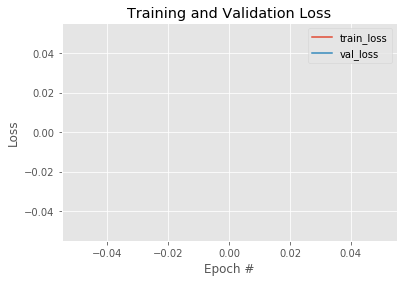

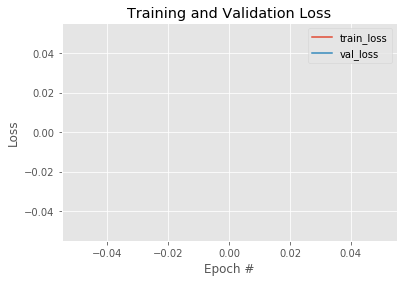

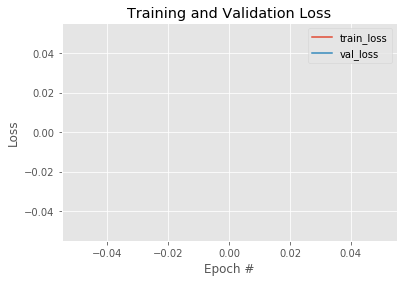

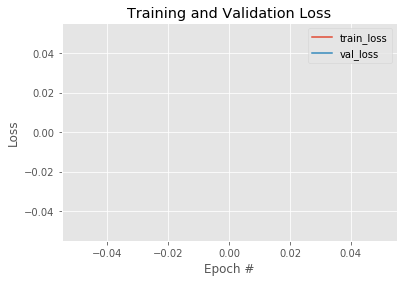

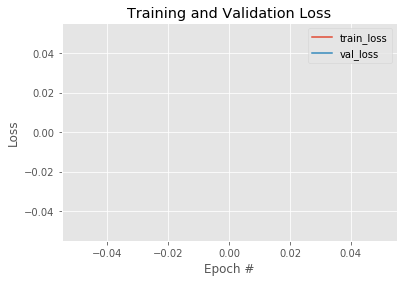

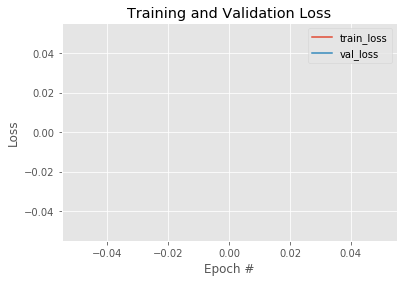

In [14]:
for i in range(len(dropouts)):
    plt.style.use("ggplot")
    plt.plot(np.arange(0, 250), historiesI2[i].history["loss"], label="train_loss")
    plt.plot(np.arange(0, 250), historiesI2[i].history["val_loss"], label="val_loss")
    plt.title("Training and Validation Loss")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

Utilizando la función de activación ReLU, todos los modelos, con distintos porcentajes de _Dropout_, divergieron.

j) Fijando todos los demás hiper-parámetros del modelo definido en b) y en c), utilice validación cruzada con un número de folds igual a K = 5 y K=10 para determinar el mejor valor correspondiente a un parámetro que usted elija (tasa de aprendizaje, número de neuronas, parámetro de regularización, etc) ¿El mejor parámetro para la red con sigmoidal es distinto que para ReLU? ¿Porqué sucede? Además mida el error real del modelo sobre el conjunto de pruebas, compare y concluya.

## Cantidad de Neuronas
El mejor parámetro es 512 neuronas para todos los modelos con función de activación sigmoidal y ReLU. No sé.

## Learning rate
EL mejor parámetro es de 0.01 en SGD para todos los modelos con función de activación sigmoidal y ReLU. No sé.

In [7]:
Xm = X_train_scaled.values
ym = y_train
kfold = KFold(n_splits=5)
neurons1 = [32,64,128,256,512]
cvscores = []
all_mse_cvJ1 = []
for neuron in neurons1:
    for train, val in kfold.split(Xm):
        modelJ1 = Sequential()
        modelJ1.add(Dense(neuron,kernel_initializer='uniform'))
        modelJ1.add(Activation('sigmoid'))
        modelJ1.add(Dense(1, kernel_initializer='uniform'))
        modelJ1.add(Activation('linear'))
        modelJ1.compile(optimizer=Adagrad(lr=0.01),loss='mean_squared_error')
        modelJ1.fit(Xm[train], ym[train], epochs=250, verbose=1)
        scores = modelJ1.evaluate(Xm[val], ym[val])
        cvscores.append(scores)
    mse_cvJ1 = np.mean(cvscores)
    all_mse_cvJ1.append(mse_cvJ1)
indexModelJ1 = all_mse_cvJ1.index(min(all_mse_cvJ1))

Epoch 1/250
7796/7796 [==============================] - 1s 105us/step - loss: 49.2068
Epoch 2/250
7796/7796 [==============================] - 0s 48us/step - loss: 20.7237
Epoch 3/250
7796/7796 [==============================] - 0s 46us/step - loss: 14.6969
Epoch 4/250
7796/7796 [==============================] - 0s 46us/step - loss: 12.0489
Epoch 5/250
7796/7796 [==============================] - 0s 47us/step - loss: 10.6968
Epoch 6/250
7796/7796 [==============================] - 0s 47us/step - loss: 9.7409
Epoch 7/250
7796/7796 [==============================] - 0s 46us/step - loss: 9.0863
Epoch 8/250
7796/7796 [==============================] - 0s 47us/step - loss: 8.6835
Epoch 9/250
7796/7796 [==============================] - 0s 46us/step - loss: 8.2703
Epoch 10/250
7796/7796 [==============================] - 0s 47us/step - loss: 7.8816
Epoch 11/250
7796/7796 [==============================] - 0s 47us/step - loss: 7.5695
Epoch 12/250
7796/7796 [==============================] -

7796/7796 [==============================] - 0s 46us/step - loss: 1.0305
Epoch 191/250
7796/7796 [==============================] - 0s 45us/step - loss: 1.0272
Epoch 192/250
7796/7796 [==============================] - 0s 45us/step - loss: 1.0237
Epoch 193/250
7796/7796 [==============================] - 0s 45us/step - loss: 1.0204
Epoch 194/250
7796/7796 [==============================] - 0s 45us/step - loss: 1.0170
Epoch 195/250
7796/7796 [==============================] - 0s 44us/step - loss: 1.0136
Epoch 196/250
7796/7796 [==============================] - 0s 46us/step - loss: 1.0102
Epoch 197/250
7796/7796 [==============================] - 0s 46us/step - loss: 1.0069
Epoch 198/250
7796/7796 [==============================] - 0s 47us/step - loss: 1.0036
Epoch 199/250
7796/7796 [==============================] - 0s 45us/step - loss: 0.9950
Epoch 200/250
7796/7796 [==============================] - 0s 46us/step - loss: 0.9901
Epoch 201/250
7796/7796 [==============================] 

7796/7796 [==============================] - 0s 46us/step - loss: 4.4570
Epoch 35/250
7796/7796 [==============================] - 0s 45us/step - loss: 4.3879
Epoch 36/250
7796/7796 [==============================] - 0s 47us/step - loss: 4.2886
Epoch 37/250
7796/7796 [==============================] - 0s 45us/step - loss: 4.2426
Epoch 38/250
7796/7796 [==============================] - 0s 46us/step - loss: 4.1980
Epoch 39/250
7796/7796 [==============================] - 0s 45us/step - loss: 4.0768
Epoch 40/250
7796/7796 [==============================] - 0s 45us/step - loss: 4.0188
Epoch 41/250
7796/7796 [==============================] - 0s 46us/step - loss: 3.9803
Epoch 42/250
7796/7796 [==============================] - 0s 45us/step - loss: 3.9460
Epoch 43/250
7796/7796 [==============================] - 0s 45us/step - loss: 3.9146
Epoch 44/250
7796/7796 [==============================] - 0s 47us/step - loss: 3.8827
Epoch 45/250
7796/7796 [==============================] - 0s 55us/s

7796/7796 [==============================] - 0s 46us/step - loss: 1.9367
Epoch 130/250
7796/7796 [==============================] - 0s 45us/step - loss: 1.9267
Epoch 131/250
7796/7796 [==============================] - 0s 47us/step - loss: 1.9170
Epoch 132/250
7796/7796 [==============================] - 0s 45us/step - loss: 1.9016
Epoch 133/250
7796/7796 [==============================] - 0s 47us/step - loss: 1.8892
Epoch 134/250
7796/7796 [==============================] - 0s 46us/step - loss: 1.8786
Epoch 135/250
7796/7796 [==============================] - 0s 45us/step - loss: 1.8680
Epoch 136/250
7796/7796 [==============================] - 0s 45us/step - loss: 1.8584
Epoch 137/250
7796/7796 [==============================] - 0s 45us/step - loss: 1.8491
Epoch 138/250
7796/7796 [==============================] - 0s 45us/step - loss: 1.8394
Epoch 139/250
7796/7796 [==============================] - 0s 45us/step - loss: 1.8294
Epoch 140/250
7796/7796 [==============================] 

7796/7796 [==============================] - 0s 47us/step - loss: 2.7287
Epoch 68/250
7796/7796 [==============================] - 0s 45us/step - loss: 2.7060
Epoch 69/250
7796/7796 [==============================] - 0s 47us/step - loss: 2.6839
Epoch 70/250
7796/7796 [==============================] - 0s 45us/step - loss: 2.6617
Epoch 71/250
7796/7796 [==============================] - 0s 46us/step - loss: 2.6160
Epoch 72/250
7796/7796 [==============================] - 0s 46us/step - loss: 2.5641
Epoch 73/250
7796/7796 [==============================] - 0s 46us/step - loss: 2.5358
Epoch 74/250
7796/7796 [==============================] - 0s 46us/step - loss: 2.5136
Epoch 75/250
7796/7796 [==============================] - 0s 46us/step - loss: 2.4920
Epoch 76/250
7796/7796 [==============================] - 0s 46us/step - loss: 2.4718
Epoch 77/250
7796/7796 [==============================] - 0s 46us/step - loss: 2.4519
Epoch 78/250
7796/7796 [==============================] - 0s 46us/s

7796/7796 [==============================] - 0s 46us/step - loss: 13.2483
Epoch 5/250
7796/7796 [==============================] - 0s 46us/step - loss: 11.5936
Epoch 6/250
7796/7796 [==============================] - 0s 45us/step - loss: 10.3971
Epoch 7/250
7796/7796 [==============================] - 0s 46us/step - loss: 9.5938
Epoch 8/250
7796/7796 [==============================] - 0s 46us/step - loss: 8.9532
Epoch 9/250
7796/7796 [==============================] - 0s 47us/step - loss: 8.4461
Epoch 10/250
7796/7796 [==============================] - 0s 46us/step - loss: 8.0712
Epoch 11/250
7796/7796 [==============================] - 0s 46us/step - loss: 7.7297
Epoch 12/250
7796/7796 [==============================] - 0s 47us/step - loss: 7.4887
Epoch 13/250
7796/7796 [==============================] - 0s 46us/step - loss: 7.2812
Epoch 14/250
7796/7796 [==============================] - 0s 45us/step - loss: 7.0004
Epoch 15/250
7796/7796 [==============================] - 0s 46us/ste

7796/7796 [==============================] - 0s 47us/step - loss: 1.2090
Epoch 194/250
7796/7796 [==============================] - 0s 45us/step - loss: 1.2058
Epoch 195/250
7796/7796 [==============================] - 0s 45us/step - loss: 1.2026
Epoch 196/250
7796/7796 [==============================] - 0s 46us/step - loss: 1.1994
Epoch 197/250
7796/7796 [==============================] - 0s 46us/step - loss: 1.1962
Epoch 198/250
7796/7796 [==============================] - 0s 45us/step - loss: 1.1931
Epoch 199/250
7796/7796 [==============================] - 0s 57us/step - loss: 1.1899
Epoch 200/250
7796/7796 [==============================] - 0s 46us/step - loss: 1.1867
Epoch 201/250
7796/7796 [==============================] - 0s 45us/step - loss: 1.1836
Epoch 202/250
7796/7796 [==============================] - 0s 46us/step - loss: 1.1806
Epoch 203/250
7796/7796 [==============================] - 0s 47us/step - loss: 1.1772
Epoch 204/250
7796/7796 [==============================] 

7796/7796 [==============================] - 0s 47us/step - loss: 4.8251
Epoch 38/250
7796/7796 [==============================] - 0s 47us/step - loss: 4.7754
Epoch 39/250
7796/7796 [==============================] - 0s 47us/step - loss: 4.6575
Epoch 40/250
7796/7796 [==============================] - 0s 46us/step - loss: 4.5700
Epoch 41/250
7796/7796 [==============================] - 0s 46us/step - loss: 4.5033
Epoch 42/250
7796/7796 [==============================] - 0s 47us/step - loss: 4.4439
Epoch 43/250
7796/7796 [==============================] - 0s 53us/step - loss: 4.3925
Epoch 44/250
7796/7796 [==============================] - 0s 46us/step - loss: 4.3309
Epoch 45/250
7796/7796 [==============================] - 0s 52us/step - loss: 4.2776
Epoch 46/250
7796/7796 [==============================] - 0s 46us/step - loss: 4.2159
Epoch 47/250
7796/7796 [==============================] - 0s 52us/step - loss: 4.1565
Epoch 48/250
7796/7796 [==============================] - 0s 46us/s

7796/7796 [==============================] - 0s 47us/step - loss: 1.6343
Epoch 133/250
7796/7796 [==============================] - 0s 46us/step - loss: 1.6236
Epoch 134/250
7796/7796 [==============================] - 0s 47us/step - loss: 1.6130
Epoch 135/250
7796/7796 [==============================] - 0s 46us/step - loss: 1.6028
Epoch 136/250
7796/7796 [==============================] - 0s 47us/step - loss: 1.5934
Epoch 137/250
7796/7796 [==============================] - 0s 46us/step - loss: 1.5837
Epoch 138/250
7796/7796 [==============================] - 0s 47us/step - loss: 1.5740
Epoch 139/250
7796/7796 [==============================] - 0s 46us/step - loss: 1.5645
Epoch 140/250
7796/7796 [==============================] - 0s 47us/step - loss: 1.5552
Epoch 141/250
7796/7796 [==============================] - 0s 46us/step - loss: 1.5460
Epoch 142/250
7796/7796 [==============================] - 0s 48us/step - loss: 1.5371
Epoch 143/250
7796/7796 [==============================] 

7796/7796 [==============================] - 0s 59us/step - loss: 0.6377
Epoch 71/250
7796/7796 [==============================] - 0s 57us/step - loss: 0.6289
Epoch 72/250
7796/7796 [==============================] - 0s 57us/step - loss: 0.6205
Epoch 73/250
7796/7796 [==============================] - 0s 57us/step - loss: 0.6119
Epoch 74/250
7796/7796 [==============================] - 0s 57us/step - loss: 0.6030
Epoch 75/250
7796/7796 [==============================] - 0s 57us/step - loss: 0.5825
Epoch 76/250
7796/7796 [==============================] - 0s 57us/step - loss: 0.5720
Epoch 77/250
7796/7796 [==============================] - 0s 57us/step - loss: 0.5647
Epoch 78/250
7796/7796 [==============================] - 0s 57us/step - loss: 0.5578
Epoch 79/250
7796/7796 [==============================] - 0s 57us/step - loss: 0.5511
Epoch 80/250
7796/7796 [==============================] - 0s 57us/step - loss: 0.5446
Epoch 81/250
7796/7796 [==============================] - 0s 57us/s

7796/7796 [==============================] - 0s 58us/step - loss: 4.5224
Epoch 8/250
7796/7796 [==============================] - 0s 58us/step - loss: 4.2203
Epoch 9/250
7796/7796 [==============================] - 0s 56us/step - loss: 3.9524
Epoch 10/250
7796/7796 [==============================] - 0s 58us/step - loss: 3.7787
Epoch 11/250
7796/7796 [==============================] - 0s 57us/step - loss: 3.6028
Epoch 12/250
7796/7796 [==============================] - 0s 58us/step - loss: 3.4032
Epoch 13/250
7796/7796 [==============================] - 0s 59us/step - loss: 3.2594
Epoch 14/250
7796/7796 [==============================] - 0s 58us/step - loss: 3.1284
Epoch 15/250
7796/7796 [==============================] - 0s 57us/step - loss: 3.0026
Epoch 16/250
7796/7796 [==============================] - 0s 57us/step - loss: 2.8678
Epoch 17/250
7796/7796 [==============================] - 0s 58us/step - loss: 2.7564
Epoch 18/250
7796/7796 [==============================] - 0s 58us/ste

7796/7796 [==============================] - 0s 59us/step - loss: 0.1831
Epoch 197/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.1823
Epoch 198/250
7796/7796 [==============================] - 0s 59us/step - loss: 0.1816
Epoch 199/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.1808
Epoch 200/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.1802
Epoch 201/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.1795
Epoch 202/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.1788
Epoch 203/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.1782
Epoch 204/250
7796/7796 [==============================] - 0s 57us/step - loss: 0.1775
Epoch 205/250
7796/7796 [==============================] - 0s 57us/step - loss: 0.1768
Epoch 206/250
7796/7796 [==============================] - 1s 65us/step - loss: 0.1762
Epoch 207/250
7796/7796 [==============================] 

7796/7796 [==============================] - 0s 58us/step - loss: 0.2245
Epoch 136/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.2226
Epoch 137/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.2210
Epoch 138/250
7796/7796 [==============================] - 0s 59us/step - loss: 0.2191
Epoch 139/250
7796/7796 [==============================] - 0s 57us/step - loss: 0.2174
Epoch 140/250
7796/7796 [==============================] - 0s 59us/step - loss: 0.2159
Epoch 141/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.2141
Epoch 142/250
7796/7796 [==============================] - 0s 59us/step - loss: 0.2125
Epoch 143/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.2110
Epoch 144/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.2094
Epoch 145/250
7796/7796 [==============================] - 0s 57us/step - loss: 0.2079
Epoch 146/250
7796/7796 [==============================] 

7796/7796 [==============================] - 0s 58us/step - loss: 0.6485
Epoch 74/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.6398
Epoch 75/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.6307
Epoch 76/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.6220
Epoch 77/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.6120
Epoch 78/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.6044
Epoch 79/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.5971
Epoch 80/250
7796/7796 [==============================] - 0s 59us/step - loss: 0.5883
Epoch 81/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.5760
Epoch 82/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.5654
Epoch 83/250
7796/7796 [==============================] - 0s 62us/step - loss: 0.5577
Epoch 84/250
7796/7796 [==============================] - 0s 58us/s

7796/7796 [==============================] - 0s 59us/step - loss: 3.8956
Epoch 11/250
7796/7796 [==============================] - 0s 58us/step - loss: 3.6508
Epoch 12/250
7796/7796 [==============================] - 0s 57us/step - loss: 3.4207
Epoch 13/250
7796/7796 [==============================] - 0s 57us/step - loss: 3.2321
Epoch 14/250
7796/7796 [==============================] - 0s 58us/step - loss: 3.0668
Epoch 15/250
7796/7796 [==============================] - 0s 58us/step - loss: 2.9228
Epoch 16/250
7796/7796 [==============================] - 0s 59us/step - loss: 2.7621
Epoch 17/250
7796/7796 [==============================] - 0s 59us/step - loss: 2.6254
Epoch 18/250
7796/7796 [==============================] - 0s 59us/step - loss: 2.5082
Epoch 19/250
7796/7796 [==============================] - 0s 59us/step - loss: 2.3862
Epoch 20/250
7796/7796 [==============================] - 0s 58us/step - loss: 2.2558
Epoch 21/250
7796/7796 [==============================] - 0s 58us/s

7796/7796 [==============================] - 0s 59us/step - loss: 0.2410
Epoch 200/250
7796/7796 [==============================] - 0s 57us/step - loss: 0.2401
Epoch 201/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.2394
Epoch 202/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.2386
Epoch 203/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.2376
Epoch 204/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.2364
Epoch 205/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.2352
Epoch 206/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.2344
Epoch 207/250
7796/7796 [==============================] - 0s 58us/step - loss: 0.2336
Epoch 208/250
7796/7796 [==============================] - 0s 59us/step - loss: 0.2329
Epoch 209/250
7796/7796 [==============================] - 0s 60us/step - loss: 0.2321
Epoch 210/250
7796/7796 [==============================] 

Epoch 138/250
7796/7796 [==============================] - 1s 79us/step - loss: 0.0551
Epoch 139/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0549
Epoch 140/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0546
Epoch 141/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0545
Epoch 142/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0543
Epoch 143/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0542
Epoch 144/250
7796/7796 [==============================] - 1s 77us/step - loss: 0.0539
Epoch 145/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0537
Epoch 146/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0535
Epoch 147/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0532
Epoch 148/250
7796/7796 [==============================] - 1s 79us/step - loss: 0.0531
Epoch 149/250
7796/7796 [==================

7796/7796 [==============================] - 1s 78us/step - loss: 0.0395
Epoch 233/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0394
Epoch 234/250
7796/7796 [==============================] - 1s 79us/step - loss: 0.0392
Epoch 235/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0392
Epoch 236/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0391
Epoch 237/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0390
Epoch 238/250
7796/7796 [==============================] - 1s 77us/step - loss: 0.0388
Epoch 239/250
7796/7796 [==============================] - 1s 77us/step - loss: 0.0388
Epoch 240/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0388
Epoch 241/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0386
Epoch 242/250
7796/7796 [==============================] - 1s 77us/step - loss: 0.0385
Epoch 243/250
7796/7796 [==============================] 

7796/7796 [==============================] - 1s 78us/step - loss: 0.0374
Epoch 171/250
7796/7796 [==============================] - 1s 79us/step - loss: 0.0373
Epoch 172/250
7796/7796 [==============================] - 1s 76us/step - loss: 0.0372
Epoch 173/250
7796/7796 [==============================] - 1s 77us/step - loss: 0.0371
Epoch 174/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0369
Epoch 175/250
7796/7796 [==============================] - 1s 79us/step - loss: 0.0369
Epoch 176/250
7796/7796 [==============================] - 1s 79us/step - loss: 0.0367
Epoch 177/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0366
Epoch 178/250
7796/7796 [==============================] - 1s 79us/step - loss: 0.0364
Epoch 179/250
7796/7796 [==============================] - 1s 77us/step - loss: 0.0363
Epoch 180/250
7796/7796 [==============================] - 1s 77us/step - loss: 0.0362
Epoch 181/250
7796/7796 [==============================] 

7796/7796 [==============================] - 1s 79us/step - loss: 0.0386
Epoch 109/250
7796/7796 [==============================] - 1s 79us/step - loss: 0.0381
Epoch 110/250
7796/7796 [==============================] - 1s 79us/step - loss: 0.0379
Epoch 111/250
7796/7796 [==============================] - 1s 81us/step - loss: 0.0375
Epoch 112/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0372
Epoch 113/250
7796/7796 [==============================] - 1s 82us/step - loss: 0.0370
Epoch 114/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0367
Epoch 115/250
7796/7796 [==============================] - 1s 79us/step - loss: 0.0364
Epoch 116/250
7796/7796 [==============================] - 1s 79us/step - loss: 0.0363
Epoch 117/250
7796/7796 [==============================] - 1s 80us/step - loss: 0.0361
Epoch 118/250
7796/7796 [==============================] - 1s 79us/step - loss: 0.0360
Epoch 119/250
7796/7796 [==============================] 

7796/7796 [==============================] - 1s 78us/step - loss: 0.1215
Epoch 47/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.1191
Epoch 48/250
7796/7796 [==============================] - 1s 79us/step - loss: 0.1171
Epoch 49/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.1146
Epoch 50/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.1122
Epoch 51/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.1102
Epoch 52/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.1083
Epoch 53/250
7796/7796 [==============================] - 1s 80us/step - loss: 0.1063
Epoch 54/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.1045
Epoch 55/250
7796/7796 [==============================] - 1s 81us/step - loss: 0.1031
Epoch 56/250
7796/7796 [==============================] - 1s 80us/step - loss: 0.1014
Epoch 57/250
7796/7796 [==============================] - 1s 79us/s

Epoch 141/250
7796/7796 [==============================] - 1s 80us/step - loss: 0.0432
Epoch 142/250
7796/7796 [==============================] - 1s 79us/step - loss: 0.0429
Epoch 143/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0428
Epoch 144/250
7796/7796 [==============================] - 1s 79us/step - loss: 0.0427
Epoch 145/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0422
Epoch 146/250
7796/7796 [==============================] - 1s 80us/step - loss: 0.0421
Epoch 147/250
7796/7796 [==============================] - 1s 80us/step - loss: 0.0420
Epoch 148/250
7796/7796 [==============================] - 1s 79us/step - loss: 0.0418
Epoch 149/250
7796/7796 [==============================] - 1s 80us/step - loss: 0.0415
Epoch 150/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0413
Epoch 151/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.0413
Epoch 152/250
7796/7796 [==================

7796/7796 [==============================] - 1s 78us/step - loss: 0.1098
Epoch 80/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.1088
Epoch 81/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.1078
Epoch 82/250
7796/7796 [==============================] - 1s 77us/step - loss: 0.1066
Epoch 83/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.1058
Epoch 84/250
7796/7796 [==============================] - 1s 80us/step - loss: 0.1047
Epoch 85/250
7796/7796 [==============================] - 1s 78us/step - loss: 0.1040
Epoch 86/250
7796/7796 [==============================] - 1s 79us/step - loss: 0.1028
Epoch 87/250
7796/7796 [==============================] - 1s 79us/step - loss: 0.1018
Epoch 88/250
7796/7796 [==============================] - 1s 80us/step - loss: 0.1008
Epoch 89/250
7796/7796 [==============================] - 1s 80us/step - loss: 0.1000
Epoch 90/250
7796/7796 [==============================] - 1s 79us/s

7796/7796 [==============================] - 1s 112us/step - loss: 0.1110
Epoch 17/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.1067
Epoch 18/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.1031
Epoch 19/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.1003
Epoch 20/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.0968
Epoch 21/250
7796/7796 [==============================] - 1s 116us/step - loss: 0.0946
Epoch 22/250
7796/7796 [==============================] - 1s 117us/step - loss: 0.0919
Epoch 23/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0892
Epoch 24/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.0872
Epoch 25/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0846
Epoch 26/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0830
Epoch 27/250
7796/7796 [==============================] 

7796/7796 [==============================] - 1s 112us/step - loss: 0.0247
Epoch 204/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0246
Epoch 205/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.0246
Epoch 206/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0245
Epoch 207/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0245
Epoch 208/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0243
Epoch 209/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0243
Epoch 210/250
7796/7796 [==============================] - 1s 116us/step - loss: 0.0242
Epoch 211/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0241
Epoch 212/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0241
Epoch 213/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0240
Epoch 214/250
7796/7796 [=====================

7796/7796 [==============================] - 1s 112us/step - loss: 0.0316
Epoch 140/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.0314
Epoch 141/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0313
Epoch 142/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0311
Epoch 143/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0312
Epoch 144/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0310
Epoch 145/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0307
Epoch 146/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0306
Epoch 147/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0305
Epoch 148/250
7796/7796 [==============================] - 1s 116us/step - loss: 0.0302
Epoch 149/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0301
Epoch 150/250
7796/7796 [=====================

7796/7796 [==============================] - 1s 115us/step - loss: 0.0341
Epoch 76/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0338
Epoch 77/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0335
Epoch 78/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0334
Epoch 79/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.0331
Epoch 80/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0327
Epoch 81/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0324
Epoch 82/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0321
Epoch 83/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0320
Epoch 84/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0319
Epoch 85/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0315
Epoch 86/250
7796/7796 [==============================] 

7796/7796 [==============================] - 1s 112us/step - loss: 0.1686
Epoch 11/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.1560
Epoch 12/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.1447
Epoch 13/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.1328
Epoch 14/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.1245
Epoch 15/250
7796/7796 [==============================] - 1s 116us/step - loss: 0.1185
Epoch 16/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.1119
Epoch 17/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.1068
Epoch 18/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.1019
Epoch 19/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.0975
Epoch 20/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0940
Epoch 21/250
7796/7796 [==============================] 

7796/7796 [==============================] - 1s 113us/step - loss: 0.0191
Epoch 198/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.0190
Epoch 199/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.0190
Epoch 200/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0189
Epoch 201/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0188
Epoch 202/250
7796/7796 [==============================] - 1s 116us/step - loss: 0.0187
Epoch 203/250
7796/7796 [==============================] - 1s 111us/step - loss: 0.0186
Epoch 204/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0186
Epoch 205/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0186
Epoch 206/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0185
Epoch 207/250
7796/7796 [==============================] - 1s 116us/step - loss: 0.0184
Epoch 208/250
7796/7796 [=====================

7796/7796 [==============================] - 1s 113us/step - loss: 0.0630
Epoch 41/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.0621
Epoch 42/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.0611
Epoch 43/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0599
Epoch 44/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0593
Epoch 45/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0583
Epoch 46/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0573
Epoch 47/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0565
Epoch 48/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0558
Epoch 49/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.0551
Epoch 50/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0542
Epoch 51/250
7796/7796 [==============================] 

Epoch 134/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0290
Epoch 135/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0289
Epoch 136/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0287
Epoch 137/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0285
Epoch 138/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0284
Epoch 139/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.0283
Epoch 140/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0282
Epoch 141/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0280
Epoch 142/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0279
Epoch 143/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.0278
Epoch 144/250
7796/7796 [==============================] - 1s 116us/step - loss: 0.0276
Epoch 145/250
7796/7796 [=======

7796/7796 [==============================] - 1s 116us/step - loss: 0.0205
Epoch 228/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0204
Epoch 229/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0203
Epoch 230/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0203
Epoch 231/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0202
Epoch 232/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0201
Epoch 233/250
7796/7796 [==============================] - 1s 118us/step - loss: 0.0201
Epoch 234/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0200
Epoch 235/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0200
Epoch 236/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0200
Epoch 237/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0199
Epoch 238/250
7796/7796 [=====================

7796/7796 [==============================] - 2s 229us/step - loss: 0.0158
Epoch 164/250
7796/7796 [==============================] - 2s 225us/step - loss: 0.0157
Epoch 165/250
7796/7796 [==============================] - 2s 229us/step - loss: 0.0157
Epoch 166/250
7796/7796 [==============================] - 2s 227us/step - loss: 0.0157
Epoch 167/250
7796/7796 [==============================] - 2s 228us/step - loss: 0.0156
Epoch 168/250
7796/7796 [==============================] - 2s 228us/step - loss: 0.0156
Epoch 169/250
7796/7796 [==============================] - 2s 246us/step - loss: 0.0155
Epoch 170/250
7796/7796 [==============================] - 2s 225us/step - loss: 0.0155
Epoch 171/250
7796/7796 [==============================] - 2s 224us/step - loss: 0.0153
Epoch 172/250
7796/7796 [==============================] - 2s 233us/step - loss: 0.0153
Epoch 173/250
7796/7796 [==============================] - 2s 227us/step - loss: 0.0151
Epoch 174/250
7796/7796 [=====================

7796/7796 [==============================] - 2s 230us/step - loss: 0.0317
Epoch 100/250
7796/7796 [==============================] - 2s 229us/step - loss: 0.0315
Epoch 101/250
7796/7796 [==============================] - 2s 231us/step - loss: 0.0314
Epoch 102/250
7796/7796 [==============================] - 2s 232us/step - loss: 0.0311
Epoch 103/250
7796/7796 [==============================] - 2s 229us/step - loss: 0.0307
Epoch 104/250
7796/7796 [==============================] - 2s 232us/step - loss: 0.0308
Epoch 105/250
7796/7796 [==============================] - 2s 232us/step - loss: 0.0304
Epoch 106/250
7796/7796 [==============================] - 2s 232us/step - loss: 0.0304
Epoch 107/250
7796/7796 [==============================] - 2s 232us/step - loss: 0.0301
Epoch 108/250
7796/7796 [==============================] - 2s 231us/step - loss: 0.0301
Epoch 109/250
7796/7796 [==============================] - 2s 234us/step - loss: 0.0298
Epoch 110/250
7796/7796 [=====================

7796/7796 [==============================] - 2s 229us/step - loss: 0.0389
Epoch 36/250
7796/7796 [==============================] - 2s 228us/step - loss: 0.0385
Epoch 37/250
7796/7796 [==============================] - 2s 227us/step - loss: 0.0376
Epoch 38/250
7796/7796 [==============================] - 2s 230us/step - loss: 0.0368
Epoch 39/250
7796/7796 [==============================] - 2s 234us/step - loss: 0.0366
Epoch 40/250
7796/7796 [==============================] - 2s 245us/step - loss: 0.0360
Epoch 41/250
7796/7796 [==============================] - 2s 290us/step - loss: 0.0353
Epoch 42/250
7796/7796 [==============================] - 2s 290us/step - loss: 0.0354
Epoch 43/250
7796/7796 [==============================] - 2s 238us/step - loss: 0.0349
Epoch 44/250
7796/7796 [==============================] - 2s 230us/step - loss: 0.0342
Epoch 45/250
7796/7796 [==============================] - 2s 229us/step - loss: 0.0336
Epoch 46/250
7796/7796 [==============================] 

Epoch 129/250
7796/7796 [==============================] - 2s 229us/step - loss: 0.0181
Epoch 130/250
7796/7796 [==============================] - 2s 229us/step - loss: 0.0181
Epoch 131/250
7796/7796 [==============================] - 2s 230us/step - loss: 0.0181
Epoch 132/250
7796/7796 [==============================] - 2s 230us/step - loss: 0.0180
Epoch 133/250
7796/7796 [==============================] - 2s 228us/step - loss: 0.0179
Epoch 134/250
7796/7796 [==============================] - 2s 231us/step - loss: 0.0177
Epoch 135/250
7796/7796 [==============================] - 2s 230us/step - loss: 0.0177
Epoch 136/250
7796/7796 [==============================] - 2s 228us/step - loss: 0.0177
Epoch 137/250
7796/7796 [==============================] - 2s 234us/step - loss: 0.0175
Epoch 138/250
7796/7796 [==============================] - 2s 230us/step - loss: 0.0175
Epoch 139/250
7796/7796 [==============================] - 2s 231us/step - loss: 0.0173
Epoch 140/250
7796/7796 [=======

7796/7796 [==============================] - 2s 232us/step - loss: 0.0131
Epoch 223/250
7796/7796 [==============================] - 2s 231us/step - loss: 0.0130
Epoch 224/250
7796/7796 [==============================] - 2s 227us/step - loss: 0.0129
Epoch 225/250
7796/7796 [==============================] - 2s 229us/step - loss: 0.0129
Epoch 226/250
7796/7796 [==============================] - 2s 228us/step - loss: 0.0129
Epoch 227/250
7796/7796 [==============================] - 2s 230us/step - loss: 0.0129
Epoch 228/250
7796/7796 [==============================] - 2s 232us/step - loss: 0.0128
Epoch 229/250
7796/7796 [==============================] - 2s 230us/step - loss: 0.0128
Epoch 230/250
7796/7796 [==============================] - 2s 230us/step - loss: 0.0127
Epoch 231/250
7796/7796 [==============================] - 2s 229us/step - loss: 0.0127
Epoch 232/250
7796/7796 [==============================] - 2s 228us/step - loss: 0.0127
Epoch 233/250
7796/7796 [=====================

7796/7796 [==============================] - 2s 239us/step - loss: 0.0169
Epoch 159/250
7796/7796 [==============================] - 2s 225us/step - loss: 0.0168
Epoch 160/250
7796/7796 [==============================] - 2s 224us/step - loss: 0.0167
Epoch 161/250
7796/7796 [==============================] - 2s 224us/step - loss: 0.0167
Epoch 162/250
7796/7796 [==============================] - 2s 223us/step - loss: 0.0166
Epoch 163/250
7796/7796 [==============================] - 2s 238us/step - loss: 0.0166
Epoch 164/250
7796/7796 [==============================] - 2s 225us/step - loss: 0.0165
Epoch 165/250
7796/7796 [==============================] - 2s 225us/step - loss: 0.0163
Epoch 166/250
7796/7796 [==============================] - 2s 226us/step - loss: 0.0163
Epoch 167/250
7796/7796 [==============================] - 2s 226us/step - loss: 0.0164
Epoch 168/250
7796/7796 [==============================] - 2s 225us/step - loss: 0.0163
Epoch 169/250
7796/7796 [=====================

7796/7796 [==============================] - 2s 225us/step - loss: 0.0221
Epoch 95/250
7796/7796 [==============================] - 2s 223us/step - loss: 0.0219
Epoch 96/250
7796/7796 [==============================] - 2s 225us/step - loss: 0.0217
Epoch 97/250
7796/7796 [==============================] - 2s 225us/step - loss: 0.0216
Epoch 98/250
7796/7796 [==============================] - 2s 224us/step - loss: 0.0215
Epoch 99/250
7796/7796 [==============================] - 2s 223us/step - loss: 0.0213
Epoch 100/250
7796/7796 [==============================] - 2s 225us/step - loss: 0.0213
Epoch 101/250
7796/7796 [==============================] - 2s 225us/step - loss: 0.0211
Epoch 102/250
7796/7796 [==============================] - 2s 224us/step - loss: 0.0208
Epoch 103/250
7796/7796 [==============================] - 2s 222us/step - loss: 0.0208
Epoch 104/250
7796/7796 [==============================] - 2s 226us/step - loss: 0.0206
Epoch 105/250
7796/7796 [==========================

In [8]:
Xm = X_train_scaled.values
ym = y_train
kfold = KFold(n_splits=10)
neurons2 = [1,2,4,8,16,32,64,128,256,512]
cvscores = []
all_mse_cvJ2 = []
for neuron in neurons2:
    for train, val in kfold.split(Xm):
        modelJ2 = Sequential()
        modelJ2.add(Dense(neuron,kernel_initializer='uniform'))
        modelJ2.add(Activation('sigmoid'))
        modelJ2.add(Dense(1, kernel_initializer='uniform'))
        modelJ2.add(Activation('linear'))
        modelJ2.compile(optimizer=Adagrad(lr=0.01),loss='mean_squared_error')
        modelJ2.fit(Xm[train], ym[train], epochs=250, verbose=1)
        scores = modelJ2.evaluate(Xm[val], ym[val])
        cvscores.append(scores)
    mse_cvJ2 = np.mean(cvscores)
    all_mse_cvJ2.append(mse_cvJ2)
indexModelJ2 = all_mse_cvJ2.index(min(all_mse_cvJ2))

Epoch 1/250
8770/8770 [==============================] - 1s 126us/step - loss: 125.1610
Epoch 2/250
8770/8770 [==============================] - 0s 39us/step - loss: 117.6949
Epoch 3/250
8770/8770 [==============================] - 0s 40us/step - loss: 113.1157
Epoch 4/250
8770/8770 [==============================] - 0s 39us/step - loss: 109.5553
Epoch 5/250
8770/8770 [==============================] - 0s 38us/step - loss: 106.3947
Epoch 6/250
8770/8770 [==============================] - 0s 39us/step - loss: 103.7147
Epoch 7/250
8770/8770 [==============================] - 0s 39us/step - loss: 101.3518
Epoch 8/250
8770/8770 [==============================] - 0s 39us/step - loss: 99.2064
Epoch 9/250
8770/8770 [==============================] - 0s 38us/step - loss: 97.2366
Epoch 10/250
8770/8770 [==============================] - 0s 39us/step - loss: 95.4105
Epoch 11/250
8770/8770 [==============================] - 0s 37us/step - loss: 93.7084
Epoch 12/250
8770/8770 [====================

8770/8770 [==============================] - 0s 38us/step - loss: 28.3072
Epoch 189/250
8770/8770 [==============================] - 0s 37us/step - loss: 28.1978
Epoch 190/250
8770/8770 [==============================] - 0s 36us/step - loss: 28.0893
Epoch 191/250
8770/8770 [==============================] - 0s 37us/step - loss: 27.9819
Epoch 192/250
8770/8770 [==============================] - 0s 38us/step - loss: 27.8752
Epoch 193/250
8770/8770 [==============================] - 0s 37us/step - loss: 27.7694
Epoch 194/250
8770/8770 [==============================] - 0s 36us/step - loss: 27.6647
Epoch 195/250
8770/8770 [==============================] - 0s 37us/step - loss: 27.5600
Epoch 196/250
8770/8770 [==============================] - 0s 37us/step - loss: 27.4565
Epoch 197/250
8770/8770 [==============================] - 0s 36us/step - loss: 27.3537
Epoch 198/250
8770/8770 [==============================] - 0s 37us/step - loss: 27.2517
Epoch 199/250
8770/8770 [=====================

Epoch 31/250
8770/8770 [==============================] - 0s 37us/step - loss: 72.1531
Epoch 32/250
8770/8770 [==============================] - 0s 37us/step - loss: 71.3973
Epoch 33/250
8770/8770 [==============================] - 0s 37us/step - loss: 70.6623
Epoch 34/250
8770/8770 [==============================] - 0s 38us/step - loss: 69.9445
Epoch 35/250
8770/8770 [==============================] - 0s 38us/step - loss: 69.2458
Epoch 36/250
8770/8770 [==============================] - 0s 38us/step - loss: 68.5640
Epoch 37/250
8770/8770 [==============================] - 0s 37us/step - loss: 67.8987
Epoch 38/250
8770/8770 [==============================] - 0s 38us/step - loss: 67.2470
Epoch 39/250
8770/8770 [==============================] - 0s 38us/step - loss: 66.6113
Epoch 40/250
8770/8770 [==============================] - 0s 38us/step - loss: 65.9880
Epoch 41/250
8770/8770 [==============================] - 0s 39us/step - loss: 65.3779
Epoch 42/250
8770/8770 [===================

8770/8770 [==============================] - 0s 38us/step - loss: 25.4614
Epoch 218/250
8770/8770 [==============================] - 0s 38us/step - loss: 25.3737
Epoch 219/250
8770/8770 [==============================] - 0s 37us/step - loss: 25.2866
Epoch 220/250
8770/8770 [==============================] - 0s 38us/step - loss: 25.2002
Epoch 221/250
8770/8770 [==============================] - 0s 37us/step - loss: 25.1145
Epoch 222/250
8770/8770 [==============================] - 0s 38us/step - loss: 25.0296
Epoch 223/250
8770/8770 [==============================] - 0s 38us/step - loss: 24.9451
Epoch 224/250
8770/8770 [==============================] - 0s 37us/step - loss: 24.8607
Epoch 225/250
8770/8770 [==============================] - 0s 38us/step - loss: 24.7774
Epoch 226/250
8770/8770 [==============================] - 0s 37us/step - loss: 24.6943
Epoch 227/250
8770/8770 [==============================] - 0s 37us/step - loss: 24.6121
Epoch 228/250
8770/8770 [=====================

8770/8770 [==============================] - 0s 38us/step - loss: 32.9307
Epoch 154/250
8770/8770 [==============================] - 0s 38us/step - loss: 32.7983
Epoch 155/250
8770/8770 [==============================] - 0s 38us/step - loss: 32.6667
Epoch 156/250
8770/8770 [==============================] - 0s 38us/step - loss: 32.5363
Epoch 157/250
8770/8770 [==============================] - 0s 45us/step - loss: 32.4072
Epoch 158/250
8770/8770 [==============================] - 0s 40us/step - loss: 32.2796
Epoch 159/250
8770/8770 [==============================] - 0s 45us/step - loss: 32.1534
Epoch 160/250
8770/8770 [==============================] - 0s 38us/step - loss: 32.0280
Epoch 161/250
8770/8770 [==============================] - 0s 37us/step - loss: 31.9040
Epoch 162/250
8770/8770 [==============================] - 0s 38us/step - loss: 31.7809
Epoch 163/250
8770/8770 [==============================] - 0s 38us/step - loss: 31.6597
Epoch 164/250
8770/8770 [=====================

8770/8770 [==============================] - 0s 39us/step - loss: 44.3132
Epoch 90/250
8770/8770 [==============================] - 0s 38us/step - loss: 44.0472
Epoch 91/250
8770/8770 [==============================] - 0s 38us/step - loss: 43.7848
Epoch 92/250
8770/8770 [==============================] - 0s 38us/step - loss: 43.5259
Epoch 93/250
8770/8770 [==============================] - 0s 38us/step - loss: 43.2699
Epoch 94/250
8770/8770 [==============================] - 0s 38us/step - loss: 43.0177
Epoch 95/250
8770/8770 [==============================] - 0s 38us/step - loss: 42.7677
Epoch 96/250
8770/8770 [==============================] - 0s 38us/step - loss: 42.5222
Epoch 97/250
8770/8770 [==============================] - 0s 39us/step - loss: 42.2788
Epoch 98/250
8770/8770 [==============================] - 0s 38us/step - loss: 42.0385
Epoch 99/250
8770/8770 [==============================] - 0s 38us/step - loss: 41.8014
Epoch 100/250
8770/8770 [==============================]

8770/8770 [==============================] - 0s 39us/step - loss: 79.7503
Epoch 25/250
8770/8770 [==============================] - 0s 39us/step - loss: 78.8137
Epoch 26/250
8770/8770 [==============================] - 0s 38us/step - loss: 77.9047
Epoch 27/250
8770/8770 [==============================] - 0s 38us/step - loss: 77.0244
Epoch 28/250
8770/8770 [==============================] - 0s 38us/step - loss: 76.1692
Epoch 29/250
8770/8770 [==============================] - 0s 39us/step - loss: 75.3369
Epoch 30/250
8770/8770 [==============================] - 0s 38us/step - loss: 74.5275
Epoch 31/250
8770/8770 [==============================] - 0s 38us/step - loss: 73.7392
Epoch 32/250
8770/8770 [==============================] - 0s 38us/step - loss: 72.9722
Epoch 33/250
8770/8770 [==============================] - 0s 38us/step - loss: 72.2251
Epoch 34/250
8770/8770 [==============================] - 0s 39us/step - loss: 71.4959
Epoch 35/250
8770/8770 [==============================] 

8770/8770 [==============================] - 0s 39us/step - loss: 39.8659
Epoch 119/250
8770/8770 [==============================] - 0s 39us/step - loss: 39.6639
Epoch 120/250
8770/8770 [==============================] - 0s 39us/step - loss: 39.4638
Epoch 121/250
8770/8770 [==============================] - 0s 38us/step - loss: 39.2666
Epoch 122/250
8770/8770 [==============================] - 0s 38us/step - loss: 39.0707
Epoch 123/250
8770/8770 [==============================] - 0s 38us/step - loss: 38.8771
Epoch 124/250
8770/8770 [==============================] - 0s 38us/step - loss: 38.6857
Epoch 125/250
8770/8770 [==============================] - 0s 38us/step - loss: 38.4967
Epoch 126/250
8770/8770 [==============================] - 0s 40us/step - loss: 38.3093
Epoch 127/250
8770/8770 [==============================] - 0s 39us/step - loss: 38.1240
Epoch 128/250
8770/8770 [==============================] - 0s 38us/step - loss: 37.9409
Epoch 129/250
8770/8770 [=====================

8771/8771 [==============================] - 0s 39us/step - loss: 57.7908
Epoch 55/250
8771/8771 [==============================] - 0s 39us/step - loss: 57.3256
Epoch 56/250
8771/8771 [==============================] - 0s 39us/step - loss: 56.8686
Epoch 57/250
8771/8771 [==============================] - 0s 38us/step - loss: 56.4199
Epoch 58/250
8771/8771 [==============================] - 0s 39us/step - loss: 55.9786
Epoch 59/250
8771/8771 [==============================] - 0s 39us/step - loss: 55.5450
Epoch 60/250
8771/8771 [==============================] - 0s 38us/step - loss: 55.1169
Epoch 61/250
8771/8771 [==============================] - 0s 38us/step - loss: 54.6969
Epoch 62/250
8771/8771 [==============================] - 0s 39us/step - loss: 54.2831
Epoch 63/250
8771/8771 [==============================] - 0s 39us/step - loss: 53.8762
Epoch 64/250
8771/8771 [==============================] - 0s 39us/step - loss: 53.4753
Epoch 65/250
8771/8771 [==============================] 

8771/8771 [==============================] - 0s 41us/step - loss: 23.0274
Epoch 241/250
8771/8771 [==============================] - 0s 39us/step - loss: 22.9531
Epoch 242/250
8771/8771 [==============================] - 0s 40us/step - loss: 22.8789
Epoch 243/250
8771/8771 [==============================] - 0s 39us/step - loss: 22.8055
Epoch 244/250
8771/8771 [==============================] - 0s 39us/step - loss: 22.7329
Epoch 245/250
8771/8771 [==============================] - 0s 38us/step - loss: 22.6607
Epoch 246/250
8771/8771 [==============================] - 0s 39us/step - loss: 22.5885
Epoch 247/250
8771/8771 [==============================] - 0s 39us/step - loss: 22.5170
Epoch 248/250
8771/8771 [==============================] - 0s 39us/step - loss: 22.4462
Epoch 249/250
8771/8771 [==============================] - 0s 38us/step - loss: 22.3755
Epoch 250/250
974/974 [==============================] - 0s 362us/step
Epoch 1/250
8771/8771 [==============================] - 1s 128

8771/8771 [==============================] - 0s 39us/step - loss: 31.6423
Epoch 177/250
8771/8771 [==============================] - 0s 39us/step - loss: 31.5141
Epoch 178/250
8771/8771 [==============================] - 0s 39us/step - loss: 31.3871
Epoch 179/250
8771/8771 [==============================] - 0s 38us/step - loss: 31.2611
Epoch 180/250
8771/8771 [==============================] - 0s 39us/step - loss: 31.1358
Epoch 181/250
8771/8771 [==============================] - 0s 42us/step - loss: 31.0119
Epoch 182/250
8771/8771 [==============================] - 0s 39us/step - loss: 30.8888
Epoch 183/250
8771/8771 [==============================] - 0s 39us/step - loss: 30.7664
Epoch 184/250
8771/8771 [==============================] - 0s 38us/step - loss: 30.6454
Epoch 185/250
8771/8771 [==============================] - 0s 39us/step - loss: 30.5254
Epoch 186/250
8771/8771 [==============================] - 0s 39us/step - loss: 30.4062
Epoch 187/250
8771/8771 [=====================

8771/8771 [==============================] - 0s 40us/step - loss: 43.0766
Epoch 113/250
8771/8771 [==============================] - 0s 40us/step - loss: 42.8572
Epoch 114/250
8771/8771 [==============================] - 0s 40us/step - loss: 42.6400
Epoch 115/250
8771/8771 [==============================] - 0s 39us/step - loss: 42.4258
Epoch 116/250
8771/8771 [==============================] - 0s 39us/step - loss: 42.2138
Epoch 117/250
8771/8771 [==============================] - 0s 39us/step - loss: 42.0041
Epoch 118/250
8771/8771 [==============================] - 0s 40us/step - loss: 41.7962
Epoch 119/250
8771/8771 [==============================] - 0s 40us/step - loss: 41.5911
Epoch 120/250
8771/8771 [==============================] - 0s 40us/step - loss: 41.3879
Epoch 121/250
8771/8771 [==============================] - 0s 40us/step - loss: 41.1870
Epoch 122/250
8771/8771 [==============================] - 0s 40us/step - loss: 40.9880
Epoch 123/250
8771/8771 [=====================

8771/8771 [==============================] - 0s 41us/step - loss: 65.3480
Epoch 49/250
8771/8771 [==============================] - 0s 40us/step - loss: 64.8060
Epoch 50/250
8771/8771 [==============================] - 0s 40us/step - loss: 64.2744
Epoch 51/250
8771/8771 [==============================] - 0s 39us/step - loss: 63.7521
Epoch 52/250
8771/8771 [==============================] - 0s 39us/step - loss: 63.2393
Epoch 53/250
8771/8771 [==============================] - 0s 39us/step - loss: 62.7358
Epoch 54/250
8771/8771 [==============================] - 0s 39us/step - loss: 62.2408
Epoch 55/250
8771/8771 [==============================] - 0s 40us/step - loss: 61.7540
Epoch 56/250
8771/8771 [==============================] - 0s 39us/step - loss: 61.2743
Epoch 57/250
8771/8771 [==============================] - 0s 40us/step - loss: 60.8030
Epoch 58/250
8771/8771 [==============================] - 0s 42us/step - loss: 60.3401
Epoch 59/250
8771/8771 [==============================] 

8771/8771 [==============================] - 0s 41us/step - loss: 25.7399
Epoch 235/250
8771/8771 [==============================] - 0s 40us/step - loss: 25.6557
Epoch 236/250
8771/8771 [==============================] - 0s 40us/step - loss: 25.5723
Epoch 237/250
8771/8771 [==============================] - 0s 39us/step - loss: 25.4893
Epoch 238/250
8771/8771 [==============================] - 0s 39us/step - loss: 25.4069
Epoch 239/250
8771/8771 [==============================] - 0s 40us/step - loss: 25.3249
Epoch 240/250
8771/8771 [==============================] - 0s 41us/step - loss: 25.2438
Epoch 241/250
8771/8771 [==============================] - 0s 39us/step - loss: 25.1627
Epoch 242/250
8771/8771 [==============================] - 0s 42us/step - loss: 25.0825
Epoch 243/250
8771/8771 [==============================] - 0s 39us/step - loss: 25.0029
Epoch 244/250
8771/8771 [==============================] - 0s 39us/step - loss: 24.9240
Epoch 245/250
8771/8771 [=====================

8771/8771 [==============================] - 0s 41us/step - loss: 31.3421
Epoch 171/250
8771/8771 [==============================] - 0s 40us/step - loss: 31.2120
Epoch 172/250
8771/8771 [==============================] - 0s 40us/step - loss: 31.0832
Epoch 173/250
8771/8771 [==============================] - 0s 42us/step - loss: 30.9552
Epoch 174/250
8771/8771 [==============================] - 0s 41us/step - loss: 30.8286
Epoch 175/250
8771/8771 [==============================] - 0s 40us/step - loss: 30.7031
Epoch 176/250
8771/8771 [==============================] - 0s 42us/step - loss: 30.5783
Epoch 177/250
8771/8771 [==============================] - 0s 40us/step - loss: 30.4544
Epoch 178/250
8771/8771 [==============================] - 0s 40us/step - loss: 30.3314
Epoch 179/250
8771/8771 [==============================] - 0s 41us/step - loss: 30.2101
Epoch 180/250
8771/8771 [==============================] - 0s 42us/step - loss: 30.0893
Epoch 181/250
8771/8771 [=====================

8770/8770 [==============================] - 0s 45us/step - loss: 24.8411
Epoch 107/250
8770/8770 [==============================] - 0s 44us/step - loss: 24.6750
Epoch 108/250
8770/8770 [==============================] - 0s 43us/step - loss: 24.5106
Epoch 109/250
8770/8770 [==============================] - 0s 44us/step - loss: 24.3490
Epoch 110/250
8770/8770 [==============================] - 0s 46us/step - loss: 24.1895
Epoch 111/250
8770/8770 [==============================] - 0s 44us/step - loss: 24.0324
Epoch 112/250
8770/8770 [==============================] - 0s 44us/step - loss: 23.8780
Epoch 113/250
8770/8770 [==============================] - 0s 46us/step - loss: 23.7259
Epoch 114/250
8770/8770 [==============================] - 0s 45us/step - loss: 23.5757
Epoch 115/250
8770/8770 [==============================] - 0s 44us/step - loss: 23.4275
Epoch 116/250
8770/8770 [==============================] - 0s 45us/step - loss: 23.2815
Epoch 117/250
8770/8770 [=====================

8770/8770 [==============================] - 0s 47us/step - loss: 45.5322
Epoch 43/250
8770/8770 [==============================] - 0s 45us/step - loss: 44.9672
Epoch 44/250
8770/8770 [==============================] - 0s 45us/step - loss: 44.4182
Epoch 45/250
8770/8770 [==============================] - 0s 45us/step - loss: 43.8834
Epoch 46/250
8770/8770 [==============================] - 0s 46us/step - loss: 43.3633
Epoch 47/250
8770/8770 [==============================] - 0s 46us/step - loss: 42.8570
Epoch 48/250
8770/8770 [==============================] - 0s 46us/step - loss: 42.3642
Epoch 49/250
8770/8770 [==============================] - 0s 46us/step - loss: 41.8857
Epoch 50/250
8770/8770 [==============================] - 0s 46us/step - loss: 41.4186
Epoch 51/250
8770/8770 [==============================] - 0s 46us/step - loss: 40.9642
Epoch 52/250
8770/8770 [==============================] - 0s 46us/step - loss: 40.5210
Epoch 53/250
8770/8770 [==============================] 

8770/8770 [==============================] - 0s 46us/step - loss: 13.2211
Epoch 229/250
8770/8770 [==============================] - 0s 45us/step - loss: 13.1771
Epoch 230/250
8770/8770 [==============================] - 0s 45us/step - loss: 13.1340
Epoch 231/250
8770/8770 [==============================] - 0s 45us/step - loss: 13.0914
Epoch 232/250
8770/8770 [==============================] - 0s 45us/step - loss: 13.0485
Epoch 233/250
8770/8770 [==============================] - 0s 44us/step - loss: 13.0064
Epoch 234/250
8770/8770 [==============================] - 0s 45us/step - loss: 12.9642
Epoch 235/250
8770/8770 [==============================] - 0s 45us/step - loss: 12.9228
Epoch 236/250
8770/8770 [==============================] - 0s 45us/step - loss: 12.8817
Epoch 237/250
8770/8770 [==============================] - 0s 46us/step - loss: 12.8408
Epoch 238/250
8770/8770 [==============================] - 0s 45us/step - loss: 12.8002
Epoch 239/250
8770/8770 [=====================

8770/8770 [==============================] - 0s 45us/step - loss: 16.4702
Epoch 165/250
8770/8770 [==============================] - 0s 44us/step - loss: 16.3896
Epoch 166/250
8770/8770 [==============================] - 0s 44us/step - loss: 16.3109
Epoch 167/250
8770/8770 [==============================] - 0s 45us/step - loss: 16.2328
Epoch 168/250
8770/8770 [==============================] - 0s 46us/step - loss: 16.1557
Epoch 169/250
8770/8770 [==============================] - 0s 47us/step - loss: 16.0793
Epoch 170/250
8770/8770 [==============================] - 0s 46us/step - loss: 16.0038
Epoch 171/250
8770/8770 [==============================] - 0s 47us/step - loss: 15.9287
Epoch 172/250
8770/8770 [==============================] - 0s 46us/step - loss: 15.8549
Epoch 173/250
8770/8770 [==============================] - 0s 48us/step - loss: 15.7821
Epoch 174/250
8770/8770 [==============================] - 0s 45us/step - loss: 15.7095
Epoch 175/250
8770/8770 [=====================

8770/8770 [==============================] - 0s 48us/step - loss: 22.3049
Epoch 101/250
8770/8770 [==============================] - 0s 45us/step - loss: 22.1295
Epoch 102/250
8770/8770 [==============================] - 0s 47us/step - loss: 21.9571
Epoch 103/250
8770/8770 [==============================] - 0s 46us/step - loss: 21.7858
Epoch 104/250
8770/8770 [==============================] - 0s 45us/step - loss: 21.6182
Epoch 105/250
8770/8770 [==============================] - 0s 46us/step - loss: 21.4527
Epoch 106/250
8770/8770 [==============================] - 0s 45us/step - loss: 21.2906
Epoch 107/250
8770/8770 [==============================] - 0s 47us/step - loss: 21.1303
Epoch 108/250
8770/8770 [==============================] - 0s 47us/step - loss: 20.9731
Epoch 109/250
8770/8770 [==============================] - 0s 46us/step - loss: 20.8180
Epoch 110/250
8770/8770 [==============================] - 0s 47us/step - loss: 20.6654
Epoch 111/250
8770/8770 [=====================

8770/8770 [==============================] - 0s 46us/step - loss: 50.5568
Epoch 37/250
8770/8770 [==============================] - 0s 46us/step - loss: 49.8567
Epoch 38/250
8770/8770 [==============================] - 0s 46us/step - loss: 49.1794
Epoch 39/250
8770/8770 [==============================] - 0s 46us/step - loss: 48.5232
Epoch 40/250
8770/8770 [==============================] - 0s 47us/step - loss: 47.8843
Epoch 41/250
8770/8770 [==============================] - 0s 46us/step - loss: 47.2645
Epoch 42/250
8770/8770 [==============================] - 0s 46us/step - loss: 46.6616
Epoch 43/250
8770/8770 [==============================] - 0s 46us/step - loss: 46.0762
Epoch 44/250
8770/8770 [==============================] - 0s 47us/step - loss: 45.5076
Epoch 45/250
8770/8770 [==============================] - 0s 46us/step - loss: 44.9534
Epoch 46/250
8770/8770 [==============================] - 0s 47us/step - loss: 44.3781
Epoch 47/250
8770/8770 [==============================] 

Epoch 130/250
8770/8770 [==============================] - 0s 46us/step - loss: 21.3506
Epoch 131/250
8770/8770 [==============================] - 0s 46us/step - loss: 21.2209
Epoch 132/250
8770/8770 [==============================] - 0s 45us/step - loss: 21.0960
Epoch 133/250
8770/8770 [==============================] - 0s 45us/step - loss: 20.9727
Epoch 134/250
8770/8770 [==============================] - 0s 46us/step - loss: 20.7051
Epoch 135/250
8770/8770 [==============================] - 0s 46us/step - loss: 20.2922
Epoch 136/250
8770/8770 [==============================] - 0s 46us/step - loss: 20.1498
Epoch 137/250
8770/8770 [==============================] - 0s 46us/step - loss: 20.0233
Epoch 138/250
8770/8770 [==============================] - 0s 46us/step - loss: 19.9016
Epoch 139/250
8770/8770 [==============================] - 0s 46us/step - loss: 19.7859
Epoch 140/250
8770/8770 [==============================] - 0s 47us/step - loss: 19.6706
Epoch 141/250
8770/8770 [=======

8770/8770 [==============================] - 0s 46us/step - loss: 13.1337
Epoch 224/250
8770/8770 [==============================] - 0s 46us/step - loss: 13.0870
Epoch 225/250
8770/8770 [==============================] - 0s 46us/step - loss: 13.0406
Epoch 226/250
8770/8770 [==============================] - 0s 47us/step - loss: 12.9946
Epoch 227/250
8770/8770 [==============================] - 0s 47us/step - loss: 12.9490
Epoch 228/250
8770/8770 [==============================] - 0s 45us/step - loss: 12.9040
Epoch 229/250
8770/8770 [==============================] - 0s 46us/step - loss: 12.8593
Epoch 230/250
8770/8770 [==============================] - 0s 49us/step - loss: 12.8151
Epoch 231/250
8770/8770 [==============================] - 0s 45us/step - loss: 12.7712
Epoch 232/250
8770/8770 [==============================] - 0s 46us/step - loss: 12.7274
Epoch 233/250
8770/8770 [==============================] - 0s 46us/step - loss: 12.6841
Epoch 234/250
8770/8770 [=====================

8771/8771 [==============================] - 0s 47us/step - loss: 17.3551
Epoch 160/250
8771/8771 [==============================] - 0s 47us/step - loss: 17.2720
Epoch 161/250
8771/8771 [==============================] - 0s 48us/step - loss: 17.1890
Epoch 162/250
8771/8771 [==============================] - 0s 46us/step - loss: 17.1077
Epoch 163/250
8771/8771 [==============================] - 0s 46us/step - loss: 17.0273
Epoch 164/250
8771/8771 [==============================] - 0s 46us/step - loss: 16.9477
Epoch 165/250
8771/8771 [==============================] - 0s 47us/step - loss: 16.8687
Epoch 166/250
8771/8771 [==============================] - 0s 48us/step - loss: 16.7907
Epoch 167/250
8771/8771 [==============================] - 0s 46us/step - loss: 16.7132
Epoch 168/250
8771/8771 [==============================] - 0s 46us/step - loss: 16.6364
Epoch 169/250
8771/8771 [==============================] - 0s 47us/step - loss: 16.5605
Epoch 170/250
8771/8771 [=====================

8771/8771 [==============================] - 0s 49us/step - loss: 28.3915
Epoch 96/250
8771/8771 [==============================] - 0s 46us/step - loss: 28.1815
Epoch 97/250
8771/8771 [==============================] - 0s 46us/step - loss: 27.9751
Epoch 98/250
8771/8771 [==============================] - 0s 47us/step - loss: 27.7713
Epoch 99/250
8771/8771 [==============================] - 0s 47us/step - loss: 27.5712
Epoch 100/250
8771/8771 [==============================] - 0s 48us/step - loss: 27.3744
Epoch 101/250
8771/8771 [==============================] - 0s 48us/step - loss: 27.1807
Epoch 102/250
8771/8771 [==============================] - 0s 48us/step - loss: 26.9898
Epoch 103/250
8771/8771 [==============================] - 0s 47us/step - loss: 26.8023
Epoch 104/250
8771/8771 [==============================] - 0s 48us/step - loss: 26.6172
Epoch 105/250
8771/8771 [==============================] - 0s 46us/step - loss: 26.4349
Epoch 106/250
8771/8771 [=========================

Epoch 31/250
8771/8771 [==============================] - 0s 49us/step - loss: 54.7031
Epoch 32/250
8771/8771 [==============================] - 0s 47us/step - loss: 53.8768
Epoch 33/250
8771/8771 [==============================] - 0s 49us/step - loss: 53.0803
Epoch 34/250
8771/8771 [==============================] - 0s 48us/step - loss: 52.3095
Epoch 35/250
8771/8771 [==============================] - 0s 49us/step - loss: 51.5628
Epoch 36/250
8771/8771 [==============================] - 0s 47us/step - loss: 50.8377
Epoch 37/250
8771/8771 [==============================] - 0s 48us/step - loss: 50.1351
Epoch 38/250
8771/8771 [==============================] - 0s 48us/step - loss: 49.4535
Epoch 39/250
8771/8771 [==============================] - 0s 46us/step - loss: 48.7910
Epoch 40/250
8771/8771 [==============================] - 0s 48us/step - loss: 48.1479
Epoch 41/250
8771/8771 [==============================] - 0s 48us/step - loss: 47.5220
Epoch 42/250
8771/8771 [===================

8771/8771 [==============================] - 0s 49us/step - loss: 13.0419
Epoch 218/250
8771/8771 [==============================] - 0s 49us/step - loss: 12.9909
Epoch 219/250
8771/8771 [==============================] - 0s 47us/step - loss: 12.9402
Epoch 220/250
8771/8771 [==============================] - 0s 49us/step - loss: 12.8899
Epoch 221/250
8771/8771 [==============================] - 0s 48us/step - loss: 12.8398
Epoch 222/250
8771/8771 [==============================] - 0s 48us/step - loss: 12.7905
Epoch 223/250
8771/8771 [==============================] - 0s 49us/step - loss: 12.7416
Epoch 224/250
8771/8771 [==============================] - 0s 49us/step - loss: 12.6931
Epoch 225/250
8771/8771 [==============================] - 0s 47us/step - loss: 12.6451
Epoch 226/250
8771/8771 [==============================] - 0s 48us/step - loss: 12.5965
Epoch 227/250
8771/8771 [==============================] - 0s 48us/step - loss: 12.5482
Epoch 228/250
8771/8771 [=====================

8771/8771 [==============================] - 0s 48us/step - loss: 19.8091
Epoch 154/250
8771/8771 [==============================] - 0s 47us/step - loss: 19.7100
Epoch 155/250
8771/8771 [==============================] - 0s 47us/step - loss: 19.6119
Epoch 156/250
8771/8771 [==============================] - 0s 48us/step - loss: 19.5144
Epoch 157/250
8771/8771 [==============================] - 0s 48us/step - loss: 19.4185
Epoch 158/250
8771/8771 [==============================] - 0s 49us/step - loss: 19.3234
Epoch 159/250
8771/8771 [==============================] - 0s 47us/step - loss: 19.2290
Epoch 160/250
8771/8771 [==============================] - 0s 48us/step - loss: 19.1366
Epoch 161/250
8771/8771 [==============================] - 0s 48us/step - loss: 19.0449
Epoch 162/250
8771/8771 [==============================] - 0s 48us/step - loss: 18.9541
Epoch 163/250
8771/8771 [==============================] - 0s 47us/step - loss: 18.8645
Epoch 164/250
8771/8771 [=====================

8771/8771 [==============================] - 0s 52us/step - loss: 29.1657
Epoch 90/250
8771/8771 [==============================] - 0s 50us/step - loss: 28.9410
Epoch 91/250
8771/8771 [==============================] - 0s 49us/step - loss: 28.7195
Epoch 92/250
8771/8771 [==============================] - 0s 47us/step - loss: 28.5028
Epoch 93/250
8771/8771 [==============================] - 0s 48us/step - loss: 28.2890
Epoch 94/250
8771/8771 [==============================] - 0s 48us/step - loss: 27.9317
Epoch 95/250
8771/8771 [==============================] - 0s 47us/step - loss: 27.2278
Epoch 96/250
8771/8771 [==============================] - 0s 48us/step - loss: 26.7341
Epoch 97/250
8771/8771 [==============================] - 0s 48us/step - loss: 26.4400
Epoch 98/250
8771/8771 [==============================] - 0s 48us/step - loss: 26.2160
Epoch 99/250
8771/8771 [==============================] - 0s 48us/step - loss: 26.0062
Epoch 100/250
8771/8771 [==============================]

Epoch 25/250
8770/8770 [==============================] - 0s 53us/step - loss: 35.2036
Epoch 26/250
8770/8770 [==============================] - 0s 51us/step - loss: 34.3619
Epoch 27/250
8770/8770 [==============================] - 0s 51us/step - loss: 33.5494
Epoch 28/250
8770/8770 [==============================] - 0s 50us/step - loss: 32.7934
Epoch 29/250
8770/8770 [==============================] - 0s 50us/step - loss: 32.0760
Epoch 30/250
8770/8770 [==============================] - 0s 50us/step - loss: 31.3947
Epoch 31/250
8770/8770 [==============================] - 0s 50us/step - loss: 30.7491
Epoch 32/250
8770/8770 [==============================] - 0s 50us/step - loss: 30.1296
Epoch 33/250
8770/8770 [==============================] - 0s 50us/step - loss: 29.5422
Epoch 34/250
8770/8770 [==============================] - 0s 50us/step - loss: 28.9809
Epoch 35/250
8770/8770 [==============================] - 0s 50us/step - loss: 28.4439
Epoch 36/250
8770/8770 [===================

Epoch 119/250
8770/8770 [==============================] - 0s 52us/step - loss: 11.0185
Epoch 120/250
8770/8770 [==============================] - 0s 50us/step - loss: 10.9478
Epoch 121/250
8770/8770 [==============================] - 0s 50us/step - loss: 10.8911
Epoch 122/250
8770/8770 [==============================] - 0s 50us/step - loss: 10.8355
Epoch 123/250
8770/8770 [==============================] - 0s 50us/step - loss: 10.7811
Epoch 124/250
8770/8770 [==============================] - 0s 51us/step - loss: 10.7270
Epoch 125/250
8770/8770 [==============================] - 0s 50us/step - loss: 10.6741
Epoch 126/250
8770/8770 [==============================] - 0s 51us/step - loss: 10.6217
Epoch 127/250
8770/8770 [==============================] - 0s 50us/step - loss: 10.5708
Epoch 128/250
8770/8770 [==============================] - 0s 51us/step - loss: 10.5208
Epoch 129/250
8770/8770 [==============================] - 1s 60us/step - loss: 10.4715
Epoch 130/250
8770/8770 [=======

Epoch 213/250
8770/8770 [==============================] - 0s 49us/step - loss: 7.7864
Epoch 214/250
8770/8770 [==============================] - 0s 49us/step - loss: 7.7692
Epoch 215/250
8770/8770 [==============================] - 0s 50us/step - loss: 7.7519
Epoch 216/250
8770/8770 [==============================] - 0s 50us/step - loss: 7.7348
Epoch 217/250
8770/8770 [==============================] - 0s 50us/step - loss: 7.7180
Epoch 218/250
8770/8770 [==============================] - 0s 51us/step - loss: 7.7013
Epoch 219/250
8770/8770 [==============================] - 0s 49us/step - loss: 7.6848
Epoch 220/250
8770/8770 [==============================] - 0s 51us/step - loss: 7.6683
Epoch 221/250
8770/8770 [==============================] - 0s 50us/step - loss: 7.6521
Epoch 222/250
8770/8770 [==============================] - 0s 52us/step - loss: 7.6362
Epoch 223/250
8770/8770 [==============================] - 0s 50us/step - loss: 7.6202
Epoch 224/250
8770/8770 [==================

8770/8770 [==============================] - 0s 56us/step - loss: 9.2283
Epoch 150/250
8770/8770 [==============================] - 0s 51us/step - loss: 9.1922
Epoch 151/250
8770/8770 [==============================] - 0s 51us/step - loss: 9.1566
Epoch 152/250
8770/8770 [==============================] - 0s 50us/step - loss: 9.1212
Epoch 153/250
8770/8770 [==============================] - 0s 53us/step - loss: 9.1001
Epoch 154/250
8770/8770 [==============================] - 0s 51us/step - loss: 9.0402
Epoch 155/250
8770/8770 [==============================] - 0s 51us/step - loss: 8.9904
Epoch 156/250
8770/8770 [==============================] - 0s 52us/step - loss: 8.9534
Epoch 157/250
8770/8770 [==============================] - 0s 52us/step - loss: 8.9201
Epoch 158/250
8770/8770 [==============================] - 0s 51us/step - loss: 8.8874
Epoch 159/250
8770/8770 [==============================] - 0s 51us/step - loss: 8.8556
Epoch 160/250
8770/8770 [==============================] 

8770/8770 [==============================] - 0s 51us/step - loss: 13.7177
Epoch 87/250
8770/8770 [==============================] - 0s 52us/step - loss: 13.5569
Epoch 88/250
8770/8770 [==============================] - 0s 51us/step - loss: 13.4497
Epoch 89/250
8770/8770 [==============================] - 0s 51us/step - loss: 13.3497
Epoch 90/250
8770/8770 [==============================] - 0s 51us/step - loss: 13.2528
Epoch 91/250
8770/8770 [==============================] - 0s 52us/step - loss: 13.1573
Epoch 92/250
8770/8770 [==============================] - 1s 68us/step - loss: 13.0498
Epoch 93/250
8770/8770 [==============================] - 1s 61us/step - loss: 12.9510
Epoch 94/250
8770/8770 [==============================] - 0s 51us/step - loss: 12.8610
Epoch 95/250
8770/8770 [==============================] - 0s 52us/step - loss: 12.7741
Epoch 96/250
8770/8770 [==============================] - 1s 59us/step - loss: 12.6892
Epoch 97/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 57us/step - loss: 35.9079
Epoch 23/250
8770/8770 [==============================] - 0s 52us/step - loss: 34.8861
Epoch 24/250
8770/8770 [==============================] - 0s 51us/step - loss: 33.8010
Epoch 25/250
8770/8770 [==============================] - 0s 52us/step - loss: 32.9330
Epoch 26/250
8770/8770 [==============================] - 0s 52us/step - loss: 32.1219
Epoch 27/250
8770/8770 [==============================] - 0s 51us/step - loss: 31.3532
Epoch 28/250
8770/8770 [==============================] - 0s 52us/step - loss: 30.6272
Epoch 29/250
8770/8770 [==============================] - 0s 52us/step - loss: 29.9378
Epoch 30/250
8770/8770 [==============================] - 0s 52us/step - loss: 29.2849
Epoch 31/250
8770/8770 [==============================] - 0s 52us/step - loss: 28.6667
Epoch 32/250
8770/8770 [==============================] - 0s 51us/step - loss: 28.0804
Epoch 33/250
8770/8770 [==============================] 

8770/8770 [==============================] - 0s 52us/step - loss: 10.9130
Epoch 117/250
8770/8770 [==============================] - 0s 50us/step - loss: 10.8569
Epoch 118/250
8770/8770 [==============================] - 0s 51us/step - loss: 10.8015
Epoch 119/250
8770/8770 [==============================] - 0s 51us/step - loss: 10.7483
Epoch 120/250
8770/8770 [==============================] - 0s 54us/step - loss: 10.6777
Epoch 121/250
8770/8770 [==============================] - 0s 55us/step - loss: 10.6193
Epoch 122/250
8770/8770 [==============================] - 0s 52us/step - loss: 10.5691
Epoch 123/250
8770/8770 [==============================] - 0s 51us/step - loss: 10.5042
Epoch 124/250
8770/8770 [==============================] - 0s 51us/step - loss: 10.4524
Epoch 125/250
8770/8770 [==============================] - 0s 52us/step - loss: 10.4029
Epoch 126/250
8770/8770 [==============================] - 0s 52us/step - loss: 10.3549
Epoch 127/250
8770/8770 [=====================

8770/8770 [==============================] - 0s 52us/step - loss: 7.6115
Epoch 211/250
8770/8770 [==============================] - 0s 51us/step - loss: 7.5949
Epoch 212/250
8770/8770 [==============================] - 0s 50us/step - loss: 7.5784
Epoch 213/250
8770/8770 [==============================] - 0s 50us/step - loss: 7.5623
Epoch 214/250
8770/8770 [==============================] - 0s 52us/step - loss: 7.5463
Epoch 215/250
8770/8770 [==============================] - 0s 51us/step - loss: 7.5304
Epoch 216/250
8770/8770 [==============================] - 0s 51us/step - loss: 7.5145
Epoch 217/250
8770/8770 [==============================] - 0s 52us/step - loss: 7.4987
Epoch 218/250
8770/8770 [==============================] - 0s 51us/step - loss: 7.4829
Epoch 219/250
8770/8770 [==============================] - 0s 51us/step - loss: 7.4653
Epoch 220/250
8770/8770 [==============================] - 0s 52us/step - loss: 7.4471
Epoch 221/250
8770/8770 [==============================] 

8770/8770 [==============================] - 0s 52us/step - loss: 9.4021
Epoch 147/250
8770/8770 [==============================] - 0s 51us/step - loss: 9.3534
Epoch 148/250
8770/8770 [==============================] - 0s 52us/step - loss: 9.2804
Epoch 149/250
8770/8770 [==============================] - 0s 52us/step - loss: 9.2392
Epoch 150/250
8770/8770 [==============================] - 0s 52us/step - loss: 9.2008
Epoch 151/250
8770/8770 [==============================] - 0s 52us/step - loss: 9.1647
Epoch 152/250
8770/8770 [==============================] - 0s 51us/step - loss: 9.1298
Epoch 153/250
8770/8770 [==============================] - 0s 53us/step - loss: 9.0953
Epoch 154/250
8770/8770 [==============================] - 0s 53us/step - loss: 9.0611
Epoch 155/250
8770/8770 [==============================] - 0s 53us/step - loss: 9.0277
Epoch 156/250
8770/8770 [==============================] - 0s 51us/step - loss: 8.9948
Epoch 157/250
8770/8770 [==============================] 

8771/8771 [==============================] - 0s 54us/step - loss: 14.2824
Epoch 84/250
8771/8771 [==============================] - 0s 51us/step - loss: 14.1661
Epoch 85/250
8771/8771 [==============================] - 0s 53us/step - loss: 14.0555
Epoch 86/250
8771/8771 [==============================] - 0s 51us/step - loss: 13.9487
Epoch 87/250
8771/8771 [==============================] - 0s 51us/step - loss: 13.8438
Epoch 88/250
8771/8771 [==============================] - 0s 52us/step - loss: 13.7414
Epoch 89/250
8771/8771 [==============================] - 0s 53us/step - loss: 13.6414
Epoch 90/250
8771/8771 [==============================] - 0s 52us/step - loss: 13.5434
Epoch 91/250
8771/8771 [==============================] - 0s 53us/step - loss: 13.4478
Epoch 92/250
8771/8771 [==============================] - 0s 52us/step - loss: 13.3518
Epoch 93/250
8771/8771 [==============================] - 0s 53us/step - loss: 13.2431
Epoch 94/250
8771/8771 [==============================] 

8771/8771 [==============================] - 0s 52us/step - loss: 44.2282
Epoch 20/250
8771/8771 [==============================] - 0s 52us/step - loss: 42.9929
Epoch 21/250
8771/8771 [==============================] - 0s 53us/step - loss: 41.7853
Epoch 22/250
8771/8771 [==============================] - 0s 52us/step - loss: 40.5697
Epoch 23/250
8771/8771 [==============================] - 0s 51us/step - loss: 39.5076
Epoch 24/250
8771/8771 [==============================] - 0s 52us/step - loss: 38.4888
Epoch 25/250
8771/8771 [==============================] - 0s 52us/step - loss: 37.4804
Epoch 26/250
8771/8771 [==============================] - 0s 52us/step - loss: 36.5732
Epoch 27/250
8771/8771 [==============================] - 0s 52us/step - loss: 35.6964
Epoch 28/250
8771/8771 [==============================] - 0s 52us/step - loss: 34.8742
Epoch 29/250
8771/8771 [==============================] - 0s 51us/step - loss: 34.1002
Epoch 30/250
8771/8771 [==============================] 

Epoch 207/250
8771/8771 [==============================] - 0s 52us/step - loss: 8.0390
Epoch 208/250
8771/8771 [==============================] - 0s 53us/step - loss: 8.0195
Epoch 209/250
8771/8771 [==============================] - 0s 54us/step - loss: 8.0003
Epoch 210/250
8771/8771 [==============================] - 0s 53us/step - loss: 7.9808
Epoch 211/250
8771/8771 [==============================] - 0s 53us/step - loss: 7.9606
Epoch 212/250
8771/8771 [==============================] - 0s 52us/step - loss: 7.9353
Epoch 213/250
8771/8771 [==============================] - 0s 53us/step - loss: 7.9164
Epoch 214/250
8771/8771 [==============================] - 0s 53us/step - loss: 7.8980
Epoch 215/250
8771/8771 [==============================] - 0s 51us/step - loss: 7.8799
Epoch 216/250
8771/8771 [==============================] - 0s 54us/step - loss: 7.8619
Epoch 217/250
8771/8771 [==============================] - 0s 51us/step - loss: 7.8440
Epoch 218/250
8771/8771 [==================

8771/8771 [==============================] - 0s 53us/step - loss: 10.7066
Epoch 144/250
8771/8771 [==============================] - 0s 53us/step - loss: 10.6655
Epoch 145/250
8771/8771 [==============================] - 0s 53us/step - loss: 10.6244
Epoch 146/250
8771/8771 [==============================] - 0s 54us/step - loss: 10.5842
Epoch 147/250
8771/8771 [==============================] - 0s 55us/step - loss: 10.5445
Epoch 148/250
8771/8771 [==============================] - 0s 54us/step - loss: 10.5049
Epoch 149/250
8771/8771 [==============================] - 0s 52us/step - loss: 10.4658
Epoch 150/250
8771/8771 [==============================] - 0s 53us/step - loss: 10.4264
Epoch 151/250
8771/8771 [==============================] - 0s 54us/step - loss: 10.3884
Epoch 152/250
8771/8771 [==============================] - 0s 54us/step - loss: 10.3507
Epoch 153/250
8771/8771 [==============================] - 0s 52us/step - loss: 10.3143
Epoch 154/250
8771/8771 [=====================

8771/8771 [==============================] - 0s 54us/step - loss: 7.8304
Epoch 238/250
8771/8771 [==============================] - 0s 52us/step - loss: 7.8159
Epoch 239/250
8771/8771 [==============================] - 0s 52us/step - loss: 7.8014
Epoch 240/250
8771/8771 [==============================] - 0s 53us/step - loss: 7.7869
Epoch 241/250
8771/8771 [==============================] - 0s 54us/step - loss: 7.7727
Epoch 242/250
8771/8771 [==============================] - 0s 55us/step - loss: 7.7587
Epoch 243/250
8771/8771 [==============================] - 0s 53us/step - loss: 7.7447
Epoch 244/250
8771/8771 [==============================] - 0s 52us/step - loss: 7.7309
Epoch 245/250
8771/8771 [==============================] - 0s 53us/step - loss: 7.7173
Epoch 246/250
8771/8771 [==============================] - 0s 54us/step - loss: 7.7037
Epoch 247/250
8771/8771 [==============================] - 0s 52us/step - loss: 7.6904
Epoch 248/250
8771/8771 [==============================] 

8771/8771 [==============================] - 0s 56us/step - loss: 9.4038
Epoch 174/250
8771/8771 [==============================] - 0s 52us/step - loss: 9.3440
Epoch 175/250
8771/8771 [==============================] - 0s 53us/step - loss: 9.2708
Epoch 176/250
8771/8771 [==============================] - 0s 56us/step - loss: 9.1834
Epoch 177/250
8771/8771 [==============================] - 0s 53us/step - loss: 9.1490
Epoch 178/250
8771/8771 [==============================] - 0s 55us/step - loss: 9.1203
Epoch 179/250
8771/8771 [==============================] - 0s 53us/step - loss: 9.0929
Epoch 180/250
8771/8771 [==============================] - 0s 52us/step - loss: 9.0660
Epoch 181/250
8771/8771 [==============================] - 0s 54us/step - loss: 9.0396
Epoch 182/250
8771/8771 [==============================] - 0s 52us/step - loss: 9.0136
Epoch 183/250
8771/8771 [==============================] - 0s 53us/step - loss: 8.9879
Epoch 184/250
8771/8771 [==============================] 

8771/8771 [==============================] - 0s 54us/step - loss: 12.6996
Epoch 111/250
8771/8771 [==============================] - 0s 53us/step - loss: 12.6300
Epoch 112/250
8771/8771 [==============================] - 0s 54us/step - loss: 12.5614
Epoch 113/250
8771/8771 [==============================] - 0s 54us/step - loss: 12.4948
Epoch 114/250
8771/8771 [==============================] - 0s 52us/step - loss: 12.4229
Epoch 115/250
8771/8771 [==============================] - 0s 53us/step - loss: 12.3523
Epoch 116/250
8771/8771 [==============================] - 0s 54us/step - loss: 12.2790
Epoch 117/250
8771/8771 [==============================] - 0s 53us/step - loss: 12.1868
Epoch 118/250
8771/8771 [==============================] - 0s 54us/step - loss: 12.0316
Epoch 119/250
8771/8771 [==============================] - 0s 54us/step - loss: 11.8733
Epoch 120/250
8771/8771 [==============================] - 0s 55us/step - loss: 11.7484
Epoch 121/250
8771/8771 [=====================

8770/8770 [==============================] - 0s 55us/step - loss: 11.1635
Epoch 47/250
8770/8770 [==============================] - 0s 54us/step - loss: 10.9821
Epoch 48/250
8770/8770 [==============================] - 0s 52us/step - loss: 10.7964
Epoch 49/250
8770/8770 [==============================] - 0s 55us/step - loss: 10.6340
Epoch 50/250
8770/8770 [==============================] - 0s 54us/step - loss: 10.5256
Epoch 51/250
8770/8770 [==============================] - 0s 55us/step - loss: 10.4285
Epoch 52/250
8770/8770 [==============================] - 0s 55us/step - loss: 10.3333
Epoch 53/250
8770/8770 [==============================] - 0s 53us/step - loss: 10.2439
Epoch 54/250
8770/8770 [==============================] - 0s 55us/step - loss: 10.1614
Epoch 55/250
8770/8770 [==============================] - 0s 54us/step - loss: 10.0824
Epoch 56/250
8770/8770 [==============================] - 0s 54us/step - loss: 9.9980
Epoch 57/250
8770/8770 [==============================] -

8770/8770 [==============================] - 0s 55us/step - loss: 5.0916
Epoch 235/250
8770/8770 [==============================] - 0s 55us/step - loss: 5.0858
Epoch 236/250
8770/8770 [==============================] - 0s 55us/step - loss: 5.0803
Epoch 237/250
8770/8770 [==============================] - 0s 55us/step - loss: 5.0746
Epoch 238/250
8770/8770 [==============================] - 0s 56us/step - loss: 5.0691
Epoch 239/250
8770/8770 [==============================] - 0s 53us/step - loss: 5.0638
Epoch 240/250
8770/8770 [==============================] - 0s 53us/step - loss: 5.0581
Epoch 241/250
8770/8770 [==============================] - 0s 55us/step - loss: 5.0529
Epoch 242/250
8770/8770 [==============================] - 0s 56us/step - loss: 5.0476
Epoch 243/250
8770/8770 [==============================] - 0s 55us/step - loss: 5.0428
Epoch 244/250
8770/8770 [==============================] - 0s 55us/step - loss: 5.0372
Epoch 245/250
8770/8770 [==============================] 

8770/8770 [==============================] - 0s 56us/step - loss: 8.4977
Epoch 79/250
8770/8770 [==============================] - 0s 57us/step - loss: 8.4565
Epoch 80/250
8770/8770 [==============================] - 0s 55us/step - loss: 8.4171
Epoch 81/250
8770/8770 [==============================] - 0s 56us/step - loss: 8.3727
Epoch 82/250
8770/8770 [==============================] - 0s 57us/step - loss: 8.3294
Epoch 83/250
8770/8770 [==============================] - 0s 56us/step - loss: 8.2933
Epoch 84/250
8770/8770 [==============================] - 0s 56us/step - loss: 8.2530
Epoch 85/250
8770/8770 [==============================] - 0s 55us/step - loss: 8.2171
Epoch 86/250
8770/8770 [==============================] - 0s 56us/step - loss: 8.1794
Epoch 87/250
8770/8770 [==============================] - 0s 55us/step - loss: 8.1259
Epoch 88/250
8770/8770 [==============================] - 0s 56us/step - loss: 8.0463
Epoch 89/250
8770/8770 [==============================] - 0s 55us/s

8770/8770 [==============================] - 0s 57us/step - loss: 21.5437
Epoch 16/250
8770/8770 [==============================] - 0s 55us/step - loss: 20.6137
Epoch 17/250
8770/8770 [==============================] - 0s 55us/step - loss: 19.6792
Epoch 18/250
8770/8770 [==============================] - 0s 55us/step - loss: 18.9430
Epoch 19/250
8770/8770 [==============================] - 0s 56us/step - loss: 18.1878
Epoch 20/250
8770/8770 [==============================] - 0s 55us/step - loss: 17.5347
Epoch 21/250
8770/8770 [==============================] - 0s 55us/step - loss: 16.9975
Epoch 22/250
8770/8770 [==============================] - 0s 55us/step - loss: 16.5107
Epoch 23/250
8770/8770 [==============================] - 0s 55us/step - loss: 16.0664
Epoch 24/250
8770/8770 [==============================] - 0s 56us/step - loss: 15.6302
Epoch 25/250
8770/8770 [==============================] - 0s 55us/step - loss: 15.1263
Epoch 26/250
8770/8770 [==============================] 

8770/8770 [==============================] - 0s 56us/step - loss: 5.2542
Epoch 204/250
8770/8770 [==============================] - 0s 56us/step - loss: 5.2456
Epoch 205/250
8770/8770 [==============================] - 0s 55us/step - loss: 5.2374
Epoch 206/250
8770/8770 [==============================] - 1s 57us/step - loss: 5.2297
Epoch 207/250
8770/8770 [==============================] - 0s 55us/step - loss: 5.2172
Epoch 208/250
8770/8770 [==============================] - 0s 56us/step - loss: 5.1983
Epoch 209/250
8770/8770 [==============================] - 0s 55us/step - loss: 5.1900
Epoch 210/250
8770/8770 [==============================] - 0s 56us/step - loss: 5.1829
Epoch 211/250
8770/8770 [==============================] - 0s 54us/step - loss: 5.1763
Epoch 212/250
8770/8770 [==============================] - 0s 56us/step - loss: 5.1696
Epoch 213/250
8770/8770 [==============================] - 0s 55us/step - loss: 5.1632
Epoch 214/250
8770/8770 [==============================] 

8770/8770 [==============================] - 0s 56us/step - loss: 6.0362
Epoch 141/250
8770/8770 [==============================] - 0s 55us/step - loss: 6.0246
Epoch 142/250
8770/8770 [==============================] - 0s 57us/step - loss: 6.0130
Epoch 143/250
8770/8770 [==============================] - 0s 56us/step - loss: 6.0017
Epoch 144/250
8770/8770 [==============================] - 0s 56us/step - loss: 5.9898
Epoch 145/250
8770/8770 [==============================] - 0s 56us/step - loss: 5.9723
Epoch 146/250
8770/8770 [==============================] - 0s 57us/step - loss: 5.9552
Epoch 147/250
8770/8770 [==============================] - 0s 56us/step - loss: 5.9375
Epoch 148/250
8770/8770 [==============================] - 0s 57us/step - loss: 5.9217
Epoch 149/250
8770/8770 [==============================] - 0s 55us/step - loss: 5.8958
Epoch 150/250
8770/8770 [==============================] - 0s 56us/step - loss: 5.8598
Epoch 151/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 58us/step - loss: 8.2051
Epoch 79/250
8770/8770 [==============================] - 0s 56us/step - loss: 8.1640
Epoch 80/250
8770/8770 [==============================] - 0s 56us/step - loss: 8.1260
Epoch 81/250
8770/8770 [==============================] - 0s 55us/step - loss: 8.0897
Epoch 82/250
8770/8770 [==============================] - 0s 56us/step - loss: 8.0539
Epoch 83/250
8770/8770 [==============================] - 1s 66us/step - loss: 8.0200
Epoch 84/250
8770/8770 [==============================] - 0s 55us/step - loss: 7.9873
Epoch 85/250
8770/8770 [==============================] - 1s 61us/step - loss: 7.9488
Epoch 86/250
8770/8770 [==============================] - 0s 55us/step - loss: 7.8566
Epoch 87/250
8770/8770 [==============================] - 0s 56us/step - loss: 7.7271
Epoch 88/250
8770/8770 [==============================] - 0s 56us/step - loss: 7.5463
Epoch 89/250
8770/8770 [==============================] - 1s 58us/s

8771/8771 [==============================] - 0s 56us/step - loss: 22.5329
Epoch 16/250
8771/8771 [==============================] - 0s 57us/step - loss: 21.5862
Epoch 17/250
8771/8771 [==============================] - 0s 55us/step - loss: 20.7333
Epoch 18/250
8771/8771 [==============================] - 0s 57us/step - loss: 19.9536
Epoch 19/250
8771/8771 [==============================] - 0s 56us/step - loss: 19.2653
Epoch 20/250
8771/8771 [==============================] - 0s 55us/step - loss: 18.6222
Epoch 21/250
8771/8771 [==============================] - 1s 58us/step - loss: 17.9397
Epoch 22/250
8771/8771 [==============================] - 1s 57us/step - loss: 17.2666
Epoch 23/250
8771/8771 [==============================] - 0s 56us/step - loss: 16.7280
Epoch 24/250
8771/8771 [==============================] - 0s 56us/step - loss: 16.2925
Epoch 25/250
8771/8771 [==============================] - 1s 57us/step - loss: 15.8954
Epoch 26/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 58us/step - loss: 5.3468
Epoch 204/250
8771/8771 [==============================] - 0s 56us/step - loss: 5.3361
Epoch 205/250
8771/8771 [==============================] - 0s 57us/step - loss: 5.3151
Epoch 206/250
8771/8771 [==============================] - 0s 57us/step - loss: 5.3017
Epoch 207/250
8771/8771 [==============================] - 0s 56us/step - loss: 5.2865
Epoch 208/250
8771/8771 [==============================] - 0s 56us/step - loss: 5.2779
Epoch 209/250
8771/8771 [==============================] - 1s 58us/step - loss: 5.2709
Epoch 210/250
8771/8771 [==============================] - 1s 57us/step - loss: 5.2638
Epoch 211/250
8771/8771 [==============================] - 0s 56us/step - loss: 5.2568
Epoch 212/250
8771/8771 [==============================] - 1s 57us/step - loss: 5.2498
Epoch 213/250
8771/8771 [==============================] - 1s 58us/step - loss: 5.2428
Epoch 214/250
8771/8771 [==============================] 

8771/8771 [==============================] - 0s 57us/step - loss: 6.6944
Epoch 141/250
8771/8771 [==============================] - 0s 56us/step - loss: 6.6811
Epoch 142/250
8771/8771 [==============================] - 1s 57us/step - loss: 6.6687
Epoch 143/250
8771/8771 [==============================] - 0s 56us/step - loss: 6.6564
Epoch 144/250
8771/8771 [==============================] - 0s 56us/step - loss: 6.6441
Epoch 145/250
8771/8771 [==============================] - 0s 55us/step - loss: 6.6322
Epoch 146/250
8771/8771 [==============================] - 0s 57us/step - loss: 6.6202
Epoch 147/250
8771/8771 [==============================] - 0s 56us/step - loss: 6.6082
Epoch 148/250
8771/8771 [==============================] - 0s 57us/step - loss: 6.5964
Epoch 149/250
8771/8771 [==============================] - 1s 57us/step - loss: 6.5850
Epoch 150/250
8771/8771 [==============================] - 0s 57us/step - loss: 6.5732
Epoch 151/250
8771/8771 [==============================] 

Epoch 78/250
8771/8771 [==============================] - 0s 56us/step - loss: 8.5528
Epoch 79/250
8771/8771 [==============================] - 0s 56us/step - loss: 8.5144
Epoch 80/250
8771/8771 [==============================] - 0s 56us/step - loss: 8.4777
Epoch 81/250
8771/8771 [==============================] - 0s 55us/step - loss: 8.4415
Epoch 82/250
8771/8771 [==============================] - 0s 57us/step - loss: 8.4054
Epoch 83/250
8771/8771 [==============================] - 0s 56us/step - loss: 8.3702
Epoch 84/250
8771/8771 [==============================] - 0s 56us/step - loss: 8.3365
Epoch 85/250
8771/8771 [==============================] - 0s 56us/step - loss: 8.3038
Epoch 86/250
8771/8771 [==============================] - 0s 57us/step - loss: 8.2718
Epoch 87/250
8771/8771 [==============================] - 0s 57us/step - loss: 8.2359
Epoch 88/250
8771/8771 [==============================] - 1s 58us/step - loss: 8.1931
Epoch 89/250
8771/8771 [==============================

8771/8771 [==============================] - 1s 57us/step - loss: 24.3527
Epoch 16/250
8771/8771 [==============================] - 1s 58us/step - loss: 23.2298
Epoch 17/250
8771/8771 [==============================] - 0s 57us/step - loss: 22.3119
Epoch 18/250
8771/8771 [==============================] - 0s 56us/step - loss: 21.4906
Epoch 19/250
8771/8771 [==============================] - 0s 57us/step - loss: 20.7565
Epoch 20/250
8771/8771 [==============================] - 0s 57us/step - loss: 20.0914
Epoch 21/250
8771/8771 [==============================] - 1s 58us/step - loss: 19.3875
Epoch 22/250
8771/8771 [==============================] - 1s 57us/step - loss: 18.7531
Epoch 23/250
8771/8771 [==============================] - 1s 58us/step - loss: 17.9915
Epoch 24/250
8771/8771 [==============================] - 1s 61us/step - loss: 17.3199
Epoch 25/250
8771/8771 [==============================] - 1s 60us/step - loss: 16.7341
Epoch 26/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 57us/step - loss: 5.6202
Epoch 204/250
8771/8771 [==============================] - 0s 57us/step - loss: 5.6125
Epoch 205/250
8771/8771 [==============================] - 0s 56us/step - loss: 5.6063
Epoch 206/250
8771/8771 [==============================] - 0s 56us/step - loss: 5.5958
Epoch 207/250
8771/8771 [==============================] - 0s 56us/step - loss: 5.5871
Epoch 208/250
8771/8771 [==============================] - 0s 56us/step - loss: 5.5649
Epoch 209/250
8771/8771 [==============================] - 0s 56us/step - loss: 5.5541
Epoch 210/250
8771/8771 [==============================] - 0s 56us/step - loss: 5.5352
Epoch 211/250
8771/8771 [==============================] - 0s 56us/step - loss: 5.5195
Epoch 212/250
8771/8771 [==============================] - 0s 57us/step - loss: 5.5092
Epoch 213/250
8771/8771 [==============================] - 0s 57us/step - loss: 5.5021
Epoch 214/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 58us/step - loss: 6.8571
Epoch 141/250
8771/8771 [==============================] - 1s 58us/step - loss: 6.8296
Epoch 142/250
8771/8771 [==============================] - 1s 58us/step - loss: 6.7897
Epoch 143/250
8771/8771 [==============================] - 1s 59us/step - loss: 6.7344
Epoch 144/250
8771/8771 [==============================] - 1s 57us/step - loss: 6.7186
Epoch 145/250
8771/8771 [==============================] - 1s 60us/step - loss: 6.6583
Epoch 146/250
8771/8771 [==============================] - 1s 57us/step - loss: 6.6237
Epoch 147/250
8771/8771 [==============================] - 1s 59us/step - loss: 6.6107
Epoch 148/250
8771/8771 [==============================] - 1s 57us/step - loss: 6.5972
Epoch 149/250
8771/8771 [==============================] - 1s 57us/step - loss: 6.5807
Epoch 150/250
8771/8771 [==============================] - ETA: 0s - loss: 6.763 - 1s 58us/step - loss: 6.5683
Epoch 151/250
8771/8771 [========

8771/8771 [==============================] - 1s 63us/step - loss: 5.4444
Epoch 235/250
8771/8771 [==============================] - 0s 56us/step - loss: 5.4376
Epoch 236/250
8771/8771 [==============================] - 1s 58us/step - loss: 5.4308
Epoch 237/250
8771/8771 [==============================] - 1s 58us/step - loss: 5.4242
Epoch 238/250
8771/8771 [==============================] - 1s 58us/step - loss: 5.4189
Epoch 239/250
8771/8771 [==============================] - 1s 59us/step - loss: 5.3322
Epoch 240/250
8771/8771 [==============================] - 1s 58us/step - loss: 5.2658
Epoch 241/250
8771/8771 [==============================] - 1s 57us/step - loss: 5.1225
Epoch 242/250
8771/8771 [==============================] - 1s 59us/step - loss: 5.0053
Epoch 243/250
8771/8771 [==============================] - 1s 59us/step - loss: 4.9635
Epoch 244/250
8771/8771 [==============================] - 1s 59us/step - loss: 4.9546
Epoch 245/250
8771/8771 [==============================] 

8770/8770 [==============================] - 1s 62us/step - loss: 3.5647
Epoch 173/250
8770/8770 [==============================] - 1s 61us/step - loss: 3.5570
Epoch 174/250
8770/8770 [==============================] - 1s 61us/step - loss: 3.5496
Epoch 175/250
8770/8770 [==============================] - 1s 60us/step - loss: 3.5420
Epoch 176/250
8770/8770 [==============================] - 1s 61us/step - loss: 3.5346
Epoch 177/250
8770/8770 [==============================] - 1s 60us/step - loss: 3.5270
Epoch 178/250
8770/8770 [==============================] - 1s 61us/step - loss: 3.5195
Epoch 179/250
8770/8770 [==============================] - 1s 60us/step - loss: 3.5120
Epoch 180/250
8770/8770 [==============================] - 1s 63us/step - loss: 3.5046
Epoch 181/250
8770/8770 [==============================] - 1s 61us/step - loss: 3.4964
Epoch 182/250
8770/8770 [==============================] - 1s 63us/step - loss: 3.4886
Epoch 183/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 64us/step - loss: 4.5193
Epoch 111/250
8770/8770 [==============================] - 1s 62us/step - loss: 4.4994
Epoch 112/250
8770/8770 [==============================] - 1s 63us/step - loss: 4.4836
Epoch 113/250
8770/8770 [==============================] - 1s 63us/step - loss: 4.4632
Epoch 114/250
8770/8770 [==============================] - 1s 62us/step - loss: 4.4506
Epoch 115/250
8770/8770 [==============================] - 1s 61us/step - loss: 4.4369
Epoch 116/250
8770/8770 [==============================] - 1s 61us/step - loss: 4.4242
Epoch 117/250
8770/8770 [==============================] - 1s 62us/step - loss: 4.4127
Epoch 118/250
8770/8770 [==============================] - 1s 63us/step - loss: 4.4006
Epoch 119/250
8770/8770 [==============================] - 1s 63us/step - loss: 4.3640
Epoch 120/250
8770/8770 [==============================] - 1s 62us/step - loss: 4.3467
Epoch 121/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 62us/step - loss: 6.5440
Epoch 49/250
8770/8770 [==============================] - 1s 62us/step - loss: 6.5038
Epoch 50/250
8770/8770 [==============================] - 1s 62us/step - loss: 6.4666
Epoch 51/250
8770/8770 [==============================] - 1s 63us/step - loss: 6.3730
Epoch 52/250
8770/8770 [==============================] - 1s 62us/step - loss: 6.3034
Epoch 53/250
8770/8770 [==============================] - 1s 60us/step - loss: 6.2352
Epoch 54/250
8770/8770 [==============================] - 1s 61us/step - loss: 6.1872
Epoch 55/250
8770/8770 [==============================] - 1s 61us/step - loss: 6.1301
Epoch 56/250
8770/8770 [==============================] - 1s 61us/step - loss: 6.1011
Epoch 57/250
8770/8770 [==============================] - 1s 61us/step - loss: 6.0744
Epoch 58/250
8770/8770 [==============================] - 1s 61us/step - loss: 6.0318
Epoch 59/250
8770/8770 [==============================] - 1s 62us/s

8770/8770 [==============================] - 1s 63us/step - loss: 3.0572
Epoch 237/250
8770/8770 [==============================] - 1s 61us/step - loss: 3.0499
Epoch 238/250
8770/8770 [==============================] - 1s 61us/step - loss: 3.0426
Epoch 239/250
8770/8770 [==============================] - 1s 62us/step - loss: 3.0356
Epoch 240/250
8770/8770 [==============================] - 1s 61us/step - loss: 3.0285
Epoch 241/250
8770/8770 [==============================] - 1s 62us/step - loss: 3.0217
Epoch 242/250
8770/8770 [==============================] - 1s 61us/step - loss: 3.0148
Epoch 243/250
8770/8770 [==============================] - 1s 62us/step - loss: 3.0081
Epoch 244/250
8770/8770 [==============================] - 1s 62us/step - loss: 3.0018
Epoch 245/250
8770/8770 [==============================] - 1s 62us/step - loss: 2.9953
Epoch 246/250
8770/8770 [==============================] - 1s 61us/step - loss: 2.9090
Epoch 247/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 62us/step - loss: 3.8402
Epoch 175/250
8770/8770 [==============================] - 1s 63us/step - loss: 3.8237
Epoch 176/250
8770/8770 [==============================] - 1s 63us/step - loss: 3.7902
Epoch 177/250
8770/8770 [==============================] - 1s 63us/step - loss: 3.7726
Epoch 178/250
8770/8770 [==============================] - 1s 63us/step - loss: 3.7565
Epoch 179/250
8770/8770 [==============================] - 1s 62us/step - loss: 3.7345
Epoch 180/250
8770/8770 [==============================] - 1s 62us/step - loss: 3.6965
Epoch 181/250
8770/8770 [==============================] - 1s 63us/step - loss: 3.6767
Epoch 182/250
8770/8770 [==============================] - 1s 63us/step - loss: 3.6677
Epoch 183/250
8770/8770 [==============================] - 1s 63us/step - loss: 3.6601
Epoch 184/250
8770/8770 [==============================] - 1s 63us/step - loss: 3.6532
Epoch 185/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 63us/step - loss: 4.7390
Epoch 113/250
8770/8770 [==============================] - 1s 63us/step - loss: 4.7285
Epoch 114/250
8770/8770 [==============================] - 1s 62us/step - loss: 4.7171
Epoch 115/250
8770/8770 [==============================] - 1s 62us/step - loss: 4.7059
Epoch 116/250
8770/8770 [==============================] - 1s 62us/step - loss: 4.6950
Epoch 117/250
8770/8770 [==============================] - 1s 62us/step - loss: 4.6841
Epoch 118/250
8770/8770 [==============================] - 1s 62us/step - loss: 4.6729
Epoch 119/250
8770/8770 [==============================] - 1s 62us/step - loss: 4.6428
Epoch 120/250
8770/8770 [==============================] - 1s 63us/step - loss: 4.5727
Epoch 121/250
8770/8770 [==============================] - 1s 63us/step - loss: 4.4198
Epoch 122/250
8770/8770 [==============================] - 1s 65us/step - loss: 4.3874
Epoch 123/250
8770/8770 [==============================] 

8771/8771 [==============================] - 1s 66us/step - loss: 6.2463
Epoch 51/250
8771/8771 [==============================] - 1s 62us/step - loss: 6.2011
Epoch 52/250
8771/8771 [==============================] - 1s 63us/step - loss: 6.1612
Epoch 53/250
8771/8771 [==============================] - 1s 63us/step - loss: 6.1264
Epoch 54/250
8771/8771 [==============================] - 1s 63us/step - loss: 6.0812
Epoch 55/250
8771/8771 [==============================] - 1s 62us/step - loss: 6.0523
Epoch 56/250
8771/8771 [==============================] - 1s 63us/step - loss: 6.0274
Epoch 57/250
8771/8771 [==============================] - 1s 64us/step - loss: 6.0045
Epoch 58/250
8771/8771 [==============================] - 1s 64us/step - loss: 5.9827
Epoch 59/250
8771/8771 [==============================] - 1s 64us/step - loss: 5.9545
Epoch 60/250
8771/8771 [==============================] - 1s 64us/step - loss: 5.9257
Epoch 61/250
8771/8771 [==============================] - 1s 64us/s

8771/8771 [==============================] - 1s 65us/step - loss: 3.0538
Epoch 239/250
8771/8771 [==============================] - 1s 63us/step - loss: 3.0477
Epoch 240/250
8771/8771 [==============================] - 1s 63us/step - loss: 3.0415
Epoch 241/250
8771/8771 [==============================] - 1s 64us/step - loss: 3.0354
Epoch 242/250
8771/8771 [==============================] - 1s 64us/step - loss: 3.0293
Epoch 243/250
8771/8771 [==============================] - 1s 64us/step - loss: 3.0232
Epoch 244/250
8771/8771 [==============================] - 1s 64us/step - loss: 3.0173
Epoch 245/250
8771/8771 [==============================] - 1s 65us/step - loss: 3.0112
Epoch 246/250
8771/8771 [==============================] - 1s 64us/step - loss: 3.0053
Epoch 247/250
8771/8771 [==============================] - 1s 64us/step - loss: 2.9993
Epoch 248/250
8771/8771 [==============================] - 1s 65us/step - loss: 2.9935
Epoch 249/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 62us/step - loss: 4.2092
Epoch 177/250
8771/8771 [==============================] - 1s 63us/step - loss: 4.1985
Epoch 178/250
8771/8771 [==============================] - 1s 63us/step - loss: 4.1905
Epoch 179/250
8771/8771 [==============================] - 1s 63us/step - loss: 4.1819
Epoch 180/250
8771/8771 [==============================] - 1s 63us/step - loss: 4.1741
Epoch 181/250
8771/8771 [==============================] - 1s 63us/step - loss: 4.1667
Epoch 182/250
8771/8771 [==============================] - 1s 65us/step - loss: 4.1593
Epoch 183/250
8771/8771 [==============================] - 1s 63us/step - loss: 4.1521
Epoch 184/250
8771/8771 [==============================] - 1s 65us/step - loss: 4.1449
Epoch 185/250
8771/8771 [==============================] - 1s 63us/step - loss: 4.1036
Epoch 186/250
8771/8771 [==============================] - 1s 64us/step - loss: 4.0475
Epoch 187/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 65us/step - loss: 4.7517
Epoch 115/250
8771/8771 [==============================] - 1s 66us/step - loss: 4.7379
Epoch 116/250
8771/8771 [==============================] - 1s 66us/step - loss: 4.7257
Epoch 117/250
8771/8771 [==============================] - 1s 64us/step - loss: 4.7137
Epoch 118/250
8771/8771 [==============================] - 1s 66us/step - loss: 4.7015
Epoch 119/250
8771/8771 [==============================] - 1s 64us/step - loss: 4.6890
Epoch 120/250
8771/8771 [==============================] - 1s 64us/step - loss: 4.6745
Epoch 121/250
8771/8771 [==============================] - 1s 64us/step - loss: 4.6615
Epoch 122/250
8771/8771 [==============================] - 1s 64us/step - loss: 4.6468
Epoch 123/250
8771/8771 [==============================] - 1s 64us/step - loss: 4.6260
Epoch 124/250
8771/8771 [==============================] - 1s 65us/step - loss: 4.6120
Epoch 125/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 64us/step - loss: 6.9308
Epoch 53/250
8771/8771 [==============================] - 1s 65us/step - loss: 6.8652
Epoch 54/250
8771/8771 [==============================] - 1s 64us/step - loss: 6.8358
Epoch 55/250
8771/8771 [==============================] - 1s 64us/step - loss: 6.8090
Epoch 56/250
8771/8771 [==============================] - 1s 64us/step - loss: 6.7629
Epoch 57/250
8771/8771 [==============================] - 1s 64us/step - loss: 6.6905
Epoch 58/250
8771/8771 [==============================] - 1s 64us/step - loss: 6.6252
Epoch 59/250
8771/8771 [==============================] - 1s 64us/step - loss: 6.5450
Epoch 60/250
8771/8771 [==============================] - 1s 68us/step - loss: 6.4995
Epoch 61/250
8771/8771 [==============================] - 1s 67us/step - loss: 6.4277
Epoch 62/250
8771/8771 [==============================] - 1s 64us/step - loss: 6.3620
Epoch 63/250
8771/8771 [==============================] - 1s 66us/s

8771/8771 [==============================] - 1s 64us/step - loss: 3.3046
Epoch 241/250
8771/8771 [==============================] - 1s 64us/step - loss: 3.2990
Epoch 242/250
8771/8771 [==============================] - 1s 64us/step - loss: 3.2935
Epoch 243/250
8771/8771 [==============================] - 1s 64us/step - loss: 3.2878
Epoch 244/250
8771/8771 [==============================] - 1s 64us/step - loss: 3.2823
Epoch 245/250
8771/8771 [==============================] - 1s 66us/step - loss: 3.2769
Epoch 246/250
8771/8771 [==============================] - 1s 65us/step - loss: 3.2717
Epoch 247/250
8771/8771 [==============================] - 1s 64us/step - loss: 3.2660
Epoch 248/250
8771/8771 [==============================] - 1s 63us/step - loss: 3.2606
Epoch 249/250
8771/8771 [==============================] - 1s 64us/step - loss: 3.2550
Epoch 250/250
974/974 [==============================] - 1s 614us/step
Epoch 1/250
8771/8771 [==============================] - 2s 216us/step - 

8771/8771 [==============================] - 1s 82us/step - loss: 3.6132
Epoch 179/250
8771/8771 [==============================] - 1s 65us/step - loss: 3.6078
Epoch 180/250
8771/8771 [==============================] - 1s 65us/step - loss: 3.6023
Epoch 181/250
8771/8771 [==============================] - 1s 69us/step - loss: 3.5967
Epoch 182/250
8771/8771 [==============================] - 1s 74us/step - loss: 3.5913
Epoch 183/250
8771/8771 [==============================] - 1s 66us/step - loss: 3.5861
Epoch 184/250
8771/8771 [==============================] - 1s 66us/step - loss: 3.5810
Epoch 185/250
8771/8771 [==============================] - 1s 77us/step - loss: 3.5757
Epoch 186/250
8771/8771 [==============================] - 1s 82us/step - loss: 3.5705
Epoch 187/250
8771/8771 [==============================] - 1s 78us/step - loss: 3.5655
Epoch 188/250
8771/8771 [==============================] - 1s 73us/step - loss: 3.5605
Epoch 189/250
8771/8771 [==============================] 

Epoch 22/250
8770/8770 [==============================] - 1s 72us/step - loss: 5.3578
Epoch 23/250
8770/8770 [==============================] - 1s 71us/step - loss: 5.2336
Epoch 24/250
8770/8770 [==============================] - 1s 71us/step - loss: 5.1215
Epoch 25/250
8770/8770 [==============================] - 1s 71us/step - loss: 4.9821
Epoch 26/250
8770/8770 [==============================] - 1s 71us/step - loss: 4.8586
Epoch 27/250
8770/8770 [==============================] - 1s 71us/step - loss: 4.7725
Epoch 28/250
8770/8770 [==============================] - 1s 72us/step - loss: 4.7192
Epoch 29/250
8770/8770 [==============================] - 1s 72us/step - loss: 4.6733
Epoch 30/250
8770/8770 [==============================] - 1s 72us/step - loss: 4.6318
Epoch 31/250
8770/8770 [==============================] - 1s 73us/step - loss: 4.5918
Epoch 32/250
8770/8770 [==============================] - 1s 72us/step - loss: 4.5401
Epoch 33/250
8770/8770 [==============================

8770/8770 [==============================] - 1s 72us/step - loss: 1.6925
Epoch 118/250
8770/8770 [==============================] - 1s 70us/step - loss: 1.6828
Epoch 119/250
8770/8770 [==============================] - 1s 72us/step - loss: 1.6729
Epoch 120/250
8770/8770 [==============================] - 1s 71us/step - loss: 1.6628
Epoch 121/250
8770/8770 [==============================] - 1s 72us/step - loss: 1.6532
Epoch 122/250
8770/8770 [==============================] - 1s 71us/step - loss: 1.6440
Epoch 123/250
8770/8770 [==============================] - 1s 73us/step - loss: 1.6296
Epoch 124/250
8770/8770 [==============================] - 1s 71us/step - loss: 1.6197
Epoch 125/250
8770/8770 [==============================] - 1s 72us/step - loss: 1.6106
Epoch 126/250
8770/8770 [==============================] - 1s 71us/step - loss: 1.6017
Epoch 127/250
8770/8770 [==============================] - 1s 72us/step - loss: 1.5926
Epoch 128/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 73us/step - loss: 3.6063
Epoch 56/250
8770/8770 [==============================] - 1s 73us/step - loss: 3.5742
Epoch 57/250
8770/8770 [==============================] - 1s 73us/step - loss: 3.5442
Epoch 58/250
8770/8770 [==============================] - 1s 72us/step - loss: 3.4793
Epoch 59/250
8770/8770 [==============================] - 1s 71us/step - loss: 3.4473
Epoch 60/250
8770/8770 [==============================] - 1s 73us/step - loss: 3.4181
Epoch 61/250
8770/8770 [==============================] - 1s 73us/step - loss: 3.3913
Epoch 62/250
8770/8770 [==============================] - 1s 73us/step - loss: 3.3625
Epoch 63/250
8770/8770 [==============================] - 1s 73us/step - loss: 3.3367
Epoch 64/250
8770/8770 [==============================] - 1s 72us/step - loss: 3.3075
Epoch 65/250
8770/8770 [==============================] - 1s 73us/step - loss: 3.2599
Epoch 66/250
8770/8770 [==============================] - 1s 73us/s

8770/8770 [==============================] - 1s 73us/step - loss: 0.8881
Epoch 244/250
8770/8770 [==============================] - 1s 71us/step - loss: 0.8835
Epoch 245/250
8770/8770 [==============================] - 1s 73us/step - loss: 0.8804
Epoch 246/250
8770/8770 [==============================] - 1s 71us/step - loss: 0.8775
Epoch 247/250
8770/8770 [==============================] - 1s 72us/step - loss: 0.8744
Epoch 248/250
8770/8770 [==============================] - 1s 73us/step - loss: 0.8715
Epoch 249/250
8770/8770 [==============================] - 1s 73us/step - loss: 0.8686
Epoch 250/250
975/975 [==============================] - 1s 626us/step
Epoch 1/250
8770/8770 [==============================] - 2s 229us/step - loss: 47.4802
Epoch 2/250
8770/8770 [==============================] - 1s 73us/step - loss: 18.8356
Epoch 3/250
8770/8770 [==============================] - 1s 73us/step - loss: 13.4494
Epoch 4/250
8770/8770 [==============================] - 1s 73us/step - los

8770/8770 [==============================] - 1s 72us/step - loss: 1.1420
Epoch 182/250
8770/8770 [==============================] - 1s 71us/step - loss: 1.1365
Epoch 183/250
8770/8770 [==============================] - 1s 73us/step - loss: 1.1313
Epoch 184/250
8770/8770 [==============================] - 1s 74us/step - loss: 1.1260
Epoch 185/250
8770/8770 [==============================] - 1s 72us/step - loss: 1.1209
Epoch 186/250
8770/8770 [==============================] - 1s 73us/step - loss: 1.1158
Epoch 187/250
8770/8770 [==============================] - 1s 73us/step - loss: 1.1107
Epoch 188/250
8770/8770 [==============================] - 1s 72us/step - loss: 1.1058
Epoch 189/250
8770/8770 [==============================] - 1s 72us/step - loss: 1.1010
Epoch 190/250
8770/8770 [==============================] - 1s 73us/step - loss: 1.0892
Epoch 191/250
8770/8770 [==============================] - 1s 72us/step - loss: 1.0768
Epoch 192/250
8770/8770 [==============================] 

Epoch 25/250
8770/8770 [==============================] - 1s 73us/step - loss: 5.4408
Epoch 26/250
8770/8770 [==============================] - 1s 75us/step - loss: 5.3332
Epoch 27/250
8770/8770 [==============================] - 1s 74us/step - loss: 5.2344
Epoch 28/250
8770/8770 [==============================] - 1s 74us/step - loss: 5.1044
Epoch 29/250
8770/8770 [==============================] - 1s 72us/step - loss: 4.9486
Epoch 30/250
8770/8770 [==============================] - 1s 72us/step - loss: 4.8567
Epoch 31/250
8770/8770 [==============================] - 1s 72us/step - loss: 4.7866
Epoch 32/250
8770/8770 [==============================] - 1s 75us/step - loss: 4.7012
Epoch 33/250
8770/8770 [==============================] - 1s 73us/step - loss: 4.6188
Epoch 34/250
8770/8770 [==============================] - 1s 72us/step - loss: 4.5743
Epoch 35/250
8770/8770 [==============================] - 1s 72us/step - loss: 4.5150
Epoch 36/250
8770/8770 [==============================

8770/8770 [==============================] - 1s 73us/step - loss: 2.1624
Epoch 121/250
8770/8770 [==============================] - 1s 72us/step - loss: 2.1502
Epoch 122/250
8770/8770 [==============================] - 1s 73us/step - loss: 2.1388
Epoch 123/250
8770/8770 [==============================] - 1s 73us/step - loss: 2.1269
Epoch 124/250
8770/8770 [==============================] - 1s 72us/step - loss: 2.1036
Epoch 125/250
8770/8770 [==============================] - 1s 73us/step - loss: 2.0657
Epoch 126/250
8770/8770 [==============================] - 1s 73us/step - loss: 2.0484
Epoch 127/250
8770/8770 [==============================] - 1s 81us/step - loss: 2.0333
Epoch 128/250
8770/8770 [==============================] - 1s 77us/step - loss: 1.9804
Epoch 129/250
8770/8770 [==============================] - 1s 79us/step - loss: 1.9568
Epoch 130/250
8770/8770 [==============================] - 1s 73us/step - loss: 1.9224
Epoch 131/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 81us/step - loss: 3.0466
Epoch 59/250
8770/8770 [==============================] - 1s 73us/step - loss: 2.9963
Epoch 60/250
8770/8770 [==============================] - 1s 74us/step - loss: 2.9590
Epoch 61/250
8770/8770 [==============================] - 1s 73us/step - loss: 2.9071
Epoch 62/250
8770/8770 [==============================] - 1s 75us/step - loss: 2.8720
Epoch 63/250
8770/8770 [==============================] - 1s 74us/step - loss: 2.8455
Epoch 64/250
8770/8770 [==============================] - 1s 72us/step - loss: 2.8199
Epoch 65/250
8770/8770 [==============================] - 1s 72us/step - loss: 2.7948
Epoch 66/250
8770/8770 [==============================] - 1s 72us/step - loss: 2.7664
Epoch 67/250
8770/8770 [==============================] - 1s 73us/step - loss: 2.7389
Epoch 68/250
8770/8770 [==============================] - 1s 73us/step - loss: 2.7141
Epoch 69/250
8770/8770 [==============================] - 1s 78us/s

8770/8770 [==============================] - 1s 74us/step - loss: 0.8963
Epoch 247/250
8770/8770 [==============================] - 1s 73us/step - loss: 0.8933
Epoch 248/250
8770/8770 [==============================] - 1s 74us/step - loss: 0.8908
Epoch 249/250
8770/8770 [==============================] - 1s 73us/step - loss: 0.8881
Epoch 250/250
975/975 [==============================] - 1s 644us/step
Epoch 1/250
8771/8771 [==============================] - 2s 236us/step - loss: 46.0298
Epoch 2/250
8771/8771 [==============================] - 1s 73us/step - loss: 17.6141
Epoch 3/250
8771/8771 [==============================] - 1s 74us/step - loss: 12.4123
Epoch 4/250
8771/8771 [==============================] - 1s 74us/step - loss: 10.2425
Epoch 5/250
8771/8771 [==============================] - 1s 73us/step - loss: 8.9399
Epoch 6/250
8771/8771 [==============================] - 1s 74us/step - loss: 8.1840
Epoch 7/250
8771/8771 [==============================] - 1s 74us/step - loss: 7.

8771/8771 [==============================] - 1s 75us/step - loss: 0.9045
Epoch 185/250
8771/8771 [==============================] - 1s 74us/step - loss: 0.9011
Epoch 186/250
8771/8771 [==============================] - 1s 74us/step - loss: 0.8978
Epoch 187/250
8771/8771 [==============================] - 1s 73us/step - loss: 0.8944
Epoch 188/250
8771/8771 [==============================] - 1s 74us/step - loss: 0.8913
Epoch 189/250
8771/8771 [==============================] - 1s 73us/step - loss: 0.8880
Epoch 190/250
8771/8771 [==============================] - 1s 75us/step - loss: 0.8839
Epoch 191/250
8771/8771 [==============================] - 1s 73us/step - loss: 0.8790
Epoch 192/250
8771/8771 [==============================] - 1s 74us/step - loss: 0.8759
Epoch 193/250
8771/8771 [==============================] - 1s 74us/step - loss: 0.8727
Epoch 194/250
8771/8771 [==============================] - 1s 75us/step - loss: 0.8697
Epoch 195/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 75us/step - loss: 2.2515
Epoch 123/250
8771/8771 [==============================] - 1s 75us/step - loss: 2.2054
Epoch 124/250
8771/8771 [==============================] - 1s 75us/step - loss: 2.1923
Epoch 125/250
8771/8771 [==============================] - 1s 75us/step - loss: 2.1817
Epoch 126/250
8771/8771 [==============================] - 1s 75us/step - loss: 2.1728
Epoch 127/250
8771/8771 [==============================] - 1s 74us/step - loss: 2.1643
Epoch 128/250
8771/8771 [==============================] - 1s 75us/step - loss: 2.1562
Epoch 129/250
8771/8771 [==============================] - 1s 74us/step - loss: 2.1474
Epoch 130/250
8771/8771 [==============================] - 1s 75us/step - loss: 2.1391
Epoch 131/250
8771/8771 [==============================] - 1s 76us/step - loss: 2.1316
Epoch 132/250
8771/8771 [==============================] - 1s 75us/step - loss: 2.1228
Epoch 133/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 75us/step - loss: 3.1274
Epoch 61/250
8771/8771 [==============================] - 1s 74us/step - loss: 3.1014
Epoch 62/250
8771/8771 [==============================] - 1s 73us/step - loss: 3.0761
Epoch 63/250
8771/8771 [==============================] - 1s 74us/step - loss: 3.0534
Epoch 64/250
8771/8771 [==============================] - 1s 74us/step - loss: 3.0301
Epoch 65/250
8771/8771 [==============================] - 1s 75us/step - loss: 3.0083
Epoch 66/250
8771/8771 [==============================] - 1s 75us/step - loss: 2.9833
Epoch 67/250
8771/8771 [==============================] - 1s 74us/step - loss: 2.9572
Epoch 68/250
8771/8771 [==============================] - 1s 75us/step - loss: 2.9238
Epoch 69/250
8771/8771 [==============================] - 1s 75us/step - loss: 2.8981
Epoch 70/250
8771/8771 [==============================] - 1s 75us/step - loss: 2.8387
Epoch 71/250
8771/8771 [==============================] - 1s 73us/s

8771/8771 [==============================] - 1s 75us/step - loss: 1.3423
Epoch 249/250
8771/8771 [==============================] - 1s 74us/step - loss: 1.3399
Epoch 250/250
974/974 [==============================] - 1s 679us/step
Epoch 1/250
8771/8771 [==============================] - 2s 241us/step - loss: 50.0770
Epoch 2/250
8771/8771 [==============================] - 1s 75us/step - loss: 20.4345
Epoch 3/250
8771/8771 [==============================] - 1s 74us/step - loss: 14.5028
Epoch 4/250
8771/8771 [==============================] - 1s 83us/step - loss: 12.1428
Epoch 5/250
8771/8771 [==============================] - 1s 75us/step - loss: 10.7199
Epoch 6/250
8771/8771 [==============================] - 1s 74us/step - loss: 9.8320
Epoch 7/250
8771/8771 [==============================] - 1s 74us/step - loss: 9.0014
Epoch 8/250
8771/8771 [==============================] - 1s 74us/step - loss: 8.3527
Epoch 9/250
8771/8771 [==============================] - 1s 74us/step - loss: 7.924

8771/8771 [==============================] - 1s 76us/step - loss: 1.4492
Epoch 187/250
8771/8771 [==============================] - 1s 75us/step - loss: 1.4451
Epoch 188/250
8771/8771 [==============================] - 1s 76us/step - loss: 1.4411
Epoch 189/250
8771/8771 [==============================] - 1s 74us/step - loss: 1.4372
Epoch 190/250
8771/8771 [==============================] - 1s 75us/step - loss: 1.4334
Epoch 191/250
8771/8771 [==============================] - 1s 74us/step - loss: 1.4297
Epoch 192/250
8771/8771 [==============================] - 1s 74us/step - loss: 1.4258
Epoch 193/250
8771/8771 [==============================] - 1s 74us/step - loss: 1.4221
Epoch 194/250
8771/8771 [==============================] - 1s 74us/step - loss: 1.4183
Epoch 195/250
8771/8771 [==============================] - 1s 73us/step - loss: 1.4142
Epoch 196/250
8771/8771 [==============================] - 1s 74us/step - loss: 1.4102
Epoch 197/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 73us/step - loss: 4.8077
Epoch 31/250
8771/8771 [==============================] - 1s 74us/step - loss: 4.7423
Epoch 32/250
8771/8771 [==============================] - 1s 74us/step - loss: 4.6857
Epoch 33/250
8771/8771 [==============================] - 1s 74us/step - loss: 4.6365
Epoch 34/250
8771/8771 [==============================] - 1s 74us/step - loss: 4.5759
Epoch 35/250
8771/8771 [==============================] - 1s 74us/step - loss: 4.4670
Epoch 36/250
8771/8771 [==============================] - 1s 74us/step - loss: 4.4154
Epoch 37/250
8771/8771 [==============================] - 1s 74us/step - loss: 4.3619
Epoch 38/250
8771/8771 [==============================] - 1s 74us/step - loss: 4.2324
Epoch 39/250
8771/8771 [==============================] - 1s 74us/step - loss: 4.1352
Epoch 40/250
8771/8771 [==============================] - 1s 74us/step - loss: 4.0695
Epoch 41/250
8771/8771 [==============================] - 1s 73us/s

8771/8771 [==============================] - 1s 74us/step - loss: 1.6963
Epoch 126/250
8771/8771 [==============================] - 1s 73us/step - loss: 1.6879
Epoch 127/250
8771/8771 [==============================] - 1s 73us/step - loss: 1.6798
Epoch 128/250
8771/8771 [==============================] - 1s 73us/step - loss: 1.6717
Epoch 129/250
8771/8771 [==============================] - 1s 73us/step - loss: 1.6638
Epoch 130/250
8771/8771 [==============================] - 1s 74us/step - loss: 1.6557
Epoch 131/250
8771/8771 [==============================] - 1s 73us/step - loss: 1.6470
Epoch 132/250
8771/8771 [==============================] - 1s 73us/step - loss: 1.6381
Epoch 133/250
8771/8771 [==============================] - 1s 73us/step - loss: 1.6294
Epoch 134/250
8771/8771 [==============================] - 1s 73us/step - loss: 1.6211
Epoch 135/250
8771/8771 [==============================] - 1s 74us/step - loss: 1.6134
Epoch 136/250
8771/8771 [==============================] 

8770/8770 [==============================] - 1s 86us/step - loss: 0.6350
Epoch 64/250
8770/8770 [==============================] - 1s 83us/step - loss: 0.6262
Epoch 65/250
8770/8770 [==============================] - 1s 85us/step - loss: 0.6175
Epoch 66/250
8770/8770 [==============================] - 1s 87us/step - loss: 0.6092
Epoch 67/250
8770/8770 [==============================] - 1s 85us/step - loss: 0.6013
Epoch 68/250
8770/8770 [==============================] - 1s 84us/step - loss: 0.5860
Epoch 69/250
8770/8770 [==============================] - 1s 85us/step - loss: 0.5761
Epoch 70/250
8770/8770 [==============================] - 1s 84us/step - loss: 0.5692
Epoch 71/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.5622
Epoch 72/250
8770/8770 [==============================] - 1s 85us/step - loss: 0.5552
Epoch 73/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.5483
Epoch 74/250
8770/8770 [==============================] - 1s 85us/s

975/975 [==============================] - 1s 706us/step
Epoch 1/250
8770/8770 [==============================] - 2s 258us/step - loss: 26.6883
Epoch 2/250
8770/8770 [==============================] - 1s 84us/step - loss: 9.1031
Epoch 3/250
8770/8770 [==============================] - 1s 85us/step - loss: 6.7984
Epoch 4/250
8770/8770 [==============================] - 1s 85us/step - loss: 5.8115
Epoch 5/250
8770/8770 [==============================] - 1s 83us/step - loss: 5.0832
Epoch 6/250
8770/8770 [==============================] - 1s 84us/step - loss: 4.6115
Epoch 7/250
8770/8770 [==============================] - 1s 84us/step - loss: 4.2050
Epoch 8/250
8770/8770 [==============================] - 1s 86us/step - loss: 3.8474
Epoch 9/250
8770/8770 [==============================] - 1s 87us/step - loss: 3.4787
Epoch 10/250
8770/8770 [==============================] - 1s 86us/step - loss: 3.1731
Epoch 11/250
8770/8770 [==============================] - 1s 84us/step - loss: 2.9219
Epoc

8770/8770 [==============================] - 1s 87us/step - loss: 0.1461
Epoch 190/250
8770/8770 [==============================] - 1s 87us/step - loss: 0.1455
Epoch 191/250
8770/8770 [==============================] - 1s 85us/step - loss: 0.1448
Epoch 192/250
8770/8770 [==============================] - 1s 84us/step - loss: 0.1442
Epoch 193/250
8770/8770 [==============================] - 1s 85us/step - loss: 0.1436
Epoch 194/250
8770/8770 [==============================] - 1s 83us/step - loss: 0.1430
Epoch 195/250
8770/8770 [==============================] - 1s 85us/step - loss: 0.1424
Epoch 196/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.1417
Epoch 197/250
8770/8770 [==============================] - 1s 85us/step - loss: 0.1410
Epoch 198/250
8770/8770 [==============================] - 1s 85us/step - loss: 0.1405
Epoch 199/250
8770/8770 [==============================] - 1s 84us/step - loss: 0.1398
Epoch 200/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 86us/step - loss: 1.1654
Epoch 34/250
8770/8770 [==============================] - 1s 86us/step - loss: 1.1271
Epoch 35/250
8770/8770 [==============================] - 1s 85us/step - loss: 1.0904
Epoch 36/250
8770/8770 [==============================] - 1s 86us/step - loss: 1.0558
Epoch 37/250
8770/8770 [==============================] - 1s 85us/step - loss: 1.0229
Epoch 38/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.9923
Epoch 39/250
8770/8770 [==============================] - 1s 85us/step - loss: 0.9625
Epoch 40/250
8770/8770 [==============================] - 1s 87us/step - loss: 0.9345
Epoch 41/250
8770/8770 [==============================] - 1s 85us/step - loss: 0.9075
Epoch 42/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.8735
Epoch 43/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.8367
Epoch 44/250
8770/8770 [==============================] - 1s 86us/s

8770/8770 [==============================] - 1s 88us/step - loss: 0.1906
Epoch 129/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.1891
Epoch 130/250
8770/8770 [==============================] - 1s 85us/step - loss: 0.1878
Epoch 131/250
8770/8770 [==============================] - 1s 84us/step - loss: 0.1863
Epoch 132/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.1850
Epoch 133/250
8770/8770 [==============================] - 1s 87us/step - loss: 0.1837
Epoch 134/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.1825
Epoch 135/250
8770/8770 [==============================] - 1s 87us/step - loss: 0.1813
Epoch 136/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.1799
Epoch 137/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.1780
Epoch 138/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.1765
Epoch 139/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 86us/step - loss: 0.6703
Epoch 67/250
8770/8770 [==============================] - 1s 84us/step - loss: 0.6620
Epoch 68/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.6423
Epoch 69/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.6286
Epoch 70/250
8770/8770 [==============================] - 1s 85us/step - loss: 0.6173
Epoch 71/250
8770/8770 [==============================] - 1s 85us/step - loss: 0.5857
Epoch 72/250
8770/8770 [==============================] - 1s 87us/step - loss: 0.5762
Epoch 73/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.5651
Epoch 74/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.5463
Epoch 75/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.5390
Epoch 76/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.5328
Epoch 77/250
8770/8770 [==============================] - 1s 85us/s

8770/8770 [==============================] - 1s 85us/step - loss: 7.1501
Epoch 4/250
8770/8770 [==============================] - 1s 87us/step - loss: 6.2080
Epoch 5/250
8770/8770 [==============================] - 1s 85us/step - loss: 5.5116
Epoch 6/250
8770/8770 [==============================] - 1s 85us/step - loss: 4.9844
Epoch 7/250
8770/8770 [==============================] - 1s 86us/step - loss: 4.5576
Epoch 8/250
8770/8770 [==============================] - 1s 85us/step - loss: 4.1980
Epoch 9/250
8770/8770 [==============================] - 1s 86us/step - loss: 3.9072
Epoch 10/250
8770/8770 [==============================] - 1s 86us/step - loss: 3.6625
Epoch 11/250
8770/8770 [==============================] - 1s 86us/step - loss: 3.4693
Epoch 12/250
8770/8770 [==============================] - 1s 86us/step - loss: 3.2336
Epoch 13/250
8770/8770 [==============================] - 1s 86us/step - loss: 3.0588
Epoch 14/250
8770/8770 [==============================] - 1s 86us/step - 

8770/8770 [==============================] - 1s 85us/step - loss: 0.1564
Epoch 193/250
8770/8770 [==============================] - 1s 85us/step - loss: 0.1558
Epoch 194/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.1551
Epoch 195/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.1545
Epoch 196/250
8770/8770 [==============================] - 1s 87us/step - loss: 0.1538
Epoch 197/250
8770/8770 [==============================] - 1s 85us/step - loss: 0.1532
Epoch 198/250
8770/8770 [==============================] - 1s 85us/step - loss: 0.1527
Epoch 199/250
8770/8770 [==============================] - 1s 85us/step - loss: 0.1521
Epoch 200/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.1515
Epoch 201/250
8770/8770 [==============================] - 1s 87us/step - loss: 0.1509
Epoch 202/250
8770/8770 [==============================] - 1s 86us/step - loss: 0.1505
Epoch 203/250
8770/8770 [==============================] 

Epoch 131/250
8771/8771 [==============================] - 1s 85us/step - loss: 0.1373
Epoch 132/250
8771/8771 [==============================] - 1s 85us/step - loss: 0.1362
Epoch 133/250
8771/8771 [==============================] - 1s 86us/step - loss: 0.1353
Epoch 134/250
8771/8771 [==============================] - 1s 86us/step - loss: 0.1341
Epoch 135/250
8771/8771 [==============================] - 1s 91us/step - loss: 0.1332
Epoch 136/250
8771/8771 [==============================] - 1s 86us/step - loss: 0.1319
Epoch 137/250
8771/8771 [==============================] - 1s 88us/step - loss: 0.1311
Epoch 138/250
8771/8771 [==============================] - 1s 86us/step - loss: 0.1299
Epoch 139/250
8771/8771 [==============================] - 1s 87us/step - loss: 0.1293
Epoch 140/250
8771/8771 [==============================] - 1s 86us/step - loss: 0.1295
Epoch 141/250
8771/8771 [==============================] - 1s 85us/step - loss: 0.1273
Epoch 142/250
8771/8771 [==================

8771/8771 [==============================] - 1s 88us/step - loss: 0.5704
Epoch 70/250
8771/8771 [==============================] - 1s 87us/step - loss: 0.5610
Epoch 71/250
8771/8771 [==============================] - 1s 88us/step - loss: 0.5520
Epoch 72/250
8771/8771 [==============================] - 1s 88us/step - loss: 0.5437
Epoch 73/250
8771/8771 [==============================] - 1s 87us/step - loss: 0.5354
Epoch 74/250
8771/8771 [==============================] - 1s 87us/step - loss: 0.5272
Epoch 75/250
8771/8771 [==============================] - 1s 87us/step - loss: 0.5187
Epoch 76/250
8771/8771 [==============================] - 1s 86us/step - loss: 0.5099
Epoch 77/250
8771/8771 [==============================] - 1s 88us/step - loss: 0.5026
Epoch 78/250
8771/8771 [==============================] - 1s 86us/step - loss: 0.4960
Epoch 79/250
8771/8771 [==============================] - 1s 87us/step - loss: 0.4891
Epoch 80/250
8771/8771 [==============================] - 1s 88us/s

8771/8771 [==============================] - 1s 88us/step - loss: 4.2288
Epoch 7/250
8771/8771 [==============================] - 1s 86us/step - loss: 3.8097
Epoch 8/250
8771/8771 [==============================] - 1s 88us/step - loss: 3.3900
Epoch 9/250
8771/8771 [==============================] - 1s 90us/step - loss: 3.1196
Epoch 10/250
8771/8771 [==============================] - 1s 87us/step - loss: 2.8701
Epoch 11/250
8771/8771 [==============================] - 1s 88us/step - loss: 2.6023
Epoch 12/250
8771/8771 [==============================] - 1s 87us/step - loss: 2.4381
Epoch 13/250
8771/8771 [==============================] - 1s 88us/step - loss: 2.2651
Epoch 14/250
8771/8771 [==============================] - 1s 88us/step - loss: 2.0893
Epoch 15/250
8771/8771 [==============================] - 1s 87us/step - loss: 1.9491
Epoch 16/250
8771/8771 [==============================] - 1s 87us/step - loss: 1.8051
Epoch 17/250
8771/8771 [==============================] - 1s 89us/step

8771/8771 [==============================] - 1s 87us/step - loss: 0.0774
Epoch 196/250
8771/8771 [==============================] - 1s 88us/step - loss: 0.0771
Epoch 197/250
8771/8771 [==============================] - 1s 88us/step - loss: 0.0767
Epoch 198/250
8771/8771 [==============================] - 1s 87us/step - loss: 0.0764
Epoch 199/250
8771/8771 [==============================] - 1s 91us/step - loss: 0.0762
Epoch 200/250
8771/8771 [==============================] - 1s 87us/step - loss: 0.0759
Epoch 201/250
8771/8771 [==============================] - 1s 88us/step - loss: 0.0757
Epoch 202/250
8771/8771 [==============================] - 1s 87us/step - loss: 0.0753
Epoch 203/250
8771/8771 [==============================] - 1s 88us/step - loss: 0.0751
Epoch 204/250
8771/8771 [==============================] - 1s 87us/step - loss: 0.0748
Epoch 205/250
8771/8771 [==============================] - 1s 87us/step - loss: 0.0746
Epoch 206/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 92us/step - loss: 0.2098
Epoch 135/250
8771/8771 [==============================] - 1s 87us/step - loss: 0.2085
Epoch 136/250
8771/8771 [==============================] - 1s 87us/step - loss: 0.2077
Epoch 137/250
8771/8771 [==============================] - 1s 91us/step - loss: 0.2065
Epoch 138/250
8771/8771 [==============================] - 1s 87us/step - loss: 0.2059
Epoch 139/250
8771/8771 [==============================] - 1s 87us/step - loss: 0.2048
Epoch 140/250
8771/8771 [==============================] - 1s 87us/step - loss: 0.2033
Epoch 141/250
8771/8771 [==============================] - 1s 89us/step - loss: 0.2018
Epoch 142/250
8771/8771 [==============================] - 1s 88us/step - loss: 0.2004
Epoch 143/250
8771/8771 [==============================] - 1s 91us/step - loss: 0.1992
Epoch 144/250
8771/8771 [==============================] - 1s 92us/step - loss: 0.1980
Epoch 145/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 87us/step - loss: 0.4240
Epoch 73/250
8771/8771 [==============================] - 1s 87us/step - loss: 0.4190
Epoch 74/250
8771/8771 [==============================] - 1s 86us/step - loss: 0.4144
Epoch 75/250
8771/8771 [==============================] - 1s 88us/step - loss: 0.4095
Epoch 76/250
8771/8771 [==============================] - 1s 88us/step - loss: 0.4048
Epoch 77/250
8771/8771 [==============================] - 1s 88us/step - loss: 0.4004
Epoch 78/250
8771/8771 [==============================] - 1s 91us/step - loss: 0.3958
Epoch 79/250
8771/8771 [==============================] - 1s 87us/step - loss: 0.3911
Epoch 80/250
8771/8771 [==============================] - 1s 87us/step - loss: 0.3836
Epoch 81/250
8771/8771 [==============================] - 1s 88us/step - loss: 0.3769
Epoch 82/250
8771/8771 [==============================] - 1s 87us/step - loss: 0.3732
Epoch 83/250
8771/8771 [==============================] - 1s 88us/s

8770/8770 [==============================] - 1s 107us/step - loss: 0.5975
Epoch 10/250
8770/8770 [==============================] - 1s 111us/step - loss: 0.5033
Epoch 11/250
8770/8770 [==============================] - 1s 115us/step - loss: 0.4248
Epoch 12/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.3752
Epoch 13/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.3344
Epoch 14/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.3006
Epoch 15/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.2752
Epoch 16/250
8770/8770 [==============================] - 1s 109us/step - loss: 0.2564
Epoch 17/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.2404
Epoch 18/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.2271
Epoch 19/250
8770/8770 [==============================] - 1s 106us/step - loss: 0.2154
Epoch 20/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 111us/step - loss: 0.0305
Epoch 197/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0305
Epoch 198/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0303
Epoch 199/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0302
Epoch 200/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0302
Epoch 201/250
8770/8770 [==============================] - 1s 110us/step - loss: 0.0301
Epoch 202/250
8770/8770 [==============================] - 1s 110us/step - loss: 0.0301
Epoch 203/250
8770/8770 [==============================] - 1s 109us/step - loss: 0.0299
Epoch 204/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0299
Epoch 205/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0298
Epoch 206/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0297
Epoch 207/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 108us/step - loss: 0.1139
Epoch 40/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.1107
Epoch 41/250
8770/8770 [==============================] - 1s 106us/step - loss: 0.1085
Epoch 42/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.1069
Epoch 43/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.1053
Epoch 44/250
8770/8770 [==============================] - 1s 106us/step - loss: 0.1030
Epoch 45/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.1016
Epoch 46/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0997
Epoch 47/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0979
Epoch 48/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.1015
Epoch 49/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0951
Epoch 50/250
8770/8770 [==============================] 

Epoch 133/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0428
Epoch 134/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0426
Epoch 135/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.0423
Epoch 136/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0422
Epoch 137/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0419
Epoch 138/250
8770/8770 [==============================] - 1s 109us/step - loss: 0.0417
Epoch 139/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0415
Epoch 140/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0413
Epoch 141/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0412
Epoch 142/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0411
Epoch 143/250
8770/8770 [==============================] - 1s 109us/step - loss: 0.0409
Epoch 144/250
8770/8770 [=======

8770/8770 [==============================] - 1s 107us/step - loss: 0.0311
Epoch 227/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0308
Epoch 228/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0306
Epoch 229/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0304
Epoch 230/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0304
Epoch 231/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0302
Epoch 232/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0302
Epoch 233/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0301
Epoch 234/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0301
Epoch 235/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0299
Epoch 236/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0301
Epoch 237/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 110us/step - loss: 0.0366
Epoch 163/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0365
Epoch 164/250
8770/8770 [==============================] - 1s 109us/step - loss: 0.0363
Epoch 165/250
8770/8770 [==============================] - 1s 109us/step - loss: 0.0361
Epoch 166/250
8770/8770 [==============================] - 1s 109us/step - loss: 0.0361
Epoch 167/250
8770/8770 [==============================] - 1s 110us/step - loss: 0.0359
Epoch 168/250
8770/8770 [==============================] - 1s 111us/step - loss: 0.0357
Epoch 169/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0356
Epoch 170/250
8770/8770 [==============================] - 1s 110us/step - loss: 0.0355
Epoch 171/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0355
Epoch 172/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0352
Epoch 173/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 109us/step - loss: 0.0560
Epoch 99/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0561
Epoch 100/250
8770/8770 [==============================] - 1s 110us/step - loss: 0.0553
Epoch 101/250
8770/8770 [==============================] - 1s 109us/step - loss: 0.0547
Epoch 102/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0545
Epoch 103/250
8770/8770 [==============================] - 1s 109us/step - loss: 0.0539
Epoch 104/250
8770/8770 [==============================] - 1s 109us/step - loss: 0.0536
Epoch 105/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0534
Epoch 106/250
8770/8770 [==============================] - 1s 110us/step - loss: 0.0529
Epoch 107/250
8770/8770 [==============================] - 1s 109us/step - loss: 0.0527
Epoch 108/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0524
Epoch 109/250
8770/8770 [======================

8770/8770 [==============================] - 1s 109us/step - loss: 0.1349
Epoch 35/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.1309
Epoch 36/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.1272
Epoch 37/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.1237
Epoch 38/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.1211
Epoch 39/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.1186
Epoch 40/250
8770/8770 [==============================] - 1s 109us/step - loss: 0.1162
Epoch 41/250
8770/8770 [==============================] - 1s 110us/step - loss: 0.1134
Epoch 42/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.1110
Epoch 43/250
8770/8770 [==============================] - 1s 109us/step - loss: 0.1086
Epoch 44/250
8770/8770 [==============================] - 1s 109us/step - loss: 0.1068
Epoch 45/250
8770/8770 [==============================] 

Epoch 128/250
8770/8770 [==============================] - 1s 109us/step - loss: 0.0425
Epoch 129/250
8770/8770 [==============================] - 1s 109us/step - loss: 0.0422
Epoch 130/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0420
Epoch 131/250
8770/8770 [==============================] - 1s 110us/step - loss: 0.0419
Epoch 132/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0418
Epoch 133/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0416
Epoch 134/250
8770/8770 [==============================] - 1s 109us/step - loss: 0.0415
Epoch 135/250
8770/8770 [==============================] - 1s 109us/step - loss: 0.0412
Epoch 136/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0410
Epoch 137/250
8770/8770 [==============================] - 1s 111us/step - loss: 0.0408
Epoch 138/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0407
Epoch 139/250
8770/8770 [=======

8770/8770 [==============================] - 1s 108us/step - loss: 0.0299
Epoch 222/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0297
Epoch 223/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0295
Epoch 224/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0295
Epoch 225/250
8770/8770 [==============================] - 1s 110us/step - loss: 0.0294
Epoch 226/250
8770/8770 [==============================] - 1s 110us/step - loss: 0.0293
Epoch 227/250
8770/8770 [==============================] - 1s 109us/step - loss: 0.0292
Epoch 228/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.0291
Epoch 229/250
8770/8770 [==============================] - 1s 110us/step - loss: 0.0291
Epoch 230/250
8770/8770 [==============================] - 1s 110us/step - loss: 0.0290
Epoch 231/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.0289
Epoch 232/250
8770/8770 [=====================

8771/8771 [==============================] - 1s 109us/step - loss: 0.0544
Epoch 158/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.0542
Epoch 159/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.0539
Epoch 160/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.0537
Epoch 161/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.0535
Epoch 162/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.0533
Epoch 163/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.0530
Epoch 164/250
8771/8771 [==============================] - 1s 123us/step - loss: 0.0527
Epoch 165/250
8771/8771 [==============================] - 1s 115us/step - loss: 0.0525
Epoch 166/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.0522
Epoch 167/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.0520
Epoch 168/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 110us/step - loss: 0.0796
Epoch 94/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.0791
Epoch 95/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.0784
Epoch 96/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.0779
Epoch 97/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.0771
Epoch 98/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.0765
Epoch 99/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.0760
Epoch 100/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.0754
Epoch 101/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.0745
Epoch 102/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.0736
Epoch 103/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.0730
Epoch 104/250
8771/8771 [===========================

8771/8771 [==============================] - 1s 110us/step - loss: 0.1207
Epoch 30/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.1169
Epoch 31/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.1133
Epoch 32/250
8771/8771 [==============================] - 1s 113us/step - loss: 0.1103
Epoch 33/250
8771/8771 [==============================] - 1s 112us/step - loss: 0.1072
Epoch 34/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.1048
Epoch 35/250
8771/8771 [==============================] - 1s 112us/step - loss: 0.1017
Epoch 36/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.0993
Epoch 37/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.0973
Epoch 38/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.0955
Epoch 39/250
8771/8771 [==============================] - 1s 112us/step - loss: 0.0928
Epoch 40/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 110us/step - loss: 0.0399
Epoch 124/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.0399
Epoch 125/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.0394
Epoch 126/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.0395
Epoch 127/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.0393
Epoch 128/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.0390
Epoch 129/250
8771/8771 [==============================] - 1s 118us/step - loss: 0.0390
Epoch 130/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.0389
Epoch 131/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.0386
Epoch 132/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.0385
Epoch 133/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.0383
Epoch 134/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 110us/step - loss: 0.1197
Epoch 60/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.1177
Epoch 61/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.1162
Epoch 62/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.1147
Epoch 63/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.1119
Epoch 64/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.1100
Epoch 65/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.1085
Epoch 66/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.1072
Epoch 67/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.1058
Epoch 68/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.1044
Epoch 69/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.1032
Epoch 70/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 110us/step - loss: 0.0372
Epoch 246/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.0371
Epoch 247/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.0369
Epoch 248/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.0368
Epoch 249/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.0368
Epoch 250/250
974/974 [==============================] - 1s 823us/step
Epoch 1/250
8771/8771 [==============================] - 3s 311us/step - loss: 14.3292
Epoch 2/250
8771/8771 [==============================] - 1s 111us/step - loss: 4.3290
Epoch 3/250
8771/8771 [==============================] - 1s 112us/step - loss: 2.7698
Epoch 4/250
8771/8771 [==============================] - 1s 110us/step - loss: 1.9547
Epoch 5/250
8771/8771 [==============================] - 1s 125us/step - loss: 1.4604
Epoch 6/250
8771/8771 [==============================] - 1s 118us/step -

8771/8771 [==============================] - 1s 110us/step - loss: 0.0372
Epoch 182/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.0372
Epoch 183/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.0370
Epoch 184/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.0369
Epoch 185/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.0368
Epoch 186/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.0366
Epoch 187/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.0365
Epoch 188/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.0363
Epoch 189/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.0362
Epoch 190/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.0361
Epoch 191/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.0360
Epoch 192/250
8771/8771 [=====================

Epoch 24/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0687
Epoch 25/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0701
Epoch 26/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.0655
Epoch 27/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.0638
Epoch 28/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0622
Epoch 29/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0624
Epoch 30/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.0607
Epoch 31/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0614
Epoch 32/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0597
Epoch 33/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0583
Epoch 34/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0572
Epoch 35/250
8770/8770 [===================

Epoch 118/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0293
Epoch 119/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.0291
Epoch 120/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0290
Epoch 121/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.0288
Epoch 122/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0287
Epoch 123/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0287
Epoch 124/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.0284
Epoch 125/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.0291
Epoch 126/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0284
Epoch 127/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0284
Epoch 128/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0280
Epoch 129/250
8770/8770 [=======

8770/8770 [==============================] - 1s 139us/step - loss: 0.0215
Epoch 212/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0215
Epoch 213/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.0217
Epoch 214/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.0214
Epoch 215/250
8770/8770 [==============================] - 1s 142us/step - loss: 0.0213
Epoch 216/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0213
Epoch 217/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0212
Epoch 218/250
8770/8770 [==============================] - 1s 141us/step - loss: 0.0212
Epoch 219/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.0212
Epoch 220/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0211
Epoch 221/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0211
Epoch 222/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 139us/step - loss: 0.0286
Epoch 148/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.0285
Epoch 149/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.0283
Epoch 150/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.0281
Epoch 151/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0283
Epoch 152/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0280
Epoch 153/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0279
Epoch 154/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0278
Epoch 155/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0277
Epoch 156/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0276
Epoch 157/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0275
Epoch 158/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 138us/step - loss: 0.0396
Epoch 84/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0395
Epoch 85/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0392
Epoch 86/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0391
Epoch 87/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0387
Epoch 88/250
8770/8770 [==============================] - 1s 141us/step - loss: 0.0392
Epoch 89/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0387
Epoch 90/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0387
Epoch 91/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0383
Epoch 92/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0381
Epoch 93/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0378
Epoch 94/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 140us/step - loss: 0.1051
Epoch 19/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.1019
Epoch 20/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0980
Epoch 21/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0949
Epoch 22/250
8770/8770 [==============================] - 1s 142us/step - loss: 0.0919
Epoch 23/250
8770/8770 [==============================] - 1s 146us/step - loss: 0.0897
Epoch 24/250
8770/8770 [==============================] - 1s 141us/step - loss: 0.0868
Epoch 25/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0844
Epoch 26/250
8770/8770 [==============================] - 1s 148us/step - loss: 0.0819
Epoch 27/250
8770/8770 [==============================] - 1s 142us/step - loss: 0.0804
Epoch 28/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0782
Epoch 29/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 140us/step - loss: 0.0227
Epoch 206/250
8770/8770 [==============================] - 1s 144us/step - loss: 0.0226
Epoch 207/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0225
Epoch 208/250
8770/8770 [==============================] - 1s 141us/step - loss: 0.0224
Epoch 209/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0224
Epoch 210/250
8770/8770 [==============================] - 1s 141us/step - loss: 0.0224
Epoch 211/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0222
Epoch 212/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0221
Epoch 213/250
8770/8770 [==============================] - 1s 145us/step - loss: 0.0221
Epoch 214/250
8770/8770 [==============================] - 1s 141us/step - loss: 0.0220
Epoch 215/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0221
Epoch 216/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 141us/step - loss: 0.0220
Epoch 142/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0219
Epoch 143/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0218
Epoch 144/250
8770/8770 [==============================] - 1s 147us/step - loss: 0.0216
Epoch 145/250
8770/8770 [==============================] - 1s 141us/step - loss: 0.0217
Epoch 146/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0214
Epoch 147/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0214
Epoch 148/250
8770/8770 [==============================] - 1s 142us/step - loss: 0.0212
Epoch 149/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0213
Epoch 150/250
8770/8770 [==============================] - 1s 141us/step - loss: 0.0211
Epoch 151/250
8770/8770 [==============================] - 1s 141us/step - loss: 0.0215
Epoch 152/250
8770/8770 [=====================

8771/8771 [==============================] - 1s 145us/step - loss: 0.0405
Epoch 78/250
8771/8771 [==============================] - 1s 141us/step - loss: 0.0402
Epoch 79/250
8771/8771 [==============================] - 1s 140us/step - loss: 0.0399
Epoch 80/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.0396
Epoch 81/250
8771/8771 [==============================] - 1s 147us/step - loss: 0.0394
Epoch 82/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.0391
Epoch 83/250
8771/8771 [==============================] - 1s 141us/step - loss: 0.0390
Epoch 84/250
8771/8771 [==============================] - 1s 141us/step - loss: 0.0386
Epoch 85/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.0384
Epoch 86/250
8771/8771 [==============================] - 1s 141us/step - loss: 0.0381
Epoch 87/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.0380
Epoch 88/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 152us/step - loss: 0.1203
Epoch 13/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.1137
Epoch 14/250
8771/8771 [==============================] - 1s 145us/step - loss: 0.1067
Epoch 15/250
8771/8771 [==============================] - 1s 143us/step - loss: 0.1018
Epoch 16/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.0964
Epoch 17/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.0923
Epoch 18/250
8771/8771 [==============================] - 1s 149us/step - loss: 0.0901
Epoch 19/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.0856
Epoch 20/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.0828
Epoch 21/250
8771/8771 [==============================] - 1s 141us/step - loss: 0.0793
Epoch 22/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.0766
Epoch 23/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 145us/step - loss: 0.0172
Epoch 200/250
8771/8771 [==============================] - 1s 156us/step - loss: 0.0173
Epoch 201/250
8771/8771 [==============================] - 1s 150us/step - loss: 0.0173
Epoch 202/250
8771/8771 [==============================] - 1s 147us/step - loss: 0.0171
Epoch 203/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.0170
Epoch 204/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.0171
Epoch 205/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.0170
Epoch 206/250
8771/8771 [==============================] - 1s 144us/step - loss: 0.0170
Epoch 207/250
8771/8771 [==============================] - 1s 148us/step - loss: 0.0169
Epoch 208/250
8771/8771 [==============================] - 1s 143us/step - loss: 0.0167
Epoch 209/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.0168
Epoch 210/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 141us/step - loss: 0.0288
Epoch 136/250
8771/8771 [==============================] - 1s 141us/step - loss: 0.0288
Epoch 137/250
8771/8771 [==============================] - 1s 156us/step - loss: 0.0286
Epoch 138/250
8771/8771 [==============================] - 1s 149us/step - loss: 0.0286
Epoch 139/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.0284
Epoch 140/250
8771/8771 [==============================] - 1s 144us/step - loss: 0.0282
Epoch 141/250
8771/8771 [==============================] - 1s 141us/step - loss: 0.0283
Epoch 142/250
8771/8771 [==============================] - 1s 141us/step - loss: 0.0280
Epoch 143/250
8771/8771 [==============================] - 1s 144us/step - loss: 0.0279
Epoch 144/250
8771/8771 [==============================] - 1s 144us/step - loss: 0.0278
Epoch 145/250
8771/8771 [==============================] - 1s 143us/step - loss: 0.0277
Epoch 146/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 144us/step - loss: 0.0433
Epoch 72/250
8771/8771 [==============================] - 1s 143us/step - loss: 0.0431
Epoch 73/250
8771/8771 [==============================] - 1s 146us/step - loss: 0.0428
Epoch 74/250
8771/8771 [==============================] - 1s 155us/step - loss: 0.0423
Epoch 75/250
8771/8771 [==============================] - 1s 148us/step - loss: 0.0421
Epoch 76/250
8771/8771 [==============================] - 1s 145us/step - loss: 0.0417
Epoch 77/250
8771/8771 [==============================] - 1s 143us/step - loss: 0.0414
Epoch 78/250
8771/8771 [==============================] - 1s 143us/step - loss: 0.0412
Epoch 79/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.0409
Epoch 80/250
8771/8771 [==============================] - 1s 150us/step - loss: 0.0406
Epoch 81/250
8771/8771 [==============================] - 1s 143us/step - loss: 0.0403
Epoch 82/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 141us/step - loss: 0.1999
Epoch 7/250
8771/8771 [==============================] - 1s 141us/step - loss: 0.1722
Epoch 8/250
8771/8771 [==============================] - 1s 140us/step - loss: 0.1548
Epoch 9/250
8771/8771 [==============================] - 1s 141us/step - loss: 0.1432
Epoch 10/250
8771/8771 [==============================] - 1s 156us/step - loss: 0.1306
Epoch 11/250
8771/8771 [==============================] - 1s 146us/step - loss: 0.1219
Epoch 12/250
8771/8771 [==============================] - 1s 144us/step - loss: 0.1132
Epoch 13/250
8771/8771 [==============================] - 1s 143us/step - loss: 0.1069
Epoch 14/250
8771/8771 [==============================] - 1s 141us/step - loss: 0.1019
Epoch 15/250
8771/8771 [==============================] - 1s 141us/step - loss: 0.0983
Epoch 16/250
8771/8771 [==============================] - 1s 147us/step - loss: 0.0931
Epoch 17/250
8771/8771 [==============================] - 1

8771/8771 [==============================] - 1s 142us/step - loss: 0.0248
Epoch 194/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.0248
Epoch 195/250
8771/8771 [==============================] - 1s 141us/step - loss: 0.0246
Epoch 196/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.0246
Epoch 197/250
8771/8771 [==============================] - 1s 141us/step - loss: 0.0246
Epoch 198/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.0245
Epoch 199/250
8771/8771 [==============================] - 1s 151us/step - loss: 0.0244
Epoch 200/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.0244
Epoch 201/250
8771/8771 [==============================] - 1s 140us/step - loss: 0.0243
Epoch 202/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.0243
Epoch 203/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0242
Epoch 204/250
8771/8771 [=====================

8770/8770 [==============================] - 2s 241us/step - loss: 0.0403
Epoch 37/250
8770/8770 [==============================] - 2s 242us/step - loss: 0.0398
Epoch 38/250
8770/8770 [==============================] - 2s 239us/step - loss: 0.0391
Epoch 39/250
8770/8770 [==============================] - 2s 241us/step - loss: 0.0386
Epoch 40/250
8770/8770 [==============================] - 2s 243us/step - loss: 0.0381
Epoch 41/250
8770/8770 [==============================] - 2s 239us/step - loss: 0.0373
Epoch 42/250
8770/8770 [==============================] - 2s 243us/step - loss: 0.0363
Epoch 43/250
8770/8770 [==============================] - 2s 242us/step - loss: 0.0361
Epoch 44/250
8770/8770 [==============================] - 2s 241us/step - loss: 0.0355
Epoch 45/250
8770/8770 [==============================] - 2s 240us/step - loss: 0.0352
Epoch 46/250
8770/8770 [==============================] - 2s 239us/step - loss: 0.0346
Epoch 47/250
8770/8770 [==============================] 

Epoch 130/250
8770/8770 [==============================] - 2s 241us/step - loss: 0.0175
Epoch 131/250
8770/8770 [==============================] - 2s 240us/step - loss: 0.0173
Epoch 132/250
8770/8770 [==============================] - 2s 241us/step - loss: 0.0173
Epoch 133/250
8770/8770 [==============================] - 2s 244us/step - loss: 0.0171
Epoch 134/250
8770/8770 [==============================] - 2s 243us/step - loss: 0.0170
Epoch 135/250
8770/8770 [==============================] - 2s 240us/step - loss: 0.0171
Epoch 136/250
8770/8770 [==============================] - 2s 251us/step - loss: 0.0169
Epoch 137/250
8770/8770 [==============================] - 2s 247us/step - loss: 0.0168
Epoch 138/250
8770/8770 [==============================] - 2s 243us/step - loss: 0.0167
Epoch 139/250
8770/8770 [==============================] - 2s 240us/step - loss: 0.0166
Epoch 140/250
8770/8770 [==============================] - 2s 242us/step - loss: 0.0165
Epoch 141/250
8770/8770 [=======

8770/8770 [==============================] - 2s 241us/step - loss: 0.0123
Epoch 224/250
8770/8770 [==============================] - 2s 243us/step - loss: 0.0124
Epoch 225/250
8770/8770 [==============================] - 2s 240us/step - loss: 0.0124
Epoch 226/250
8770/8770 [==============================] - 2s 242us/step - loss: 0.0122
Epoch 227/250
8770/8770 [==============================] - 2s 244us/step - loss: 0.0122
Epoch 228/250
8770/8770 [==============================] - 2s 242us/step - loss: 0.0122
Epoch 229/250
8770/8770 [==============================] - 2s 241us/step - loss: 0.0122
Epoch 230/250
8770/8770 [==============================] - 2s 242us/step - loss: 0.0121
Epoch 231/250
8770/8770 [==============================] - 2s 243us/step - loss: 0.0121
Epoch 232/250
8770/8770 [==============================] - 2s 242us/step - loss: 0.0121
Epoch 233/250
8770/8770 [==============================] - 2s 242us/step - loss: 0.0120
Epoch 234/250
8770/8770 [=====================

8770/8770 [==============================] - 2s 239us/step - loss: 0.0162
Epoch 160/250
8770/8770 [==============================] - 2s 237us/step - loss: 0.0162
Epoch 161/250
8770/8770 [==============================] - 2s 238us/step - loss: 0.0162
Epoch 162/250
8770/8770 [==============================] - 2s 240us/step - loss: 0.0161
Epoch 163/250
8770/8770 [==============================] - 2s 238us/step - loss: 0.0160
Epoch 164/250
8770/8770 [==============================] - 2s 240us/step - loss: 0.0160
Epoch 165/250
8770/8770 [==============================] - 2s 246us/step - loss: 0.0158
Epoch 166/250
8770/8770 [==============================] - 2s 247us/step - loss: 0.0159
Epoch 167/250
8770/8770 [==============================] - 2s 239us/step - loss: 0.0157
Epoch 168/250
8770/8770 [==============================] - 2s 238us/step - loss: 0.0157
Epoch 169/250
8770/8770 [==============================] - 2s 238us/step - loss: 0.0157
Epoch 170/250
8770/8770 [=====================

8770/8770 [==============================] - 2s 240us/step - loss: 0.0247
Epoch 96/250
8770/8770 [==============================] - 2s 239us/step - loss: 0.0243
Epoch 97/250
8770/8770 [==============================] - 2s 239us/step - loss: 0.0241
Epoch 98/250
8770/8770 [==============================] - 2s 239us/step - loss: 0.0248
Epoch 99/250
8770/8770 [==============================] - 2s 239us/step - loss: 0.0238
Epoch 100/250
8770/8770 [==============================] - 2s 238us/step - loss: 0.0237
Epoch 101/250
8770/8770 [==============================] - 2s 241us/step - loss: 0.0240
Epoch 102/250
8770/8770 [==============================] - 2s 239us/step - loss: 0.0234
Epoch 103/250
8770/8770 [==============================] - 2s 240us/step - loss: 0.0234
Epoch 104/250
8770/8770 [==============================] - 2s 240us/step - loss: 0.0231
Epoch 105/250
8770/8770 [==============================] - 2s 238us/step - loss: 0.0230
Epoch 106/250
8770/8770 [=========================

8770/8770 [==============================] - 2s 240us/step - loss: 0.0435
Epoch 32/250
8770/8770 [==============================] - 2s 235us/step - loss: 0.0430
Epoch 33/250
8770/8770 [==============================] - 2s 239us/step - loss: 0.0426
Epoch 34/250
8770/8770 [==============================] - 2s 244us/step - loss: 0.0418
Epoch 35/250
8770/8770 [==============================] - 2s 264us/step - loss: 0.0409
Epoch 36/250
8770/8770 [==============================] - 3s 292us/step - loss: 0.0403
Epoch 37/250
8770/8770 [==============================] - 2s 249us/step - loss: 0.0393
Epoch 38/250
8770/8770 [==============================] - 2s 261us/step - loss: 0.0389
Epoch 39/250
8770/8770 [==============================] - 2s 252us/step - loss: 0.0384
Epoch 40/250
8770/8770 [==============================] - 2s 236us/step - loss: 0.0380
Epoch 41/250
8770/8770 [==============================] - 2s 238us/step - loss: 0.0368
Epoch 42/250
8770/8770 [==============================] 

8770/8770 [==============================] - 2s 236us/step - loss: 0.0182
Epoch 126/250
8770/8770 [==============================] - 2s 237us/step - loss: 0.0183
Epoch 127/250
8770/8770 [==============================] - 2s 236us/step - loss: 0.0181
Epoch 128/250
8770/8770 [==============================] - 2s 236us/step - loss: 0.0181
Epoch 129/250
8770/8770 [==============================] - 2s 236us/step - loss: 0.0179
Epoch 130/250
8770/8770 [==============================] - 2s 237us/step - loss: 0.0178
Epoch 131/250
8770/8770 [==============================] - 2s 236us/step - loss: 0.0177
Epoch 132/250
8770/8770 [==============================] - 2s 237us/step - loss: 0.0175
Epoch 133/250
8770/8770 [==============================] - 2s 235us/step - loss: 0.0174
Epoch 134/250
8770/8770 [==============================] - 2s 236us/step - loss: 0.0174
Epoch 135/250
8770/8770 [==============================] - 2s 236us/step - loss: 0.0175
Epoch 136/250
8770/8770 [=====================

8770/8770 [==============================] - 2s 237us/step - loss: 0.0338
Epoch 62/250
8770/8770 [==============================] - 2s 237us/step - loss: 0.0334
Epoch 63/250
8770/8770 [==============================] - 2s 236us/step - loss: 0.0332
Epoch 64/250
8770/8770 [==============================] - 2s 236us/step - loss: 0.0329
Epoch 65/250
8770/8770 [==============================] - 2s 237us/step - loss: 0.0328
Epoch 66/250
8770/8770 [==============================] - 2s 238us/step - loss: 0.0325
Epoch 67/250
8770/8770 [==============================] - 2s 237us/step - loss: 0.0321
Epoch 68/250
8770/8770 [==============================] - 2s 240us/step - loss: 0.0320
Epoch 69/250
8770/8770 [==============================] - 2s 238us/step - loss: 0.0317
Epoch 70/250
8770/8770 [==============================] - 2s 238us/step - loss: 0.0316
Epoch 71/250
8770/8770 [==============================] - 2s 238us/step - loss: 0.0313
Epoch 72/250
8770/8770 [==============================] 

8770/8770 [==============================] - 2s 236us/step - loss: 0.0157
Epoch 248/250
8770/8770 [==============================] - 2s 237us/step - loss: 0.0156
Epoch 249/250
8770/8770 [==============================] - 2s 238us/step - loss: 0.0157
Epoch 250/250
975/975 [==============================] - 1s 958us/step
Epoch 1/250
8771/8771 [==============================] - 4s 471us/step - loss: 3.7545
Epoch 2/250
8771/8771 [==============================] - 2s 236us/step - loss: 0.3454
Epoch 3/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.2262
Epoch 4/250
8771/8771 [==============================] - 2s 234us/step - loss: 0.1814
Epoch 5/250
8771/8771 [==============================] - 2s 236us/step - loss: 0.1590
Epoch 6/250
8771/8771 [==============================] - 2s 239us/step - loss: 0.1367
Epoch 7/250
8771/8771 [==============================] - 2s 236us/step - loss: 0.1233
Epoch 8/250
8771/8771 [==============================] - 2s 243us/step - loss

8771/8771 [==============================] - 2s 238us/step - loss: 0.0175
Epoch 184/250
8771/8771 [==============================] - 2s 236us/step - loss: 0.0175
Epoch 185/250
8771/8771 [==============================] - 2s 236us/step - loss: 0.0174
Epoch 186/250
8771/8771 [==============================] - 2s 236us/step - loss: 0.0174
Epoch 187/250
8771/8771 [==============================] - 2s 235us/step - loss: 0.0173
Epoch 188/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0172
Epoch 189/250
8771/8771 [==============================] - 2s 235us/step - loss: 0.0172
Epoch 190/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0172
Epoch 191/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0171
Epoch 192/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0171
Epoch 193/250
8771/8771 [==============================] - 2s 235us/step - loss: 0.0169
Epoch 194/250
8771/8771 [=====================

Epoch 26/250
8771/8771 [==============================] - 2s 239us/step - loss: 0.0514
Epoch 27/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0515
Epoch 28/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0493
Epoch 29/250
8771/8771 [==============================] - 2s 239us/step - loss: 0.0480
Epoch 30/250
8771/8771 [==============================] - 2s 239us/step - loss: 0.0471
Epoch 31/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0462
Epoch 32/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0451
Epoch 33/250
8771/8771 [==============================] - 2s 250us/step - loss: 0.0444
Epoch 34/250
8771/8771 [==============================] - 2s 246us/step - loss: 0.0435
Epoch 35/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0428
Epoch 36/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0416
Epoch 37/250
8771/8771 [===================

Epoch 120/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0194
Epoch 121/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0194
Epoch 122/250
8771/8771 [==============================] - 2s 235us/step - loss: 0.0194
Epoch 123/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0192
Epoch 124/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0192
Epoch 125/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0190
Epoch 126/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0189
Epoch 127/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0188
Epoch 128/250
8771/8771 [==============================] - 2s 239us/step - loss: 0.0188
Epoch 129/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0185
Epoch 130/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0185
Epoch 131/250
8771/8771 [=======

8771/8771 [==============================] - 2s 238us/step - loss: 0.0136
Epoch 214/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0135
Epoch 215/250
8771/8771 [==============================] - 2s 236us/step - loss: 0.0135
Epoch 216/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0135
Epoch 217/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0134
Epoch 218/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0134
Epoch 219/250
8771/8771 [==============================] - 2s 239us/step - loss: 0.0133
Epoch 220/250
8771/8771 [==============================] - 2s 239us/step - loss: 0.0133
Epoch 221/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0132
Epoch 222/250
8771/8771 [==============================] - 2s 239us/step - loss: 0.0131
Epoch 223/250
8771/8771 [==============================] - 2s 239us/step - loss: 0.0132
Epoch 224/250
8771/8771 [=====================

8771/8771 [==============================] - 2s 238us/step - loss: 0.0176
Epoch 150/250
8771/8771 [==============================] - 2s 236us/step - loss: 0.0175
Epoch 151/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0174
Epoch 152/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0174
Epoch 153/250
8771/8771 [==============================] - 2s 235us/step - loss: 0.0172
Epoch 154/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0171
Epoch 155/250
8771/8771 [==============================] - 2s 236us/step - loss: 0.0171
Epoch 156/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0171
Epoch 157/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0170
Epoch 158/250
8771/8771 [==============================] - 2s 239us/step - loss: 0.0168
Epoch 159/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0168
Epoch 160/250
8771/8771 [=====================

8771/8771 [==============================] - 2s 238us/step - loss: 0.0275
Epoch 86/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0275
Epoch 87/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0272
Epoch 88/250
8771/8771 [==============================] - 2s 239us/step - loss: 0.0271
Epoch 89/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0269
Epoch 90/250
8771/8771 [==============================] - 2s 240us/step - loss: 0.0267
Epoch 91/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0264
Epoch 92/250
8771/8771 [==============================] - 2s 240us/step - loss: 0.0263
Epoch 93/250
8771/8771 [==============================] - 2s 240us/step - loss: 0.0261
Epoch 94/250
8771/8771 [==============================] - 2s 240us/step - loss: 0.0261
Epoch 95/250
8771/8771 [==============================] - 2s 239us/step - loss: 0.0259
Epoch 96/250
8771/8771 [==============================] 

Epoch 21/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0518
Epoch 22/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0502
Epoch 23/250
8771/8771 [==============================] - 2s 243us/step - loss: 0.0490
Epoch 24/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0474
Epoch 25/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0475
Epoch 26/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0461
Epoch 27/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0447
Epoch 28/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0437
Epoch 29/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0429
Epoch 30/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0421
Epoch 31/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0412
Epoch 32/250
8771/8771 [===================

Epoch 115/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0183
Epoch 116/250
8771/8771 [==============================] - 2s 236us/step - loss: 0.0181
Epoch 117/250
8771/8771 [==============================] - 2s 239us/step - loss: 0.0179
Epoch 118/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0183
Epoch 119/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0178
Epoch 120/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0177
Epoch 121/250
8771/8771 [==============================] - 2s 236us/step - loss: 0.0177
Epoch 122/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0174
Epoch 123/250
8771/8771 [==============================] - 2s 239us/step - loss: 0.0174
Epoch 124/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0174
Epoch 125/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0172
Epoch 126/250
8771/8771 [=======

8771/8771 [==============================] - 2s 238us/step - loss: 0.0126
Epoch 209/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0126
Epoch 210/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0125
Epoch 211/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0125
Epoch 212/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0125
Epoch 213/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0124
Epoch 214/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0123
Epoch 215/250
8771/8771 [==============================] - 2s 237us/step - loss: 0.0125
Epoch 216/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0124
Epoch 217/250
8771/8771 [==============================] - 2s 239us/step - loss: 0.0122
Epoch 218/250
8771/8771 [==============================] - 2s 238us/step - loss: 0.0123
Epoch 219/250
8771/8771 [=====================

In [10]:
Xm = X_train_scaled.values
ym = y_train
kfold = KFold(n_splits=5)
neurons3 = [32,64,128,256,512]
cvscores = []
all_mse_cvJ3 = []
for neuron in neurons3:
    for train, val in kfold.split(Xm):
        modelJ3 = Sequential()
        modelJ3.add(Dense(neuron,kernel_initializer='uniform'))
        modelJ3.add(Activation('relu'))
        modelJ3.add(Dense(1, kernel_initializer='uniform'))
        modelJ3.add(Activation('linear'))
        modelJ3.compile(optimizer=Adagrad(lr=0.01),loss='mean_squared_error')
        modelJ3.fit(Xm[train], ym[train], epochs=250, verbose=1)
        scores = modelJ3.evaluate(Xm[val], ym[val])
        cvscores.append(scores)
    mse_cvJ3 = np.mean(cvscores)
    all_mse_cvJ3.append(mse_cvJ3)
indexModelJ3 = all_mse_cvJ3.index(min(all_mse_cvJ3))

Epoch 1/250
7796/7796 [==============================] - 4s 450us/step - loss: 6.7599
Epoch 2/250
7796/7796 [==============================] - 1s 114us/step - loss: 2.2508
Epoch 3/250
7796/7796 [==============================] - 1s 113us/step - loss: 1.4620
Epoch 4/250
7796/7796 [==============================] - 1s 111us/step - loss: 1.2724
Epoch 5/250
7796/7796 [==============================] - 1s 111us/step - loss: 1.0064
Epoch 6/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.8728
Epoch 7/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.7474
Epoch 8/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.6711
Epoch 9/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.6202
Epoch 10/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.5607
Epoch 11/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.5087
Epoch 12/250
7796/7796 [============================

7796/7796 [==============================] - 1s 102us/step - loss: 0.0773
Epoch 189/250
7796/7796 [==============================] - 1s 102us/step - loss: 0.0770
Epoch 190/250
7796/7796 [==============================] - 1s 110us/step - loss: 0.0769
Epoch 191/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.0769
Epoch 192/250
7796/7796 [==============================] - 1s 107us/step - loss: 0.0763
Epoch 193/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.0758
Epoch 194/250
7796/7796 [==============================] - 1s 106us/step - loss: 0.0762
Epoch 195/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.0758
Epoch 196/250
7796/7796 [==============================] - 1s 102us/step - loss: 0.0761
Epoch 197/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.0757
Epoch 198/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.0756
Epoch 199/250
7796/7796 [=====================

7796/7796 [==============================] - 1s 103us/step - loss: 0.1992
Epoch 32/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.1973
Epoch 33/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.1925
Epoch 34/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.1842
Epoch 35/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.1821
Epoch 36/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.1775
Epoch 37/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.1705
Epoch 38/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.1724
Epoch 39/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.1673
Epoch 40/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.1625
Epoch 41/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.1604
Epoch 42/250
7796/7796 [==============================] 

7796/7796 [==============================] - 1s 104us/step - loss: 0.0803
Epoch 126/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.0797
Epoch 127/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.0791
Epoch 128/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.0788
Epoch 129/250
7796/7796 [==============================] - 1s 105us/step - loss: 0.0790
Epoch 130/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.0786
Epoch 131/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.0780
Epoch 132/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.0781
Epoch 133/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.0776
Epoch 134/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.0770
Epoch 135/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.0779
Epoch 136/250
7796/7796 [=====================

7796/7796 [==============================] - 1s 102us/step - loss: 0.1117
Epoch 62/250
7796/7796 [==============================] - 1s 102us/step - loss: 0.1107
Epoch 63/250
7796/7796 [==============================] - 1s 102us/step - loss: 0.1106
Epoch 64/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.1087
Epoch 65/250
7796/7796 [==============================] - 1s 102us/step - loss: 0.1069
Epoch 66/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.1064
Epoch 67/250
7796/7796 [==============================] - 1s 102us/step - loss: 0.1049
Epoch 68/250
7796/7796 [==============================] - 1s 102us/step - loss: 0.1031
Epoch 69/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.1020
Epoch 70/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.1012
Epoch 71/250
7796/7796 [==============================] - 1s 102us/step - loss: 0.1004
Epoch 72/250
7796/7796 [==============================] 

7796/7796 [==============================] - 1s 102us/step - loss: 0.0470
Epoch 248/250
7796/7796 [==============================] - 1s 102us/step - loss: 0.0468
Epoch 249/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.0465
Epoch 250/250
1949/1949 [==============================] - 1s 615us/step
Epoch 1/250
7796/7796 [==============================] - 3s 416us/step - loss: 6.7813
Epoch 2/250
7796/7796 [==============================] - 1s 104us/step - loss: 1.8921
Epoch 3/250
7796/7796 [==============================] - 1s 105us/step - loss: 1.2867
Epoch 4/250
7796/7796 [==============================] - 1s 105us/step - loss: 1.0099
Epoch 5/250
7796/7796 [==============================] - 1s 105us/step - loss: 0.8535
Epoch 6/250
7796/7796 [==============================] - 1s 105us/step - loss: 0.7633
Epoch 7/250
7796/7796 [==============================] - 1s 105us/step - loss: 0.6854
Epoch 8/250
7796/7796 [==============================] - 1s 105us/step - lo

7796/7796 [==============================] - 1s 104us/step - loss: 0.0629
Epoch 184/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.0627
Epoch 185/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.0625
Epoch 186/250
7796/7796 [==============================] - 1s 105us/step - loss: 0.0623
Epoch 187/250
7796/7796 [==============================] - 1s 105us/step - loss: 0.0624
Epoch 188/250
7796/7796 [==============================] - 1s 105us/step - loss: 0.0619
Epoch 189/250
7796/7796 [==============================] - 1s 105us/step - loss: 0.0617
Epoch 190/250
7796/7796 [==============================] - 1s 105us/step - loss: 0.0610
Epoch 191/250
7796/7796 [==============================] - 1s 105us/step - loss: 0.0613
Epoch 192/250
7796/7796 [==============================] - 1s 105us/step - loss: 0.0611
Epoch 193/250
7796/7796 [==============================] - 1s 105us/step - loss: 0.0609
Epoch 194/250
7796/7796 [=====================

Epoch 26/250
7796/7796 [==============================] - 1s 102us/step - loss: 0.2533
Epoch 27/250
7796/7796 [==============================] - 1s 102us/step - loss: 0.2405
Epoch 28/250
7796/7796 [==============================] - 1s 102us/step - loss: 0.2396
Epoch 29/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.2334
Epoch 30/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.2264
Epoch 31/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.2214
Epoch 32/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.2163
Epoch 33/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.2105
Epoch 34/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.2029
Epoch 35/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.2028
Epoch 36/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.1986
Epoch 37/250
7796/7796 [===================

Epoch 120/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.0987
Epoch 121/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.0984
Epoch 122/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.0981
Epoch 123/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.0979
Epoch 124/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.0981
Epoch 125/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.0976
Epoch 126/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.0967
Epoch 127/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.0961
Epoch 128/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.0958
Epoch 129/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.0959
Epoch 130/250
7796/7796 [==============================] - 1s 104us/step - loss: 0.0952
Epoch 131/250
7796/7796 [=======

7796/7796 [==============================] - 1s 107us/step - loss: 0.0762
Epoch 214/250
7796/7796 [==============================] - 1s 105us/step - loss: 0.0756
Epoch 215/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.0755
Epoch 216/250
7796/7796 [==============================] - 1s 107us/step - loss: 0.0753
Epoch 217/250
7796/7796 [==============================] - 1s 105us/step - loss: 0.0751
Epoch 218/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.0751
Epoch 219/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.0746
Epoch 220/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.0748
Epoch 221/250
7796/7796 [==============================] - 1s 103us/step - loss: 0.0742
Epoch 222/250
7796/7796 [==============================] - 1s 106us/step - loss: 0.0740
Epoch 223/250
7796/7796 [==============================] - 1s 106us/step - loss: 0.0744
Epoch 224/250
7796/7796 [=====================

7796/7796 [==============================] - 1s 115us/step - loss: 0.0621
Epoch 150/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0614
Epoch 151/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0611
Epoch 152/250
7796/7796 [==============================] - 1s 116us/step - loss: 0.0612
Epoch 153/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0609
Epoch 154/250
7796/7796 [==============================] - 1s 117us/step - loss: 0.0606
Epoch 155/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0607
Epoch 156/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0599
Epoch 157/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0604
Epoch 158/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0604
Epoch 159/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0597
Epoch 160/250
7796/7796 [=====================

7796/7796 [==============================] - 1s 114us/step - loss: 0.0772
Epoch 86/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0768
Epoch 87/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.0763
Epoch 88/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0751
Epoch 89/250
7796/7796 [==============================] - 1s 112us/step - loss: 0.0742
Epoch 90/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0745
Epoch 91/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0746
Epoch 92/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0739
Epoch 93/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0739
Epoch 94/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0722
Epoch 95/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0718
Epoch 96/250
7796/7796 [==============================] 

7796/7796 [==============================] - 1s 115us/step - loss: 0.2362
Epoch 21/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.2272
Epoch 22/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.2195
Epoch 23/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.2125
Epoch 24/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.2016
Epoch 25/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.1943
Epoch 26/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.1870
Epoch 27/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.1815
Epoch 28/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.1728
Epoch 29/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.1672
Epoch 30/250
7796/7796 [==============================] - 1s 116us/step - loss: 0.1621
Epoch 31/250
7796/7796 [==============================] 

7796/7796 [==============================] - 1s 116us/step - loss: 0.0581
Epoch 115/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0572
Epoch 116/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0575
Epoch 117/250
7796/7796 [==============================] - 1s 118us/step - loss: 0.0562
Epoch 118/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0568
Epoch 119/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0559
Epoch 120/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0551
Epoch 121/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0562
Epoch 122/250
7796/7796 [==============================] - 1s 116us/step - loss: 0.0552
Epoch 123/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0552
Epoch 124/250
7796/7796 [==============================] - 1s 124us/step - loss: 0.0552
Epoch 125/250
7796/7796 [=====================

7796/7796 [==============================] - 1s 114us/step - loss: 0.0963
Epoch 51/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0926
Epoch 52/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0938
Epoch 53/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0911
Epoch 54/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0900
Epoch 55/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0908
Epoch 56/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0889
Epoch 57/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0875
Epoch 58/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0875
Epoch 59/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0863
Epoch 60/250
7796/7796 [==============================] - 1s 113us/step - loss: 0.0853
Epoch 61/250
7796/7796 [==============================] 

7796/7796 [==============================] - 1s 115us/step - loss: 0.0387
Epoch 237/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0391
Epoch 238/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0392
Epoch 239/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0388
Epoch 240/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0388
Epoch 241/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0388
Epoch 242/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0389
Epoch 243/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0385
Epoch 244/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0389
Epoch 245/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0380
Epoch 246/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0379
Epoch 247/250
7796/7796 [=====================

7796/7796 [==============================] - 1s 115us/step - loss: 0.0566
Epoch 173/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0564
Epoch 174/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0561
Epoch 175/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0569
Epoch 176/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0558
Epoch 177/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0556
Epoch 178/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0554
Epoch 179/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0558
Epoch 180/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0559
Epoch 181/250
7796/7796 [==============================] - 1s 114us/step - loss: 0.0553
Epoch 182/250
7796/7796 [==============================] - 1s 115us/step - loss: 0.0546
Epoch 183/250
7796/7796 [=====================

7796/7796 [==============================] - 1s 131us/step - loss: 0.0622
Epoch 109/250
7796/7796 [==============================] - 1s 130us/step - loss: 0.0627
Epoch 110/250
7796/7796 [==============================] - 1s 131us/step - loss: 0.0611
Epoch 111/250
7796/7796 [==============================] - 1s 130us/step - loss: 0.0609
Epoch 112/250
7796/7796 [==============================] - 1s 131us/step - loss: 0.0613
Epoch 113/250
7796/7796 [==============================] - 1s 131us/step - loss: 0.0597
Epoch 114/250
7796/7796 [==============================] - 1s 131us/step - loss: 0.0597
Epoch 115/250
7796/7796 [==============================] - 1s 129us/step - loss: 0.0594
Epoch 116/250
7796/7796 [==============================] - 1s 130us/step - loss: 0.0595
Epoch 117/250
7796/7796 [==============================] - 1s 131us/step - loss: 0.0589
Epoch 118/250
7796/7796 [==============================] - 1s 130us/step - loss: 0.0592
Epoch 119/250
7796/7796 [=====================

7796/7796 [==============================] - 1s 132us/step - loss: 0.1119
Epoch 45/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.1111
Epoch 46/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.1101
Epoch 47/250
7796/7796 [==============================] - 1s 131us/step - loss: 0.1074
Epoch 48/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.1060
Epoch 49/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.1037
Epoch 50/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.1010
Epoch 51/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.0998
Epoch 52/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.1004
Epoch 53/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0974
Epoch 54/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.0993
Epoch 55/250
7796/7796 [==============================] 

7796/7796 [==============================] - 1s 133us/step - loss: 0.0339
Epoch 231/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.0340
Epoch 232/250
7796/7796 [==============================] - 1s 131us/step - loss: 0.0345
Epoch 233/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.0351
Epoch 234/250
7796/7796 [==============================] - 1s 131us/step - loss: 0.0352
Epoch 235/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.0340
Epoch 236/250
7796/7796 [==============================] - 1s 134us/step - loss: 0.0330
Epoch 237/250
7796/7796 [==============================] - 1s 141us/step - loss: 0.0330
Epoch 238/250
7796/7796 [==============================] - 1s 138us/step - loss: 0.0339
Epoch 239/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0331
Epoch 240/250
7796/7796 [==============================] - 1s 137us/step - loss: 0.0337
Epoch 241/250
7796/7796 [=====================

7796/7796 [==============================] - 1s 135us/step - loss: 0.0334
Epoch 167/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.0340
Epoch 168/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.0332
Epoch 169/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0335
Epoch 170/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.0333
Epoch 171/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0333
Epoch 172/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0327
Epoch 173/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.0327
Epoch 174/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0326
Epoch 175/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0333
Epoch 176/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0321
Epoch 177/250
7796/7796 [=====================

7796/7796 [==============================] - 1s 143us/step - loss: 0.0669
Epoch 103/250
7796/7796 [==============================] - 1s 134us/step - loss: 0.0660
Epoch 104/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.0666
Epoch 105/250
7796/7796 [==============================] - 1s 134us/step - loss: 0.0657
Epoch 106/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.0649
Epoch 107/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0646
Epoch 108/250
7796/7796 [==============================] - 1s 134us/step - loss: 0.0640
Epoch 109/250
7796/7796 [==============================] - 1s 134us/step - loss: 0.0639
Epoch 110/250
7796/7796 [==============================] - 1s 134us/step - loss: 0.0633
Epoch 111/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0635
Epoch 112/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0654
Epoch 113/250
7796/7796 [=====================

7796/7796 [==============================] - 1s 134us/step - loss: 0.0976
Epoch 39/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0969
Epoch 40/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.0952
Epoch 41/250
7796/7796 [==============================] - 1s 134us/step - loss: 0.0931
Epoch 42/250
7796/7796 [==============================] - 1s 134us/step - loss: 0.0899
Epoch 43/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.0899
Epoch 44/250
7796/7796 [==============================] - 1s 134us/step - loss: 0.0878
Epoch 45/250
7796/7796 [==============================] - 1s 134us/step - loss: 0.0873
Epoch 46/250
7796/7796 [==============================] - 1s 135us/step - loss: 0.0842
Epoch 47/250
7796/7796 [==============================] - 1s 141us/step - loss: 0.0855
Epoch 48/250
7796/7796 [==============================] - 1s 139us/step - loss: 0.0834
Epoch 49/250
7796/7796 [==============================] 

Epoch 132/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0459
Epoch 133/250
7796/7796 [==============================] - 1s 139us/step - loss: 0.0460
Epoch 134/250
7796/7796 [==============================] - 1s 143us/step - loss: 0.0458
Epoch 135/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0453
Epoch 136/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0457
Epoch 137/250
7796/7796 [==============================] - 1s 134us/step - loss: 0.0450
Epoch 138/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.0449
Epoch 139/250
7796/7796 [==============================] - 1s 134us/step - loss: 0.0439
Epoch 140/250
7796/7796 [==============================] - 1s 134us/step - loss: 0.0450
Epoch 141/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0444
Epoch 142/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0439
Epoch 143/250
7796/7796 [=======

7796/7796 [==============================] - 1s 134us/step - loss: 0.0336
Epoch 226/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0332
Epoch 227/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0340
Epoch 228/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0334
Epoch 229/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0335
Epoch 230/250
7796/7796 [==============================] - 1s 134us/step - loss: 0.0336
Epoch 231/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0333
Epoch 232/250
7796/7796 [==============================] - 1s 132us/step - loss: 0.0331
Epoch 233/250
7796/7796 [==============================] - 1s 134us/step - loss: 0.0332
Epoch 234/250
7796/7796 [==============================] - 1s 133us/step - loss: 0.0329
Epoch 235/250
7796/7796 [==============================] - 1s 134us/step - loss: 0.0330
Epoch 236/250
7796/7796 [=====================

7796/7796 [==============================] - 1s 163us/step - loss: 0.0447
Epoch 162/250
7796/7796 [==============================] - 1s 163us/step - loss: 0.0437
Epoch 163/250
7796/7796 [==============================] - 1s 162us/step - loss: 0.0443
Epoch 164/250
7796/7796 [==============================] - 1s 162us/step - loss: 0.0441
Epoch 165/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.0429
Epoch 166/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0442
Epoch 167/250
7796/7796 [==============================] - 1s 164us/step - loss: 0.0432
Epoch 168/250
7796/7796 [==============================] - 1s 164us/step - loss: 0.0436
Epoch 169/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.0449
Epoch 170/250
7796/7796 [==============================] - 1s 164us/step - loss: 0.0426
Epoch 171/250
7796/7796 [==============================] - 1s 164us/step - loss: 0.0424
Epoch 172/250
7796/7796 [=====================

7796/7796 [==============================] - 1s 165us/step - loss: 0.0565
Epoch 98/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.0557
Epoch 99/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.0558
Epoch 100/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0557
Epoch 101/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.0541
Epoch 102/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0552
Epoch 103/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.0533
Epoch 104/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.0548
Epoch 105/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0539
Epoch 106/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0534
Epoch 107/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.0524
Epoch 108/250
7796/7796 [=======================

7796/7796 [==============================] - 1s 166us/step - loss: 0.1057
Epoch 34/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.1074
Epoch 35/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.1028
Epoch 36/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.1011
Epoch 37/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0979
Epoch 38/250
7796/7796 [==============================] - 1s 167us/step - loss: 0.0982
Epoch 39/250
7796/7796 [==============================] - 1s 168us/step - loss: 0.0943
Epoch 40/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0931
Epoch 41/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.0923
Epoch 42/250
7796/7796 [==============================] - 1s 168us/step - loss: 0.0912
Epoch 43/250
7796/7796 [==============================] - 1s 167us/step - loss: 0.0907
Epoch 44/250
7796/7796 [==============================] 

7796/7796 [==============================] - 1s 165us/step - loss: 0.0454
Epoch 128/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.0453
Epoch 129/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.0439
Epoch 130/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.0438
Epoch 131/250
7796/7796 [==============================] - 1s 167us/step - loss: 0.0428
Epoch 132/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.0428
Epoch 133/250
7796/7796 [==============================] - 1s 164us/step - loss: 0.0434
Epoch 134/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0435
Epoch 135/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0422
Epoch 136/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0430
Epoch 137/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.0423
Epoch 138/250
7796/7796 [=====================

7796/7796 [==============================] - 1s 166us/step - loss: 0.0713
Epoch 64/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0724
Epoch 65/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0702
Epoch 66/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.0694
Epoch 67/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.0697
Epoch 68/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.0693
Epoch 69/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0690
Epoch 70/250
7796/7796 [==============================] - 1s 175us/step - loss: 0.0679
Epoch 71/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0672
Epoch 72/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0687
Epoch 73/250
7796/7796 [==============================] - 1s 167us/step - loss: 0.0645
Epoch 74/250
7796/7796 [==============================] 

7796/7796 [==============================] - 1s 165us/step - loss: 0.0308
Epoch 250/250
1949/1949 [==============================] - 1s 687us/step
Epoch 1/250
7796/7796 [==============================] - 4s 508us/step - loss: 8.3476
Epoch 2/250
7796/7796 [==============================] - 1s 167us/step - loss: 1.5917
Epoch 3/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.9906
Epoch 4/250
7796/7796 [==============================] - 1s 168us/step - loss: 0.7634
Epoch 5/250
7796/7796 [==============================] - 1s 169us/step - loss: 0.5766
Epoch 6/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.4871
Epoch 7/250
7796/7796 [==============================] - 1s 167us/step - loss: 0.4429
Epoch 8/250
7796/7796 [==============================] - 1s 167us/step - loss: 0.4227
Epoch 9/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.3745
Epoch 10/250
7796/7796 [==============================] - 1s 167us/step - loss:

7796/7796 [==============================] - 1s 167us/step - loss: 0.0334
Epoch 186/250
7796/7796 [==============================] - 1s 165us/step - loss: 0.0335
Epoch 187/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0343
Epoch 188/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0340
Epoch 189/250
7796/7796 [==============================] - 1s 167us/step - loss: 0.0338
Epoch 190/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0332
Epoch 191/250
7796/7796 [==============================] - 1s 167us/step - loss: 0.0336
Epoch 192/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0331
Epoch 193/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0334
Epoch 194/250
7796/7796 [==============================] - 1s 167us/step - loss: 0.0332
Epoch 195/250
7796/7796 [==============================] - 1s 166us/step - loss: 0.0322
Epoch 196/250
7796/7796 [=====================

Epoch 28/250
7796/7796 [==============================] - 2s 245us/step - loss: 0.1367
Epoch 29/250
7796/7796 [==============================] - 2s 246us/step - loss: 0.1305
Epoch 30/250
7796/7796 [==============================] - 2s 257us/step - loss: 0.1385
Epoch 31/250
7796/7796 [==============================] - 2s 257us/step - loss: 0.1304
Epoch 32/250
7796/7796 [==============================] - 2s 251us/step - loss: 0.1257
Epoch 33/250
7796/7796 [==============================] - 2s 246us/step - loss: 0.1263
Epoch 34/250
7796/7796 [==============================] - 2s 247us/step - loss: 0.1291
Epoch 35/250
7796/7796 [==============================] - 2s 246us/step - loss: 0.1148
Epoch 36/250
7796/7796 [==============================] - 2s 249us/step - loss: 0.1294
Epoch 37/250
7796/7796 [==============================] - 2s 242us/step - loss: 0.1126
Epoch 38/250
7796/7796 [==============================] - 2s 245us/step - loss: 0.1126
Epoch 39/250
7796/7796 [===================

7796/7796 [==============================] - 2s 257us/step - loss: 0.0357
Epoch 215/250
7796/7796 [==============================] - 2s 245us/step - loss: 0.0336
Epoch 216/250
7796/7796 [==============================] - 2s 260us/step - loss: 0.0325
Epoch 217/250
7796/7796 [==============================] - 2s 255us/step - loss: 0.0328
Epoch 218/250
7796/7796 [==============================] - 2s 250us/step - loss: 0.0333
Epoch 219/250
7796/7796 [==============================] - 2s 245us/step - loss: 0.0356
Epoch 220/250
7796/7796 [==============================] - 2s 245us/step - loss: 0.0332
Epoch 221/250
7796/7796 [==============================] - 2s 248us/step - loss: 0.0340
Epoch 222/250
7796/7796 [==============================] - 2s 248us/step - loss: 0.0340
Epoch 223/250
7796/7796 [==============================] - 2s 245us/step - loss: 0.0328
Epoch 224/250
7796/7796 [==============================] - 2s 244us/step - loss: 0.0333
Epoch 225/250
7796/7796 [=====================

7796/7796 [==============================] - 2s 242us/step - loss: 0.0339
Epoch 151/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.0327
Epoch 152/250
7796/7796 [==============================] - 2s 240us/step - loss: 0.0331
Epoch 153/250
7796/7796 [==============================] - 2s 238us/step - loss: 0.0328
Epoch 154/250
7796/7796 [==============================] - 2s 253us/step - loss: 0.0323
Epoch 155/250
7796/7796 [==============================] - 2s 245us/step - loss: 0.0332
Epoch 156/250
7796/7796 [==============================] - 2s 242us/step - loss: 0.0326
Epoch 157/250
7796/7796 [==============================] - 2s 238us/step - loss: 0.0334
Epoch 158/250
7796/7796 [==============================] - 2s 238us/step - loss: 0.0339
Epoch 159/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.0323
Epoch 160/250
7796/7796 [==============================] - 2s 240us/step - loss: 0.0319
Epoch 161/250
7796/7796 [=====================

7796/7796 [==============================] - 2s 242us/step - loss: 0.0678
Epoch 87/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.0723
Epoch 88/250
7796/7796 [==============================] - 2s 236us/step - loss: 0.0670
Epoch 89/250
7796/7796 [==============================] - 2s 238us/step - loss: 0.0671
Epoch 90/250
7796/7796 [==============================] - 2s 238us/step - loss: 0.0652
Epoch 91/250
7796/7796 [==============================] - 2s 237us/step - loss: 0.0650
Epoch 92/250
7796/7796 [==============================] - 2s 236us/step - loss: 0.0647
Epoch 93/250
7796/7796 [==============================] - 2s 248us/step - loss: 0.0652
Epoch 94/250
7796/7796 [==============================] - 2s 247us/step - loss: 0.0644
Epoch 95/250
7796/7796 [==============================] - 2s 242us/step - loss: 0.0646
Epoch 96/250
7796/7796 [==============================] - 2s 243us/step - loss: 0.0637
Epoch 97/250
7796/7796 [==============================] 

7796/7796 [==============================] - 2s 241us/step - loss: 0.1571
Epoch 22/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.1503
Epoch 23/250
7796/7796 [==============================] - 2s 238us/step - loss: 0.1480
Epoch 24/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.1435
Epoch 25/250
7796/7796 [==============================] - 2s 240us/step - loss: 0.1392
Epoch 26/250
7796/7796 [==============================] - 2s 240us/step - loss: 0.1326
Epoch 27/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.1295
Epoch 28/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.1228
Epoch 29/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.1182
Epoch 30/250
7796/7796 [==============================] - 2s 241us/step - loss: 0.1169
Epoch 31/250
7796/7796 [==============================] - 2s 238us/step - loss: 0.1148
Epoch 32/250
7796/7796 [==============================] 

7796/7796 [==============================] - 2s 239us/step - loss: 0.0447
Epoch 116/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.0439
Epoch 117/250
7796/7796 [==============================] - 2s 238us/step - loss: 0.0465
Epoch 118/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.0455
Epoch 119/250
7796/7796 [==============================] - 2s 238us/step - loss: 0.0443
Epoch 120/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.0441
Epoch 121/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.0474
Epoch 122/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.0450
Epoch 123/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.0457
Epoch 124/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.0437
Epoch 125/250
7796/7796 [==============================] - 2s 240us/step - loss: 0.0436
Epoch 126/250
7796/7796 [=====================

7796/7796 [==============================] - 2s 240us/step - loss: 0.0736
Epoch 52/250
7796/7796 [==============================] - 2s 238us/step - loss: 0.0684
Epoch 53/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.0684
Epoch 54/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.0693
Epoch 55/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.0676
Epoch 56/250
7796/7796 [==============================] - 2s 238us/step - loss: 0.0701
Epoch 57/250
7796/7796 [==============================] - 2s 237us/step - loss: 0.0682
Epoch 58/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.0665
Epoch 59/250
7796/7796 [==============================] - 2s 237us/step - loss: 0.0657
Epoch 60/250
7796/7796 [==============================] - 2s 238us/step - loss: 0.0649
Epoch 61/250
7796/7796 [==============================] - 2s 240us/step - loss: 0.0651
Epoch 62/250
7796/7796 [==============================] 

7796/7796 [==============================] - 2s 240us/step - loss: 0.0226
Epoch 238/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.0228
Epoch 239/250
7796/7796 [==============================] - 2s 238us/step - loss: 0.0241
Epoch 240/250
7796/7796 [==============================] - 2s 237us/step - loss: 0.0229
Epoch 241/250
7796/7796 [==============================] - 2s 238us/step - loss: 0.0227
Epoch 242/250
7796/7796 [==============================] - 2s 238us/step - loss: 0.0226
Epoch 243/250
7796/7796 [==============================] - 2s 238us/step - loss: 0.0232
Epoch 244/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.0232
Epoch 245/250
7796/7796 [==============================] - 2s 238us/step - loss: 0.0242
Epoch 246/250
7796/7796 [==============================] - 2s 240us/step - loss: 0.0220
Epoch 247/250
7796/7796 [==============================] - 2s 239us/step - loss: 0.0226
Epoch 248/250
7796/7796 [=====================

In [12]:
Xm = X_train_scaled.values
ym = y_train
kfold = KFold(n_splits=10)
neurons4 = [1,2,4,8,16,32,64,128,256,512]
cvscores = []
all_mse_cvJ4 = []
for neuron in neurons4:
    for train, val in kfold.split(Xm):
        modelJ4 = Sequential()
        modelJ4.add(Dense(neuron, kernel_initializer='uniform'))
        modelJ4.add(Activation('relu'))
        modelJ4.add(Dense(1, kernel_initializer='uniform'))
        modelJ4.add(Activation('linear'))
        modelJ4.compile(optimizer=Adagrad(lr=0.01),loss='mean_squared_error')
        modelJ4.fit(Xm[train], ym[train], epochs=250, verbose=1)
        scores = modelJ4.evaluate(Xm[val], ym[val])
        cvscores.append(scores)
    mse_cvJ4 = np.mean(cvscores)
    all_mse_cvJ4.append(mse_cvJ4)
indexModelJ4 = all_mse_cvJ4.index(min(all_mse_cvJ4))

Epoch 1/250
8770/8770 [==============================] - 5s 590us/step - loss: 101.5683
Epoch 2/250
8770/8770 [==============================] - 1s 113us/step - loss: 50.1301
Epoch 3/250
8770/8770 [==============================] - 1s 110us/step - loss: 38.5031
Epoch 4/250
8770/8770 [==============================] - 1s 111us/step - loss: 33.4008
Epoch 5/250
8770/8770 [==============================] - 1s 110us/step - loss: 29.9856
Epoch 6/250
8770/8770 [==============================] - 1s 109us/step - loss: 27.7343
Epoch 7/250
8770/8770 [==============================] - 1s 111us/step - loss: 25.7578
Epoch 8/250
8770/8770 [==============================] - 1s 110us/step - loss: 24.3606
Epoch 9/250
8770/8770 [==============================] - 1s 108us/step - loss: 23.5358
Epoch 10/250
8770/8770 [==============================] - 1s 109us/step - loss: 22.1522
Epoch 11/250
8770/8770 [==============================] - 1s 108us/step - loss: 21.1229
Epoch 12/250
8770/8770 [================

8770/8770 [==============================] - 1s 98us/step - loss: 11.5399
Epoch 188/250
8770/8770 [==============================] - 1s 98us/step - loss: 11.5323
Epoch 189/250
8770/8770 [==============================] - 1s 98us/step - loss: 11.5242
Epoch 190/250
8770/8770 [==============================] - 1s 97us/step - loss: 11.5163
Epoch 191/250
8770/8770 [==============================] - 1s 98us/step - loss: 11.5078
Epoch 192/250
8770/8770 [==============================] - 1s 99us/step - loss: 11.5001
Epoch 193/250
8770/8770 [==============================] - 1s 104us/step - loss: 11.4925
Epoch 194/250
8770/8770 [==============================] - 1s 98us/step - loss: 11.4849
Epoch 195/250
8770/8770 [==============================] - 1s 98us/step - loss: 11.4770
Epoch 196/250
8770/8770 [==============================] - 1s 99us/step - loss: 11.4687
Epoch 197/250
8770/8770 [==============================] - 1s 99us/step - loss: 11.4608
Epoch 198/250
8770/8770 [====================

Epoch 30/250
8770/8770 [==============================] - 1s 98us/step - loss: 13.8609
Epoch 31/250
8770/8770 [==============================] - 1s 99us/step - loss: 13.7400
Epoch 32/250
8770/8770 [==============================] - 1s 99us/step - loss: 13.6393
Epoch 33/250
8770/8770 [==============================] - 1s 98us/step - loss: 13.5442
Epoch 34/250
8770/8770 [==============================] - 1s 99us/step - loss: 13.4651
Epoch 35/250
8770/8770 [==============================] - 1s 98us/step - loss: 13.3921
Epoch 36/250
8770/8770 [==============================] - 1s 98us/step - loss: 13.3293
Epoch 37/250
8770/8770 [==============================] - 1s 99us/step - loss: 13.2687
Epoch 38/250
8770/8770 [==============================] - 1s 99us/step - loss: 13.2143
Epoch 39/250
8770/8770 [==============================] - 1s 99us/step - loss: 13.1646
Epoch 40/250
8770/8770 [==============================] - 1s 98us/step - loss: 13.1185
Epoch 41/250
8770/8770 [===================

8770/8770 [==============================] - 1s 99us/step - loss: 10.7756
Epoch 217/250
8770/8770 [==============================] - 1s 99us/step - loss: 10.7677
Epoch 218/250
8770/8770 [==============================] - 1s 98us/step - loss: 10.7594
Epoch 219/250
8770/8770 [==============================] - 1s 100us/step - loss: 10.7511
Epoch 220/250
8770/8770 [==============================] - 1s 100us/step - loss: 10.7428
Epoch 221/250
8770/8770 [==============================] - 1s 99us/step - loss: 10.7350
Epoch 222/250
8770/8770 [==============================] - 1s 98us/step - loss: 10.7267
Epoch 223/250
8770/8770 [==============================] - 1s 99us/step - loss: 10.7183
Epoch 224/250
8770/8770 [==============================] - 1s 98us/step - loss: 10.7102
Epoch 225/250
8770/8770 [==============================] - 1s 99us/step - loss: 10.7024
Epoch 226/250
8770/8770 [==============================] - 1s 99us/step - loss: 10.6941
Epoch 227/250
8770/8770 [===================

8770/8770 [==============================] - 1s 97us/step - loss: 10.5447
Epoch 153/250
8770/8770 [==============================] - 1s 97us/step - loss: 10.5360
Epoch 154/250
8770/8770 [==============================] - 1s 97us/step - loss: 10.5272
Epoch 155/250
8770/8770 [==============================] - 1s 98us/step - loss: 10.5188
Epoch 156/250
8770/8770 [==============================] - 1s 97us/step - loss: 10.5099
Epoch 157/250
8770/8770 [==============================] - 1s 97us/step - loss: 10.5012
Epoch 158/250
8770/8770 [==============================] - 1s 96us/step - loss: 10.4926
Epoch 159/250
8770/8770 [==============================] - 1s 97us/step - loss: 10.4844
Epoch 160/250
8770/8770 [==============================] - 1s 102us/step - loss: 10.4757
Epoch 161/250
8770/8770 [==============================] - 1s 90us/step - loss: 10.4673
Epoch 162/250
8770/8770 [==============================] - 1s 101us/step - loss: 10.4591
Epoch 163/250
8770/8770 [===================

8770/8770 [==============================] - 1s 98us/step - loss: 21.5886
Epoch 89/250
8770/8770 [==============================] - 1s 97us/step - loss: 21.4702
Epoch 90/250
8770/8770 [==============================] - 1s 97us/step - loss: 21.3540
Epoch 91/250
8770/8770 [==============================] - 1s 98us/step - loss: 21.2365
Epoch 92/250
8770/8770 [==============================] - 1s 98us/step - loss: 21.1246
Epoch 93/250
8770/8770 [==============================] - 1s 97us/step - loss: 21.0131
Epoch 94/250
8770/8770 [==============================] - 1s 97us/step - loss: 20.9049
Epoch 95/250
8770/8770 [==============================] - 1s 97us/step - loss: 20.7909
Epoch 96/250
8770/8770 [==============================] - 1s 97us/step - loss: 20.6829
Epoch 97/250
8770/8770 [==============================] - 1s 98us/step - loss: 20.5757
Epoch 98/250
8770/8770 [==============================] - 1s 97us/step - loss: 20.4703
Epoch 99/250
8770/8770 [==============================] 

Epoch 24/250
8770/8770 [==============================] - 1s 98us/step - loss: 15.4991
Epoch 25/250
8770/8770 [==============================] - 1s 98us/step - loss: 15.1351
Epoch 26/250
8770/8770 [==============================] - 1s 98us/step - loss: 14.8549
Epoch 27/250
8770/8770 [==============================] - 1s 98us/step - loss: 14.6431
Epoch 28/250
8770/8770 [==============================] - 1s 98us/step - loss: 14.4793
Epoch 29/250
8770/8770 [==============================] - 1s 98us/step - loss: 14.3396
Epoch 30/250
8770/8770 [==============================] - 1s 98us/step - loss: 14.2233
Epoch 31/250
8770/8770 [==============================] - 1s 99us/step - loss: 14.1248
Epoch 32/250
8770/8770 [==============================] - 1s 98us/step - loss: 14.0367
Epoch 33/250
8770/8770 [==============================] - 1s 98us/step - loss: 13.9582
Epoch 34/250
8770/8770 [==============================] - 1s 98us/step - loss: 13.8913
Epoch 35/250
8770/8770 [===================

8770/8770 [==============================] - 1s 98us/step - loss: 11.2460
Epoch 211/250
8770/8770 [==============================] - 1s 103us/step - loss: 11.2370
Epoch 212/250
8770/8770 [==============================] - 1s 96us/step - loss: 11.2286
Epoch 213/250
8770/8770 [==============================] - 1s 99us/step - loss: 11.2197
Epoch 214/250
8770/8770 [==============================] - 1s 99us/step - loss: 11.2106
Epoch 215/250
8770/8770 [==============================] - 1s 103us/step - loss: 11.2021
Epoch 216/250
8770/8770 [==============================] - 1s 99us/step - loss: 11.1929
Epoch 217/250
8770/8770 [==============================] - 1s 99us/step - loss: 11.1844
Epoch 218/250
8770/8770 [==============================] - 1s 99us/step - loss: 11.1756
Epoch 219/250
8770/8770 [==============================] - 1s 98us/step - loss: 11.1668
Epoch 220/250
8770/8770 [==============================] - 1s 104us/step - loss: 11.1582
Epoch 221/250
8770/8770 [==================

8771/8771 [==============================] - 1s 99us/step - loss: 16.1950
Epoch 147/250
8771/8771 [==============================] - 1s 98us/step - loss: 16.1256
Epoch 148/250
8771/8771 [==============================] - 1s 98us/step - loss: 16.0617
Epoch 149/250
8771/8771 [==============================] - 1s 99us/step - loss: 15.9961
Epoch 150/250
8771/8771 [==============================] - 1s 99us/step - loss: 15.9301
Epoch 151/250
8771/8771 [==============================] - 1s 99us/step - loss: 15.8651
Epoch 152/250
8771/8771 [==============================] - 1s 99us/step - loss: 15.7997
Epoch 153/250
8771/8771 [==============================] - 1s 99us/step - loss: 15.7361
Epoch 154/250
8771/8771 [==============================] - 1s 99us/step - loss: 15.6727
Epoch 155/250
8771/8771 [==============================] - 1s 99us/step - loss: 15.6100
Epoch 156/250
8771/8771 [==============================] - 1s 99us/step - loss: 15.5466
Epoch 157/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 98us/step - loss: 13.0591
Epoch 83/250
8771/8771 [==============================] - 1s 99us/step - loss: 13.0433
Epoch 84/250
8771/8771 [==============================] - 1s 98us/step - loss: 13.0278
Epoch 85/250
8771/8771 [==============================] - 1s 98us/step - loss: 13.0124
Epoch 86/250
8771/8771 [==============================] - 1s 99us/step - loss: 12.9974
Epoch 87/250
8771/8771 [==============================] - 1s 98us/step - loss: 12.9827
Epoch 88/250
8771/8771 [==============================] - 1s 98us/step - loss: 12.9671
Epoch 89/250
8771/8771 [==============================] - 1s 98us/step - loss: 12.9531
Epoch 90/250
8771/8771 [==============================] - 1s 99us/step - loss: 12.9383
Epoch 91/250
8771/8771 [==============================] - 1s 99us/step - loss: 12.9230
Epoch 92/250
8771/8771 [==============================] - 1s 98us/step - loss: 12.9088
Epoch 93/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 99us/step - loss: 17.4808
Epoch 18/250
8771/8771 [==============================] - 1s 100us/step - loss: 17.3339
Epoch 19/250
8771/8771 [==============================] - 1s 99us/step - loss: 17.2073
Epoch 20/250
8771/8771 [==============================] - 1s 101us/step - loss: 17.0974
Epoch 21/250
8771/8771 [==============================] - 1s 104us/step - loss: 17.0062
Epoch 22/250
8771/8771 [==============================] - 1s 103us/step - loss: 16.9266
Epoch 23/250
8771/8771 [==============================] - 1s 100us/step - loss: 16.8535
Epoch 24/250
8771/8771 [==============================] - 1s 100us/step - loss: 16.7881
Epoch 25/250
8771/8771 [==============================] - 1s 100us/step - loss: 16.7289
Epoch 26/250
8771/8771 [==============================] - 1s 100us/step - loss: 16.6730
Epoch 27/250
8771/8771 [==============================] - 1s 99us/step - loss: 16.6143
Epoch 28/250
8771/8771 [========================

8771/8771 [==============================] - 1s 100us/step - loss: 11.6713
Epoch 203/250
8771/8771 [==============================] - 1s 100us/step - loss: 11.6624
Epoch 204/250
8771/8771 [==============================] - 1s 100us/step - loss: 11.6538
Epoch 205/250
8771/8771 [==============================] - 1s 100us/step - loss: 11.6456
Epoch 206/250
8771/8771 [==============================] - 1s 101us/step - loss: 11.6374
Epoch 207/250
8771/8771 [==============================] - 1s 100us/step - loss: 11.6286
Epoch 208/250
8771/8771 [==============================] - 1s 100us/step - loss: 11.6204
Epoch 209/250
8771/8771 [==============================] - 1s 100us/step - loss: 11.6118
Epoch 210/250
8771/8771 [==============================] - 1s 100us/step - loss: 11.6034
Epoch 211/250
8771/8771 [==============================] - 1s 100us/step - loss: 11.5951
Epoch 212/250
8771/8771 [==============================] - 1s 100us/step - loss: 11.5870
Epoch 213/250
8771/8771 [==========

8771/8771 [==============================] - 1s 99us/step - loss: 16.4844
Epoch 138/250
8771/8771 [==============================] - 1s 99us/step - loss: 16.4169
Epoch 139/250
8771/8771 [==============================] - 1s 99us/step - loss: 16.3442
Epoch 140/250
8771/8771 [==============================] - 1s 99us/step - loss: 16.2785
Epoch 141/250
8771/8771 [==============================] - 1s 99us/step - loss: 16.2097
Epoch 142/250
8771/8771 [==============================] - 1s 99us/step - loss: 16.1436
Epoch 143/250
8771/8771 [==============================] - 1s 99us/step - loss: 16.0768
Epoch 144/250
8771/8771 [==============================] - 1s 99us/step - loss: 16.0072
Epoch 145/250
8771/8771 [==============================] - 1s 100us/step - loss: 15.9445
Epoch 146/250
8771/8771 [==============================] - 1s 100us/step - loss: 15.8778
Epoch 147/250
8771/8771 [==============================] - 1s 100us/step - loss: 15.8145
Epoch 148/250
8771/8771 [==================

8771/8771 [==============================] - 1s 99us/step - loss: 11.6880
Epoch 231/250
8771/8771 [==============================] - 1s 99us/step - loss: 11.6498
Epoch 232/250
8771/8771 [==============================] - 1s 99us/step - loss: 11.6111
Epoch 233/250
8771/8771 [==============================] - 1s 99us/step - loss: 11.5740
Epoch 234/250
8771/8771 [==============================] - 1s 99us/step - loss: 11.5359
Epoch 235/250
8771/8771 [==============================] - 1s 99us/step - loss: 11.4985
Epoch 236/250
8771/8771 [==============================] - 1s 100us/step - loss: 11.4607
Epoch 237/250
8771/8771 [==============================] - 1s 99us/step - loss: 11.4214
Epoch 238/250
8771/8771 [==============================] - 1s 100us/step - loss: 11.3872
Epoch 239/250
8771/8771 [==============================] - 1s 103us/step - loss: 11.3505
Epoch 240/250
8771/8771 [==============================] - 1s 101us/step - loss: 11.3134
Epoch 241/250
8771/8771 [=================

8771/8771 [==============================] - 1s 100us/step - loss: 11.3608
Epoch 165/250
8771/8771 [==============================] - 1s 101us/step - loss: 11.3116
Epoch 166/250
8771/8771 [==============================] - 1s 100us/step - loss: 11.2696
Epoch 167/250
8771/8771 [==============================] - 1s 100us/step - loss: 11.2263
Epoch 168/250
8771/8771 [==============================] - 1s 101us/step - loss: 11.1762
Epoch 169/250
8771/8771 [==============================] - 1s 100us/step - loss: 11.1366
Epoch 170/250
8771/8771 [==============================] - 1s 100us/step - loss: 11.0909
Epoch 171/250
8771/8771 [==============================] - 1s 101us/step - loss: 11.0462
Epoch 172/250
8771/8771 [==============================] - 1s 100us/step - loss: 11.0004
Epoch 173/250
8771/8771 [==============================] - 1s 101us/step - loss: 10.9573
Epoch 174/250
8771/8771 [==============================] - 1s 100us/step - loss: 10.9154
Epoch 175/250
8771/8771 [==========

8770/8770 [==============================] - 1s 104us/step - loss: 1.7952
Epoch 101/250
8770/8770 [==============================] - 1s 103us/step - loss: 1.7935
Epoch 102/250
8770/8770 [==============================] - 1s 104us/step - loss: 1.7886
Epoch 103/250
8770/8770 [==============================] - 1s 103us/step - loss: 1.7857
Epoch 104/250
8770/8770 [==============================] - 1s 104us/step - loss: 1.7814
Epoch 105/250
8770/8770 [==============================] - 1s 103us/step - loss: 1.7784
Epoch 106/250
8770/8770 [==============================] - 1s 104us/step - loss: 1.7751
Epoch 107/250
8770/8770 [==============================] - 1s 103us/step - loss: 1.7715
Epoch 108/250
8770/8770 [==============================] - 1s 104us/step - loss: 1.7685
Epoch 109/250
8770/8770 [==============================] - 1s 104us/step - loss: 1.7647
Epoch 110/250
8770/8770 [==============================] - 1s 104us/step - loss: 1.7620
Epoch 111/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 104us/step - loss: 1.6992
Epoch 37/250
8770/8770 [==============================] - 1s 104us/step - loss: 1.6713
Epoch 38/250
8770/8770 [==============================] - 1s 104us/step - loss: 1.6416
Epoch 39/250
8770/8770 [==============================] - 1s 104us/step - loss: 1.6205
Epoch 40/250
8770/8770 [==============================] - 1s 104us/step - loss: 1.5973
Epoch 41/250
8770/8770 [==============================] - 1s 104us/step - loss: 1.5774
Epoch 42/250
8770/8770 [==============================] - 1s 104us/step - loss: 1.5550
Epoch 43/250
8770/8770 [==============================] - 1s 105us/step - loss: 1.5345
Epoch 44/250
8770/8770 [==============================] - 1s 104us/step - loss: 1.5213
Epoch 45/250
8770/8770 [==============================] - 1s 104us/step - loss: 1.5021
Epoch 46/250
8770/8770 [==============================] - 1s 105us/step - loss: 1.4846
Epoch 47/250
8770/8770 [==============================] 

Epoch 130/250
8770/8770 [==============================] - 1s 103us/step - loss: 0.9769
Epoch 131/250
8770/8770 [==============================] - 1s 104us/step - loss: 0.9741
Epoch 132/250
8770/8770 [==============================] - 1s 104us/step - loss: 0.9718
Epoch 133/250
8770/8770 [==============================] - 1s 104us/step - loss: 0.9682
Epoch 134/250
8770/8770 [==============================] - 1s 104us/step - loss: 0.9658
Epoch 135/250
8770/8770 [==============================] - 1s 104us/step - loss: 0.9637
Epoch 136/250
8770/8770 [==============================] - 1s 105us/step - loss: 0.9615
Epoch 137/250
8770/8770 [==============================] - 1s 104us/step - loss: 0.9576
Epoch 138/250
8770/8770 [==============================] - 1s 104us/step - loss: 0.9543
Epoch 139/250
8770/8770 [==============================] - 1s 104us/step - loss: 0.9524
Epoch 140/250
8770/8770 [==============================] - 1s 105us/step - loss: 0.9506
Epoch 141/250
8770/8770 [=======

8770/8770 [==============================] - 1s 105us/step - loss: 0.7778
Epoch 224/250
8770/8770 [==============================] - 1s 104us/step - loss: 0.7754
Epoch 225/250
8770/8770 [==============================] - 1s 106us/step - loss: 0.7749
Epoch 226/250
8770/8770 [==============================] - 1s 104us/step - loss: 0.7726
Epoch 227/250
8770/8770 [==============================] - 1s 104us/step - loss: 0.7724
Epoch 228/250
8770/8770 [==============================] - 1s 104us/step - loss: 0.7710
Epoch 229/250
8770/8770 [==============================] - 1s 104us/step - loss: 0.7693
Epoch 230/250
8770/8770 [==============================] - 1s 104us/step - loss: 0.7679
Epoch 231/250
8770/8770 [==============================] - 1s 104us/step - loss: 0.7667
Epoch 232/250
8770/8770 [==============================] - 1s 105us/step - loss: 0.7653
Epoch 233/250
8770/8770 [==============================] - 1s 104us/step - loss: 0.7638
Epoch 234/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 104us/step - loss: 4.5709
Epoch 160/250
8770/8770 [==============================] - 1s 105us/step - loss: 4.5671
Epoch 161/250
8770/8770 [==============================] - 1s 105us/step - loss: 4.5639
Epoch 162/250
8770/8770 [==============================] - 1s 104us/step - loss: 4.5607
Epoch 163/250
8770/8770 [==============================] - 1s 104us/step - loss: 4.5573
Epoch 164/250
8770/8770 [==============================] - 1s 104us/step - loss: 4.5541
Epoch 165/250
8770/8770 [==============================] - 1s 104us/step - loss: 4.5508
Epoch 166/250
8770/8770 [==============================] - 1s 105us/step - loss: 4.5475
Epoch 167/250
8770/8770 [==============================] - 1s 104us/step - loss: 4.5441
Epoch 168/250
8770/8770 [==============================] - 1s 104us/step - loss: 4.5404
Epoch 169/250
8770/8770 [==============================] - 1s 105us/step - loss: 4.5374
Epoch 170/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 111us/step - loss: 0.9857
Epoch 96/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.9813
Epoch 97/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.9804
Epoch 98/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.9706
Epoch 99/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.9703
Epoch 100/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.9655
Epoch 101/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.9633
Epoch 102/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.9588
Epoch 103/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.9541
Epoch 104/250
8770/8770 [==============================] - 1s 108us/step - loss: 0.9517
Epoch 105/250
8770/8770 [==============================] - 1s 107us/step - loss: 0.9501
Epoch 106/250
8770/8770 [=========================

Epoch 31/250
8770/8770 [==============================] - 1s 107us/step - loss: 4.3575
Epoch 32/250
8770/8770 [==============================] - 1s 107us/step - loss: 4.2722
Epoch 33/250
8770/8770 [==============================] - 1s 108us/step - loss: 4.1688
Epoch 34/250
8770/8770 [==============================] - 1s 107us/step - loss: 4.0677
Epoch 35/250
8770/8770 [==============================] - 1s 108us/step - loss: 3.9763
Epoch 36/250
8770/8770 [==============================] - 1s 107us/step - loss: 3.8953
Epoch 37/250
8770/8770 [==============================] - 1s 108us/step - loss: 3.8079
Epoch 38/250
8770/8770 [==============================] - 1s 107us/step - loss: 3.7401
Epoch 39/250
8770/8770 [==============================] - 1s 107us/step - loss: 3.6669
Epoch 40/250
8770/8770 [==============================] - 1s 108us/step - loss: 3.5917
Epoch 41/250
8770/8770 [==============================] - 1s 108us/step - loss: 3.5199
Epoch 42/250
8770/8770 [===================

8770/8770 [==============================] - 1s 108us/step - loss: 1.8024
Epoch 218/250
8770/8770 [==============================] - 1s 107us/step - loss: 1.8015
Epoch 219/250
8770/8770 [==============================] - 1s 106us/step - loss: 1.7987
Epoch 220/250
8770/8770 [==============================] - 1s 107us/step - loss: 1.7979
Epoch 221/250
8770/8770 [==============================] - 1s 108us/step - loss: 1.7964
Epoch 222/250
8770/8770 [==============================] - 1s 109us/step - loss: 1.7942
Epoch 223/250
8770/8770 [==============================] - 1s 111us/step - loss: 1.7926
Epoch 224/250
8770/8770 [==============================] - 1s 107us/step - loss: 1.7917
Epoch 225/250
8770/8770 [==============================] - 1s 108us/step - loss: 1.7898
Epoch 226/250
8770/8770 [==============================] - 1s 107us/step - loss: 1.7882
Epoch 227/250
8770/8770 [==============================] - 1s 107us/step - loss: 1.7873
Epoch 228/250
8770/8770 [=====================

8771/8771 [==============================] - 1s 109us/step - loss: 0.8360
Epoch 154/250
8771/8771 [==============================] - 1s 108us/step - loss: 0.8335
Epoch 155/250
8771/8771 [==============================] - 1s 108us/step - loss: 0.8306
Epoch 156/250
8771/8771 [==============================] - 1s 108us/step - loss: 0.8278
Epoch 157/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.8257
Epoch 158/250
8771/8771 [==============================] - 1s 108us/step - loss: 0.8228
Epoch 159/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.8195
Epoch 160/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.8176
Epoch 161/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.8156
Epoch 162/250
8771/8771 [==============================] - 1s 108us/step - loss: 0.8128
Epoch 163/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.8100
Epoch 164/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 108us/step - loss: 1.0003
Epoch 90/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.9942
Epoch 91/250
8771/8771 [==============================] - 1s 108us/step - loss: 0.9911
Epoch 92/250
8771/8771 [==============================] - 1s 112us/step - loss: 0.9883
Epoch 93/250
8771/8771 [==============================] - 1s 112us/step - loss: 0.9838
Epoch 94/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.9796
Epoch 95/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.9765
Epoch 96/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.9745
Epoch 97/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.9694
Epoch 98/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.9661
Epoch 99/250
8771/8771 [==============================] - 1s 109us/step - loss: 0.9609
Epoch 100/250
8771/8771 [==============================]

Epoch 25/250
8771/8771 [==============================] - 1s 111us/step - loss: 1.9359
Epoch 26/250
8771/8771 [==============================] - 1s 111us/step - loss: 1.8789
Epoch 27/250
8771/8771 [==============================] - 1s 112us/step - loss: 1.8204
Epoch 28/250
8771/8771 [==============================] - 1s 111us/step - loss: 1.7754
Epoch 29/250
8771/8771 [==============================] - 1s 110us/step - loss: 1.7346
Epoch 30/250
8771/8771 [==============================] - 1s 110us/step - loss: 1.6767
Epoch 31/250
8771/8771 [==============================] - 1s 111us/step - loss: 1.6499
Epoch 32/250
8771/8771 [==============================] - 1s 112us/step - loss: 1.6172
Epoch 33/250
8771/8771 [==============================] - 1s 111us/step - loss: 1.5791
Epoch 34/250
8771/8771 [==============================] - 1s 111us/step - loss: 1.5475
Epoch 35/250
8771/8771 [==============================] - 1s 112us/step - loss: 1.5207
Epoch 36/250
8771/8771 [===================

Epoch 119/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.8582
Epoch 120/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.8538
Epoch 121/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.8525
Epoch 122/250
8771/8771 [==============================] - 1s 110us/step - loss: 0.8499
Epoch 123/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.8471
Epoch 124/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.8437
Epoch 125/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.8414
Epoch 126/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.8385
Epoch 127/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.8351
Epoch 128/250
8771/8771 [==============================] - 1s 112us/step - loss: 0.8317
Epoch 129/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.8313
Epoch 130/250
8771/8771 [=======

8771/8771 [==============================] - 1s 112us/step - loss: 0.6894
Epoch 213/250
8771/8771 [==============================] - 1s 112us/step - loss: 0.6881
Epoch 214/250
8771/8771 [==============================] - 1s 112us/step - loss: 0.6869
Epoch 215/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.6857
Epoch 216/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.6846
Epoch 217/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.6838
Epoch 218/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.6818
Epoch 219/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.6814
Epoch 220/250
8771/8771 [==============================] - 1s 112us/step - loss: 0.6802
Epoch 221/250
8771/8771 [==============================] - 1s 112us/step - loss: 0.6791
Epoch 222/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.6774
Epoch 223/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 109us/step - loss: 2.1188
Epoch 149/250
8771/8771 [==============================] - 1s 109us/step - loss: 2.1153
Epoch 150/250
8771/8771 [==============================] - 1s 109us/step - loss: 2.1108
Epoch 151/250
8771/8771 [==============================] - 1s 110us/step - loss: 2.1074
Epoch 152/250
8771/8771 [==============================] - 1s 110us/step - loss: 2.1023
Epoch 153/250
8771/8771 [==============================] - 1s 110us/step - loss: 2.0987
Epoch 154/250
8771/8771 [==============================] - 1s 109us/step - loss: 2.0962
Epoch 155/250
8771/8771 [==============================] - 1s 110us/step - loss: 2.0921
Epoch 156/250
8771/8771 [==============================] - 1s 111us/step - loss: 2.0888
Epoch 157/250
8771/8771 [==============================] - 1s 112us/step - loss: 2.0849
Epoch 158/250
8771/8771 [==============================] - 1s 110us/step - loss: 2.0816
Epoch 159/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 112us/step - loss: 6.5629
Epoch 85/250
8771/8771 [==============================] - 1s 113us/step - loss: 6.5561
Epoch 86/250
8771/8771 [==============================] - 1s 112us/step - loss: 6.5491
Epoch 87/250
8771/8771 [==============================] - 1s 112us/step - loss: 6.5436
Epoch 88/250
8771/8771 [==============================] - 1s 112us/step - loss: 6.5373
Epoch 89/250
8771/8771 [==============================] - 1s 113us/step - loss: 6.5305
Epoch 90/250
8771/8771 [==============================] - 1s 112us/step - loss: 6.5248
Epoch 91/250
8771/8771 [==============================] - 1s 112us/step - loss: 6.5188
Epoch 92/250
8771/8771 [==============================] - 1s 112us/step - loss: 6.5118
Epoch 93/250
8771/8771 [==============================] - 1s 112us/step - loss: 6.5061
Epoch 94/250
8771/8771 [==============================] - 1s 112us/step - loss: 6.5005
Epoch 95/250
8771/8771 [==============================] 

Epoch 20/250
8770/8770 [==============================] - 1s 111us/step - loss: 3.9118
Epoch 21/250
8770/8770 [==============================] - 1s 111us/step - loss: 3.8731
Epoch 22/250
8770/8770 [==============================] - 1s 110us/step - loss: 3.8354
Epoch 23/250
8770/8770 [==============================] - 1s 111us/step - loss: 3.8021
Epoch 24/250
8770/8770 [==============================] - 1s 111us/step - loss: 3.7672
Epoch 25/250
8770/8770 [==============================] - 1s 111us/step - loss: 3.7384
Epoch 26/250
8770/8770 [==============================] - 1s 111us/step - loss: 3.7075
Epoch 27/250
8770/8770 [==============================] - 1s 111us/step - loss: 3.6816
Epoch 28/250
8770/8770 [==============================] - 1s 111us/step - loss: 3.6547
Epoch 29/250
8770/8770 [==============================] - 1s 111us/step - loss: 3.6328
Epoch 30/250
8770/8770 [==============================] - 1s 111us/step - loss: 3.6136
Epoch 31/250
8770/8770 [===================

8770/8770 [==============================] - 1s 111us/step - loss: 3.0632
Epoch 115/250
8770/8770 [==============================] - 1s 116us/step - loss: 3.0603
Epoch 116/250
8770/8770 [==============================] - 1s 111us/step - loss: 3.0568
Epoch 117/250
8770/8770 [==============================] - 1s 111us/step - loss: 3.0540
Epoch 118/250
8770/8770 [==============================] - 1s 111us/step - loss: 3.0505
Epoch 119/250
8770/8770 [==============================] - 1s 111us/step - loss: 3.0479
Epoch 120/250
8770/8770 [==============================] - 1s 111us/step - loss: 3.0455
Epoch 121/250
8770/8770 [==============================] - 1s 112us/step - loss: 3.0442
Epoch 122/250
8770/8770 [==============================] - 1s 112us/step - loss: 3.0392
Epoch 123/250
8770/8770 [==============================] - 1s 111us/step - loss: 3.0372
Epoch 124/250
8770/8770 [==============================] - 1s 111us/step - loss: 3.0338
Epoch 125/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 115us/step - loss: 0.7947
Epoch 51/250
8770/8770 [==============================] - 1s 113us/step - loss: 0.7890
Epoch 52/250
8770/8770 [==============================] - 1s 113us/step - loss: 0.7824
Epoch 53/250
8770/8770 [==============================] - 1s 115us/step - loss: 0.7763
Epoch 54/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.7703
Epoch 55/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.7653
Epoch 56/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.7600
Epoch 57/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.7573
Epoch 58/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.7518
Epoch 59/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.7480
Epoch 60/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.7430
Epoch 61/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 115us/step - loss: 0.4980
Epoch 237/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.4975
Epoch 238/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.4968
Epoch 239/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.4964
Epoch 240/250
8770/8770 [==============================] - 1s 113us/step - loss: 0.4957
Epoch 241/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.4946
Epoch 242/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.4938
Epoch 243/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.4939
Epoch 244/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.4926
Epoch 245/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.4918
Epoch 246/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.4918
Epoch 247/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 112us/step - loss: 0.3649
Epoch 173/250
8770/8770 [==============================] - 1s 112us/step - loss: 0.3645
Epoch 174/250
8770/8770 [==============================] - 1s 111us/step - loss: 0.3636
Epoch 175/250
8770/8770 [==============================] - 1s 112us/step - loss: 0.3633
Epoch 176/250
8770/8770 [==============================] - 1s 111us/step - loss: 0.3629
Epoch 177/250
8770/8770 [==============================] - 1s 111us/step - loss: 0.3623
Epoch 178/250
8770/8770 [==============================] - 1s 112us/step - loss: 0.3611
Epoch 179/250
8770/8770 [==============================] - 1s 112us/step - loss: 0.3607
Epoch 180/250
8770/8770 [==============================] - 1s 112us/step - loss: 0.3598
Epoch 181/250
8770/8770 [==============================] - 1s 112us/step - loss: 0.3593
Epoch 182/250
8770/8770 [==============================] - 1s 112us/step - loss: 0.3586
Epoch 183/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 114us/step - loss: 0.5971
Epoch 109/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.5952
Epoch 110/250
8770/8770 [==============================] - 1s 115us/step - loss: 0.5943
Epoch 111/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.5919
Epoch 112/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.5908
Epoch 113/250
8770/8770 [==============================] - 1s 115us/step - loss: 0.5889
Epoch 114/250
8770/8770 [==============================] - 1s 115us/step - loss: 0.5882
Epoch 115/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.5858
Epoch 116/250
8770/8770 [==============================] - 1s 115us/step - loss: 0.5847
Epoch 117/250
8770/8770 [==============================] - 1s 115us/step - loss: 0.5829
Epoch 118/250
8770/8770 [==============================] - 1s 115us/step - loss: 0.5813
Epoch 119/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 114us/step - loss: 0.8504
Epoch 45/250
8770/8770 [==============================] - 1s 113us/step - loss: 0.8437
Epoch 46/250
8770/8770 [==============================] - 1s 113us/step - loss: 0.8376
Epoch 47/250
8770/8770 [==============================] - 1s 113us/step - loss: 0.8303
Epoch 48/250
8770/8770 [==============================] - 1s 113us/step - loss: 0.8226
Epoch 49/250
8770/8770 [==============================] - 1s 113us/step - loss: 0.8152
Epoch 50/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.8110
Epoch 51/250
8770/8770 [==============================] - 1s 113us/step - loss: 0.8053
Epoch 52/250
8770/8770 [==============================] - 1s 113us/step - loss: 0.7977
Epoch 53/250
8770/8770 [==============================] - 1s 113us/step - loss: 0.7930
Epoch 54/250
8770/8770 [==============================] - 1s 113us/step - loss: 0.7870
Epoch 55/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 114us/step - loss: 0.4634
Epoch 231/250
8770/8770 [==============================] - 1s 112us/step - loss: 0.4631
Epoch 232/250
8770/8770 [==============================] - 1s 113us/step - loss: 0.4622
Epoch 233/250
8770/8770 [==============================] - 1s 113us/step - loss: 0.4613
Epoch 234/250
8770/8770 [==============================] - 1s 115us/step - loss: 0.4611
Epoch 235/250
8770/8770 [==============================] - 1s 112us/step - loss: 0.4604
Epoch 236/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.4599
Epoch 237/250
8770/8770 [==============================] - 1s 113us/step - loss: 0.4582
Epoch 238/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.4580
Epoch 239/250
8770/8770 [==============================] - 1s 114us/step - loss: 0.4574
Epoch 240/250
8770/8770 [==============================] - 1s 120us/step - loss: 0.4571
Epoch 241/250
8770/8770 [=====================

8771/8771 [==============================] - 1s 115us/step - loss: 0.5204
Epoch 167/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.5192
Epoch 168/250
8771/8771 [==============================] - 1s 115us/step - loss: 0.5188
Epoch 169/250
8771/8771 [==============================] - 1s 115us/step - loss: 0.5188
Epoch 170/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.5168
Epoch 171/250
8771/8771 [==============================] - 1s 114us/step - loss: 0.5149
Epoch 172/250
8771/8771 [==============================] - 1s 115us/step - loss: 0.5144
Epoch 173/250
8771/8771 [==============================] - 1s 115us/step - loss: 0.5143
Epoch 174/250
8771/8771 [==============================] - 1s 115us/step - loss: 0.5132
Epoch 175/250
8771/8771 [==============================] - 1s 115us/step - loss: 0.5124
Epoch 176/250
8771/8771 [==============================] - 1s 115us/step - loss: 0.5108
Epoch 177/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 114us/step - loss: 0.4200
Epoch 103/250
8771/8771 [==============================] - 1s 115us/step - loss: 0.4186
Epoch 104/250
8771/8771 [==============================] - 1s 114us/step - loss: 0.4160
Epoch 105/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.4136
Epoch 106/250
8771/8771 [==============================] - 1s 118us/step - loss: 0.4128
Epoch 107/250
8771/8771 [==============================] - 1s 114us/step - loss: 0.4128
Epoch 108/250
8771/8771 [==============================] - 1s 114us/step - loss: 0.4100
Epoch 109/250
8771/8771 [==============================] - 1s 115us/step - loss: 0.4108
Epoch 110/250
8771/8771 [==============================] - 1s 114us/step - loss: 0.4090
Epoch 111/250
8771/8771 [==============================] - 1s 114us/step - loss: 0.4067
Epoch 112/250
8771/8771 [==============================] - 1s 114us/step - loss: 0.4051
Epoch 113/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 117us/step - loss: 0.8308
Epoch 39/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.8218
Epoch 40/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.8118
Epoch 41/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.8038
Epoch 42/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.7948
Epoch 43/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.7883
Epoch 44/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.7800
Epoch 45/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.7745
Epoch 46/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.7661
Epoch 47/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.7598
Epoch 48/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.7539
Epoch 49/250
8771/8771 [==============================] 

Epoch 132/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.5362
Epoch 133/250
8771/8771 [==============================] - 1s 114us/step - loss: 0.5354
Epoch 134/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.5338
Epoch 135/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.5329
Epoch 136/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.5319
Epoch 137/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.5307
Epoch 138/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.5291
Epoch 139/250
8771/8771 [==============================] - 1s 118us/step - loss: 0.5280
Epoch 140/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.5269
Epoch 141/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.5264
Epoch 142/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.5249
Epoch 143/250
8771/8771 [=======

8771/8771 [==============================] - 1s 116us/step - loss: 0.4646
Epoch 226/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.4639
Epoch 227/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.4637
Epoch 228/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.4630
Epoch 229/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.4621
Epoch 230/250
8771/8771 [==============================] - 1s 115us/step - loss: 0.4620
Epoch 231/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.4612
Epoch 232/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.4609
Epoch 233/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.4605
Epoch 234/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.4600
Epoch 235/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.4592
Epoch 236/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 116us/step - loss: 0.4954
Epoch 162/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.4950
Epoch 163/250
8771/8771 [==============================] - 1s 115us/step - loss: 0.4939
Epoch 164/250
8771/8771 [==============================] - 1s 115us/step - loss: 0.4936
Epoch 165/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.4921
Epoch 166/250
8771/8771 [==============================] - 1s 115us/step - loss: 0.4915
Epoch 167/250
8771/8771 [==============================] - 1s 115us/step - loss: 0.4907
Epoch 168/250
8771/8771 [==============================] - 1s 115us/step - loss: 0.4894
Epoch 169/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.4892
Epoch 170/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.4885
Epoch 171/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.4870
Epoch 172/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 117us/step - loss: 0.5842
Epoch 98/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.5831
Epoch 99/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.5803
Epoch 100/250
8771/8771 [==============================] - 1s 116us/step - loss: 0.5793
Epoch 101/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.5778
Epoch 102/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.5756
Epoch 103/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.5748
Epoch 104/250
8771/8771 [==============================] - 1s 118us/step - loss: 0.5724
Epoch 105/250
8771/8771 [==============================] - 1s 118us/step - loss: 0.5704
Epoch 106/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.5697
Epoch 107/250
8771/8771 [==============================] - 1s 117us/step - loss: 0.5663
Epoch 108/250
8771/8771 [=======================

8770/8770 [==============================] - 1s 120us/step - loss: 0.6897
Epoch 34/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.6827
Epoch 35/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.6780
Epoch 36/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.6722
Epoch 37/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.6644
Epoch 38/250
8770/8770 [==============================] - 1s 116us/step - loss: 0.6586
Epoch 39/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.6529
Epoch 40/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.6472
Epoch 41/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.6412
Epoch 42/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.6367
Epoch 43/250
8770/8770 [==============================] - 1s 118us/step - loss: 0.6312
Epoch 44/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 117us/step - loss: 0.4543
Epoch 128/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.4536
Epoch 129/250
8770/8770 [==============================] - 1s 116us/step - loss: 0.4530
Epoch 130/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.4522
Epoch 131/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.4499
Epoch 132/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.4496
Epoch 133/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.4491
Epoch 134/250
8770/8770 [==============================] - 1s 111us/step - loss: 0.4484
Epoch 135/250
8770/8770 [==============================] - 1s 118us/step - loss: 0.4474
Epoch 136/250
8770/8770 [==============================] - 1s 118us/step - loss: 0.4467
Epoch 137/250
8770/8770 [==============================] - 1s 122us/step - loss: 0.4454
Epoch 138/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 119us/step - loss: 0.2916
Epoch 64/250
8770/8770 [==============================] - 1s 120us/step - loss: 0.2886
Epoch 65/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.2864
Epoch 66/250
8770/8770 [==============================] - 1s 118us/step - loss: 0.2844
Epoch 67/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.2809
Epoch 68/250
8770/8770 [==============================] - 1s 118us/step - loss: 0.2790
Epoch 69/250
8770/8770 [==============================] - 1s 118us/step - loss: 0.2758
Epoch 70/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.2738
Epoch 71/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.2722
Epoch 72/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.2699
Epoch 73/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.2664
Epoch 74/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 119us/step - loss: 0.1533
Epoch 250/250
975/975 [==============================] - 1s 2ms/step
Epoch 1/250
8770/8770 [==============================] - 4s 487us/step - loss: 14.5744
Epoch 2/250
8770/8770 [==============================] - 1s 118us/step - loss: 5.1382
Epoch 3/250
8770/8770 [==============================] - 1s 117us/step - loss: 3.5699
Epoch 4/250
8770/8770 [==============================] - 1s 118us/step - loss: 2.8257
Epoch 5/250
8770/8770 [==============================] - 1s 118us/step - loss: 2.2875
Epoch 6/250
8770/8770 [==============================] - 1s 118us/step - loss: 1.9091
Epoch 7/250
8770/8770 [==============================] - 1s 117us/step - loss: 1.6317
Epoch 8/250
8770/8770 [==============================] - 1s 117us/step - loss: 1.4283
Epoch 9/250
8770/8770 [==============================] - 1s 119us/step - loss: 1.2678
Epoch 10/250
8770/8770 [==============================] - 1s 117us/step - loss: 1.

8770/8770 [==============================] - 1s 118us/step - loss: 0.1771
Epoch 186/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.1767
Epoch 187/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.1762
Epoch 188/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.1760
Epoch 189/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.1756
Epoch 190/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.1750
Epoch 191/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.1745
Epoch 192/250
8770/8770 [==============================] - 1s 118us/step - loss: 0.1746
Epoch 193/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.1740
Epoch 194/250
8770/8770 [==============================] - 1s 118us/step - loss: 0.1733
Epoch 195/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.1732
Epoch 196/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 119us/step - loss: 0.4696
Epoch 29/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.4638
Epoch 30/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.4571
Epoch 31/250
8770/8770 [==============================] - 1s 120us/step - loss: 0.4514
Epoch 32/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.4459
Epoch 33/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.4413
Epoch 34/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.4363
Epoch 35/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.4308
Epoch 36/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.4255
Epoch 37/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.4225
Epoch 38/250
8770/8770 [==============================] - 1s 120us/step - loss: 0.4173
Epoch 39/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 119us/step - loss: 0.2625
Epoch 123/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.2607
Epoch 124/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.2595
Epoch 125/250
8770/8770 [==============================] - 1s 120us/step - loss: 0.2578
Epoch 126/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.2574
Epoch 127/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.2560
Epoch 128/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.2552
Epoch 129/250
8770/8770 [==============================] - 1s 120us/step - loss: 0.2544
Epoch 130/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.2541
Epoch 131/250
8770/8770 [==============================] - 1s 120us/step - loss: 0.2529
Epoch 132/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.2519
Epoch 133/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 118us/step - loss: 0.2875
Epoch 59/250
8770/8770 [==============================] - 1s 118us/step - loss: 0.2861
Epoch 60/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.2828
Epoch 61/250
8770/8770 [==============================] - 1s 118us/step - loss: 0.2798
Epoch 62/250
8770/8770 [==============================] - 1s 118us/step - loss: 0.2766
Epoch 63/250
8770/8770 [==============================] - 1s 118us/step - loss: 0.2742
Epoch 64/250
8770/8770 [==============================] - 1s 120us/step - loss: 0.2713
Epoch 65/250
8770/8770 [==============================] - 1s 118us/step - loss: 0.2692
Epoch 66/250
8770/8770 [==============================] - 1s 118us/step - loss: 0.2655
Epoch 67/250
8770/8770 [==============================] - 1s 118us/step - loss: 0.2630
Epoch 68/250
8770/8770 [==============================] - 1s 117us/step - loss: 0.2612
Epoch 69/250
8770/8770 [==============================] 

Epoch 244/250
8770/8770 [==============================] - 1s 118us/step - loss: 0.1265
Epoch 245/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.1263
Epoch 246/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.1258
Epoch 247/250
8770/8770 [==============================] - 1s 118us/step - loss: 0.1257
Epoch 248/250
8770/8770 [==============================] - 1s 118us/step - loss: 0.1254
Epoch 249/250
8770/8770 [==============================] - 1s 119us/step - loss: 0.1253
Epoch 250/250
975/975 [==============================] - 2s 2ms/step
Epoch 1/250
8771/8771 [==============================] - 4s 497us/step - loss: 15.9100
Epoch 2/250
8771/8771 [==============================] - 1s 121us/step - loss: 4.3340
Epoch 3/250
8771/8771 [==============================] - 1s 120us/step - loss: 2.7398
Epoch 4/250
8771/8771 [==============================] - 1s 121us/step - loss: 2.1000
Epoch 5/250
8771/8771 [==============================] - 1

8771/8771 [==============================] - 1s 120us/step - loss: 0.2296
Epoch 181/250
8771/8771 [==============================] - 1s 120us/step - loss: 0.2294
Epoch 182/250
8771/8771 [==============================] - 1s 120us/step - loss: 0.2286
Epoch 183/250
8771/8771 [==============================] - 1s 122us/step - loss: 0.2284
Epoch 184/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.2293
Epoch 185/250
8771/8771 [==============================] - 1s 120us/step - loss: 0.2275
Epoch 186/250
8771/8771 [==============================] - 1s 120us/step - loss: 0.2275
Epoch 187/250
8771/8771 [==============================] - 1s 120us/step - loss: 0.2258
Epoch 188/250
8771/8771 [==============================] - 1s 121us/step - loss: 0.2257
Epoch 189/250
8771/8771 [==============================] - 1s 121us/step - loss: 0.2249
Epoch 190/250
8771/8771 [==============================] - 1s 121us/step - loss: 0.2250
Epoch 191/250
8771/8771 [=====================

Epoch 23/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.6885
Epoch 24/250
8771/8771 [==============================] - 1s 118us/step - loss: 0.6817
Epoch 25/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.6712
Epoch 26/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.6608
Epoch 27/250
8771/8771 [==============================] - 1s 118us/step - loss: 0.6533
Epoch 28/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.6433
Epoch 29/250
8771/8771 [==============================] - 1s 118us/step - loss: 0.6372
Epoch 30/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.6305
Epoch 31/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.6234
Epoch 32/250
8771/8771 [==============================] - 1s 118us/step - loss: 0.6167
Epoch 33/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.6100
Epoch 34/250
8771/8771 [===================

Epoch 117/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.4231
Epoch 118/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.4229
Epoch 119/250
8771/8771 [==============================] - 1s 118us/step - loss: 0.4217
Epoch 120/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.4201
Epoch 121/250
8771/8771 [==============================] - 1s 122us/step - loss: 0.4194
Epoch 122/250
8771/8771 [==============================] - 1s 122us/step - loss: 0.4184
Epoch 123/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.4174
Epoch 124/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.4169
Epoch 125/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.4149
Epoch 126/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.4145
Epoch 127/250
8771/8771 [==============================] - 1s 121us/step - loss: 0.4130
Epoch 128/250
8771/8771 [=======

8771/8771 [==============================] - 1s 121us/step - loss: 0.3578
Epoch 211/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.3569
Epoch 212/250
8771/8771 [==============================] - 1s 118us/step - loss: 0.3558
Epoch 213/250
8771/8771 [==============================] - 1s 118us/step - loss: 0.3557
Epoch 214/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.3552
Epoch 215/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.3542
Epoch 216/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.3541
Epoch 217/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.3537
Epoch 218/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.3533
Epoch 219/250
8771/8771 [==============================] - 1s 119us/step - loss: 0.3522
Epoch 220/250
8771/8771 [==============================] - 1s 120us/step - loss: 0.3521
Epoch 221/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 122us/step - loss: 0.2415
Epoch 147/250
8771/8771 [==============================] - 1s 122us/step - loss: 0.2400
Epoch 148/250
8771/8771 [==============================] - 1s 121us/step - loss: 0.2399
Epoch 149/250
8771/8771 [==============================] - 1s 122us/step - loss: 0.2386
Epoch 150/250
8771/8771 [==============================] - 1s 122us/step - loss: 0.2391
Epoch 151/250
8771/8771 [==============================] - 1s 122us/step - loss: 0.2381
Epoch 152/250
8771/8771 [==============================] - 1s 121us/step - loss: 0.2378
Epoch 153/250
8771/8771 [==============================] - 1s 121us/step - loss: 0.2378
Epoch 154/250
8771/8771 [==============================] - 1s 122us/step - loss: 0.2370
Epoch 155/250
8771/8771 [==============================] - 1s 124us/step - loss: 0.2367
Epoch 156/250
8771/8771 [==============================] - 1s 123us/step - loss: 0.2365
Epoch 157/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 121us/step - loss: 0.3102
Epoch 83/250
8771/8771 [==============================] - 1s 120us/step - loss: 0.3077
Epoch 84/250
8771/8771 [==============================] - 1s 120us/step - loss: 0.3046
Epoch 85/250
8771/8771 [==============================] - 1s 121us/step - loss: 0.3035
Epoch 86/250
8771/8771 [==============================] - 1s 120us/step - loss: 0.3019
Epoch 87/250
8771/8771 [==============================] - 1s 120us/step - loss: 0.2990
Epoch 88/250
8771/8771 [==============================] - 1s 121us/step - loss: 0.2969
Epoch 89/250
8771/8771 [==============================] - 1s 120us/step - loss: 0.2954
Epoch 90/250
8771/8771 [==============================] - 1s 120us/step - loss: 0.2924
Epoch 91/250
8771/8771 [==============================] - 1s 121us/step - loss: 0.2912
Epoch 92/250
8771/8771 [==============================] - 1s 120us/step - loss: 0.2895
Epoch 93/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 122us/step - loss: 0.7965
Epoch 18/250
8771/8771 [==============================] - 1s 121us/step - loss: 0.7762
Epoch 19/250
8771/8771 [==============================] - 1s 120us/step - loss: 0.7611
Epoch 20/250
8771/8771 [==============================] - 1s 121us/step - loss: 0.7486
Epoch 21/250
8771/8771 [==============================] - 1s 121us/step - loss: 0.7361
Epoch 22/250
8771/8771 [==============================] - 1s 121us/step - loss: 0.7212
Epoch 23/250
8771/8771 [==============================] - 1s 127us/step - loss: 0.7100
Epoch 24/250
8771/8771 [==============================] - 1s 111us/step - loss: 0.6990
Epoch 25/250
8771/8771 [==============================] - 1s 123us/step - loss: 0.6875
Epoch 26/250
8771/8771 [==============================] - 1s 122us/step - loss: 0.6805
Epoch 27/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.6694
Epoch 28/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 122us/step - loss: 0.3274
Epoch 205/250
8771/8771 [==============================] - 1s 121us/step - loss: 0.3278
Epoch 206/250
8771/8771 [==============================] - 1s 122us/step - loss: 0.3257
Epoch 207/250
8771/8771 [==============================] - 1s 121us/step - loss: 0.3253
Epoch 208/250
8771/8771 [==============================] - 1s 122us/step - loss: 0.3251
Epoch 209/250
8771/8771 [==============================] - 1s 121us/step - loss: 0.3234
Epoch 210/250
8771/8771 [==============================] - 1s 121us/step - loss: 0.3234
Epoch 211/250
8771/8771 [==============================] - 1s 122us/step - loss: 0.3228
Epoch 212/250
8771/8771 [==============================] - 1s 122us/step - loss: 0.3217
Epoch 213/250
8771/8771 [==============================] - 1s 122us/step - loss: 0.3219
Epoch 214/250
8771/8771 [==============================] - 1s 122us/step - loss: 0.3213
Epoch 215/250
8771/8771 [=====================

8770/8770 [==============================] - 1s 126us/step - loss: 0.1198
Epoch 141/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.1186
Epoch 142/250
8770/8770 [==============================] - 1s 127us/step - loss: 0.1188
Epoch 143/250
8770/8770 [==============================] - 1s 125us/step - loss: 0.1219
Epoch 144/250
8770/8770 [==============================] - 1s 125us/step - loss: 0.1172
Epoch 145/250
8770/8770 [==============================] - 1s 125us/step - loss: 0.1172
Epoch 146/250
8770/8770 [==============================] - 1s 125us/step - loss: 0.1169
Epoch 147/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.1168
Epoch 148/250
8770/8770 [==============================] - 1s 125us/step - loss: 0.1160
Epoch 149/250
8770/8770 [==============================] - 1s 125us/step - loss: 0.1155
Epoch 150/250
8770/8770 [==============================] - 1s 125us/step - loss: 0.1159
Epoch 151/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 126us/step - loss: 0.1766
Epoch 77/250
8770/8770 [==============================] - 1s 127us/step - loss: 0.1740
Epoch 78/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.1726
Epoch 79/250
8770/8770 [==============================] - 1s 125us/step - loss: 0.1714
Epoch 80/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.1703
Epoch 81/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.1697
Epoch 82/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.1679
Epoch 83/250
8770/8770 [==============================] - 1s 128us/step - loss: 0.1669
Epoch 84/250
8770/8770 [==============================] - 1s 129us/step - loss: 0.1650
Epoch 85/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.1643
Epoch 86/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.1636
Epoch 87/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 127us/step - loss: 0.9178
Epoch 12/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.8664
Epoch 13/250
8770/8770 [==============================] - 1s 127us/step - loss: 0.8059
Epoch 14/250
8770/8770 [==============================] - 1s 125us/step - loss: 0.7705
Epoch 15/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.7214
Epoch 16/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.6788
Epoch 17/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.6526
Epoch 18/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.6354
Epoch 19/250
8770/8770 [==============================] - 1s 125us/step - loss: 0.5816
Epoch 20/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.5363
Epoch 21/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.5108
Epoch 22/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 128us/step - loss: 0.1101
Epoch 199/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.1099
Epoch 200/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.1097
Epoch 201/250
8770/8770 [==============================] - 1s 127us/step - loss: 0.1092
Epoch 202/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.1106
Epoch 203/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.1094
Epoch 204/250
8770/8770 [==============================] - 1s 127us/step - loss: 0.1087
Epoch 205/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.1086
Epoch 206/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.1081
Epoch 207/250
8770/8770 [==============================] - 1s 127us/step - loss: 0.1081
Epoch 208/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.1078
Epoch 209/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 128us/step - loss: 0.1641
Epoch 135/250
8770/8770 [==============================] - 1s 128us/step - loss: 0.1641
Epoch 136/250
8770/8770 [==============================] - 1s 127us/step - loss: 0.1648
Epoch 137/250
8770/8770 [==============================] - 1s 128us/step - loss: 0.1629
Epoch 138/250
8770/8770 [==============================] - 1s 127us/step - loss: 0.1624
Epoch 139/250
8770/8770 [==============================] - 1s 127us/step - loss: 0.1615
Epoch 140/250
8770/8770 [==============================] - 1s 127us/step - loss: 0.1612
Epoch 141/250
8770/8770 [==============================] - 1s 127us/step - loss: 0.1612
Epoch 142/250
8770/8770 [==============================] - 1s 128us/step - loss: 0.1604
Epoch 143/250
8770/8770 [==============================] - 1s 127us/step - loss: 0.1589
Epoch 144/250
8770/8770 [==============================] - 1s 127us/step - loss: 0.1595
Epoch 145/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 128us/step - loss: 0.1846
Epoch 71/250
8770/8770 [==============================] - 1s 128us/step - loss: 0.1831
Epoch 72/250
8770/8770 [==============================] - 1s 127us/step - loss: 0.1805
Epoch 73/250
8770/8770 [==============================] - 1s 127us/step - loss: 0.1788
Epoch 74/250
8770/8770 [==============================] - 1s 127us/step - loss: 0.1767
Epoch 75/250
8770/8770 [==============================] - 1s 126us/step - loss: 0.1776
Epoch 76/250
8770/8770 [==============================] - 1s 127us/step - loss: 0.1738
Epoch 77/250
8770/8770 [==============================] - 1s 127us/step - loss: 0.1722
Epoch 78/250
8770/8770 [==============================] - 1s 128us/step - loss: 0.1709
Epoch 79/250
8770/8770 [==============================] - 1s 128us/step - loss: 0.1700
Epoch 80/250
8770/8770 [==============================] - 1s 132us/step - loss: 0.1684
Epoch 81/250
8770/8770 [==============================] 

8771/8771 [==============================] - 1s 129us/step - loss: 1.2171
Epoch 6/250
8771/8771 [==============================] - 1s 128us/step - loss: 1.0350
Epoch 7/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.9460
Epoch 8/250
8771/8771 [==============================] - 1s 127us/step - loss: 0.8445
Epoch 9/250
8771/8771 [==============================] - 1s 127us/step - loss: 0.7755
Epoch 10/250
8771/8771 [==============================] - 1s 129us/step - loss: 0.7136
Epoch 11/250
8771/8771 [==============================] - 1s 127us/step - loss: 0.6701
Epoch 12/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.6172
Epoch 13/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.5851
Epoch 14/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.5617
Epoch 15/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.5344
Epoch 16/250
8771/8771 [==============================] - 1s

8771/8771 [==============================] - 1s 129us/step - loss: 0.1058
Epoch 193/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1059
Epoch 194/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1055
Epoch 195/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1054
Epoch 196/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1051
Epoch 197/250
8771/8771 [==============================] - 1s 129us/step - loss: 0.1044
Epoch 198/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1051
Epoch 199/250
8771/8771 [==============================] - 1s 129us/step - loss: 0.1044
Epoch 200/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1044
Epoch 201/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1039
Epoch 202/250
8771/8771 [==============================] - 1s 129us/step - loss: 0.1039
Epoch 203/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 127us/step - loss: 0.3004
Epoch 36/250
8771/8771 [==============================] - 1s 129us/step - loss: 0.2963
Epoch 37/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.2880
Epoch 38/250
8771/8771 [==============================] - 1s 127us/step - loss: 0.2831
Epoch 39/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.2777
Epoch 40/250
8771/8771 [==============================] - 1s 127us/step - loss: 0.2732
Epoch 41/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.2677
Epoch 42/250
8771/8771 [==============================] - 1s 127us/step - loss: 0.2627
Epoch 43/250
8771/8771 [==============================] - 1s 127us/step - loss: 0.2593
Epoch 44/250
8771/8771 [==============================] - 1s 127us/step - loss: 0.2561
Epoch 45/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.2520
Epoch 46/250
8771/8771 [==============================] 

Epoch 129/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1379
Epoch 130/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1373
Epoch 131/250
8771/8771 [==============================] - 1s 127us/step - loss: 0.1367
Epoch 132/250
8771/8771 [==============================] - 1s 127us/step - loss: 0.1360
Epoch 133/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1357
Epoch 134/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1353
Epoch 135/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1353
Epoch 136/250
8771/8771 [==============================] - 1s 127us/step - loss: 0.1344
Epoch 137/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1341
Epoch 138/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1337
Epoch 139/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1335
Epoch 140/250
8771/8771 [=======

8771/8771 [==============================] - 1s 128us/step - loss: 0.1147
Epoch 223/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1144
Epoch 224/250
8771/8771 [==============================] - 1s 127us/step - loss: 0.1140
Epoch 225/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1138
Epoch 226/250
8771/8771 [==============================] - 1s 127us/step - loss: 0.1140
Epoch 227/250
8771/8771 [==============================] - 1s 127us/step - loss: 0.1133
Epoch 228/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1138
Epoch 229/250
8771/8771 [==============================] - 1s 127us/step - loss: 0.1133
Epoch 230/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1132
Epoch 231/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1133
Epoch 232/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1125
Epoch 233/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 129us/step - loss: 0.1033
Epoch 159/250
8771/8771 [==============================] - 1s 129us/step - loss: 0.1035
Epoch 160/250
8771/8771 [==============================] - 1s 129us/step - loss: 0.1044
Epoch 161/250
8771/8771 [==============================] - 1s 130us/step - loss: 0.1029
Epoch 162/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1027
Epoch 163/250
8771/8771 [==============================] - 1s 130us/step - loss: 0.1017
Epoch 164/250
8771/8771 [==============================] - 1s 134us/step - loss: 0.1017
Epoch 165/250
8771/8771 [==============================] - 1s 131us/step - loss: 0.1020
Epoch 166/250
8771/8771 [==============================] - 1s 130us/step - loss: 0.1014
Epoch 167/250
8771/8771 [==============================] - 1s 129us/step - loss: 0.1011
Epoch 168/250
8771/8771 [==============================] - 1s 129us/step - loss: 0.1001
Epoch 169/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 129us/step - loss: 0.2048
Epoch 95/250
8771/8771 [==============================] - 1s 129us/step - loss: 0.2047
Epoch 96/250
8771/8771 [==============================] - 1s 129us/step - loss: 0.2039
Epoch 97/250
8771/8771 [==============================] - 1s 129us/step - loss: 0.2022
Epoch 98/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.2015
Epoch 99/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.2003
Epoch 100/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.2005
Epoch 101/250
8771/8771 [==============================] - 1s 129us/step - loss: 0.1987
Epoch 102/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1993
Epoch 103/250
8771/8771 [==============================] - 1s 128us/step - loss: 0.1970
Epoch 104/250
8771/8771 [==============================] - 1s 129us/step - loss: 0.1974
Epoch 105/250
8771/8771 [==========================

8771/8771 [==============================] - 1s 130us/step - loss: 0.2891
Epoch 31/250
8771/8771 [==============================] - 1s 130us/step - loss: 0.2833
Epoch 32/250
8771/8771 [==============================] - 1s 130us/step - loss: 0.2777
Epoch 33/250
8771/8771 [==============================] - 1s 130us/step - loss: 0.2724
Epoch 34/250
8771/8771 [==============================] - 1s 130us/step - loss: 0.2666
Epoch 35/250
8771/8771 [==============================] - 1s 129us/step - loss: 0.2614
Epoch 36/250
8771/8771 [==============================] - 1s 130us/step - loss: 0.2578
Epoch 37/250
8771/8771 [==============================] - 1s 129us/step - loss: 0.2500
Epoch 38/250
8771/8771 [==============================] - 1s 129us/step - loss: 0.2511
Epoch 39/250
8771/8771 [==============================] - 1s 130us/step - loss: 0.2439
Epoch 40/250
8771/8771 [==============================] - 1s 129us/step - loss: 0.2424
Epoch 41/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 130us/step - loss: 0.1192
Epoch 125/250
8771/8771 [==============================] - 1s 130us/step - loss: 0.1194
Epoch 126/250
8771/8771 [==============================] - 1s 130us/step - loss: 0.1178
Epoch 127/250
8771/8771 [==============================] - 1s 130us/step - loss: 0.1180
Epoch 128/250
8771/8771 [==============================] - 1s 130us/step - loss: 0.1168
Epoch 129/250
8771/8771 [==============================] - 1s 130us/step - loss: 0.1167
Epoch 130/250
8771/8771 [==============================] - 1s 131us/step - loss: 0.1156
Epoch 131/250
8771/8771 [==============================] - 1s 130us/step - loss: 0.1161
Epoch 132/250
8771/8771 [==============================] - 1s 129us/step - loss: 0.1147
Epoch 133/250
8771/8771 [==============================] - 1s 129us/step - loss: 0.1146
Epoch 134/250
8771/8771 [==============================] - 1s 130us/step - loss: 0.1138
Epoch 135/250
8771/8771 [=====================

8770/8770 [==============================] - 1s 135us/step - loss: 0.1121
Epoch 61/250
8770/8770 [==============================] - 1s 135us/step - loss: 0.1118
Epoch 62/250
8770/8770 [==============================] - 1s 136us/step - loss: 0.1108
Epoch 63/250
8770/8770 [==============================] - 1s 135us/step - loss: 0.1085
Epoch 64/250
8770/8770 [==============================] - 1s 135us/step - loss: 0.1082
Epoch 65/250
8770/8770 [==============================] - 1s 135us/step - loss: 0.1068
Epoch 66/250
8770/8770 [==============================] - 1s 135us/step - loss: 0.1054
Epoch 67/250
8770/8770 [==============================] - 1s 135us/step - loss: 0.1050
Epoch 68/250
8770/8770 [==============================] - 1s 136us/step - loss: 0.1043
Epoch 69/250
8770/8770 [==============================] - 1s 135us/step - loss: 0.1041
Epoch 70/250
8770/8770 [==============================] - 1s 135us/step - loss: 0.1011
Epoch 71/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 135us/step - loss: 0.0553
Epoch 247/250
8770/8770 [==============================] - 1s 139us/step - loss: 0.0555
Epoch 248/250
8770/8770 [==============================] - 1s 136us/step - loss: 0.0557
Epoch 249/250
8770/8770 [==============================] - 1s 136us/step - loss: 0.0552
Epoch 250/250
975/975 [==============================] - 2s 2ms/step
Epoch 1/250
8770/8770 [==============================] - 5s 538us/step - loss: 7.8027
Epoch 2/250
8770/8770 [==============================] - 1s 136us/step - loss: 2.1066
Epoch 3/250
8770/8770 [==============================] - 1s 137us/step - loss: 1.4487
Epoch 4/250
8770/8770 [==============================] - 1s 137us/step - loss: 1.0942
Epoch 5/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.9083
Epoch 6/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.7771
Epoch 7/250
8770/8770 [==============================] - 1s 137us/step - loss

8770/8770 [==============================] - 1s 137us/step - loss: 0.0661
Epoch 183/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.0664
Epoch 184/250
8770/8770 [==============================] - 1s 143us/step - loss: 0.0660
Epoch 185/250
8770/8770 [==============================] - 1s 134us/step - loss: 0.0653
Epoch 186/250
8770/8770 [==============================] - 1s 143us/step - loss: 0.0653
Epoch 187/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.0647
Epoch 188/250
8770/8770 [==============================] - 1s 142us/step - loss: 0.0650
Epoch 189/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.0656
Epoch 190/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.0648
Epoch 191/250
8770/8770 [==============================] - 1s 141us/step - loss: 0.0649
Epoch 192/250
8770/8770 [==============================] - 1s 140us/step - loss: 0.0645
Epoch 193/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 139us/step - loss: 0.2398
Epoch 26/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.2350
Epoch 27/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.2261
Epoch 28/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.2227
Epoch 29/250
8770/8770 [==============================] - 1s 136us/step - loss: 0.2186
Epoch 30/250
8770/8770 [==============================] - 1s 141us/step - loss: 0.2100
Epoch 31/250
8770/8770 [==============================] - 1s 134us/step - loss: 0.2122
Epoch 32/250
8770/8770 [==============================] - 1s 141us/step - loss: 0.2005
Epoch 33/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.2001
Epoch 34/250
8770/8770 [==============================] - 1s 141us/step - loss: 0.1933
Epoch 35/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.1922
Epoch 36/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 137us/step - loss: 0.0858
Epoch 120/250
8770/8770 [==============================] - 1s 136us/step - loss: 0.0855
Epoch 121/250
8770/8770 [==============================] - 1s 136us/step - loss: 0.0846
Epoch 122/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.0845
Epoch 123/250
8770/8770 [==============================] - 1s 136us/step - loss: 0.0845
Epoch 124/250
8770/8770 [==============================] - 1s 136us/step - loss: 0.0837
Epoch 125/250
8770/8770 [==============================] - 1s 136us/step - loss: 0.0830
Epoch 126/250
8770/8770 [==============================] - 1s 136us/step - loss: 0.0823
Epoch 127/250
8770/8770 [==============================] - 1s 136us/step - loss: 0.0834
Epoch 128/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.0812
Epoch 129/250
8770/8770 [==============================] - 1s 136us/step - loss: 0.0817
Epoch 130/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 137us/step - loss: 0.1456
Epoch 56/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.1437
Epoch 57/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.1419
Epoch 58/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.1417
Epoch 59/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.1393
Epoch 60/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.1382
Epoch 61/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.1361
Epoch 62/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.1360
Epoch 63/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.1333
Epoch 64/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.1327
Epoch 65/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.1315
Epoch 66/250
8770/8770 [==============================] 

8770/8770 [==============================] - 1s 137us/step - loss: 0.0707
Epoch 242/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.0700
Epoch 243/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.0703
Epoch 244/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.0702
Epoch 245/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.0697
Epoch 246/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.0703
Epoch 247/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.0695
Epoch 248/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.0695
Epoch 249/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.0694
Epoch 250/250
975/975 [==============================] - 2s 2ms/step
Epoch 1/250
8770/8770 [==============================] - 5s 546us/step - loss: 9.6728
Epoch 2/250
8770/8770 [==============================] - 1s 137us/s

8770/8770 [==============================] - 1s 138us/step - loss: 0.0658
Epoch 178/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.0651
Epoch 179/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.0649
Epoch 180/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.0651
Epoch 181/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.0653
Epoch 182/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.0640
Epoch 183/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.0643
Epoch 184/250
8770/8770 [==============================] - 1s 136us/step - loss: 0.0641
Epoch 185/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.0643
Epoch 186/250
8770/8770 [==============================] - 1s 137us/step - loss: 0.0637
Epoch 187/250
8770/8770 [==============================] - 1s 138us/step - loss: 0.0638
Epoch 188/250
8770/8770 [=====================

Epoch 20/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.2960
Epoch 21/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.2872
Epoch 22/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.2744
Epoch 23/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.2631
Epoch 24/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.2558
Epoch 25/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.2443
Epoch 26/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.2363
Epoch 27/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.2316
Epoch 28/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.2212
Epoch 29/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.2148
Epoch 30/250
8771/8771 [==============================] - 1s 137us/step - loss: 0.2110
Epoch 31/250
8771/8771 [===================

8771/8771 [==============================] - 1s 139us/step - loss: 0.0766
Epoch 115/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.0767
Epoch 116/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.0764
Epoch 117/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0761
Epoch 118/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.0760
Epoch 119/250
8771/8771 [==============================] - 1s 140us/step - loss: 0.0749
Epoch 120/250
8771/8771 [==============================] - 1s 137us/step - loss: 0.0750
Epoch 121/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.0747
Epoch 122/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0739
Epoch 123/250
8771/8771 [==============================] - 1s 137us/step - loss: 0.0738
Epoch 124/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.0736
Epoch 125/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 139us/step - loss: 0.1444
Epoch 51/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.1420
Epoch 52/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.1412
Epoch 53/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.1378
Epoch 54/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.1374
Epoch 55/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.1350
Epoch 56/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.1349
Epoch 57/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.1324
Epoch 58/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.1321
Epoch 59/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.1290
Epoch 60/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.1287
Epoch 61/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 138us/step - loss: 0.0641
Epoch 237/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.0645
Epoch 238/250
8771/8771 [==============================] - 1s 137us/step - loss: 0.0637
Epoch 239/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.0645
Epoch 240/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0637
Epoch 241/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.0639
Epoch 242/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0639
Epoch 243/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.0635
Epoch 244/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0630
Epoch 245/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.0633
Epoch 246/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.0638
Epoch 247/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 140us/step - loss: 0.0725
Epoch 173/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0718
Epoch 174/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0717
Epoch 175/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0717
Epoch 176/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0715
Epoch 177/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.0707
Epoch 178/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.0707
Epoch 179/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.0712
Epoch 180/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0707
Epoch 181/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0705
Epoch 182/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0701
Epoch 183/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 140us/step - loss: 0.0977
Epoch 109/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0912
Epoch 110/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0907
Epoch 111/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0906
Epoch 112/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0897
Epoch 113/250
8771/8771 [==============================] - 1s 141us/step - loss: 0.0900
Epoch 114/250
8771/8771 [==============================] - 1s 144us/step - loss: 0.0895
Epoch 115/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0889
Epoch 116/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0884
Epoch 117/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0880
Epoch 118/250
8771/8771 [==============================] - 1s 138us/step - loss: 0.0879
Epoch 119/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 144us/step - loss: 0.1481
Epoch 45/250
8771/8771 [==============================] - 1s 144us/step - loss: 0.1449
Epoch 46/250
8771/8771 [==============================] - 1s 143us/step - loss: 0.1420
Epoch 47/250
8771/8771 [==============================] - 1s 142us/step - loss: 0.1397
Epoch 48/250
8771/8771 [==============================] - 1s 141us/step - loss: 0.1359
Epoch 49/250
8771/8771 [==============================] - 1s 144us/step - loss: 0.1343
Epoch 50/250
8771/8771 [==============================] - 1s 145us/step - loss: 0.1311
Epoch 51/250
8771/8771 [==============================] - 1s 140us/step - loss: 0.1296
Epoch 52/250
8771/8771 [==============================] - 1s 141us/step - loss: 0.1280
Epoch 53/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.1249
Epoch 54/250
8771/8771 [==============================] - 1s 141us/step - loss: 0.1249
Epoch 55/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 141us/step - loss: 0.0522
Epoch 231/250
8771/8771 [==============================] - 1s 140us/step - loss: 0.0519
Epoch 232/250
8771/8771 [==============================] - 1s 141us/step - loss: 0.0521
Epoch 233/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0519
Epoch 234/250
8771/8771 [==============================] - 1s 140us/step - loss: 0.0515
Epoch 235/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0513
Epoch 236/250
8771/8771 [==============================] - 1s 140us/step - loss: 0.0513
Epoch 237/250
8771/8771 [==============================] - 1s 139us/step - loss: 0.0514
Epoch 238/250
8771/8771 [==============================] - 1s 140us/step - loss: 0.0530
Epoch 239/250
8771/8771 [==============================] - 1s 146us/step - loss: 0.0509
Epoch 240/250
8771/8771 [==============================] - 1s 144us/step - loss: 0.0523
Epoch 241/250
8771/8771 [=====================

8770/8770 [==============================] - 1s 150us/step - loss: 0.0432
Epoch 167/250
8770/8770 [==============================] - 1s 149us/step - loss: 0.0424
Epoch 168/250
8770/8770 [==============================] - 1s 149us/step - loss: 0.0425
Epoch 169/250
8770/8770 [==============================] - 1s 151us/step - loss: 0.0426
Epoch 170/250
8770/8770 [==============================] - 1s 148us/step - loss: 0.0421
Epoch 171/250
8770/8770 [==============================] - 1s 152us/step - loss: 0.0416
Epoch 172/250
8770/8770 [==============================] - 1s 153us/step - loss: 0.0417
Epoch 173/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0414
Epoch 174/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0414
Epoch 175/250
8770/8770 [==============================] - 1s 149us/step - loss: 0.0413
Epoch 176/250
8770/8770 [==============================] - 1s 149us/step - loss: 0.0412
Epoch 177/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 155us/step - loss: 0.0659
Epoch 103/250
8770/8770 [==============================] - 1s 153us/step - loss: 0.0661
Epoch 104/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0653
Epoch 105/250
8770/8770 [==============================] - 1s 155us/step - loss: 0.0650
Epoch 106/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0643
Epoch 107/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0648
Epoch 108/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0640
Epoch 109/250
8770/8770 [==============================] - 1s 149us/step - loss: 0.0638
Epoch 110/250
8770/8770 [==============================] - 1s 151us/step - loss: 0.0732
Epoch 111/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0729
Epoch 112/250
8770/8770 [==============================] - 1s 154us/step - loss: 0.0652
Epoch 113/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 150us/step - loss: 0.1286
Epoch 39/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.1284
Epoch 40/250
8770/8770 [==============================] - 1s 153us/step - loss: 0.1240
Epoch 41/250
8770/8770 [==============================] - 1s 155us/step - loss: 0.1224
Epoch 42/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.1202
Epoch 43/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.1277
Epoch 44/250
8770/8770 [==============================] - 1s 151us/step - loss: 0.1167
Epoch 45/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.1146
Epoch 46/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.1128
Epoch 47/250
8770/8770 [==============================] - 1s 151us/step - loss: 0.1117
Epoch 48/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.1097
Epoch 49/250
8770/8770 [==============================] 

Epoch 132/250
8770/8770 [==============================] - 1s 155us/step - loss: 0.0600
Epoch 133/250
8770/8770 [==============================] - 1s 151us/step - loss: 0.0598
Epoch 134/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0601
Epoch 135/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0594
Epoch 136/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0594
Epoch 137/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0586
Epoch 138/250
8770/8770 [==============================] - 1s 151us/step - loss: 0.0586
Epoch 139/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0580
Epoch 140/250
8770/8770 [==============================] - 1s 152us/step - loss: 0.0580
Epoch 141/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0579
Epoch 142/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0570
Epoch 143/250
8770/8770 [=======

8770/8770 [==============================] - 1s 150us/step - loss: 0.0442
Epoch 226/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0442
Epoch 227/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0438
Epoch 228/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0437
Epoch 229/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0437
Epoch 230/250
8770/8770 [==============================] - 1s 151us/step - loss: 0.0434
Epoch 231/250
8770/8770 [==============================] - 1s 149us/step - loss: 0.0433
Epoch 232/250
8770/8770 [==============================] - 1s 151us/step - loss: 0.0440
Epoch 233/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0435
Epoch 234/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0433
Epoch 235/250
8770/8770 [==============================] - 1s 153us/step - loss: 0.0429
Epoch 236/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 150us/step - loss: 0.0549
Epoch 162/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0551
Epoch 163/250
8770/8770 [==============================] - 1s 152us/step - loss: 0.0550
Epoch 164/250
8770/8770 [==============================] - 1s 151us/step - loss: 0.0541
Epoch 165/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0543
Epoch 166/250
8770/8770 [==============================] - 1s 152us/step - loss: 0.0537
Epoch 167/250
8770/8770 [==============================] - 1s 151us/step - loss: 0.0532
Epoch 168/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0533
Epoch 169/250
8770/8770 [==============================] - 1s 151us/step - loss: 0.0531
Epoch 170/250
8770/8770 [==============================] - 1s 151us/step - loss: 0.0533
Epoch 171/250
8770/8770 [==============================] - 1s 151us/step - loss: 0.0522
Epoch 172/250
8770/8770 [=====================

8770/8770 [==============================] - 1s 151us/step - loss: 0.0695
Epoch 98/250
8770/8770 [==============================] - 1s 151us/step - loss: 0.0690
Epoch 99/250
8770/8770 [==============================] - 1s 152us/step - loss: 0.0725
Epoch 100/250
8770/8770 [==============================] - 1s 151us/step - loss: 0.0681
Epoch 101/250
8770/8770 [==============================] - 1s 152us/step - loss: 0.0684
Epoch 102/250
8770/8770 [==============================] - 1s 152us/step - loss: 0.0673
Epoch 103/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0671
Epoch 104/250
8770/8770 [==============================] - 1s 151us/step - loss: 0.0663
Epoch 105/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0667
Epoch 106/250
8770/8770 [==============================] - 1s 150us/step - loss: 0.0656
Epoch 107/250
8770/8770 [==============================] - 1s 151us/step - loss: 0.0655
Epoch 108/250
8770/8770 [=======================

8771/8771 [==============================] - 1s 151us/step - loss: 0.1291
Epoch 34/250
8771/8771 [==============================] - 1s 151us/step - loss: 0.1278
Epoch 35/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.1243
Epoch 36/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.1241
Epoch 37/250
8771/8771 [==============================] - 1s 151us/step - loss: 0.1189
Epoch 38/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.1176
Epoch 39/250
8771/8771 [==============================] - 1s 151us/step - loss: 0.1164
Epoch 40/250
8771/8771 [==============================] - 1s 151us/step - loss: 0.1142
Epoch 41/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.1113
Epoch 42/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.1088
Epoch 43/250
8771/8771 [==============================] - 1s 151us/step - loss: 0.1090
Epoch 44/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 152us/step - loss: 0.0547
Epoch 128/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.0538
Epoch 129/250
8771/8771 [==============================] - 1s 151us/step - loss: 0.0540
Epoch 130/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.0527
Epoch 131/250
8771/8771 [==============================] - 1s 151us/step - loss: 0.0528
Epoch 132/250
8771/8771 [==============================] - 1s 151us/step - loss: 0.0528
Epoch 133/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.0520
Epoch 134/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.0521
Epoch 135/250
8771/8771 [==============================] - 1s 151us/step - loss: 0.0514
Epoch 136/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.0517
Epoch 137/250
8771/8771 [==============================] - 1s 156us/step - loss: 0.0511
Epoch 138/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 152us/step - loss: 0.0761
Epoch 64/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.0747
Epoch 65/250
8771/8771 [==============================] - 1s 151us/step - loss: 0.0742
Epoch 66/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.0735
Epoch 67/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.0726
Epoch 68/250
8771/8771 [==============================] - 1s 151us/step - loss: 0.0718
Epoch 69/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.0732
Epoch 70/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.0706
Epoch 71/250
8771/8771 [==============================] - 1s 151us/step - loss: 0.0702
Epoch 72/250
8771/8771 [==============================] - 1s 151us/step - loss: 0.0698
Epoch 73/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.0690
Epoch 74/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 152us/step - loss: 0.0355
Epoch 250/250
974/974 [==============================] - 2s 2ms/step
Epoch 1/250
8771/8771 [==============================] - 5s 584us/step - loss: 6.3015
Epoch 2/250
8771/8771 [==============================] - 1s 152us/step - loss: 1.7910
Epoch 3/250
8771/8771 [==============================] - 1s 153us/step - loss: 1.3735
Epoch 4/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.9678
Epoch 5/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.8033
Epoch 6/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.6458
Epoch 7/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.5579
Epoch 8/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.4796
Epoch 9/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.4216
Epoch 10/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.3

8771/8771 [==============================] - 1s 154us/step - loss: 0.0488
Epoch 186/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.0495
Epoch 187/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.0486
Epoch 188/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.0486
Epoch 189/250
8771/8771 [==============================] - 1s 154us/step - loss: 0.0488
Epoch 190/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.0485
Epoch 191/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.0484
Epoch 192/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.0486
Epoch 193/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.0479
Epoch 194/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.0477
Epoch 195/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.0475
Epoch 196/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 153us/step - loss: 0.1546
Epoch 29/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.1511
Epoch 30/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.1461
Epoch 31/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.1458
Epoch 32/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.1407
Epoch 33/250
8771/8771 [==============================] - 1s 154us/step - loss: 0.1372
Epoch 34/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.1349
Epoch 35/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.1312
Epoch 36/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.1296
Epoch 37/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.1263
Epoch 38/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.1259
Epoch 39/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 153us/step - loss: 0.0621
Epoch 123/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.0635
Epoch 124/250
8771/8771 [==============================] - 1s 154us/step - loss: 0.0619
Epoch 125/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.0613
Epoch 126/250
8771/8771 [==============================] - 1s 154us/step - loss: 0.0606
Epoch 127/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.0597
Epoch 128/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.0604
Epoch 129/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.0600
Epoch 130/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.0603
Epoch 131/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.0591
Epoch 132/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.0596
Epoch 133/250
8771/8771 [=====================

8771/8771 [==============================] - 1s 155us/step - loss: 0.1191
Epoch 59/250
8771/8771 [==============================] - 1s 154us/step - loss: 0.1167
Epoch 60/250
8771/8771 [==============================] - 1s 156us/step - loss: 0.1165
Epoch 61/250
8771/8771 [==============================] - 1s 152us/step - loss: 0.1152
Epoch 62/250
8771/8771 [==============================] - 1s 155us/step - loss: 0.1135
Epoch 63/250
8771/8771 [==============================] - 1s 158us/step - loss: 0.1127
Epoch 64/250
8771/8771 [==============================] - 1s 158us/step - loss: 0.1127
Epoch 65/250
8771/8771 [==============================] - 1s 156us/step - loss: 0.1103
Epoch 66/250
8771/8771 [==============================] - 1s 154us/step - loss: 0.1088
Epoch 67/250
8771/8771 [==============================] - 1s 154us/step - loss: 0.1083
Epoch 68/250
8771/8771 [==============================] - 1s 154us/step - loss: 0.1061
Epoch 69/250
8771/8771 [==============================] 

8771/8771 [==============================] - 1s 154us/step - loss: 0.0474
Epoch 245/250
8771/8771 [==============================] - 1s 154us/step - loss: 0.0472
Epoch 246/250
8771/8771 [==============================] - 1s 160us/step - loss: 0.0477
Epoch 247/250
8771/8771 [==============================] - 1s 154us/step - loss: 0.0474
Epoch 248/250
8771/8771 [==============================] - 1s 153us/step - loss: 0.0470
Epoch 249/250
8771/8771 [==============================] - 1s 154us/step - loss: 0.0470
Epoch 250/250
974/974 [==============================] - 2s 2ms/step
Epoch 1/250
8770/8770 [==============================] - 6s 676us/step - loss: 5.0000
Epoch 2/250
8770/8770 [==============================] - 2s 173us/step - loss: 1.4194
Epoch 3/250
8770/8770 [==============================] - 1s 171us/step - loss: 0.8861
Epoch 4/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.7103
Epoch 5/250
8770/8770 [==============================] - 2s 172us/step - 

8770/8770 [==============================] - 2s 171us/step - loss: 0.0391
Epoch 181/250
8770/8770 [==============================] - 2s 173us/step - loss: 0.0399
Epoch 182/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.0390
Epoch 183/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.0383
Epoch 184/250
8770/8770 [==============================] - 1s 171us/step - loss: 0.0392
Epoch 185/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.0379
Epoch 186/250
8770/8770 [==============================] - 2s 171us/step - loss: 0.0373
Epoch 187/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.0377
Epoch 188/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.0368
Epoch 189/250
8770/8770 [==============================] - 2s 171us/step - loss: 0.0374
Epoch 190/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.0374
Epoch 191/250
8770/8770 [=====================

Epoch 23/250
8770/8770 [==============================] - 1s 171us/step - loss: 0.1545
Epoch 24/250
8770/8770 [==============================] - 2s 171us/step - loss: 0.1419
Epoch 25/250
8770/8770 [==============================] - 1s 171us/step - loss: 0.1365
Epoch 26/250
8770/8770 [==============================] - 1s 169us/step - loss: 0.1300
Epoch 27/250
8770/8770 [==============================] - 2s 171us/step - loss: 0.1259
Epoch 28/250
8770/8770 [==============================] - 1s 171us/step - loss: 0.1293
Epoch 29/250
8770/8770 [==============================] - 1s 169us/step - loss: 0.1170
Epoch 30/250
8770/8770 [==============================] - 2s 171us/step - loss: 0.1159
Epoch 31/250
8770/8770 [==============================] - 1s 170us/step - loss: 0.1107
Epoch 32/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.1073
Epoch 33/250
8770/8770 [==============================] - 1s 170us/step - loss: 0.1084
Epoch 34/250
8770/8770 [===================

Epoch 117/250
8770/8770 [==============================] - 1s 169us/step - loss: 0.0436
Epoch 118/250
8770/8770 [==============================] - 1s 170us/step - loss: 0.0432
Epoch 119/250
8770/8770 [==============================] - 2s 171us/step - loss: 0.0439
Epoch 120/250
8770/8770 [==============================] - 1s 170us/step - loss: 0.0443
Epoch 121/250
8770/8770 [==============================] - 1s 170us/step - loss: 0.0424
Epoch 122/250
8770/8770 [==============================] - 1s 170us/step - loss: 0.0425
Epoch 123/250
8770/8770 [==============================] - 1s 170us/step - loss: 0.0435
Epoch 124/250
8770/8770 [==============================] - 1s 170us/step - loss: 0.0421
Epoch 125/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.0422
Epoch 126/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.0418
Epoch 127/250
8770/8770 [==============================] - 1s 171us/step - loss: 0.0415
Epoch 128/250
8770/8770 [=======

8770/8770 [==============================] - 2s 179us/step - loss: 0.0314
Epoch 211/250
8770/8770 [==============================] - 1s 171us/step - loss: 0.0313
Epoch 212/250
8770/8770 [==============================] - 2s 174us/step - loss: 0.0310
Epoch 213/250
8770/8770 [==============================] - 2s 176us/step - loss: 0.0314
Epoch 214/250
8770/8770 [==============================] - 2s 171us/step - loss: 0.0309
Epoch 215/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.0309
Epoch 216/250
8770/8770 [==============================] - 1s 170us/step - loss: 0.0310
Epoch 217/250
8770/8770 [==============================] - 1s 171us/step - loss: 0.0308
Epoch 218/250
8770/8770 [==============================] - 1s 170us/step - loss: 0.0311
Epoch 219/250
8770/8770 [==============================] - 1s 171us/step - loss: 0.0316
Epoch 220/250
8770/8770 [==============================] - 1s 170us/step - loss: 0.0308
Epoch 221/250
8770/8770 [=====================

8770/8770 [==============================] - 2s 174us/step - loss: 0.0435
Epoch 147/250
8770/8770 [==============================] - 2s 173us/step - loss: 0.0433
Epoch 148/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.0443
Epoch 149/250
8770/8770 [==============================] - 2s 173us/step - loss: 0.0433
Epoch 150/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.0428
Epoch 151/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.0417
Epoch 152/250
8770/8770 [==============================] - 2s 173us/step - loss: 0.0424
Epoch 153/250
8770/8770 [==============================] - 2s 174us/step - loss: 0.0426
Epoch 154/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.0420
Epoch 155/250
8770/8770 [==============================] - 2s 173us/step - loss: 0.0424
Epoch 156/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.0422
Epoch 157/250
8770/8770 [=====================

8770/8770 [==============================] - 2s 173us/step - loss: 0.0578
Epoch 83/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.0570
Epoch 84/250
8770/8770 [==============================] - 2s 171us/step - loss: 0.0575
Epoch 85/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.0567
Epoch 86/250
8770/8770 [==============================] - 2s 171us/step - loss: 0.0569
Epoch 87/250
8770/8770 [==============================] - 1s 171us/step - loss: 0.0551
Epoch 88/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.0559
Epoch 89/250
8770/8770 [==============================] - 1s 170us/step - loss: 0.0554
Epoch 90/250
8770/8770 [==============================] - 1s 170us/step - loss: 0.0547
Epoch 91/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.0541
Epoch 92/250
8770/8770 [==============================] - 1s 171us/step - loss: 0.0544
Epoch 93/250
8770/8770 [==============================] 

Epoch 18/250
8770/8770 [==============================] - 2s 174us/step - loss: 0.1743
Epoch 19/250
8770/8770 [==============================] - 2s 173us/step - loss: 0.1561
Epoch 20/250
8770/8770 [==============================] - 2s 174us/step - loss: 0.1495
Epoch 21/250
8770/8770 [==============================] - 2s 174us/step - loss: 0.1435
Epoch 22/250
8770/8770 [==============================] - 2s 173us/step - loss: 0.1419
Epoch 23/250
8770/8770 [==============================] - 2s 174us/step - loss: 0.1366
Epoch 24/250
8770/8770 [==============================] - 2s 174us/step - loss: 0.1267
Epoch 25/250
8770/8770 [==============================] - 2s 174us/step - loss: 0.1254
Epoch 26/250
8770/8770 [==============================] - 2s 182us/step - loss: 0.1191
Epoch 27/250
8770/8770 [==============================] - 2s 173us/step - loss: 0.1195
Epoch 28/250
8770/8770 [==============================] - 2s 173us/step - loss: 0.1132
Epoch 29/250
8770/8770 [===================

8770/8770 [==============================] - 2s 174us/step - loss: 0.0561
Epoch 113/250
8770/8770 [==============================] - 2s 173us/step - loss: 0.0471
Epoch 114/250
8770/8770 [==============================] - 2s 174us/step - loss: 0.0465
Epoch 115/250
8770/8770 [==============================] - 2s 174us/step - loss: 0.0485
Epoch 116/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.0467
Epoch 117/250
8770/8770 [==============================] - 2s 173us/step - loss: 0.0461
Epoch 118/250
8770/8770 [==============================] - 2s 172us/step - loss: 0.0454
Epoch 119/250
8770/8770 [==============================] - 2s 173us/step - loss: 0.0455
Epoch 120/250
8770/8770 [==============================] - 2s 173us/step - loss: 0.0449
Epoch 121/250
8770/8770 [==============================] - 2s 174us/step - loss: 0.0450
Epoch 122/250
8770/8770 [==============================] - 2s 174us/step - loss: 0.0449
Epoch 123/250
8770/8770 [=====================

8771/8771 [==============================] - 2s 172us/step - loss: 0.0870
Epoch 49/250
8771/8771 [==============================] - 1s 171us/step - loss: 0.0864
Epoch 50/250
8771/8771 [==============================] - 2s 172us/step - loss: 0.0855
Epoch 51/250
8771/8771 [==============================] - 1s 171us/step - loss: 0.0854
Epoch 52/250
8771/8771 [==============================] - 2s 171us/step - loss: 0.0832
Epoch 53/250
8771/8771 [==============================] - 2s 172us/step - loss: 0.0823
Epoch 54/250
8771/8771 [==============================] - 2s 173us/step - loss: 0.0798
Epoch 55/250
8771/8771 [==============================] - 2s 172us/step - loss: 0.0791
Epoch 56/250
8771/8771 [==============================] - 2s 173us/step - loss: 0.0793
Epoch 57/250
8771/8771 [==============================] - 2s 174us/step - loss: 0.0778
Epoch 58/250
8771/8771 [==============================] - 2s 173us/step - loss: 0.0772
Epoch 59/250
8771/8771 [==============================] 

8771/8771 [==============================] - 2s 180us/step - loss: 0.0298
Epoch 235/250
8771/8771 [==============================] - 1s 170us/step - loss: 0.0293
Epoch 236/250
8771/8771 [==============================] - 1s 171us/step - loss: 0.0291
Epoch 237/250
8771/8771 [==============================] - 2s 171us/step - loss: 0.0297
Epoch 238/250
8771/8771 [==============================] - 2s 172us/step - loss: 0.0291
Epoch 239/250
8771/8771 [==============================] - 1s 171us/step - loss: 0.0291
Epoch 240/250
8771/8771 [==============================] - 2s 173us/step - loss: 0.0282
Epoch 241/250
8771/8771 [==============================] - 1s 171us/step - loss: 0.0289
Epoch 242/250
8771/8771 [==============================] - 2s 173us/step - loss: 0.0291
Epoch 243/250
8771/8771 [==============================] - 2s 172us/step - loss: 0.0284
Epoch 244/250
8771/8771 [==============================] - 2s 172us/step - loss: 0.0284
Epoch 245/250
8771/8771 [=====================

8771/8771 [==============================] - 2s 175us/step - loss: 0.0505
Epoch 171/250
8771/8771 [==============================] - 2s 175us/step - loss: 0.0494
Epoch 172/250
8771/8771 [==============================] - 2s 174us/step - loss: 0.0498
Epoch 173/250
8771/8771 [==============================] - 2s 175us/step - loss: 0.0491
Epoch 174/250
8771/8771 [==============================] - 2s 175us/step - loss: 0.0487
Epoch 175/250
8771/8771 [==============================] - 2s 175us/step - loss: 0.0484
Epoch 176/250
8771/8771 [==============================] - 2s 174us/step - loss: 0.0486
Epoch 177/250
8771/8771 [==============================] - 2s 179us/step - loss: 0.0488
Epoch 178/250
8771/8771 [==============================] - 2s 175us/step - loss: 0.0484
Epoch 179/250
8771/8771 [==============================] - 2s 175us/step - loss: 0.0481
Epoch 180/250
8771/8771 [==============================] - 2s 174us/step - loss: 0.0479
Epoch 181/250
8771/8771 [=====================

8771/8771 [==============================] - 2s 184us/step - loss: 0.0502
Epoch 107/250
8771/8771 [==============================] - 2s 175us/step - loss: 0.0492
Epoch 108/250
8771/8771 [==============================] - 2s 179us/step - loss: 0.0484
Epoch 109/250
8771/8771 [==============================] - 2s 180us/step - loss: 0.0477
Epoch 110/250
8771/8771 [==============================] - 2s 175us/step - loss: 0.0493
Epoch 111/250
8771/8771 [==============================] - 2s 176us/step - loss: 0.0476
Epoch 112/250
8771/8771 [==============================] - 2s 182us/step - loss: 0.0496
Epoch 113/250
8771/8771 [==============================] - 2s 174us/step - loss: 0.0463
Epoch 114/250
8771/8771 [==============================] - 2s 173us/step - loss: 0.0474
Epoch 115/250
8771/8771 [==============================] - 2s 174us/step - loss: 0.0456
Epoch 116/250
8771/8771 [==============================] - 2s 174us/step - loss: 0.0459
Epoch 117/250
8771/8771 [=====================

8771/8771 [==============================] - 2s 175us/step - loss: 0.0969
Epoch 43/250
8771/8771 [==============================] - 2s 176us/step - loss: 0.0948
Epoch 44/250
8771/8771 [==============================] - 2s 174us/step - loss: 0.0948
Epoch 45/250
8771/8771 [==============================] - 2s 174us/step - loss: 0.0929
Epoch 46/250
8771/8771 [==============================] - 2s 174us/step - loss: 0.0902
Epoch 47/250
8771/8771 [==============================] - 2s 174us/step - loss: 0.0899
Epoch 48/250
8771/8771 [==============================] - 2s 175us/step - loss: 0.0878
Epoch 49/250
8771/8771 [==============================] - 2s 174us/step - loss: 0.0855
Epoch 50/250
8771/8771 [==============================] - 2s 175us/step - loss: 0.0856
Epoch 51/250
8771/8771 [==============================] - 2s 175us/step - loss: 0.0824
Epoch 52/250
8771/8771 [==============================] - 2s 175us/step - loss: 0.0824
Epoch 53/250
8771/8771 [==============================] 

8771/8771 [==============================] - 2s 176us/step - loss: 0.0287
Epoch 229/250
8771/8771 [==============================] - 2s 174us/step - loss: 0.0285
Epoch 230/250
8771/8771 [==============================] - 2s 175us/step - loss: 0.0282
Epoch 231/250
8771/8771 [==============================] - 2s 176us/step - loss: 0.0286
Epoch 232/250
8771/8771 [==============================] - 2s 175us/step - loss: 0.0287
Epoch 233/250
8771/8771 [==============================] - 2s 174us/step - loss: 0.0280
Epoch 234/250
8771/8771 [==============================] - 2s 175us/step - loss: 0.0283
Epoch 235/250
8771/8771 [==============================] - 2s 175us/step - loss: 0.0286
Epoch 236/250
8771/8771 [==============================] - 2s 174us/step - loss: 0.0282
Epoch 237/250
8771/8771 [==============================] - 2s 176us/step - loss: 0.0277
Epoch 238/250
8771/8771 [==============================] - 2s 175us/step - loss: 0.0277
Epoch 239/250
8771/8771 [=====================

8771/8771 [==============================] - 2s 174us/step - loss: 0.0365
Epoch 165/250
8771/8771 [==============================] - 2s 174us/step - loss: 0.0374
Epoch 166/250
8771/8771 [==============================] - 2s 174us/step - loss: 0.0360
Epoch 167/250
8771/8771 [==============================] - 2s 173us/step - loss: 0.0358
Epoch 168/250
8771/8771 [==============================] - 2s 173us/step - loss: 0.0354
Epoch 169/250
8771/8771 [==============================] - 2s 174us/step - loss: 0.0359
Epoch 170/250
8771/8771 [==============================] - 2s 175us/step - loss: 0.0359
Epoch 171/250
8771/8771 [==============================] - 2s 174us/step - loss: 0.0354
Epoch 172/250
8771/8771 [==============================] - 2s 173us/step - loss: 0.0403
Epoch 173/250
8771/8771 [==============================] - 2s 173us/step - loss: 0.0354
Epoch 174/250
8771/8771 [==============================] - 2s 173us/step - loss: 0.0349
Epoch 175/250
8771/8771 [=====================

8770/8770 [==============================] - 2s 207us/step - loss: 0.0454
Epoch 101/250
8770/8770 [==============================] - 2s 207us/step - loss: 0.0448
Epoch 102/250
8770/8770 [==============================] - 2s 207us/step - loss: 0.0444
Epoch 103/250
8770/8770 [==============================] - 2s 208us/step - loss: 0.0442
Epoch 104/250
8770/8770 [==============================] - 2s 207us/step - loss: 0.0439
Epoch 105/250
8770/8770 [==============================] - 2s 207us/step - loss: 0.0436
Epoch 106/250
8770/8770 [==============================] - 2s 206us/step - loss: 0.0420
Epoch 107/250
8770/8770 [==============================] - 2s 214us/step - loss: 0.0429
Epoch 108/250
8770/8770 [==============================] - 2s 216us/step - loss: 0.0425
Epoch 109/250
8770/8770 [==============================] - 2s 211us/step - loss: 0.0415
Epoch 110/250
8770/8770 [==============================] - 2s 208us/step - loss: 0.0430
Epoch 111/250
8770/8770 [=====================

8770/8770 [==============================] - 2s 208us/step - loss: 0.0955
Epoch 37/250
8770/8770 [==============================] - 2s 205us/step - loss: 0.0950
Epoch 38/250
8770/8770 [==============================] - 2s 206us/step - loss: 0.0958
Epoch 39/250
8770/8770 [==============================] - 2s 206us/step - loss: 0.0925
Epoch 40/250
8770/8770 [==============================] - 2s 206us/step - loss: 0.0935
Epoch 41/250
8770/8770 [==============================] - 2s 208us/step - loss: 0.0873
Epoch 42/250
8770/8770 [==============================] - 2s 206us/step - loss: 0.0890
Epoch 43/250
8770/8770 [==============================] - 2s 207us/step - loss: 0.0865
Epoch 44/250
8770/8770 [==============================] - 2s 207us/step - loss: 0.0837
Epoch 45/250
8770/8770 [==============================] - 2s 207us/step - loss: 0.0841
Epoch 46/250
8770/8770 [==============================] - 2s 206us/step - loss: 0.0875
Epoch 47/250
8770/8770 [==============================] 

Epoch 130/250
8770/8770 [==============================] - 2s 207us/step - loss: 0.0409
Epoch 131/250
8770/8770 [==============================] - 2s 206us/step - loss: 0.0467
Epoch 132/250
8770/8770 [==============================] - 2s 207us/step - loss: 0.0403
Epoch 133/250
8770/8770 [==============================] - 2s 207us/step - loss: 0.0394
Epoch 134/250
8770/8770 [==============================] - 2s 208us/step - loss: 0.0415
Epoch 135/250
8770/8770 [==============================] - 2s 210us/step - loss: 0.0394
Epoch 136/250
8770/8770 [==============================] - 2s 211us/step - loss: 0.0388
Epoch 137/250
8770/8770 [==============================] - 2s 206us/step - loss: 0.0397
Epoch 138/250
8770/8770 [==============================] - 2s 205us/step - loss: 0.0424
Epoch 139/250
8770/8770 [==============================] - 2s 207us/step - loss: 0.0400
Epoch 140/250
8770/8770 [==============================] - 2s 207us/step - loss: 0.0385
Epoch 141/250
8770/8770 [=======

8770/8770 [==============================] - 2s 207us/step - loss: 0.0285
Epoch 224/250
8770/8770 [==============================] - 2s 207us/step - loss: 0.0284
Epoch 225/250
8770/8770 [==============================] - 2s 206us/step - loss: 0.0291
Epoch 226/250
8770/8770 [==============================] - 2s 207us/step - loss: 0.0286
Epoch 227/250
8770/8770 [==============================] - 2s 207us/step - loss: 0.0286
Epoch 228/250
8770/8770 [==============================] - 2s 206us/step - loss: 0.0292
Epoch 229/250
8770/8770 [==============================] - 2s 205us/step - loss: 0.0283
Epoch 230/250
8770/8770 [==============================] - 2s 206us/step - loss: 0.0280
Epoch 231/250
8770/8770 [==============================] - 2s 207us/step - loss: 0.0293
Epoch 232/250
8770/8770 [==============================] - 2s 206us/step - loss: 0.0281
Epoch 233/250
8770/8770 [==============================] - 2s 208us/step - loss: 0.0278
Epoch 234/250
8770/8770 [=====================

8770/8770 [==============================] - 2s 208us/step - loss: 0.0302
Epoch 160/250
8770/8770 [==============================] - 2s 208us/step - loss: 0.0297
Epoch 161/250
8770/8770 [==============================] - 2s 208us/step - loss: 0.0299
Epoch 162/250
8770/8770 [==============================] - 2s 206us/step - loss: 0.0303
Epoch 163/250
8770/8770 [==============================] - 2s 208us/step - loss: 0.0300
Epoch 164/250
8770/8770 [==============================] - 2s 216us/step - loss: 0.0292
Epoch 165/250
8770/8770 [==============================] - 2s 209us/step - loss: 0.0298
Epoch 166/250
8770/8770 [==============================] - 2s 208us/step - loss: 0.0287
Epoch 167/250
8770/8770 [==============================] - 2s 208us/step - loss: 0.0280
Epoch 168/250
8770/8770 [==============================] - 2s 206us/step - loss: 0.0286
Epoch 169/250
8770/8770 [==============================] - 2s 209us/step - loss: 0.0285
Epoch 170/250
8770/8770 [=====================

8770/8770 [==============================] - 2s 208us/step - loss: 0.0458
Epoch 96/250
8770/8770 [==============================] - 2s 208us/step - loss: 0.0449
Epoch 97/250
8770/8770 [==============================] - 2s 208us/step - loss: 0.0453
Epoch 98/250
8770/8770 [==============================] - 2s 208us/step - loss: 0.0453
Epoch 99/250
8770/8770 [==============================] - 2s 208us/step - loss: 0.0447
Epoch 100/250
8770/8770 [==============================] - 2s 208us/step - loss: 0.0439
Epoch 101/250
8770/8770 [==============================] - 2s 207us/step - loss: 0.0471
Epoch 102/250
8770/8770 [==============================] - 2s 206us/step - loss: 0.0455
Epoch 103/250
8770/8770 [==============================] - 2s 209us/step - loss: 0.0444
Epoch 104/250
8770/8770 [==============================] - 2s 207us/step - loss: 0.0433
Epoch 105/250
8770/8770 [==============================] - 2s 209us/step - loss: 0.0416
Epoch 106/250
8770/8770 [=========================

8770/8770 [==============================] - 2s 214us/step - loss: 0.0980
Epoch 32/250
8770/8770 [==============================] - 2s 213us/step - loss: 0.0960
Epoch 33/250
8770/8770 [==============================] - 2s 208us/step - loss: 0.0904
Epoch 34/250
8770/8770 [==============================] - 2s 210us/step - loss: 0.0895
Epoch 35/250
8770/8770 [==============================] - 2s 209us/step - loss: 0.0925
Epoch 36/250
8770/8770 [==============================] - 2s 210us/step - loss: 0.0876
Epoch 37/250
8770/8770 [==============================] - 2s 209us/step - loss: 0.0875
Epoch 38/250
8770/8770 [==============================] - 2s 210us/step - loss: 0.0956
Epoch 39/250
8770/8770 [==============================] - 2s 210us/step - loss: 0.0863
Epoch 40/250
8770/8770 [==============================] - 2s 209us/step - loss: 0.0857
Epoch 41/250
8770/8770 [==============================] - 2s 208us/step - loss: 0.0806
Epoch 42/250
8770/8770 [==============================] 

8770/8770 [==============================] - 2s 210us/step - loss: 0.0489
Epoch 126/250
8770/8770 [==============================] - 2s 209us/step - loss: 0.0398
Epoch 127/250
8770/8770 [==============================] - 2s 212us/step - loss: 0.0426
Epoch 128/250
8770/8770 [==============================] - 2s 210us/step - loss: 0.0397
Epoch 129/250
8770/8770 [==============================] - 2s 210us/step - loss: 0.0410
Epoch 130/250
8770/8770 [==============================] - 2s 210us/step - loss: 0.0434
Epoch 131/250
8770/8770 [==============================] - 2s 209us/step - loss: 0.0388
Epoch 132/250
8770/8770 [==============================] - 2s 209us/step - loss: 0.0393
Epoch 133/250
8770/8770 [==============================] - 2s 210us/step - loss: 0.0387
Epoch 134/250
8770/8770 [==============================] - 2s 210us/step - loss: 0.0384
Epoch 135/250
8770/8770 [==============================] - 2s 210us/step - loss: 0.0383
Epoch 136/250
8770/8770 [=====================

8771/8771 [==============================] - 2s 208us/step - loss: 0.0797
Epoch 62/250
8771/8771 [==============================] - 2s 208us/step - loss: 0.0784
Epoch 63/250
8771/8771 [==============================] - 2s 208us/step - loss: 0.0761
Epoch 64/250
8771/8771 [==============================] - 2s 207us/step - loss: 0.0766
Epoch 65/250
8771/8771 [==============================] - 2s 207us/step - loss: 0.0754
Epoch 66/250
8771/8771 [==============================] - 2s 208us/step - loss: 0.0758
Epoch 67/250
8771/8771 [==============================] - 2s 209us/step - loss: 0.0742
Epoch 68/250
8771/8771 [==============================] - 2s 206us/step - loss: 0.0744
Epoch 69/250
8771/8771 [==============================] - 2s 208us/step - loss: 0.0727
Epoch 70/250
8771/8771 [==============================] - 2s 206us/step - loss: 0.0717
Epoch 71/250
8771/8771 [==============================] - 2s 208us/step - loss: 0.0730
Epoch 72/250
8771/8771 [==============================] 

8771/8771 [==============================] - 2s 208us/step - loss: 0.0310
Epoch 248/250
8771/8771 [==============================] - 2s 207us/step - loss: 0.0311
Epoch 249/250
8771/8771 [==============================] - 2s 208us/step - loss: 0.0313
Epoch 250/250
974/974 [==============================] - 2s 2ms/step
Epoch 1/250
8771/8771 [==============================] - 6s 676us/step - loss: 10.8331
Epoch 2/250
8771/8771 [==============================] - 2s 210us/step - loss: 1.7690
Epoch 3/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.9953
Epoch 4/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.7822
Epoch 5/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.7152
Epoch 6/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.5069
Epoch 7/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.4353
Epoch 8/250
8771/8771 [==============================] - 2s 210us/step - loss:

8771/8771 [==============================] - 2s 212us/step - loss: 0.0383
Epoch 184/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.0389
Epoch 185/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.0394
Epoch 186/250
8771/8771 [==============================] - 2s 211us/step - loss: 0.0380
Epoch 187/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.0384
Epoch 188/250
8771/8771 [==============================] - 2s 211us/step - loss: 0.0383
Epoch 189/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.0382
Epoch 190/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.0384
Epoch 191/250
8771/8771 [==============================] - 2s 211us/step - loss: 0.0395
Epoch 192/250
8771/8771 [==============================] - 2s 211us/step - loss: 0.0385
Epoch 193/250
8771/8771 [==============================] - 2s 211us/step - loss: 0.0381
Epoch 194/250
8771/8771 [=====================

8771/8771 [==============================] - 2s 209us/step - loss: 0.1248
Epoch 27/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.1210
Epoch 28/250
8771/8771 [==============================] - 2s 208us/step - loss: 0.1190
Epoch 29/250
8771/8771 [==============================] - 2s 209us/step - loss: 0.1195
Epoch 30/250
8771/8771 [==============================] - 2s 209us/step - loss: 0.1111
Epoch 31/250
8771/8771 [==============================] - 2s 209us/step - loss: 0.1101
Epoch 32/250
8771/8771 [==============================] - 2s 208us/step - loss: 0.1127
Epoch 33/250
8771/8771 [==============================] - 2s 215us/step - loss: 0.1058
Epoch 34/250
8771/8771 [==============================] - 2s 215us/step - loss: 0.1027
Epoch 35/250
8771/8771 [==============================] - 2s 213us/step - loss: 0.1009
Epoch 36/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.0977
Epoch 37/250
8771/8771 [==============================] 

8771/8771 [==============================] - 2s 209us/step - loss: 0.0452
Epoch 121/250
8771/8771 [==============================] - 2s 209us/step - loss: 0.0443
Epoch 122/250
8771/8771 [==============================] - 2s 209us/step - loss: 0.0441
Epoch 123/250
8771/8771 [==============================] - 2s 208us/step - loss: 0.0451
Epoch 124/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.0438
Epoch 125/250
8771/8771 [==============================] - 2s 208us/step - loss: 0.0444
Epoch 126/250
8771/8771 [==============================] - 2s 209us/step - loss: 0.0439
Epoch 127/250
8771/8771 [==============================] - 2s 208us/step - loss: 0.0441
Epoch 128/250
8771/8771 [==============================] - 2s 209us/step - loss: 0.0427
Epoch 129/250
8771/8771 [==============================] - 2s 209us/step - loss: 0.0427
Epoch 130/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.0427
Epoch 131/250
8771/8771 [=====================

8771/8771 [==============================] - 2s 212us/step - loss: 0.0791
Epoch 57/250
8771/8771 [==============================] - 2s 212us/step - loss: 0.0813
Epoch 58/250
8771/8771 [==============================] - 2s 211us/step - loss: 0.0782
Epoch 59/250
8771/8771 [==============================] - 2s 211us/step - loss: 0.0762
Epoch 60/250
8771/8771 [==============================] - 2s 211us/step - loss: 0.0775
Epoch 61/250
8771/8771 [==============================] - 2s 211us/step - loss: 0.0734
Epoch 62/250
8771/8771 [==============================] - 2s 211us/step - loss: 0.0758
Epoch 63/250
8771/8771 [==============================] - 2s 211us/step - loss: 0.0734
Epoch 64/250
8771/8771 [==============================] - 2s 211us/step - loss: 0.0745
Epoch 65/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.0743
Epoch 66/250
8771/8771 [==============================] - 2s 211us/step - loss: 0.0715
Epoch 67/250
8771/8771 [==============================] 

8771/8771 [==============================] - 2s 212us/step - loss: 0.0310
Epoch 243/250
8771/8771 [==============================] - 2s 219us/step - loss: 0.0299
Epoch 244/250
8771/8771 [==============================] - 2s 211us/step - loss: 0.0300
Epoch 245/250
8771/8771 [==============================] - 2s 211us/step - loss: 0.0306
Epoch 246/250
8771/8771 [==============================] - 2s 213us/step - loss: 0.0300
Epoch 247/250
8771/8771 [==============================] - 2s 211us/step - loss: 0.0300
Epoch 248/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.0297
Epoch 249/250
8771/8771 [==============================] - 2s 212us/step - loss: 0.0306
Epoch 250/250
974/974 [==============================] - 2s 2ms/step
Epoch 1/250
8771/8771 [==============================] - 6s 680us/step - loss: 10.2110
Epoch 2/250
8771/8771 [==============================] - 2s 210us/step - loss: 1.2338
Epoch 3/250
8771/8771 [==============================] - 2s 210us/st

8771/8771 [==============================] - 2s 224us/step - loss: 0.0346
Epoch 179/250
8771/8771 [==============================] - 2s 211us/step - loss: 0.0349
Epoch 180/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.0346
Epoch 181/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.0328
Epoch 182/250
8771/8771 [==============================] - 2s 219us/step - loss: 0.0328
Epoch 183/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.0331
Epoch 184/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.0326
Epoch 185/250
8771/8771 [==============================] - 2s 211us/step - loss: 0.0323
Epoch 186/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.0328
Epoch 187/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.0316
Epoch 188/250
8771/8771 [==============================] - 2s 210us/step - loss: 0.0325
Epoch 189/250
8771/8771 [=====================

Epoch 21/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.1568
Epoch 22/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.1464
Epoch 23/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.1430
Epoch 24/250
8770/8770 [==============================] - 2s 281us/step - loss: 0.1399
Epoch 25/250
8770/8770 [==============================] - 2s 281us/step - loss: 0.1388
Epoch 26/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.1421
Epoch 27/250
8770/8770 [==============================] - 2s 283us/step - loss: 0.1278
Epoch 28/250
8770/8770 [==============================] - 2s 284us/step - loss: 0.1233
Epoch 29/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.1255
Epoch 30/250
8770/8770 [==============================] - 2s 281us/step - loss: 0.1232
Epoch 31/250
8770/8770 [==============================] - 2s 281us/step - loss: 0.1166
Epoch 32/250
8770/8770 [===================

Epoch 115/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0518
Epoch 116/250
8770/8770 [==============================] - 2s 283us/step - loss: 0.0534
Epoch 117/250
8770/8770 [==============================] - 2s 281us/step - loss: 0.0516
Epoch 118/250
8770/8770 [==============================] - 2s 281us/step - loss: 0.0498
Epoch 119/250
8770/8770 [==============================] - 2s 283us/step - loss: 0.0517
Epoch 120/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0494
Epoch 121/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0490
Epoch 122/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0498
Epoch 123/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0495
Epoch 124/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0495
Epoch 125/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0498
Epoch 126/250
8770/8770 [=======

8770/8770 [==============================] - 2s 283us/step - loss: 0.0351
Epoch 209/250
8770/8770 [==============================] - 2s 283us/step - loss: 0.0344
Epoch 210/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0349
Epoch 211/250
8770/8770 [==============================] - 2s 281us/step - loss: 0.0345
Epoch 212/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0338
Epoch 213/250
8770/8770 [==============================] - 2s 284us/step - loss: 0.0333
Epoch 214/250
8770/8770 [==============================] - 2s 281us/step - loss: 0.0333
Epoch 215/250
8770/8770 [==============================] - 2s 283us/step - loss: 0.0333
Epoch 216/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0330
Epoch 217/250
8770/8770 [==============================] - 2s 281us/step - loss: 0.0344
Epoch 218/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0330
Epoch 219/250
8770/8770 [=====================

8770/8770 [==============================] - 2s 282us/step - loss: 0.0456
Epoch 145/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0429
Epoch 146/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0414
Epoch 147/250
8770/8770 [==============================] - 2s 281us/step - loss: 0.0413
Epoch 148/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0410
Epoch 149/250
8770/8770 [==============================] - 2s 281us/step - loss: 0.0409
Epoch 150/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0395
Epoch 151/250
8770/8770 [==============================] - 2s 281us/step - loss: 0.0414
Epoch 152/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0404
Epoch 153/250
8770/8770 [==============================] - 2s 283us/step - loss: 0.0398
Epoch 154/250
8770/8770 [==============================] - 2s 283us/step - loss: 0.0402
Epoch 155/250
8770/8770 [=====================

8770/8770 [==============================] - 3s 290us/step - loss: 0.0468
Epoch 81/250
8770/8770 [==============================] - 2s 284us/step - loss: 0.0454
Epoch 82/250
8770/8770 [==============================] - 2s 283us/step - loss: 0.0455
Epoch 83/250
8770/8770 [==============================] - 2s 283us/step - loss: 0.0453
Epoch 84/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0448
Epoch 85/250
8770/8770 [==============================] - 2s 283us/step - loss: 0.0432
Epoch 86/250
8770/8770 [==============================] - 2s 281us/step - loss: 0.0438
Epoch 87/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0434
Epoch 88/250
8770/8770 [==============================] - 2s 284us/step - loss: 0.0437
Epoch 89/250
8770/8770 [==============================] - 2s 283us/step - loss: 0.0422
Epoch 90/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0421
Epoch 91/250
8770/8770 [==============================] 

8770/8770 [==============================] - 2s 284us/step - loss: 0.2469
Epoch 16/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.2220
Epoch 17/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.2341
Epoch 18/250
8770/8770 [==============================] - 2s 284us/step - loss: 0.2023
Epoch 19/250
8770/8770 [==============================] - 2s 283us/step - loss: 0.2075
Epoch 20/250
8770/8770 [==============================] - 2s 284us/step - loss: 0.2033
Epoch 21/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.1826
Epoch 22/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.1780
Epoch 23/250
8770/8770 [==============================] - 2s 281us/step - loss: 0.1733
Epoch 24/250
8770/8770 [==============================] - 2s 281us/step - loss: 0.1667
Epoch 25/250
8770/8770 [==============================] - 2s 283us/step - loss: 0.1641
Epoch 26/250
8770/8770 [==============================] 

8770/8770 [==============================] - 3s 288us/step - loss: 0.0383
Epoch 203/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0399
Epoch 204/250
8770/8770 [==============================] - 2s 284us/step - loss: 0.0382
Epoch 205/250
8770/8770 [==============================] - 2s 283us/step - loss: 0.0401
Epoch 206/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0383
Epoch 207/250
8770/8770 [==============================] - 3s 291us/step - loss: 0.0374
Epoch 208/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0367
Epoch 209/250
8770/8770 [==============================] - 2s 283us/step - loss: 0.0364
Epoch 210/250
8770/8770 [==============================] - 2s 284us/step - loss: 0.0368
Epoch 211/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0369
Epoch 212/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0370
Epoch 213/250
8770/8770 [=====================

8770/8770 [==============================] - 2s 285us/step - loss: 0.0443
Epoch 139/250
8770/8770 [==============================] - 2s 283us/step - loss: 0.0445
Epoch 140/250
8770/8770 [==============================] - 2s 284us/step - loss: 0.0441
Epoch 141/250
8770/8770 [==============================] - 2s 285us/step - loss: 0.0431
Epoch 142/250
8770/8770 [==============================] - 3s 292us/step - loss: 0.0441
Epoch 143/250
8770/8770 [==============================] - 3s 292us/step - loss: 0.0433
Epoch 144/250
8770/8770 [==============================] - 2s 285us/step - loss: 0.0429
Epoch 145/250
8770/8770 [==============================] - 3s 294us/step - loss: 0.0432
Epoch 146/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0430
Epoch 147/250
8770/8770 [==============================] - 2s 282us/step - loss: 0.0444
Epoch 148/250
8770/8770 [==============================] - 3s 290us/step - loss: 0.0419
Epoch 149/250
8770/8770 [=====================

8771/8771 [==============================] - 2s 284us/step - loss: 0.0665
Epoch 75/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.0662
Epoch 76/250
8771/8771 [==============================] - 2s 285us/step - loss: 0.0661
Epoch 77/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.0652
Epoch 78/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0641
Epoch 79/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.0633
Epoch 80/250
8771/8771 [==============================] - 2s 282us/step - loss: 0.0636
Epoch 81/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0615
Epoch 82/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.0619
Epoch 83/250
8771/8771 [==============================] - 3s 296us/step - loss: 0.0619
Epoch 84/250
8771/8771 [==============================] - 3s 289us/step - loss: 0.0637
Epoch 85/250
8771/8771 [==============================] 

8771/8771 [==============================] - 3s 287us/step - loss: 0.3136
Epoch 10/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.2811
Epoch 11/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.2554
Epoch 12/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.2285
Epoch 13/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.2224
Epoch 14/250
8771/8771 [==============================] - 2s 285us/step - loss: 0.1990
Epoch 15/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.1861
Epoch 16/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.1715
Epoch 17/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.1685
Epoch 18/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.1590
Epoch 19/250
8771/8771 [==============================] - 2s 282us/step - loss: 0.1486
Epoch 20/250
8771/8771 [==============================] 

8771/8771 [==============================] - 2s 284us/step - loss: 0.0270
Epoch 197/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0271
Epoch 198/250
8771/8771 [==============================] - 2s 282us/step - loss: 0.0267
Epoch 199/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.0268
Epoch 200/250
8771/8771 [==============================] - 2s 282us/step - loss: 0.0263
Epoch 201/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.0266
Epoch 202/250
8771/8771 [==============================] - 2s 282us/step - loss: 0.0264
Epoch 203/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.0259
Epoch 204/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.0261
Epoch 205/250
8771/8771 [==============================] - 2s 285us/step - loss: 0.0263
Epoch 206/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.0256
Epoch 207/250
8771/8771 [=====================

Epoch 133/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0415
Epoch 134/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.0407
Epoch 135/250
8771/8771 [==============================] - 3s 285us/step - loss: 0.0397
Epoch 136/250
8771/8771 [==============================] - 2s 285us/step - loss: 0.0410
Epoch 137/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0405
Epoch 138/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0407
Epoch 139/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0416
Epoch 140/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0412
Epoch 141/250
8771/8771 [==============================] - 3s 285us/step - loss: 0.0411
Epoch 142/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0386
Epoch 143/250
8771/8771 [==============================] - 2s 285us/step - loss: 0.0400
Epoch 144/250
8771/8771 [=======

8771/8771 [==============================] - 2s 283us/step - loss: 0.0290
Epoch 227/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.0294
Epoch 228/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0299
Epoch 229/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0287
Epoch 230/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.0296
Epoch 231/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0284
Epoch 232/250
8771/8771 [==============================] - 3s 285us/step - loss: 0.0282
Epoch 233/250
8771/8771 [==============================] - 3s 291us/step - loss: 0.0283
Epoch 234/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0516
Epoch 235/250
8771/8771 [==============================] - 3s 285us/step - loss: 0.0291
Epoch 236/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.0341
Epoch 237/250
8771/8771 [=====================

8771/8771 [==============================] - 3s 288us/step - loss: 0.0370
Epoch 163/250
8771/8771 [==============================] - 3s 286us/step - loss: 0.0374
Epoch 164/250
8771/8771 [==============================] - 3s 285us/step - loss: 0.0369
Epoch 165/250
8771/8771 [==============================] - 3s 285us/step - loss: 0.0365
Epoch 166/250
8771/8771 [==============================] - 2s 285us/step - loss: 0.0367
Epoch 167/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0366
Epoch 168/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0360
Epoch 169/250
8771/8771 [==============================] - 2s 285us/step - loss: 0.0353
Epoch 170/250
8771/8771 [==============================] - 3s 285us/step - loss: 0.0367
Epoch 171/250
8771/8771 [==============================] - 2s 285us/step - loss: 0.0348
Epoch 172/250
8771/8771 [==============================] - 3s 285us/step - loss: 0.0359
Epoch 173/250
8771/8771 [=====================

8771/8771 [==============================] - 2s 284us/step - loss: 0.0575
Epoch 99/250
8771/8771 [==============================] - 3s 285us/step - loss: 0.0567
Epoch 100/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0550
Epoch 101/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0546
Epoch 102/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0552
Epoch 103/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0554
Epoch 104/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.0553
Epoch 105/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0554
Epoch 106/250
8771/8771 [==============================] - 2s 283us/step - loss: 0.0521
Epoch 107/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0520
Epoch 108/250
8771/8771 [==============================] - 2s 284us/step - loss: 0.0535
Epoch 109/250
8771/8771 [======================

In [13]:
print("Cantidad de neuronas que entrega el mejor modelo con K = 5: ",  neurons1[indexModelJ1])
print("Cantidad de neuronas que entrega el mejor modelo con K = 10: ", neurons2[indexModelJ2])
print("Cantidad de neuronas que entrega el mejor modelo con K = 5: ",  neurons3[indexModelJ3])
print("Cantidad de neuronas que entrega el mejor modelo con K = 10: ", neurons4[indexModelJ4])

Cantidad de neuronas que entrega el mejor modelo con K = 5:  512
Cantidad de neuronas que entrega el mejor modelo con K = 10:  512
Cantidad de neuronas que entrega el mejor modelo con K = 5:  512
Cantidad de neuronas que entrega el mejor modelo con K = 10:  512


In [33]:
score = modelJ1.evaluate(X_test_scaled, y_test)
print("Loss Sigmoid K5: %.3f\n" %(score))
score = modelJ2.evaluate(X_test_scaled, y_test)
print("Loss Sigmoid K10: %.3f\n" %(score))
score = modelJ3.evaluate(X_test_scaled, y_test)
print("Loss ReLU K5: %.3f\n" %(score))
score = modelJ4.evaluate(X_test_scaled, y_test)
print("Loss ReLU K10: %.3f\n" %(score))

2437/2437 [==============================] - 1s 206us/step
Loss Sigmoid K5: 0.019

2437/2437 [==============================] - 0s 200us/step
Loss Sigmoid K10: 0.018

2437/2437 [==============================] - 0s 198us/step
Loss ReLU K5: 0.070

2437/2437 [==============================] - 0s 193us/step
Loss ReLU K10: 0.090



In [4]:
# Saving the objects:
#with open('objs.pkl', 'wb') as f:  # Python 3: open(..., 'wb')
#    pickle.dump([history.history,  historyC.history,  historyG1.history, historyG2.history,
#                historyG3.history, historyG4.history, historyG5.history, historyG6.history,
#                historyG7.history, historyG8.history, historyH1.history, historyH2.history,
#                historyH3.history, historyH4.history, historyH5.history, historyH6.history,
#                historyH7.history, historyH8.history, historyH9.history, historyH10.history,
#                historyH11.history, historyH12.history], f)

# Getting back the objects:
history,  historyC,  historyG1, historyG2,historyG3, historyG4, historyG5, historyG6,historyG7, historyG8, historyH1, historyH2,historyH3, historyH4, historyH5, historyH6,historyH7, historyH8, historyH9, historyH10,historyH11, historyH12 = [None] * 22

with open('objs.pkl', 'rb') as f:  # Python 3: open(..., 'rb')
    history,  historyC,  historyG1, historyG2,historyG3, historyG4, historyG5, historyG6,historyG7, historyG8, historyH1, historyH2,historyH3, historyH4, historyH5, historyH6,historyH7, historyH8, historyH9, historyH10,historyH11, historyH12 = pickle.load(f)